In [48]:
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import scipy.stats as stats
import time
from sklearn.metrics import confusion_matrix

from scipy.stats import chi2_contingency
from scipy.stats import pointbiserialr
from scipy.stats import f_oneway
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif
from phik import phik_matrix
from sklearn.inspection import permutation_importance
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_curve, auc
from sklearn.base import clone

# Wrapper methods
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV

# Imbalanced methods
from imblearn.pipeline import Pipeline as ImbPipeline

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import ADASYN

from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import NearMiss
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.under_sampling import RepeatedEditedNearestNeighbours
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import OneSidedSelection
from imblearn.under_sampling import NeighbourhoodCleaningRule
from imblearn.under_sampling import AllKNN

from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek

from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score


from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Scaler methods
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Embedded methods
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV

import warnings
warnings.filterwarnings('ignore')

# Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier

# Importing the Csv's for modeling

In [49]:
X_binary = pd.read_csv('https://raw.githubusercontent.com/Sebastiao199/Project_Group18_ML/main/Csv_after_cleaning/X_binary.csv', index_col='encounter_id')
y_binary = pd.read_csv('https://raw.githubusercontent.com/Sebastiao199/Project_Group18_ML/main/Csv_after_cleaning/y_binary.csv', index_col='encounter_id')
test_binary = pd.read_csv('https://raw.githubusercontent.com/Sebastiao199/Project_Group18_ML/main/Csv_after_cleaning/test_binary.csv')

In [50]:
test_binary_copy = test_binary.copy() 

In [51]:
X_binary.shape

(71236, 38)

# Feature Selection

Previous used columns:
'discharge_disposition_Discharged to home', 'inpatient_visits', 'outpatient_visits', 'emergency_visits', 'number_diagnoses',
'diabetes_meds_binary', 'average_pulse_bpm', 'number_of_medications', 'number_lab_tests', 'Midpoint_Age'

### Univariate Methods

In [5]:
# metric_features = ['average_pulse_bpm', 'length_of_stay', 'number_lab_tests', 'non_lab_procedures',
#             'number_of_medications', 'number_diagnoses', 'number_generic_medications', 'outpatient_visits','number_encounters_total',
#             'emergency_visits', 'inpatient_visits', 'Midpoint_Age', 'Total_visits', 'Serious_condition_visits']

In [6]:
# X_binary[metric_features].var()

average_pulse_bpm             530.865611
length_of_stay                  8.932562
number_lab_tests              385.844265
non_lab_procedures              2.912702
number_of_medications          65.972521
number_diagnoses                3.755102
number_generic_medications      0.845240
outpatient_visits               1.657577
number_encounters_total         3.344978
emergency_visits                0.829654
inpatient_visits                1.605976
Midpoint_Age                  249.683263
Total_visits                    5.268215
Serious_condition_visits        3.063149
dtype: float64

Since the is no variance equal to 0, then there is no numerical variable that is univariate. With that in mind, we don´t need to drop any column. Adding to this, we can say that there are some numerical variables with high variance like Midpoint_Age, number_lab_tests and average_pulse_bpm (we could also say number_of_medications), and some with low variance like emergency_visits and number_prescriptions.

### Correlation indices

In [7]:
# def cor_heatmap(cor):
#     plt.figure(figsize=(12,10))
#     sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
#     plt.show()

In [8]:
# cor_spearman = X_binary[metric_features].corr(method='spearman')
# cor_spearman

,average_pulse_bpm,length_of_stay,number_lab_tests,non_lab_procedures,number_of_medications,number_diagnoses,number_generic_medications,outpatient_visits,number_encounters_total,emergency_visits,inpatient_visits,Midpoint_Age,Total_visits,Serious_condition_visits
average_pulse_bpm,1.000000,0.003006,-0.000470,-0.001664,0.003578,-0.000995,0.000246,0.004919,-0.001290,-0.000605,0.003648,0.004508,0.004480,0.003557
length_of_stay,0.003006,1.000000,0.334732,0.187432,0.464411,0.238345,0.087923,-0.011770,0.069399,-0.002405,0.095458,0.122952,0.057833,0.082313
number_lab_tests,-0.000470,0.334732,1.000000,0.019744,0.248156,0.170754,0.029600,-0.024084,-0.010114,0.006062,0.042622,0.029129,0.017129,0.039038
non_lab_procedures,-0.001664,0.187432,0.019744,1.000000,0.351296,0.067938,-0.005732,-0.022472,-0.076963,-0.044001,-0.063171,-0.061946,-0.069209,-0.072427
number_of_medications,0.003578,0.464411,0.248156,0.351296,1.000000,0.295009,0.237610,0.073333,0.085056,0.044138,0.101668,0.027903,0.109820,0.098966
number_diagnoses,-0.000995,0.238345,0.170754,0.067938,0.295009,1.000000,0.011204,0.111084,0.131426,0.091856,0.138303,0.198487,0.170281,0.151112
number_generic_medications,0.000246,0.087923,0.029600,-0.005732,0.237610,0.011204,1.000000,0.004139,0.008618,0.016973,-0.017076,-0.010643,0.000686,-0.007372
outpatient_visits,0.004919,-0.011770,-0.024084,-0.022472,0.073333,0.111084,0.004139,1.000000,0.132218,0.178881,0.155495,0.023839,0.576126,0.192209
number_encounters_total,-0.001290,0.069399,-0.010114,-0.076963,0.085056,0.131426,0.008618,0.132218,1.000000,0.191618,0.531288,0.024105,0.470483,0.519079
emergency_visits,-0.000605,-0.002405,0.006062,-0.044001,0.044138,0.091856,0.016973,0.178881,0.191618,1.000000,0.219901,-0.056074,0.462657,0.510937


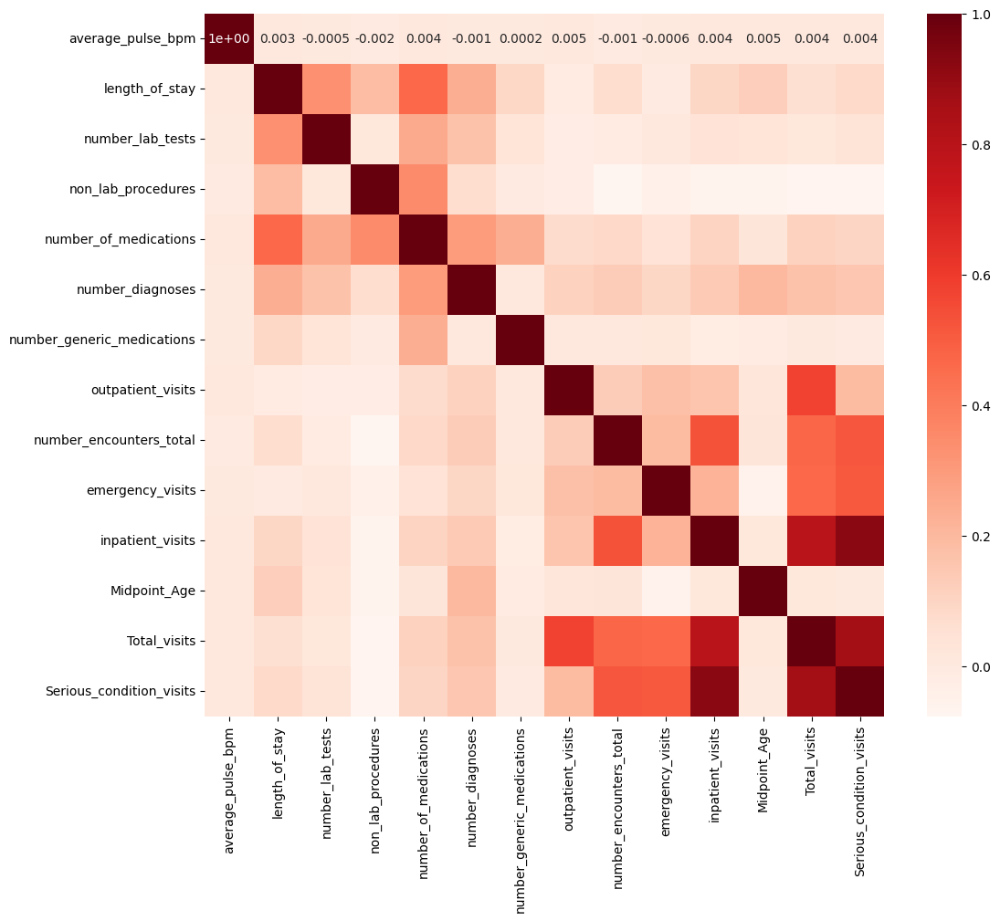

In [9]:
# cor_heatmap(cor_spearman)

We can conclude that:
- We need to use other feature selection techniques to get more insights.
- There are three pairs of variables that are highly correlated:
    - inpatient_visits vs Total_visits (0.80) 
    - inpatient_visits vs Serious_condition_visists (0.92)
    - Total_visits vs Serious_condition_visists (0.87)

### Point Biserial Correlation

In [10]:
# for i in metric_features:
#     correlation, p_value = pointbiserialr(X_binary[i], y_binary['readmitted_binary'].map({'Yes': True, 'No': False}))
#     print(i)
#     print(f'Correlation: {correlation}')
#     print(f'P-Value: {p_value}')
#     print('')

average_pulse_bpm
Correlation: 0.00015244874294701382
P-Value: 0.9675446544944268

length_of_stay
Correlation: 0.041071472402752086
P-Value: 5.541095835568111e-28

number_lab_tests
Correlation: 0.018789446962013706
P-Value: 5.295854100066659e-07

non_lab_procedures
Correlation: -0.014872653389925562
P-Value: 7.197165755793393e-05

number_of_medications
Correlation: 0.03744604352242986
P-Value: 1.559663337440077e-23

number_diagnoses
Correlation: 0.051739054047743906
P-Value: 1.979475253998669e-43

number_generic_medications
Correlation: 0.0021529357106976413
P-Value: 0.5655546160225472

outpatient_visits
Correlation: 0.018379638304906153
P-Value: 9.30154610443625e-07

number_encounters_total
Correlation: 0.22543717499527444
P-Value: 0.0

emergency_visits
Correlation: 0.05931370511526261
P-Value: 1.533303697305575e-56

inpatient_visits
Correlation: 0.166710282305087
P-Value: 0.0

Midpoint_Age
Correlation: 0.020133686380472225
P-Value: 7.694649357725967e-08

Total_visits
Correlation: 0.1

More than 0.01 Corr: 
- length_of_stay
- number_lab_tests 
- non_lab_procedures 
- number_of_medications 
- number_diagnoses 
- outpatient_visits 
- emergency_visits 
- inpatient_visits
- Midpoint_Age
- Total_visits
- Serious_condition_visits
- number_encounters_total

So by this method, it suggests to not use: 
- average_pulse_bpm
- number_generic_medications

### Chi-square

In [52]:
y_binary = y_binary[y_binary.columns[0]].map({'Yes': 1, 'No': 0})
y_binary

encounter_id
533253    0
426224    0
634063    0
890610    0
654194    0
         ..
660160    0
826429    0
332030    1
757560    0
459757    0
Name: readmitted_binary, Length: 71236, dtype: int64

In [12]:
# def chi_square_test(X, y, alpha=0.05):
#     columns = X.columns
#     for column in columns:
#         contingency_table = pd.crosstab(X[column], y)
#         chi2, p, dof, expected = chi2_contingency(contingency_table)
#         if p < alpha:
#             print(f"{column} is important for y")
#         else:
#             print(f"{column} is not important for y. (Discard {column} from model)")

In [13]:
# categorical_columns = ['race','payer_code','admission_type','medical_specialty','discharge_disposition','admission_source',
#                       'primary_diagnosis_types', 'secondary_diagnosis_types','additional_diagnosis_types','glucose_test_result',
#                       'a1c_test_result','race_caucasian','metformin','insulin','Sulfonylureas','Meglitinides',
#                       'Thiazolidinediones','Alpha_Glucosidase_Inhibitors','Combination_Medications','gender_binary',
#                       'presc_diabetes_meds_binary','change_in_meds_binary','Has_Insurance','is_normal_pulse']

In [14]:
# X_binary_categorical = X_binary[categorical_columns]

In [15]:
# X_binary_categorical

,race,payer_code,admission_type,medical_specialty,discharge_disposition,admission_source,primary_diagnosis_types,secondary_diagnosis_types,additional_diagnosis_types,glucose_test_result,...,Sulfonylureas,Meglitinides,Thiazolidinediones,Alpha_Glucosidase_Inhibitors,Combination_Medications,gender_binary,presc_diabetes_meds_binary,change_in_meds_binary,Has_Insurance,is_normal_pulse
encounter_id,,,,,,,,,,,,,,,,,,,,,
533253,51779,28201,50779,5217,51342,40319,10137,5746,5130,67548,...,0,0,0,0,0,0,0,0,0,0
426224,12977,28201,50779,34922,12978,21586,1968,22345,1297,67548,...,0,0,0,0,0,1,1,0,0,0
634063,51779,28201,7246,5217,51342,4913,6667,1358,11927,67548,...,0,0,0,0,0,0,1,1,0,1
890610,12977,22683,50779,12561,51342,4418,6667,2897,21234,67548,...,0,0,0,0,0,1,0,0,1,1
654194,51779,4319,13211,34922,51342,21586,3443,5866,21234,67548,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660160,12977,22683,13211,12561,51342,21586,21288,7647,11927,67548,...,1,0,0,0,0,0,1,1,1,1
826429,12977,28201,50779,34922,3269,21586,2424,1765,4550,67548,...,1,0,0,0,0,0,1,1,0,0
332030,51779,28201,7246,34922,3269,4913,21288,7647,6368,1882,...,1,0,0,0,0,0,1,1,0,0


In [16]:
# chi_square_test(X_binary_categorical, y_binary)

race is important for y
payer_code is important for y
admission_type is important for y
medical_specialty is important for y
discharge_disposition is important for y
admission_source is important for y
primary_diagnosis_types is important for y
secondary_diagnosis_types is important for y
additional_diagnosis_types is important for y
glucose_test_result is important for y
a1c_test_result is important for y
race_caucasian is important for y
metformin is important for y
insulin is important for y
Sulfonylureas is not important for y. (Discard Sulfonylureas from model)
Meglitinides is important for y
Thiazolidinediones is not important for y. (Discard Thiazolidinediones from model)
Alpha_Glucosidase_Inhibitors is not important for y. (Discard Alpha_Glucosidase_Inhibitors from model)
Combination_Medications is not important for y. (Discard Combination_Medications from model)
gender_binary is not important for y. (Discard gender_binary from model)
presc_diabetes_meds_binary is important for

Based on Chi-square we should discard these variables from the model:
- Sulfonylureas 
- Thiazolidinediones 
- Alpha_Glucosidase_Inhibitors 
- Combination_Medications
- gender_binary 
- is_normal_pulse 

a1c test is better for predicting if a patient has diabetes (glucose is instantenous and a1c is about the last 120 days)

### Mutual Information 

In [17]:
# def select_features_by_mutual_info(X, y):
#     mi = mutual_info_classif(X, y)
    
#     mi_series = pd.Series(mi)
#     mi_series.index = X.columns
#     mi_series.sort_values(ascending=False, inplace=True)
    
#     return mi_series

In [18]:
# select_features_by_mutual_info(X_binary, y_binary)

number_encounters_total         0.033171
discharge_disposition           0.015893
glucose_test_result             0.013771
inpatient_visits                0.013177
presc_diabetes_meds_binary      0.012192
Serious_condition_visits        0.011628
Has_Insurance                   0.011468
race_caucasian                  0.011102
insulin                         0.009727
number_diagnoses                0.008853
race                            0.008746
a1c_test_result                 0.008725
Total_visits                    0.008211
admission_type                  0.007809
payer_code                      0.007796
change_in_meds_binary           0.007403
gender_binary                   0.007296
is_normal_pulse                 0.006461
admission_source                0.005972
medical_specialty               0.005885
number_generic_medications      0.004798
additional_diagnosis_types      0.004432
emergency_visits                0.004373
Midpoint_Age                    0.004059
secondary_diagno

### ANova Test

In [19]:
# def select_features_by_anova(X, y, alpha=0.05):
#     numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
    
#     for col in numerical_cols:
#         categories = X[col].unique()
#         samples = [y[X[col]==category] for category in categories]
#         f_val, p_val = f_oneway(*samples)
        
#         if p_val < alpha:
#             print(f"{col} is important for y")
#         else:
#             print(f"{col} is not important for y. (Discard {col} from model)")

In [20]:
# select_features_by_anova(X_binary, y_binary)

race is important for y
payer_code is important for y
admission_type is important for y
medical_specialty is important for y
discharge_disposition is important for y
admission_source is important for y
primary_diagnosis_types is important for y
secondary_diagnosis_types is important for y
additional_diagnosis_types is important for y
glucose_test_result is important for y
a1c_test_result is important for y
outpatient_visits is important for y
emergency_visits is important for y
inpatient_visits is important for y
average_pulse_bpm is not important for y. (Discard average_pulse_bpm from model)
length_of_stay is important for y
number_lab_tests is important for y
non_lab_procedures is important for y
number_of_medications is important for y
number_diagnoses is important for y
race_caucasian is important for y
number_generic_medications is important for y
insulin is important for y
metformin is important for y
Sulfonylureas is not important for y. (Discard Sulfonylureas from model)
Meglit

### Recursive Feature Selection

In [22]:
# X_binary_metric = X_binary[metric_features]

In [23]:
# X_binary_metric.shape

(71236, 14)

In [24]:
# X_binary_non_metric = X_binary.drop(metric_features, axis=1)
# X_binary_non_metric.head()

,race,payer_code,admission_type,medical_specialty,discharge_disposition,admission_source,primary_diagnosis_types,secondary_diagnosis_types,additional_diagnosis_types,glucose_test_result,...,Sulfonylureas,Meglitinides,Thiazolidinediones,Alpha_Glucosidase_Inhibitors,Combination_Medications,gender_binary,presc_diabetes_meds_binary,change_in_meds_binary,Has_Insurance,is_normal_pulse
encounter_id,,,,,,,,,,,,,,,,,,,,,
533253,51779,28201,50779,5217,51342,40319,10137,5746,5130,67548,...,0,0,0,0,0,0,0,0,0,0
426224,12977,28201,50779,34922,12978,21586,1968,22345,1297,67548,...,0,0,0,0,0,1,1,0,0,0
634063,51779,28201,7246,5217,51342,4913,6667,1358,11927,67548,...,0,0,0,0,0,0,1,1,0,1
890610,12977,22683,50779,12561,51342,4418,6667,2897,21234,67548,...,0,0,0,0,0,1,0,0,1,1
654194,51779,4319,13211,34922,51342,21586,3443,5866,21234,67548,...,0,0,0,0,0,0,0,0,1,0


In [25]:
# X_binary_non_metric.shape

(71236, 24)

In [26]:
# X_binary_metric_sqrt = np.sqrt(X_binary_metric) 

In [27]:
# X_binary_sqrt_concat = pd.concat([X_binary_metric_sqrt, X_binary_non_metric], axis=1)
# X_binary_concat = pd.concat([X_binary_metric, X_binary_non_metric], axis=1)
# X_binary_sqrt_concat = pd.concat([X_binary_metric_sqrt, X_binary_non_metric], axis=1)
# X_binary_concat = pd.concat([X_binary_metric, X_binary_non_metric], axis=1)

In [28]:
# min_max_before = MinMaxScaler()
# X_binary_before_sqrt = min_max_before.fit_transform(X_binary_sqrt_concat)
# X_binary_before = min_max_before.fit_transform(X_binary_concat)

In [29]:
# stand_before = StandardScaler()
# X_binary_before_sqrt_stand = stand_before.fit_transform(X_binary_sqrt_concat)
# X_binary_before_stand = stand_before.fit_transform(X_binary_concat)

### Random Forest

In [30]:
# X_binary_sqrt_concat.columns

Index(['average_pulse_bpm', 'length_of_stay', 'number_lab_tests',
       'non_lab_procedures', 'number_of_medications', 'number_diagnoses',
       'number_generic_medications', 'outpatient_visits',
       'number_encounters_total', 'emergency_visits', 'inpatient_visits',
       'Midpoint_Age', 'Total_visits', 'Serious_condition_visits', 'race',
       'payer_code', 'admission_type', 'medical_specialty',
       'discharge_disposition', 'admission_source', 'primary_diagnosis_types',
       'secondary_diagnosis_types', 'additional_diagnosis_types',
       'glucose_test_result', 'a1c_test_result', 'race_caucasian', 'insulin',
       'metformin', 'Sulfonylureas', 'Meglitinides', 'Thiazolidinediones',
       'Alpha_Glucosidase_Inhibitors', 'Combination_Medications',
       'gender_binary', 'presc_diabetes_meds_binary', 'change_in_meds_binary',
       'Has_Insurance', 'is_normal_pulse'],
      dtype='object')

Ranking of the features:  [23  7 11 20  8  6 14 16  1  9  1  5  4  2 18 10 28 19  3 26 15 13 17 33
 29 25 22 21 31 37 30 34 35 32 24 27 12 36]
Optimal number of features: 2
Selected features: number_encounters_total, inpatient_visits


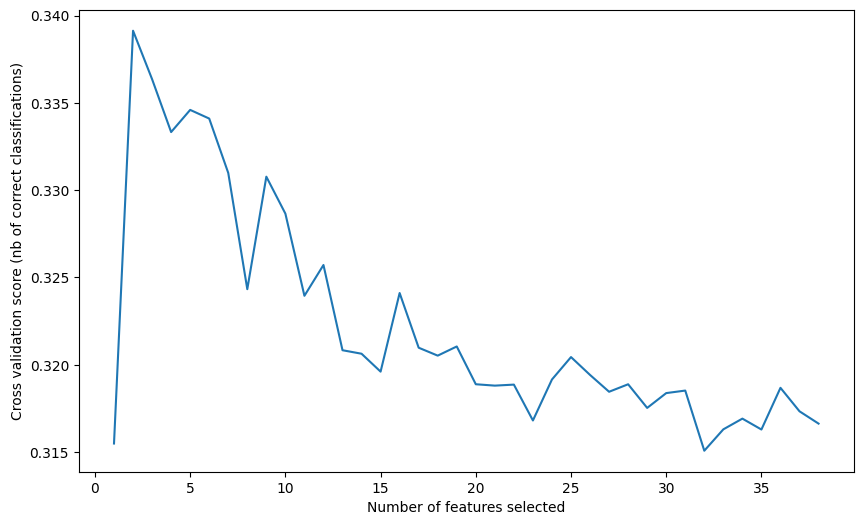

In [22]:
# rf = RandomForestClassifier(class_weight='balanced',n_estimators=50,max_depth=5,random_state=19,n_jobs=-1)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_sqrt_stand, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_sqrt_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

### Decision Trees

Ranking of the features:  [ 9 17  6 15  8  5 10 14  1 19  1  7 12  4 29  3 33 35  2 16 13 11 18 20
 21 22 23 24 25 26 27 28 30 31 32 34 36 37]
Optimal number of features: 2
Selected features: number_encounters_total, inpatient_visits


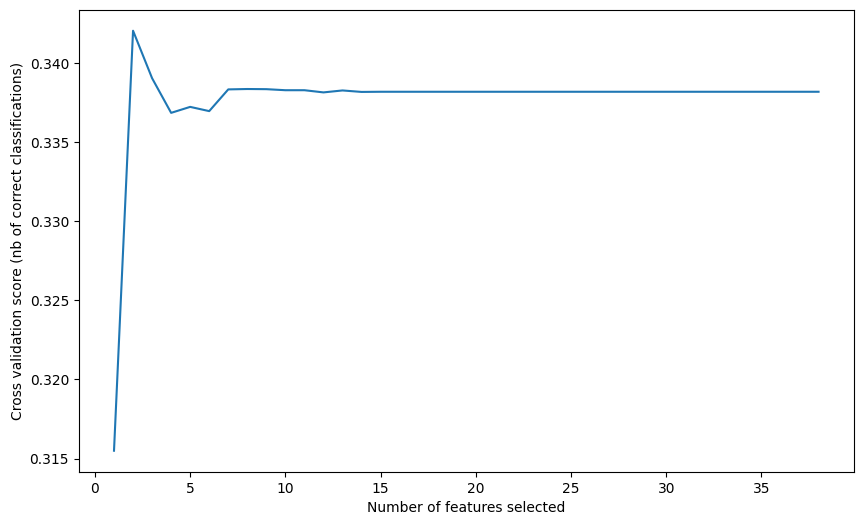

In [77]:
# dt = DecisionTreeClassifier(class_weight='balanced',max_depth=5,random_state=19) 

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=dt, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_sqrt_stand, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_sqrt_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

### Logistic Regression

Ranking of the features:  [31 17 10 21  1  1  9  1  1  6  1  3  5  2 11 18 30 19  1 22 24 23 26 32
 20 12 16 29 15 13 14  4 28 27  8 25  7 33]
Optimal number of features: 6
Selected features: number_of_medications, number_diagnoses, outpatient_visits, number_encounters_total, inpatient_visits, discharge_disposition


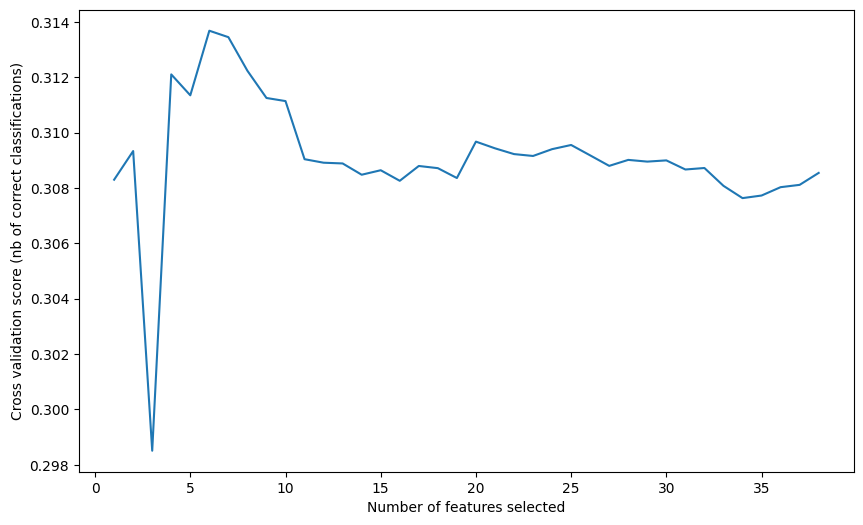

In [68]:
# lr = LogisticRegression(class_weight = 'balanced', solver = 'lbfgs', random_state=19, n_jobs=-1, max_iter=500)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=lr, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

Ranking of the features:  [30  8  4 26  1  1  6  1  1 19 13  1  1 23 32 14 29 15  1 16 21 18 22 20
 17 12 11 28 10  7  9  2 27 24  5 25  3 31]
Optimal number of features: 7
Selected features: number_of_medications, number_diagnoses, outpatient_visits, number_encounters_total, Midpoint_Age, Total_visits, discharge_disposition


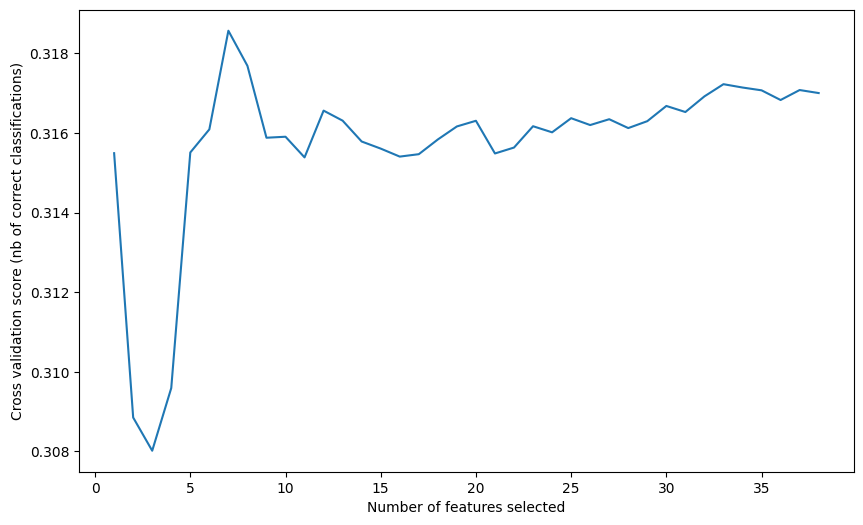

In [69]:
# lr = LogisticRegression(class_weight = 'balanced', solver = 'lbfgs', random_state=19, n_jobs=-1, max_iter=500)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=lr, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_sqrt, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_sqrt_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

Ranking of the features:  [35 10 15 25 24  3 11 23  1 31  4  8 29 13  6 12 36 14  1 21 27 22 30 34
 19  7  9 32 16 18 17 26 33 28  5 20  2 37]
Optimal number of features: 2
Selected features: number_encounters_total, discharge_disposition


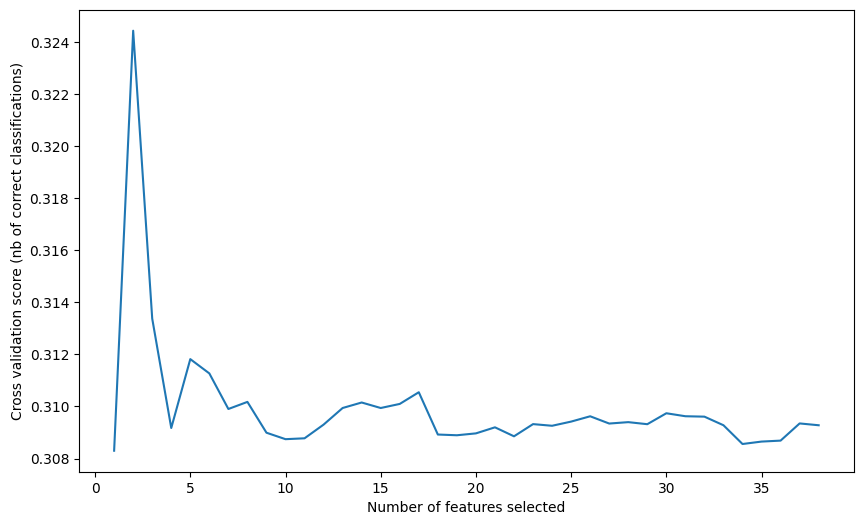

In [70]:
# lr = LogisticRegression(class_weight = 'balanced', solver = 'lbfgs', random_state=19, n_jobs=-1, max_iter=500)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=lr, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_stand, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

Ranking of the features:  [33  7 12 30 24  3  8  9  1 31 20  5  6 13 37 15 32 14  1 18 27 22 26 29
 21 10 11 35 16 19 17 23 36 25  4 28  2 34]
Optimal number of features: 2
Selected features: number_encounters_total, discharge_disposition


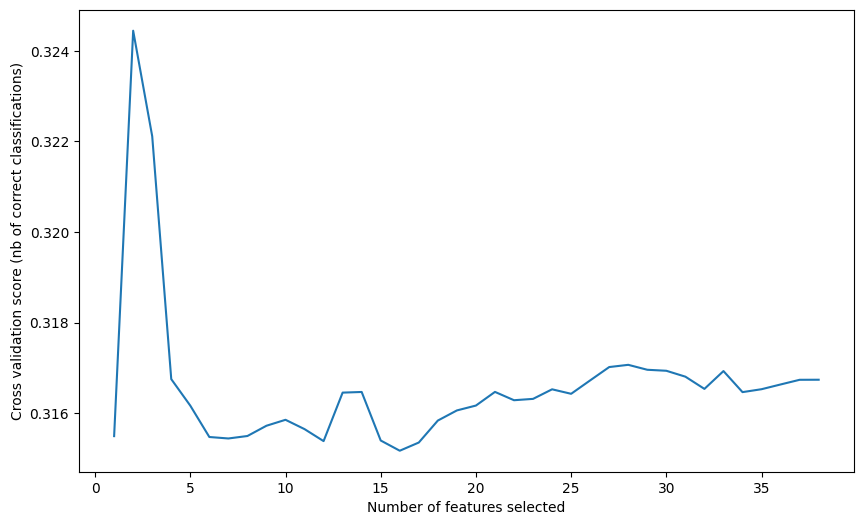

In [25]:
# lr = LogisticRegression(class_weight = 'balanced', solver = 'lbfgs', random_state=19, n_jobs=-1, max_iter=500)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=lr, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_sqrt_stand, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_sqrt_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

### SVC

Ranking of the features:  [21  7 36 31 26 14  8  5  1 11 10 16  6  4 30 27 37 13  1 34 33 32 35 22
 17 19 28 20 18 29 24  2 23 25  3 15  9 12]
Optimal number of features: 2
Selected features: number_encounters_total, discharge_disposition


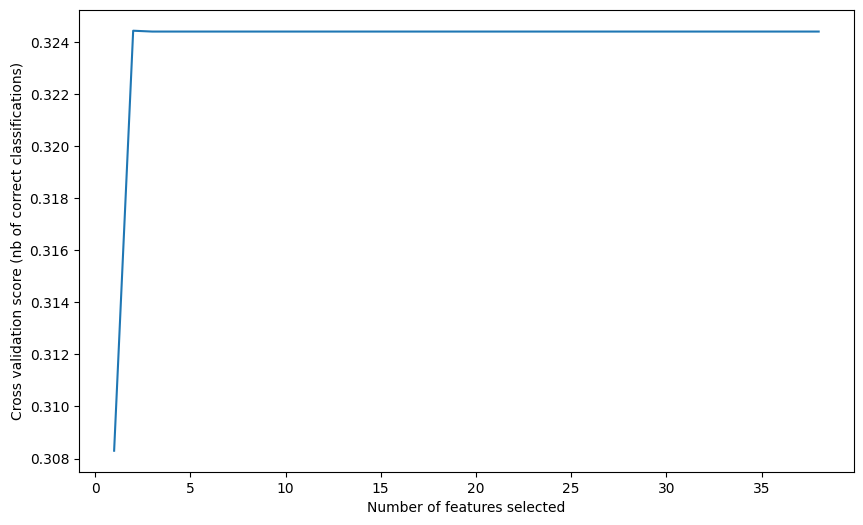

In [55]:
# svc = SVC(C=0.5,gamma='auto',kernel='linear',class_weight = 'balanced',random_state=19)

# cv = StratifiedKFold(5)

# rfecv = RFECV(estimator=svc, step=1, cv=cv, scoring='f1', n_jobs=-1)

# rfecv.fit(X_binary_before_sqrt_stand, y_binary)

# print('Ranking of the features: ', rfecv.ranking_)

# print('Optimal number of features: {}'.format(rfecv.n_features_))

# selected_features = X_binary_sqrt_concat.columns[rfecv.support_]
# print('Selected features: {}'.format(', '.join(selected_features)))

# plt.figure(figsize=(10, 6))
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
# plt.show()

### Sequential Feature Selection

#### With Logistic Regression

In [26]:
# sfs = SequentialFeatureSelector(lr, k_features='best', scoring='f1', n_jobs=-1)
# sfs.fit(X_binary_before_sqrt_stand, y_binary)
# features = list(sfs.k_feature_names_)
# print(sfs.k_score_)
# print('Number of Selected features:', str(len(features)))

0.3255521072014376
Number of Selected features: 15


In [28]:
# features_indexes = [int(i) for i in features]  
# features_names = X_binary_sqrt_concat.columns[features_indexes]
# filtered_train = X_binary_sqrt_concat[features_names]
# filtered_train.columns

Index(['average_pulse_bpm', 'outpatient_visits', 'number_encounters_total',
       'Serious_condition_visits', 'admission_type', 'discharge_disposition',
       'admission_source', 'additional_diagnosis_types', 'glucose_test_result',
       'a1c_test_result', 'metformin', 'Meglitinides',
       'Alpha_Glucosidase_Inhibitors', 'Combination_Medications',
       'gender_binary'],
      dtype='object')

#### With Random Forest

In [29]:
# sfs = SequentialFeatureSelector(rf, k_features='best', scoring='f1', n_jobs=-1)
# sfs.fit(X_binary_before_sqrt_stand, y_binary)
# features = list(sfs.k_feature_names_)
# print(sfs.k_score_)
# print('Number of Selected features:', str(len(features)))

0.340068193836475
Number of Selected features: 3


In [30]:
# features_indexes = [int(i) for i in features]  
# features_names = X_binary_sqrt_concat.columns[features_indexes]
# filtered_train = X_binary_sqrt_concat[features_names]
# filtered_train.columns

Index(['number_encounters_total', 'inpatient_visits', 'race_caucasian'], dtype='object')

### Feature Importance with Random Forest Classifier

In [31]:
# X_binary.shape

(71236, 38)

In [32]:
# model = RandomForestClassifier(max_depth=5, class_weight='balanced', random_state=19)
# model.fit(X_binary_before_sqrt_stand, y_binary)

RandomForestClassifier(class_weight='balanced', max_depth=5, random_state=19)

In [34]:
# intermediate_dictionary = {'Column name':X_binary_sqrt_concat.columns, 'Feature Importance':model.feature_importances_}

# feature_importance_df = pd.DataFrame(intermediate_dictionary)
# feature_importance_df.sort_values('Feature Importance', ascending=False, inplace=True)

In [35]:
# feature_importance_df

,Column name,Feature Importance
8,number_encounters_total,0.475530
13,Serious_condition_visits,0.123401
10,inpatient_visits,0.113252
12,Total_visits,0.098837
18,discharge_disposition,0.057920
5,number_diagnoses,0.018597
4,number_of_medications,0.013691
1,length_of_stay,0.011843
11,Midpoint_Age,0.011223
9,emergency_visits,0.010915


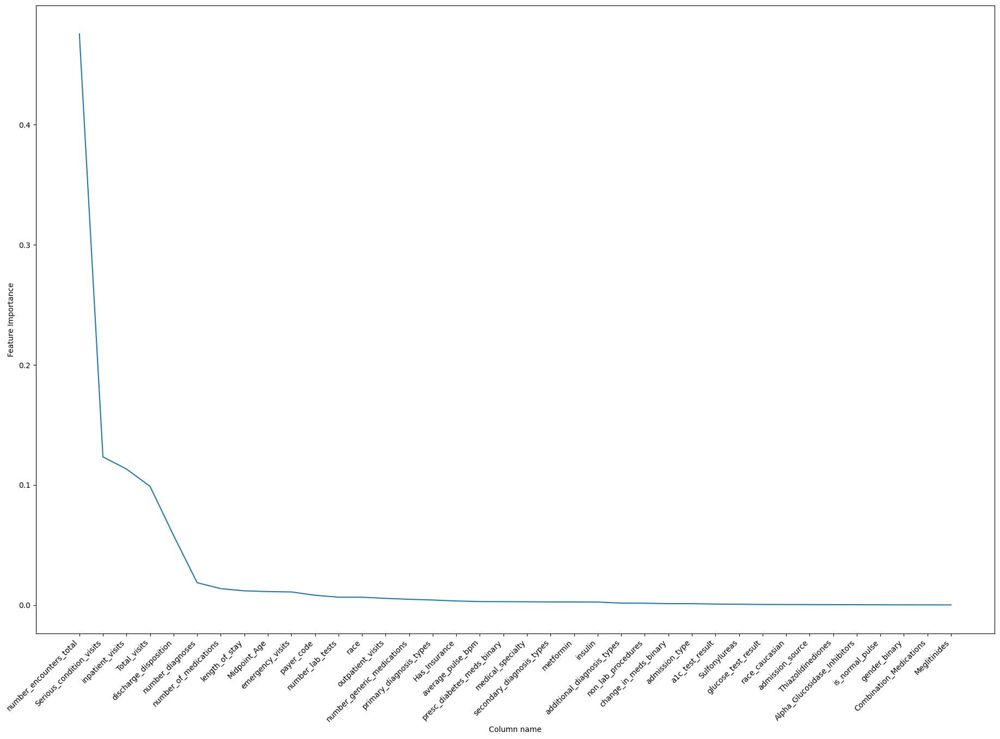

In [36]:
# fig = plt.figure(figsize=(50, 15))
# plt.subplot(122)
# sns.lineplot(feature_importance_df, x='Column name', y="Feature Importance")
# plt.xticks(rotation=45, ha="right")
# plt.show()

In [37]:
# feature_importance_df.to_csv('feature_importance_random_forest_4.csv')

#### With Entropy

In [198]:
# model = RandomForestClassifier(criterion='entropy', max_depth=5, class_weight='balanced', random_state=19)
# model.fit(X_binary_before_sqrt_stand, y_binary)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, random_state=19)

In [199]:
# intermediate_dictionary = {'Column name':X_binary_sqrt_concat.columns, 'Feature Importance':model.feature_importances_}

# feature_importance_df = pd.DataFrame(intermediate_dictionary)
# feature_importance_df.sort_values('Feature Importance', ascending=False, inplace=True)

In [200]:
# feature_importance_df

,Column name,Feature Importance
8,number_encounters_total,0.478637
10,inpatient_visits,0.119395
13,Serious_condition_visits,0.117395
12,Total_visits,0.093288
18,discharge_disposition,0.057915
5,number_diagnoses,0.018075
4,number_of_medications,0.013629
11,Midpoint_Age,0.012790
1,length_of_stay,0.011603
9,emergency_visits,0.010854


Conclusion: The results are more less the same as feature_importance with gini index

### Lasso Regression (Embedded Methods)

In [38]:
# X_binary_before_sqrt_stand.shape

(71236, 38)

In [196]:
# def plot_importance(coef,name):
#     imp_coef = coef.sort_values()
#     plt.figure(figsize=(8,10))
#     imp_coef.plot(kind = "barh")
#     plt.title("Feature importance using " + name + " Model")
#     plt.show()

In [40]:
# reg = LassoCV()
# reg.fit(X_binary_before_sqrt_stand, y_binary)

LassoCV()

In [41]:
# coef = pd.Series(reg.coef_, index = X_binary_sqrt_concat.columns)

In [42]:
# print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 32 variables and eliminated the other 6 variables


In [43]:
# coef.sort_values(ascending=False)

number_encounters_total         0.076236
presc_diabetes_meds_binary      0.006454
Midpoint_Age                    0.004117
medical_specialty               0.003492
race_caucasian                  0.003477
number_diagnoses                0.003205
insulin                         0.002658
number_lab_tests                0.002617
emergency_visits                0.002518
Total_visits                    0.002327
length_of_stay                  0.002315
a1c_test_result                 0.001789
payer_code                      0.001694
number_of_medications           0.001313
glucose_test_result             0.001212
inpatient_visits                0.000870
gender_binary                   0.000751
Meglitinides                    0.000748
non_lab_procedures              0.000687
primary_diagnosis_types         0.000462
change_in_meds_binary           0.000089
Thiazolidinediones             -0.000000
average_pulse_bpm              -0.000000
is_normal_pulse                 0.000000
admission_type  

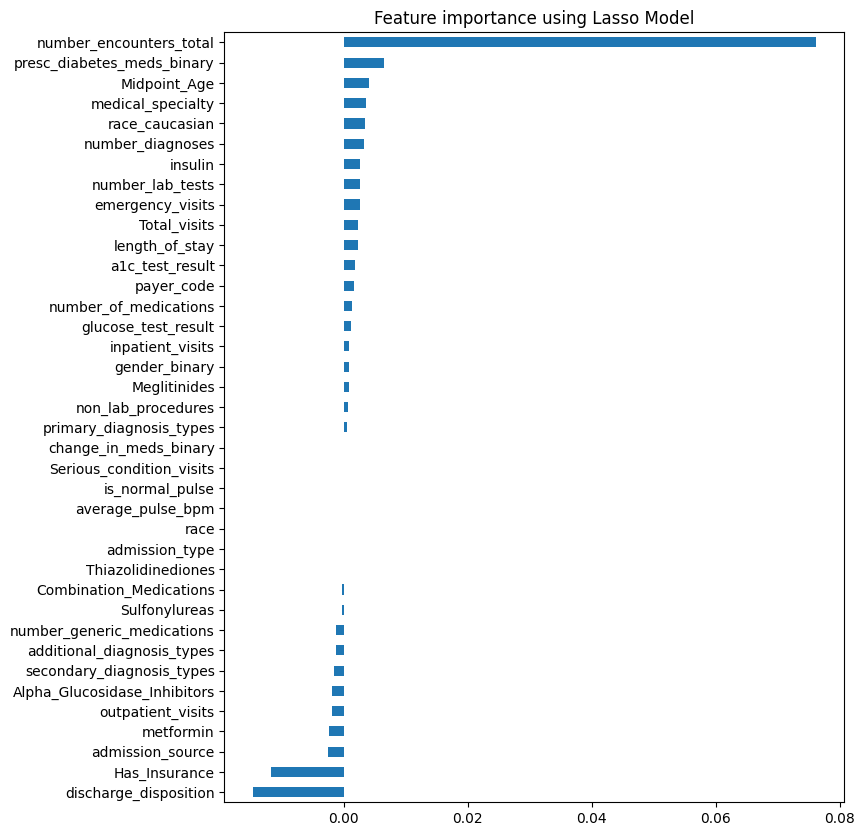

In [44]:
# plot_importance(coef,'Lasso')

Based on the results of Lasso Regression: 
- It removed change_in_meds_binary, Serious_condition_visits, admission_type, race, Thiazolidinediones, is_normal_pulse and average_pulse_bpm
- Other variables like Sulfonylureas, Combination_Medications, Meglitinides, gender_binary, non_lab_procedures, primary_diagnosis_types and inpatient_visits have a coef < 0.001        

### Ridge Regression (Embedded Methods)

In [192]:
# ridge = RidgeCV()
# ridge.fit(X_binary_before_sqrt_stand, y_binary)
# coef = pd.Series(ridge.coef_, index = X_binary_sqrt_concat.columns)

In [193]:
# print("Ridge picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Ridge picked 38 variables and eliminated the other 0 variables


In [194]:
# coef.sort_values(ascending=False)

number_encounters_total         0.076449
presc_diabetes_meds_binary      0.015944
Total_visits                    0.013037
race_caucasian                  0.011259
inpatient_visits                0.008571
insulin                         0.006567
emergency_visits                0.006424
Midpoint_Age                    0.004655
medical_specialty               0.003773
number_diagnoses                0.003220
Thiazolidinediones              0.003126
Sulfonylureas                   0.002897
number_lab_tests                0.002805
length_of_stay                  0.002402
Meglitinides                    0.002312
a1c_test_result                 0.002082
change_in_meds_binary           0.001908
glucose_test_result             0.001747
payer_code                      0.001682
number_of_medications           0.001332
metformin                       0.001121
gender_binary                   0.001003
primary_diagnosis_types         0.000886
non_lab_procedures              0.000812
is_normal_pulse 

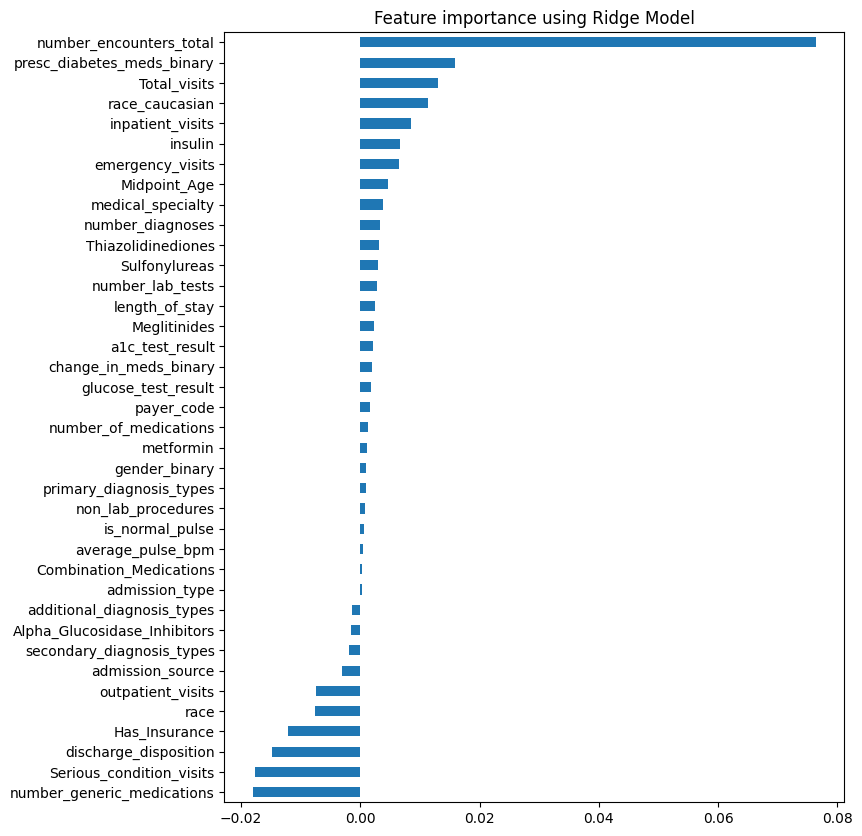

In [197]:
# plot_importance(coef, "Ridge")

### Analysis of Variance for Categorical Variables, or ANOVA-C

In [102]:
# non_metric_X_train.columns

Index(['race', 'payer_code', 'admission_type', 'medical_specialty',
       'discharge_disposition', 'admission_source', 'primary_diagnosis_types',
       'secondary_diagnosis_types', 'additional_diagnosis_types',
       'glucose_test_result', 'a1c_test_result', 'race_caucasian', 'insulin',
       'metformin', 'Sulfonylureas', 'Meglitinides', 'Thiazolidinediones',
       'Alpha_Glucosidase_Inhibitors', 'Combination_Medications',
       'gender_binary', 'presc_diabetes_meds_binary', 'change_in_meds_binary',
       'Has_Insurance', 'is_normal_pulse'],
      dtype='object')

In [31]:
# selector = SelectKBest(score_func=chi2, k=15)  # select 15 features

# selector.fit(non_metric_X_train, y_train_binary_2)

# selected_features = non_metric_X_train.columns[selector.get_support()]
# selected_features

In [ ]:
# selector2 = SelectKBest(score_func=f_classif, k=9)  # select 9 numerical features

# selector2.fit(X_binary_metric_sqrt_2, y_binary)

# selected_features2 = X_binary_metric_sqrt_2.columns[selector2.get_support()]
# selected_features2

In [46]:
# selector3 = SelectKBest(score_func=mutual_info_classif, k=20)  # select 20 features

# selector3.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features3 = X_binary_sqrt_concat.columns[selector3.get_support()]
# selected_features3

Index(['number_encounters_total', 'emergency_visits', 'inpatient_visits',
       'Midpoint_Age', 'Total_visits', 'Serious_condition_visits', 'race',
       'medical_specialty', 'discharge_disposition', 'admission_source',
       'glucose_test_result', 'race_caucasian', 'insulin', 'metformin',
       'Sulfonylureas', 'gender_binary', 'presc_diabetes_meds_binary',
       'change_in_meds_binary', 'Has_Insurance', 'is_normal_pulse'],
      dtype='object')

In [47]:
# selector4 = SelectKBest(score_func=mutual_info_classif, k=15)  # select 15 features

# selector4.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features4 = X_binary_sqrt_concat.columns[selector4.get_support()]
# selected_features4

Index(['number_encounters_total', 'emergency_visits', 'inpatient_visits',
       'Total_visits', 'Serious_condition_visits', 'race', 'admission_type',
       'discharge_disposition', 'race_caucasian', 'insulin', 'gender_binary',
       'presc_diabetes_meds_binary', 'change_in_meds_binary', 'Has_Insurance',
       'is_normal_pulse'],
      dtype='object')

In [48]:
# selector5 = SelectKBest(score_func=mutual_info_classif, k=12)  # select 12 features

# selector5.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features5 = X_binary_sqrt_concat.columns[selector5.get_support()]
# selected_features5

Index(['outpatient_visits', 'number_encounters_total', 'inpatient_visits',
       'Total_visits', 'Serious_condition_visits', 'admission_type',
       'discharge_disposition', 'race_caucasian', 'insulin', 'Sulfonylureas',
       'gender_binary', 'is_normal_pulse'],
      dtype='object')

In [49]:
# selector6 = SelectKBest(score_func=mutual_info_classif, k=10)  # select 10 features

# selector6.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features6 = X_binary_sqrt_concat.columns[selector6.get_support()]
# selected_features6

Index(['number_encounters_total', 'inpatient_visits', 'Total_visits',
       'Serious_condition_visits', 'discharge_disposition', 'insulin',
       'gender_binary', 'presc_diabetes_meds_binary', 'change_in_meds_binary',
       'Has_Insurance'],
      dtype='object')

In [50]:
# selector6 = SelectKBest(score_func=mutual_info_classif, k=8)  # select 8 features

# selector6.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features6 = X_binary_sqrt_concat.columns[selector6.get_support()]
# selected_features6

Index(['number_encounters_total', 'emergency_visits', 'inpatient_visits',
       'Total_visits', 'Serious_condition_visits', 'discharge_disposition',
       'metformin', 'is_normal_pulse'],
      dtype='object')

In [51]:
# selector6 = SelectKBest(score_func=mutual_info_classif, k=6)  # select 6 features

# selector6.fit(X_binary_before_sqrt_stand, y_binary)

# selected_features6 = X_binary_sqrt_concat.columns[selector6.get_support()]
# selected_features6

Index(['number_encounters_total', 'inpatient_visits', 'Total_visits',
       'Serious_condition_visits', 'discharge_disposition',
       'change_in_meds_binary'],
      dtype='object')

### Phik Correlation Matrix (Correlation between categorical variables)

interval columns not set, guessing: ['race', 'payer_code', 'admission_type', 'medical_specialty', 'discharge_disposition', 'admission_source', 'primary_diagnosis_types', 'secondary_diagnosis_types', 'additional_diagnosis_types', 'glucose_test_result', 'a1c_test_result', 'race_caucasian', 'insulin', 'metformin', 'Sulfonylureas', 'Meglitinides', 'Thiazolidinediones', 'Alpha_Glucosidase_Inhibitors', 'Combination_Medications', 'gender_binary', 'presc_diabetes_meds_binary', 'change_in_meds_binary', 'Has_Insurance', 'is_normal_pulse']


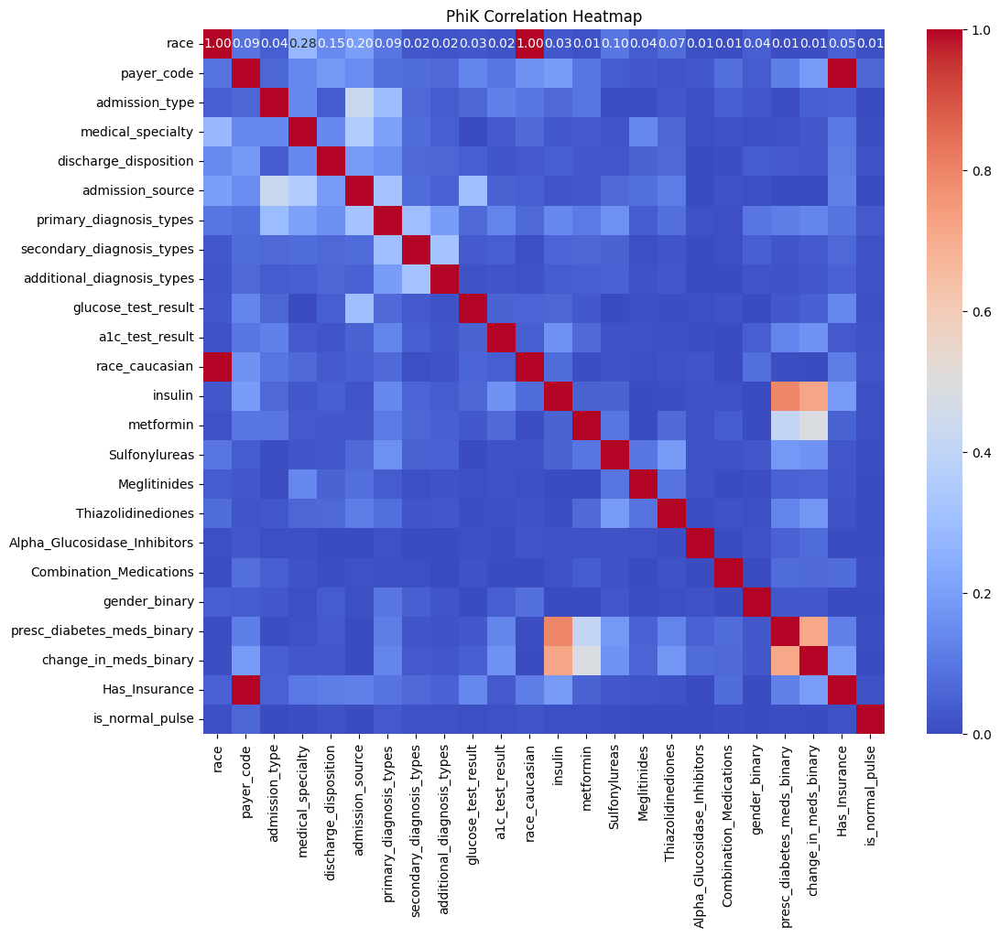

In [52]:
# phik_corr_matrix = X_binary_non_metric.phik_matrix()

# plt.figure(figsize=(12, 10))
# sns.heatmap(phik_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
# plt.title('PhiK Correlation Heatmap')h
# plt.show()

In [53]:
# pd.set_option('display.max_columns', None)
# phik_corr_matrix[phik_corr_matrix>0.5]

,race,payer_code,admission_type,medical_specialty,discharge_disposition,admission_source,primary_diagnosis_types,secondary_diagnosis_types,additional_diagnosis_types,glucose_test_result,a1c_test_result,race_caucasian,insulin,metformin,Sulfonylureas,Meglitinides,Thiazolidinediones,Alpha_Glucosidase_Inhibitors,Combination_Medications,gender_binary,presc_diabetes_meds_binary,change_in_meds_binary,Has_Insurance,is_normal_pulse
race,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payer_code,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
admission_type,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
medical_specialty,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
discharge_disposition,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
admission_source,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
primary_diagnosis_types,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
secondary_diagnosis_types,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
additional_diagnosis_types,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
glucose_test_result,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can conclude that:
- We need to use other feature selection techniques to get more insights.
- There are three pairs of variables that are highly correlated:
    - insulin vs presc_diabetes_meds_binary (0.795) 
    - insulin vs change_in_meds_binary (0.72)
    - presc_diabetes_meds_binary vs change_in_meds_binary (0.71)

## Final table with all Feature Selection methods together

<hr>

### Numerical Data

| Predictor | Spearman | RFE LR| RFE RF | SFS LR | SFS RF | Lasso | Ridge | Mutual Info | ANova | PB | What to do? (One possible way to "solve") | 
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| Outpatient_visits | Keep | Discard | Discard | Keep | Discard | Keep | Keep? | Keep? | Keep | Keep | Discard |
| Emergency_visits | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Try with and without |
| Inpatient_visits | Keep? | Discard | Keep | Discard | Keep | Keep? | Keep | Keep | Keep | Keep | Include in the model |
| Average_pulse_bpm | Keep | Discard | Discard | Keep | Discard | Discard | Keep? | Keep? | Discard | Discard | Discard |
| Length_of_stay | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Try with and without |
| Number_lab_tests | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Try with and without |
| Non_lab_procedures | Keep | Discard | Discard | Discard | Discard | Keep? | Keep? | Keep? | Keep | Keep | Discard |
| Number_of_medications | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Try with and without |
| Number_diagnoses | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Try with and without |
| Number_generic_medications | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Discard | Discard |
| Midpoint_Age | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Discard | Keep | Try with and without |
| Total_visits | Keep? | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Keep | Discard |
| Serious_condition_visits | Keep? | Discard | Discard | Keep | Discard | Discard | Keep | Keep | Keep | Keep | Discard |
| Number_encounters_total | Keep | Keep | Keep | Keep | Keep | Keep | Keep | Keep | Keep | Keep | Include in the model |

<hr>


### Categorical Data

| Predictor | Chi-Square | Phik | RFE LR| RFE RF | SFS LR | SFS RF | Lasso | Ridge | Mutual Info | What to do? (One possible way to "solve") |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| Race | Keep | Keep? | Discard | Discard | Discard | Discard | Discard | Keep | Keep | Discard |
| Payer_code | Keep | Keep? | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Discard |
| Admission_type | Keep | Keep | Discard | Discard | Discard | Keep | Discard | Keep? | Keep | Try with and without |
| Medical_specialty | Keep | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Try with and without |
| Discharge_disposition | Keep | Keep | Keep | Discard | Discard | Keep | Keep | Keep | Keep | Include in the model |
| Admission_source | Keep | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Include in the model |
| Primary_diagnosis_types | Keep | Keep | Discard | Discard | Discard | Discard | Keep? | Keep? | Keep | Try with and without |
| Secondary_diagnosis_types | Keep | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Try with and without |
| Additional_diagnosis_types | Keep | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Try with and without |
| Glucose_test_result | Keep | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Try with and without |
| A1c_test_result | Keep | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Keep | Try with and without |
| Race_caucasian | Keep | Keep? | Discard | Discard | Keep | Discard | Keep | Keep | Keep | Include in the model |
| Insulin | Keep | Keep? | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Try with and without |
| Metformin | Keep | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Keep? | Try with and without |
| Sulfonylureas | Discard | Keep | Discard | Discard | Discard | Discard | Keep? | Keep | Keep | Discard |
| Meglitinides | Keep | Keep | Discard | Discard | Discard | Keep | Keep? | Keep | Discard | Discard |
| Thiazolidinediones | Discard | Keep | Discard | Discard | Discard | Discard | Discard | Keep | Discard | Discard |
| Alpha_Glucosidase_Inhibitors | Discard | Keep | Discard | Discard | Discard | Keep | Keep | Keep | Discard | Discard |
| Combination_Medications | Discard | Keep | Discard | Discard | Discard | Keep | Keep? | Keep? | Discard | Discard |
| Gender_binary | Discard | Keep | Discard | Discard | Discard | Keep | Keep? | Keep | Keep | Discard |
| Presc_diabetes_meds_binary | Keep? | Keep | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Include in the model |
| Change_in_meds_binary | Keep? | Keep | Discard | Discard | Discard | Discard | Keep? | Keep | Keep | Discard |
| Has_Insurance | Keep | Keep? | Discard | Discard | Discard | Discard | Keep | Keep | Keep | Include in the model |
| Is_normal_pulse | Discard | Keep |Discard | Discard | Discard | Discard | Discard | Keep? | Keep | Discard |



<hr>

## Final result (Features choosen)

In [53]:
X_binary.columns

Index(['race', 'payer_code', 'admission_type', 'medical_specialty',
       'discharge_disposition', 'admission_source', 'primary_diagnosis_types',
       'secondary_diagnosis_types', 'additional_diagnosis_types',
       'glucose_test_result', 'a1c_test_result', 'outpatient_visits',
       'emergency_visits', 'inpatient_visits', 'average_pulse_bpm',
       'length_of_stay', 'number_lab_tests', 'non_lab_procedures',
       'number_of_medications', 'number_diagnoses', 'race_caucasian',
       'number_generic_medications', 'insulin', 'metformin', 'Sulfonylureas',
       'Meglitinides', 'Thiazolidinediones', 'Alpha_Glucosidase_Inhibitors',
       'Combination_Medications', 'Midpoint_Age', 'gender_binary',
       'presc_diabetes_meds_binary', 'change_in_meds_binary', 'Has_Insurance',
       'is_normal_pulse', 'number_encounters_total', 'Total_visits',
       'Serious_condition_visits'],
      dtype='object')

In [54]:
selected_features=['admission_type','number_encounters_total','inpatient_visits','a1c_test_result','medical_specialty',
                    'primary_diagnosis_types','presc_diabetes_meds_binary','secondary_diagnosis_types',
                    'discharge_disposition','glucose_test_result','race_caucasian','Has_Insurance','metformin']

In [55]:
len(selected_features)

13

# Normalization Methods

In [56]:
X_binary_non_metric_final = X_binary.drop(metric_features, axis=1)
X_binary_metric_sqrt_final = np.sqrt(X_binary[metric_features]) 
X_combined_final = pd.concat([X_binary_non_metric_final, X_binary_metric_sqrt_final], axis=1)
X_combined_final.head()

,race,payer_code,admission_type,medical_specialty,discharge_disposition,admission_source,primary_diagnosis_types,secondary_diagnosis_types,additional_diagnosis_types,glucose_test_result,...,number_of_medications,number_diagnoses,number_generic_medications,outpatient_visits,number_encounters_total,emergency_visits,inpatient_visits,Midpoint_Age,Total_visits,Serious_condition_visits
encounter_id,,,,,,,,,,,,,,,,,,,,,
533253,51779,28201,50779,5217,51342,40319,10137,5746,5130,67548,...,4.472136,2.828427,0.000000,0.0,2.449490,0.0,1.414214,8.660254,1.414214,1.414214
426224,12977,28201,50779,34922,12978,21586,1968,22345,1297,67548,...,5.000000,3.000000,1.000000,0.0,1.000000,0.0,0.000000,7.416198,0.000000,0.000000
634063,51779,28201,7246,5217,51342,4913,6667,1358,11927,67548,...,4.690416,2.449490,1.414214,0.0,1.000000,0.0,1.000000,8.062258,1.000000,1.000000
890610,12977,22683,50779,12561,51342,4418,6667,2897,21234,67548,...,3.000000,2.236068,0.000000,0.0,1.000000,0.0,1.000000,8.062258,1.000000,1.000000
654194,51779,4319,13211,34922,51342,21586,3443,5866,21234,67548,...,3.872983,3.000000,0.000000,1.0,1.414214,0.0,0.000000,8.660254,1.000000,0.000000


In [57]:
test_binary_non_metric_final = test_binary.drop(metric_features, axis=1)
test_binary_metric_sqrt_final = np.sqrt(test_binary[metric_features]) 
test_combined_final = pd.concat([test_binary_non_metric_final, test_binary_metric_sqrt_final], axis=1)
test_combined_final.head()

,encounter_id,race,payer_code,admission_type,medical_specialty,discharge_disposition,admission_source,primary_diagnosis_types,secondary_diagnosis_types,additional_diagnosis_types,...,number_of_medications,number_diagnoses,number_generic_medications,outpatient_visits,number_encounters_total,emergency_visits,inpatient_visits,Midpoint_Age,Total_visits,Serious_condition_visits
0,499502,51779,4319,50779,34922,51342,40319,10137,22345,11927,...,3.741657,2.449490,1.000000,0.0,1.414214,0.0,0.0,9.219544,0.0,0.0
1,447319,51779,4319,50779,34922,51342,40319,6104,1358,1964,...,2.645751,2.645751,0.000000,0.0,1.732051,0.0,1.0,5.000000,1.0,1.0
2,309126,12977,28201,50779,12561,51342,40319,10137,8938,2766,...,3.464102,2.449490,1.000000,0.0,2.000000,0.0,0.0,5.916080,0.0,0.0
3,181183,51779,3292,7246,34922,51342,40319,4881,1723,4550,...,4.000000,3.000000,1.732051,0.0,1.000000,0.0,0.0,7.416198,0.0,0.0
4,359339,51779,28201,50779,12561,51342,40319,3589,22345,21234,...,3.162278,3.000000,1.000000,0.0,1.000000,0.0,0.0,8.062258,0.0,0.0


In [58]:
X_binary_1 = X_combined_final[selected_features]
test_binary_1 = test_combined_final[selected_features]

In [59]:
X_binary_1.shape

(71236, 13)

In [60]:
test_binary_1.shape

(30530, 13)

In [61]:
# Standard Scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_binary_1)
test_scaled = scaler.transform(test_binary_1)

In [133]:
# Min Max Scaler
# min_max_scaler = MinMaxScaler()
# X_minmax = min_max_scaler.fit_transform(X_binary_1)
# test_minmax = min_max_scaler.transform(test_binary_1)

In [ ]:
# Min Max Scaler between -1 and 1
# min_max_scaler_neg1 = MinMaxScaler(feature_range=(-1, 1))
# X_minmax_neg1 = min_max_scaler_neg1_1.fit_transform(X_binary_1)
# test_minmax_neg1 = min_max_scaler_neg1_1.transform(test_binary_1)

In [21]:
# Robust Scaler
# robust_scaler = RobustScaler()
# X_robust = robust_scaler.fit_transform(X_binary_1)
# test_robust = robust_scaler.transform(test_binary_1)

# Testing Imbalanced Learning Methods

In [40]:
# def evaluate_models(imbalance_method, models, X_scaled, y_binary):
#     results = pd.DataFrame(columns=['Model', 'F1 Score', 'Time'])

#     for model_name, model in models:
#         steps = [(imbalance_method.__class__.__name__, imbalance_method), (model_name, model)]
#         pipeline = ImbPipeline(steps=steps)
#         cv = StratifiedKFold()

#         start_time = time.time()

#         scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#         score = np.mean(scores)

#         end_time = time.time()
#         elapsed_time = end_time - start_time

#         print('F1 Score: %.3f' % score)
#         print('Time: %.2f seconds' % elapsed_time)

#         results = pd.concat([results, pd.DataFrame({'Model': [model_name], 'F1 Score': [score], 'Time': [elapsed_time]})], ignore_index=True)

#     return results

In [41]:
# models = [
#     ('gau', GaussianNB()),
#     ('lr', LogisticRegression(random_state=19)),
#     ('dt', DecisionTreeClassifier(random_state=19)),
#     ('knn', KNeighborsClassifier()),
#     ('mlp', MLPClassifier(hidden_layer_sizes=(8,), batch_size=64, random_state=19)),
#     ('svc', SVC(random_state=19)),
#     ('rf', RandomForestClassifier(random_state=19)),
#     ('gbc', GradientBoostingClassifier(subsample=0.5, random_state=19))    
# ]

In [286]:
# Using RandomUnderSampler
# imbalance_method = RandomUnderSampler(random_state=19)
# results_RandomUnderSampler = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.290
Time: 1.37 seconds
F1 Score: 0.317
Time: 0.86 seconds
F1 Score: 0.260
Time: 0.99 seconds
F1 Score: 0.277
Time: 2.13 seconds
F1 Score: 0.325
Time: 3.76 seconds
F1 Score: 0.319
Time: 117.15 seconds
F1 Score: 0.304
Time: 2.02 seconds
F1 Score: 0.334
Time: 0.83 seconds


In [162]:
# results_RandomUnderSampler

,Model,F1 Score,Time
0,gau,0.289585,5.862722
1,lr,0.316720,0.911827
2,dt,0.260142,0.933507
3,knn,0.277332,3.267021
4,mlp,0.325262,7.632707
5,svc,0.318854,138.268221
6,rf,0.304334,2.342054
7,gbc,0.334363,0.998116


In [163]:
# results_RandomUnderSampler.to_csv('results_RandomUnderSampler.csv')

In [164]:
# Using SMOTE
# imbalance_method = SMOTE(random_state=19)
# results_Smote = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.289
Time: 0.66 seconds
F1 Score: 0.318
Time: 0.74 seconds
F1 Score: 0.215
Time: 1.23 seconds
F1 Score: 0.267
Time: 8.97 seconds
F1 Score: 0.333
Time: 79.56 seconds
F1 Score: 0.318
Time: 1491.10 seconds
F1 Score: 0.179
Time: 18.93 seconds
F1 Score: 0.275
Time: 14.24 seconds


In [165]:
# results_Smote

,Model,F1 Score,Time
0,gau,0.288830,0.661631
1,lr,0.317535,0.742213
2,dt,0.214596,1.233080
3,knn,0.266625,8.973515
4,mlp,0.332753,79.564194
5,svc,0.317560,1491.098549
6,rf,0.178595,18.925276
7,gbc,0.275211,14.244989


In [166]:
# results_Smote.to_csv('results_Smote.csv')

In [167]:
# Using RandomOverSampler
# imbalance_method = RandomOverSampler(random_state=19)
# results_RandomOverSampler = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.291
Time: 1.23 seconds
F1 Score: 0.317
Time: 1.29 seconds
F1 Score: 0.210
Time: 0.51 seconds
F1 Score: 0.262
Time: 7.78 seconds
F1 Score: 0.331
Time: 25.39 seconds
F1 Score: 0.319
Time: 1890.64 seconds
F1 Score: 0.202
Time: 10.87 seconds
F1 Score: 0.340
Time: 8.64 seconds


In [168]:
# results_RandomOverSampler

,Model,F1 Score,Time
0,gau,0.290570,1.230757
1,lr,0.317092,1.290196
2,dt,0.209998,0.514185
3,knn,0.262284,7.776136
4,mlp,0.330773,25.391741
5,svc,0.318795,1890.635220
6,rf,0.201716,10.869380
7,gbc,0.340416,8.642811


In [169]:
# results_RandomOverSampler.to_csv('results_RandomOverSampler.csv')

In [170]:
# Using ADASYN
# imbalance_method = ADASYN(random_state=19)
# results_Adasyn = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.288
Time: 3.62 seconds
F1 Score: 0.317
Time: 3.62 seconds
F1 Score: 0.215
Time: 3.11 seconds
F1 Score: 0.267
Time: 9.37 seconds
F1 Score: 0.333
Time: 74.61 seconds
F1 Score: 0.316
Time: 1507.11 seconds
F1 Score: 0.175
Time: 20.52 seconds
F1 Score: 0.259
Time: 16.21 seconds


In [171]:
# results_Adasyn

,Model,F1 Score,Time
0,gau,0.288264,3.616623
1,lr,0.316997,3.621503
2,dt,0.214936,3.105497
3,knn,0.266654,9.369406
4,mlp,0.332674,74.607517
5,svc,0.315834,1507.114943
6,rf,0.174939,20.517931
7,gbc,0.258552,16.205699


In [172]:
# results_Adasyn.to_csv('results_Adasyn.csv')

In [173]:
# Using NearMiss 1
# imbalance_method = NearMiss(version=1)
# results_nearmiss1 = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.235
Time: 3.80 seconds
F1 Score: 0.235
Time: 3.95 seconds
F1 Score: 0.211
Time: 2.81 seconds
F1 Score: 0.214
Time: 5.19 seconds
F1 Score: 0.229
Time: 9.62 seconds
F1 Score: 0.222
Time: 75.83 seconds
F1 Score: 0.211
Time: 4.27 seconds
F1 Score: 0.234
Time: 3.65 seconds


In [174]:
# results_nearmiss1

,Model,F1 Score,Time
0,gau,0.235307,3.797933
1,lr,0.234827,3.946439
2,dt,0.211029,2.811000
3,knn,0.213843,5.188552
4,mlp,0.228958,9.620907
5,svc,0.221650,75.830061
6,rf,0.211066,4.272233
7,gbc,0.233639,3.650642


In [175]:
# results_nearmiss1.to_csv('results_nearmiss1.csv')

In [ ]:
# Using NearMiss 2
# imbalance_method = NearMiss(version=2)
# results_nearmiss2 = evaluate_models(imbalance_method, models, X_scaled, y_binary)

In [ ]:
# results_nearmiss2

In [ ]:
# results_nearmiss2.to_csv('results_nearmiss2.csv')

In [ ]:
# Using NearMiss 3
# imbalance_method = NearMiss(version=3)
# results_nearmiss3 = evaluate_models(imbalance_method, models, X_scaled, y_binary)

In [ ]:
# results_nearmiss3

In [ ]:
# results_nearmiss3.to_csv('results_nearmiss3.csv')

In [33]:
# Using Tomek Links
# imbalance_method = TomekLinks()
# results_tomeklinks = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.241
Time: 13.00 seconds
F1 Score: 0.088
Time: 14.66 seconds
F1 Score: 0.216
Time: 14.67 seconds
F1 Score: 0.149
Time: 21.26 seconds
F1 Score: 0.033
Time: 27.65 seconds
F1 Score: 0.021
Time: 628.47 seconds
F1 Score: 0.143
Time: 20.00 seconds
F1 Score: 0.063
Time: 18.31 seconds


In [34]:
# results_tomeklinks

,Model,F1 Score,Time
0,gau,0.240790,13.001891
1,lr,0.087749,14.659088
2,dt,0.216010,14.665474
3,knn,0.148902,21.260042
4,mlp,0.033368,27.647204
5,svc,0.021098,628.465451
6,rf,0.142940,20.003860
7,gbc,0.062703,18.312967


In [35]:
# results_tomeklinks.to_csv('results_tomeklinks.csv')

In [36]:
# Using EditedNearestNeighbours with Majority
# imbalance_method = EditedNearestNeighbours(kind_sel='mode')
# results_EditedNearestNeighbours_majority = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.244
Time: 18.41 seconds
F1 Score: 0.097
Time: 18.51 seconds
F1 Score: 0.225
Time: 17.61 seconds
F1 Score: 0.166
Time: 22.48 seconds
F1 Score: 0.052
Time: 34.09 seconds
F1 Score: 0.036
Time: 552.74 seconds
F1 Score: 0.167
Time: 24.24 seconds
F1 Score: 0.086
Time: 22.08 seconds


In [37]:
# results_EditedNearestNeighbours_majority

,Model,F1 Score,Time
0,gau,0.243559,18.413913
1,lr,0.096851,18.506233
2,dt,0.224866,17.614403
3,knn,0.166096,22.483639
4,mlp,0.052235,34.089430
5,svc,0.035601,552.740269
6,rf,0.166743,24.241517
7,gbc,0.086283,22.081252


In [38]:
# results_EditedNearestNeighbours_majority.to_csv('results_EditedNearestNeighbours_majority.csv')

In [39]:
# Using EditedNearestNeighbours with All
# imbalance_method = EditedNearestNeighbours(kind_sel='all')
# results_EditedNearestNeighbours_all = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.282
Time: 15.37 seconds
F1 Score: 0.196
Time: 15.83 seconds
F1 Score: 0.258
Time: 14.28 seconds
F1 Score: 0.246
Time: 19.00 seconds
F1 Score: 0.237
Time: 26.86 seconds
F1 Score: 0.161
Time: 283.86 seconds
F1 Score: 0.266
Time: 20.28 seconds
F1 Score: 0.221
Time: 17.70 seconds


In [40]:
# results_EditedNearestNeighbours_all

,Model,F1 Score,Time
0,gau,0.282001,15.370161
1,lr,0.195828,15.827394
2,dt,0.257628,14.275483
3,knn,0.245683,19.003174
4,mlp,0.237009,26.863855
5,svc,0.161236,283.862936
6,rf,0.266071,20.275604
7,gbc,0.221274,17.699839


In [41]:
# results_EditedNearestNeighbours_all.to_csv('results_EditedNearestNeighbours_all.csv')

In [43]:
# Using RepeatedEditedNearestNeighbours with Majority
# imbalance_method = RepeatedEditedNearestNeighbours(kind_sel='mode')
# results_RepeatedEditedNearestNeighbours_majority = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.254
Time: 153.76 seconds
F1 Score: 0.110
Time: 161.39 seconds
F1 Score: 0.237
Time: 158.79 seconds
F1 Score: 0.183
Time: 162.41 seconds
F1 Score: 0.078
Time: 175.20 seconds
F1 Score: 0.046
Time: 604.11 seconds
F1 Score: 0.195
Time: 159.85 seconds
F1 Score: 0.104
Time: 162.42 seconds


In [44]:
# results_RepeatedEditedNearestNeighbours_majority

,Model,F1 Score,Time
0,gau,0.253591,153.755262
1,lr,0.109558,161.388454
2,dt,0.236526,158.793095
3,knn,0.183113,162.410238
4,mlp,0.078266,175.199186
5,svc,0.046335,604.106374
6,rf,0.195158,159.848222
7,gbc,0.104447,162.420990


In [45]:
# results_RepeatedEditedNearestNeighbours_majority.to_csv('results_RepeatedEditedNearestNeighbours_majority.csv')

In [45]:
# Using RepeatedEditedNearestNeighbours with All
# imbalance_method = RepeatedEditedNearestNeighbours(kind_sel='all')
# results_RepeatedEditedNearestNeighbours_all = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.299
Time: 98.66 seconds
F1 Score: 0.260
Time: 100.19 seconds
F1 Score: 0.280
Time: 98.55 seconds
F1 Score: 0.278
Time: 101.11 seconds
F1 Score: 0.306
Time: 108.07 seconds
F1 Score: 0.285
Time: 149.69 seconds
F1 Score: 0.306
Time: 98.76 seconds
F1 Score: 0.308
Time: 98.18 seconds


In [46]:
# results_RepeatedEditedNearestNeighbours_all

,Model,F1 Score,Time
0,gau,0.298993,98.663767
1,lr,0.260124,100.187245
2,dt,0.279836,98.551333
3,knn,0.278469,101.113441
4,mlp,0.306061,108.074100
5,svc,0.285214,149.692620
6,rf,0.306264,98.756316
7,gbc,0.307701,98.181686


In [47]:
# results_RepeatedEditedNearestNeighbours_all.to_csv('results_RepeatedEditedNearestNeighbours_all.csv')

In [48]:
# Using AllKNN with Majority
# imbalance_method = AllKNN(kind_sel='mode')
# results_AllKNN_majority = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.264
Time: 43.71 seconds
F1 Score: 0.139
Time: 43.10 seconds
F1 Score: 0.245
Time: 43.97 seconds
F1 Score: 0.204
Time: 46.90 seconds
F1 Score: 0.112
Time: 58.58 seconds
F1 Score: 0.065
Time: 392.41 seconds
F1 Score: 0.218
Time: 48.56 seconds
F1 Score: 0.132
Time: 46.66 seconds


In [49]:
# results_AllKNN_majority

,Model,F1 Score,Time
0,gau,0.264420,43.707841
1,lr,0.139036,43.102085
2,dt,0.245172,43.967664
3,knn,0.203507,46.903993
4,mlp,0.111530,58.576167
5,svc,0.065496,392.411377
6,rf,0.217870,48.562021
7,gbc,0.132092,46.663269


In [50]:
# results_AllKNN_majority.to_csv('results_AllKNN_majority.csv')

In [51]:
# # Using AllKNN with All
# imbalance_method = AllKNN(kind_sel='all')
# results_AllKNN_all = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.289
Time: 34.99 seconds
F1 Score: 0.234
Time: 35.22 seconds
F1 Score: 0.276
Time: 33.93 seconds
F1 Score: 0.263
Time: 39.21 seconds
F1 Score: 0.278
Time: 47.12 seconds
F1 Score: 0.233
Time: 321.61 seconds
F1 Score: 0.297
Time: 38.74 seconds
F1 Score: 0.275
Time: 37.72 seconds


In [52]:
# results_AllKNN_all

,Model,F1 Score,Time
0,gau,0.289032,34.989435
1,lr,0.233580,35.221892
2,dt,0.276249,33.930405
3,knn,0.263386,39.212332
4,mlp,0.278219,47.116256
5,svc,0.232863,321.608155
6,rf,0.296500,38.744599
7,gbc,0.274826,37.720695


In [53]:
# results_AllKNN_all.to_csv('results_AllKNN_all.csv')

In [ ]:
# # Using CondensedNearestNeighbour
# imbalance_method = CondensedNearestNeighbour(random_state=19)
# results_CondensedNearestNeighbour = evaluate_models(imbalance_method, models, X_train_minmax, y_train_binary_2)

Criticism for the Condensed Nearest Neighbor Rule is that examples are selected randomly especially initially which results in retention of unnecessary samples. Thus to address the issue the CNN is modified to Tomek Links- under-sampling techniques. Also it takes too long to run (20224 seconds only for GaussianNB() which is more than 5 hours and a half on the fastest model), so we are not going to test it, maybe in future improvements would be a nice thing to explore.

In [ ]:
# results_CondensedNearestNeighbour

In [ ]:
# results_CondensedNearestNeighbour.to_csv('results_CondensedNearestNeighbour.csv')

In [54]:
# # Using OneSidedSelection
# imbalance_method = OneSidedSelection(random_state=19)
# results_OneSidedSelection = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.240
Time: 18.43 seconds
F1 Score: 0.088
Time: 18.58 seconds
F1 Score: 0.216
Time: 17.89 seconds
F1 Score: 0.146
Time: 22.12 seconds
F1 Score: 0.031
Time: 31.60 seconds
F1 Score: 0.021
Time: 618.35 seconds
F1 Score: 0.145
Time: 23.50 seconds
F1 Score: 0.065
Time: 22.15 seconds


In [55]:
# results_OneSidedSelection

,Model,F1 Score,Time
0,gau,0.240354,18.429677
1,lr,0.087543,18.579366
2,dt,0.216322,17.893095
3,knn,0.146247,22.118302
4,mlp,0.031446,31.596235
5,svc,0.021095,618.350801
6,rf,0.144958,23.497727
7,gbc,0.064595,22.151861


In [56]:
# results_OneSidedSelection.to_csv('results_OneSidedSelection.csv')

In [57]:
# # Using NeighbourhoodCleaningRule with Majority
# imbalance_method = NeighbourhoodCleaningRule(kind_sel='mode')
# results_NeighbourhoodCleaningRule_majority = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.279
Time: 19.57 seconds
F1 Score: 0.185
Time: 19.92 seconds
F1 Score: 0.265
Time: 18.91 seconds
F1 Score: 0.243
Time: 23.02 seconds
F1 Score: 0.204
Time: 32.17 seconds
F1 Score: 0.131
Time: 348.83 seconds
F1 Score: 0.267
Time: 23.87 seconds
F1 Score: 0.194
Time: 22.90 seconds


In [58]:
# results_NeighbourhoodCleaningRule_majority

,Model,F1 Score,Time
0,gau,0.278677,19.571126
1,lr,0.184618,19.924119
2,dt,0.265108,18.909756
3,knn,0.242663,23.023561
4,mlp,0.203537,32.172032
5,svc,0.131118,348.829737
6,rf,0.267175,23.868774
7,gbc,0.193952,22.904884


In [59]:
# results_NeighbourhoodCleaningRule_majority.to_csv('results_NeighbourhoodCleaningRule_majority.csv')

In [60]:
# # Using NeighbourhoodCleaningRule with All
# imbalance_method = NeighbourhoodCleaningRule(kind_sel='all')
# results_NeighbourhoodCleaningRule_all = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.279
Time: 19.35 seconds
F1 Score: 0.186
Time: 19.54 seconds
F1 Score: 0.263
Time: 18.59 seconds
F1 Score: 0.244
Time: 22.96 seconds
F1 Score: 0.202
Time: 30.05 seconds
F1 Score: 0.135
Time: 357.43 seconds
F1 Score: 0.270
Time: 23.43 seconds
F1 Score: 0.200
Time: 22.39 seconds


In [61]:
# results_NeighbourhoodCleaningRule_all

,Model,F1 Score,Time
0,gau,0.279009,19.354605
1,lr,0.186132,19.543468
2,dt,0.263387,18.585768
3,knn,0.243690,22.958007
4,mlp,0.202456,30.046765
5,svc,0.134865,357.428540
6,rf,0.269602,23.434872
7,gbc,0.200029,22.386127


In [62]:
# results_NeighbourhoodCleaningRule_all.to_csv('results_NeighbourhoodCleaningRule_all.csv')

In [63]:
# # Over-sampling using SMOTE and cleaning using ENN
# imbalance_method = SMOTEENN(random_state=19)
# results_SMOTEENN = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.291
Time: 43.16 seconds
F1 Score: 0.314
Time: 41.95 seconds
F1 Score: 0.276
Time: 42.66 seconds
F1 Score: 0.284
Time: 47.65 seconds
F1 Score: 0.330
Time: 98.46 seconds
F1 Score: 0.316
Time: 677.69 seconds
F1 Score: 0.307
Time: 52.10 seconds
F1 Score: 0.338
Time: 52.57 seconds


In [64]:
# results_SMOTEENN

,Model,F1 Score,Time
0,gau,0.290551,43.155515
1,lr,0.313749,41.946669
2,dt,0.275602,42.656073
3,knn,0.284328,47.647218
4,mlp,0.329880,98.455111
5,svc,0.316017,677.691659
6,rf,0.306828,52.098423
7,gbc,0.338103,52.565557


In [65]:
# results_SMOTEENN.to_csv('results_SMOTEENN.csv')

In [66]:
# # Over-sampling using SMOTE and cleaning using Tomek
# imbalance_method = SMOTETomek(random_state=19)
# results_SMOTETomek = evaluate_models(imbalance_method, models, X_scaled, y_binary)

F1 Score: 0.289
Time: 35.22 seconds
F1 Score: 0.318
Time: 35.11 seconds
F1 Score: 0.222
Time: 34.78 seconds
F1 Score: 0.267
Time: 42.11 seconds
F1 Score: 0.335
Time: 105.41 seconds
F1 Score: 0.318
Time: 1504.29 seconds
F1 Score: 0.182
Time: 53.38 seconds
F1 Score: 0.282
Time: 47.85 seconds


In [67]:
# results_SMOTETomek

,Model,F1 Score,Time
0,gau,0.288968,35.221970
1,lr,0.317676,35.111055
2,dt,0.222356,34.778259
3,knn,0.266788,42.108731
4,mlp,0.334557,105.413507
5,svc,0.317647,1504.293289
6,rf,0.181794,53.375767
7,gbc,0.281992,47.852758


In [68]:
# results_SMOTETomek.to_csv('results_SMOTETomek.csv')

In [44]:
# csv_files = ['results_RandomUnderSampler','results_Smote','results_RandomOverSampler','results_Adasyn','results_nearmiss1',
#        'results_tomeklinks','results_EditedNearestNeighbours_majority',
#        'results_EditedNearestNeighbours_all','results_RepeatedEditedNearestNeighbours_majority',
#        'results_RepeatedEditedNearestNeighbours_all','results_AllKNN_majority','results_AllKNN_all','results_OneSidedSelection',
#        'results_NeighbourhoodCleaningRule_majority','results_NeighbourhoodCleaningRule_all','results_SMOTEENN',
#        'results_SMOTETomek']

# methods = ['RandomUnderSampler','Smote','RandomOverSampler','Adasyn','NearMiss1','TomekLinks',
#           'EditedNearestNeighbours_Majority','EditedNearestNeighbours_All','RepeatedEditedNearestNeighbours_Majority',
#           'RepeatedEditedNearestNeighbours_All','AllKNN_Majority','AllKNN_All','OneSidedSelection',
#            'NeighbourhoodCleaningRule_Majority','NeighbourhoodCleaningRule_All','SMOTEENN','SMOTETomek']

# dfs = []

# for file, method in zip(csv_files, methods):
#     df = pd.read_csv(file + '.csv')
#     if 'Unnamed: 0' in df.columns:
#         df = df.drop(columns=['Unnamed: 0'])
#     df['Imbalanced_Method'] = method
#     dfs.append(df)

# result_all_imbalanced_methods = pd.concat(dfs)

In [45]:
# result_all_imbalanced_methods.head()

,Model,F1 Score,Time,Imbalanced_Method
0,gau,0.289585,5.862722,RandomUnderSampler
1,lr,0.316720,0.911827,RandomUnderSampler
2,dt,0.260142,0.933507,RandomUnderSampler
3,knn,0.277332,3.267021,RandomUnderSampler
4,mlp,0.325262,7.632707,RandomUnderSampler


In [46]:
# result_all_imbalanced_methods.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136 entries, 0 to 7
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Model              136 non-null    object 
 1   F1 Score           136 non-null    float64
 2   Time               136 non-null    float64
 3   Imbalanced_Method  136 non-null    object 
dtypes: float64(2), object(2)
memory usage: 5.3+ KB


In [48]:
# cols = list(result_all_imbalanced_methods.columns)

# cols.remove('Imbalanced_Method')

# result_all_imbalanced_methods = result_all_imbalanced_methods[['Imbalanced_Method'] + cols]

In [49]:
# result_all_imbalanced_methods = result_all_imbalanced_methods.sort_values(by=['Model', 'F1 Score'], ascending=[True, False])

In [50]:
# result_all_imbalanced_methods

,Imbalanced_Method,Model,F1 Score,Time
2,RepeatedEditedNearestNeighbours_All,dt,0.279836,98.551333
2,AllKNN_All,dt,0.276249,33.930405
2,SMOTEENN,dt,0.275602,42.656073
2,NeighbourhoodCleaningRule_Majority,dt,0.265108,18.909756
2,NeighbourhoodCleaningRule_All,dt,0.263387,18.585768
...,...,...,...,...
5,AllKNN_Majority,svc,0.065496,392.411377
5,RepeatedEditedNearestNeighbours_Majority,svc,0.046335,591.132679
5,EditedNearestNeighbours_Majority,svc,0.035601,552.740269
5,TomekLinks,svc,0.021098,628.465451


In [51]:
# result_all_imbalanced_methods.to_csv('result_all_imbalanced_methods2.csv')

# Random Undersampling

In [225]:
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=19)

### GaussianNB

Sampling Strategy=0.2 & F1 Score=0.2489920429928503
Sampling Strategy=0.3 & F1 Score=0.2652093380716152
Sampling Strategy=0.4 & F1 Score=0.2754185341837939
Sampling Strategy=0.5 & F1 Score=0.2821611335930119
Sampling Strategy=0.6 & F1 Score=0.2862735952616183
Sampling Strategy=0.7 & F1 Score=0.28829105723732346
Sampling Strategy=0.8 & F1 Score=0.28849519680432123
Sampling Strategy=0.9 & F1 Score=0.2902147051628335
Sampling Strategy=1 & F1 Score=0.2911120154385269


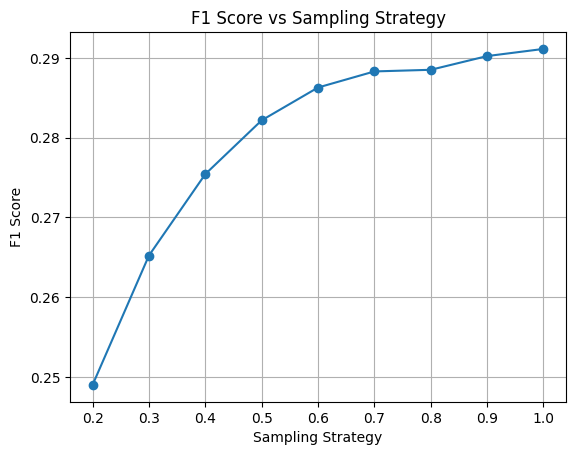

In [92]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', GaussianNB())]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))    
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

### Logistic Regression

Sampling Strategy=0.2 & F1 Score=0.11937188590677993
Sampling Strategy=0.3 & F1 Score=0.18489061109423038
Sampling Strategy=0.4 & F1 Score=0.24086134265026465
Sampling Strategy=0.5 & F1 Score=0.27382905996293266
Sampling Strategy=0.6 & F1 Score=0.29697247492384876
Sampling Strategy=0.7 & F1 Score=0.31082412587314184
Sampling Strategy=0.8 & F1 Score=0.31755697015080914
Sampling Strategy=0.9 & F1 Score=0.31946919195089785
Sampling Strategy=1 & F1 Score=0.3176771579352022


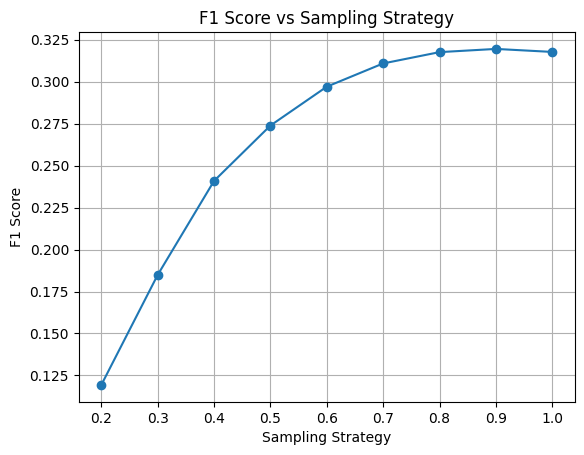

In [90]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', LogisticRegression(random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

In [91]:
# model = LogisticRegression(class_weight='balanced', random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.319


As we can see, in LogisticRegression the scores with and without imbalanced learning method have the same exact score (0.319), so in this case its better to use it without any imbalanced learning methods, because we dont lose data (in case of undersampling techniques) or we dont create fictional data (in case of oversampling techniques) which is preferable.

### Decision Tree Classifier

Sampling Strategy=0.2 & F1 Score=0.10163079295175423
Sampling Strategy=0.3 & F1 Score=0.1676841705311169
Sampling Strategy=0.4 & F1 Score=0.30457456836538926
Sampling Strategy=0.5 & F1 Score=0.3315722535106676
Sampling Strategy=0.6 & F1 Score=0.34360261445112256
Sampling Strategy=0.7 & F1 Score=0.3419328371456621
Sampling Strategy=0.8 & F1 Score=0.3412916380026395
Sampling Strategy=0.9 & F1 Score=0.3412743418415992
Sampling Strategy=1 & F1 Score=0.33978739001043134


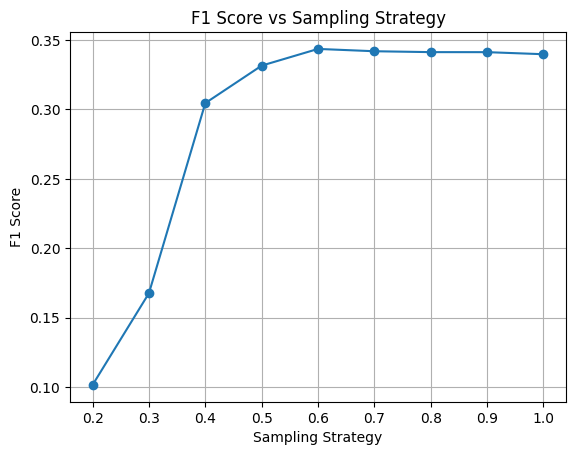

In [96]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', DecisionTreeClassifier(max_depth=5,random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

In [97]:
# model = DecisionTreeClassifier(max_depth=5,class_weight='balanced', random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.339


### KNeighbors Classifier

Sampling Strategy=0.2 & F1 Score=0.1851615809673927
Sampling Strategy=0.3 & F1 Score=0.23723580103002656
Sampling Strategy=0.4 & F1 Score=0.2624573545824253
Sampling Strategy=0.5 & F1 Score=0.2746200569325687
Sampling Strategy=0.6 & F1 Score=0.27938834383085087
Sampling Strategy=0.7 & F1 Score=0.2801590249723434
Sampling Strategy=0.8 & F1 Score=0.2810143935232167
Sampling Strategy=0.9 & F1 Score=0.2801712665790826
Sampling Strategy=1 & F1 Score=0.2784890556868518


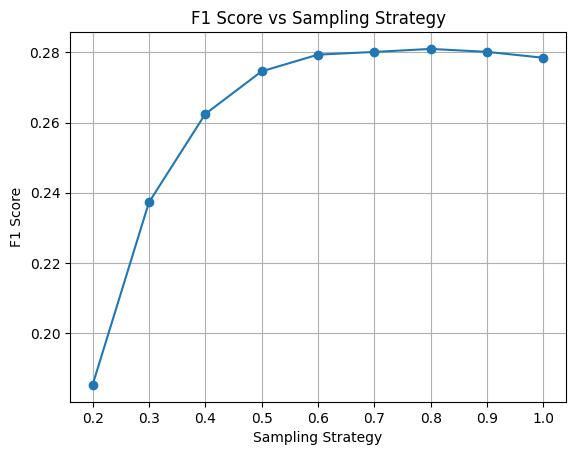

In [85]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', KNeighborsClassifier(n_jobs=-1))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

On KNeighborsClassifier the best score is when the sampling_strategy=0.70 of the KNeighborsClassifier.

### MLP Classifier

Sampling Strategy=0.2 & F1 Score=0.09844721925268321
Sampling Strategy=0.3 & F1 Score=0.21055502573618476
Sampling Strategy=0.4 & F1 Score=0.29792597397884424
Sampling Strategy=0.5 & F1 Score=0.3289989543838258
Sampling Strategy=0.6 & F1 Score=0.33923133683102524
Sampling Strategy=0.7 & F1 Score=0.33791046719120726
Sampling Strategy=0.8 & F1 Score=0.3329791347209129
Sampling Strategy=0.9 & F1 Score=0.3262400734064822
Sampling Strategy=1 & F1 Score=0.32124235499288656


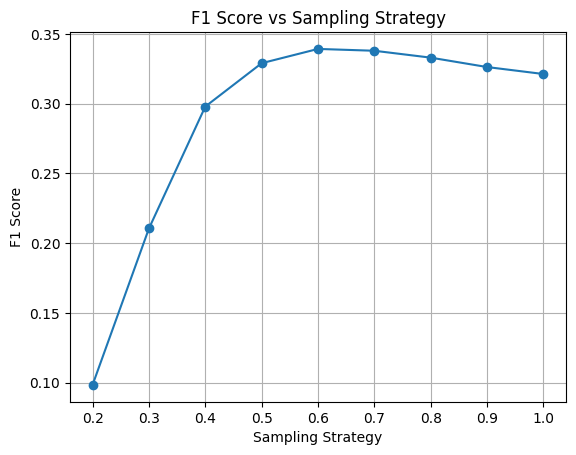

In [94]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', MLPClassifier(hidden_layer_sizes=(7,), batch_size=64, random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

### SVC

Sampling Strategy=0.2 & F1 Score=0.03759352548082155
Sampling Strategy=0.3 & F1 Score=0.1120830248774661
Sampling Strategy=0.4 & F1 Score=0.24918779470510471
Sampling Strategy=0.5 & F1 Score=0.315096913827183
Sampling Strategy=0.6 & F1 Score=0.3360892590351495
Sampling Strategy=0.7 & F1 Score=0.333715319638295
Sampling Strategy=0.8 & F1 Score=0.32734029238280904
Sampling Strategy=0.9 & F1 Score=0.3224806387977277
Sampling Strategy=1 & F1 Score=0.32033294444947585


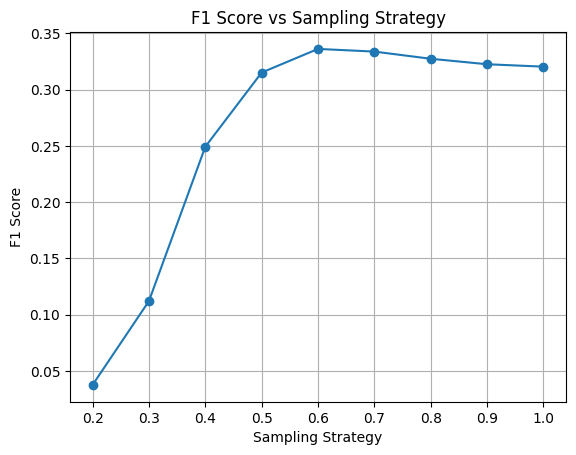

In [287]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', SVC(random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show() 

In [288]:
# model = SVC(class_weight='balanced', random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.320


### Gradient Boosting Classifer

Sampling Strategy=0.2 & F1 Score=0.0027603548744105735
Sampling Strategy=0.3 & F1 Score=0.05393396507117494
Sampling Strategy=0.4 & F1 Score=0.11568328343287057
Sampling Strategy=0.5 & F1 Score=0.22119916597430428
Sampling Strategy=0.6 & F1 Score=0.33071225675821797
Sampling Strategy=0.7 & F1 Score=0.350528705723037
Sampling Strategy=0.8 & F1 Score=0.34791331811743176
Sampling Strategy=0.9 & F1 Score=0.3451954659508192
Sampling Strategy=1 & F1 Score=0.33745460131649996


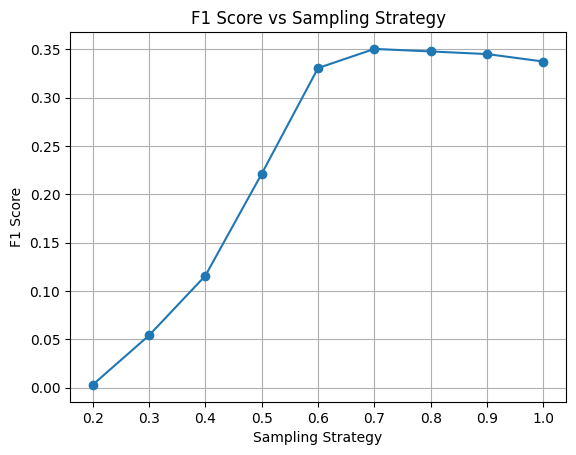

In [289]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', GradientBoostingClassifier(max_depth=5,learning_rate=0.01,subsample=0.5,random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

### Random Forest Classifier

Sampling Strategy=0.2 & F1 Score=0.002729728950875316
Sampling Strategy=0.3 & F1 Score=0.054920211075299485
Sampling Strategy=0.4 & F1 Score=0.12051317851334302
Sampling Strategy=0.5 & F1 Score=0.26233416482429794
Sampling Strategy=0.6 & F1 Score=0.32655078025393086
Sampling Strategy=0.7 & F1 Score=0.33355614262928546
Sampling Strategy=0.8 & F1 Score=0.3251136187578177
Sampling Strategy=0.9 & F1 Score=0.322024373179511
Sampling Strategy=1 & F1 Score=0.32017528210324386


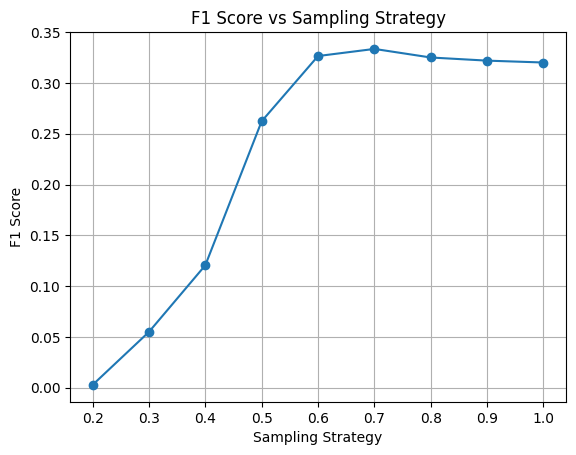

In [290]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', RandomForestClassifier(max_depth=5,random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

In [291]:
# model = RandomForestClassifier(class_weight='balanced',max_depth=5,random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.319


### ExtraTreesClassifier

Sampling Strategy=0.2 & F1 Score=0.0015031381519551722
Sampling Strategy=0.3 & F1 Score=0.014603173579123982
Sampling Strategy=0.4 & F1 Score=0.051461652652379265
Sampling Strategy=0.5 & F1 Score=0.09432008978853787
Sampling Strategy=0.6 & F1 Score=0.18210026141555388
Sampling Strategy=0.7 & F1 Score=0.2559521936329666
Sampling Strategy=0.8 & F1 Score=0.30597005438980773
Sampling Strategy=0.9 & F1 Score=0.3201311172582196
Sampling Strategy=1 & F1 Score=0.30697723714484626


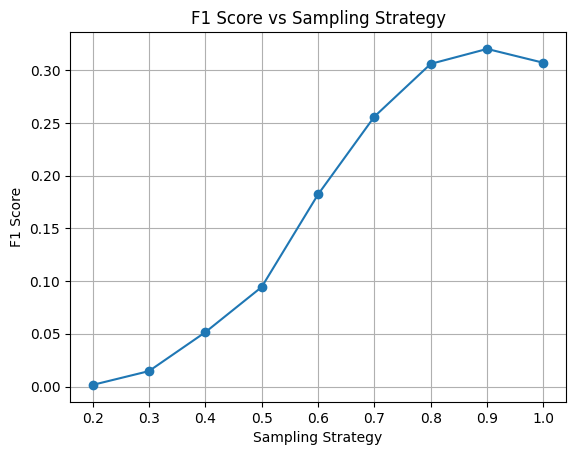

In [103]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', ExtraTreesClassifier(max_depth=5,random_state=19, n_jobs=-1))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

In [104]:
# model = ExtraTreesClassifier(class_weight='balanced',max_depth=5,random_state=19,n_jobs=-1)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.305


### Bagging Classifier

Sampling Strategy=0.2 & F1 Score=0.20906319007114202
Sampling Strategy=0.3 & F1 Score=0.24994701155037385
Sampling Strategy=0.4 & F1 Score=0.2660544631884238
Sampling Strategy=0.5 & F1 Score=0.2797851068942239
Sampling Strategy=0.6 & F1 Score=0.28557804145500143
Sampling Strategy=0.7 & F1 Score=0.28765604381632337
Sampling Strategy=0.8 & F1 Score=0.28783534822107415
Sampling Strategy=0.9 & F1 Score=0.28586436427837725
Sampling Strategy=1 & F1 Score=0.2852554117412855


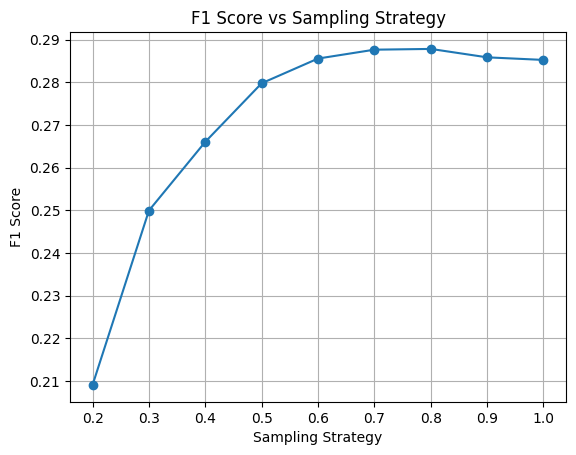

In [105]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', BaggingClassifier(random_state=19, n_jobs=-1))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

### AdaBoost Classifier

Sampling Strategy=0.2 & F1 Score=0.10172082007450944
Sampling Strategy=0.3 & F1 Score=0.20829491789889748
Sampling Strategy=0.4 & F1 Score=0.2792677319160277
Sampling Strategy=0.5 & F1 Score=0.31561880648935786
Sampling Strategy=0.6 & F1 Score=0.32721319563859363
Sampling Strategy=0.7 & F1 Score=0.32811922481259975
Sampling Strategy=0.8 & F1 Score=0.3240175096144968
Sampling Strategy=0.9 & F1 Score=0.32284782251070004
Sampling Strategy=1 & F1 Score=0.3216498934190704


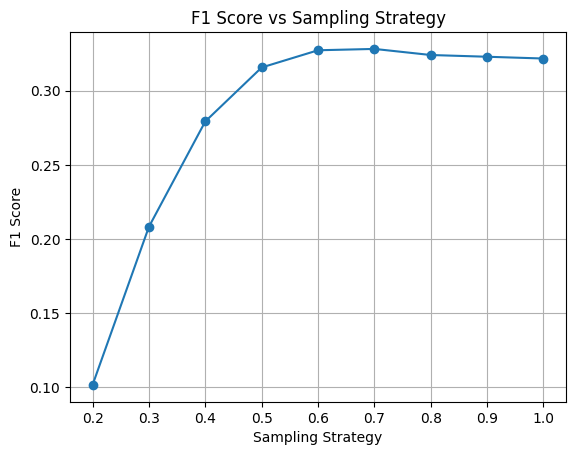

In [106]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', AdaBoostClassifier(random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

### HistGradientBoosting Classifier

Sampling Strategy=0.2 & F1 Score=0.0010043944226318575
Sampling Strategy=0.3 & F1 Score=0.043354082734292365
Sampling Strategy=0.4 & F1 Score=0.11312525507989206
Sampling Strategy=0.5 & F1 Score=0.21208824655908956
Sampling Strategy=0.6 & F1 Score=0.32754548790797594
Sampling Strategy=0.7 & F1 Score=0.34513490891234105
Sampling Strategy=0.8 & F1 Score=0.345955620434199
Sampling Strategy=0.9 & F1 Score=0.34460033660432055
Sampling Strategy=1 & F1 Score=0.3393487026464589


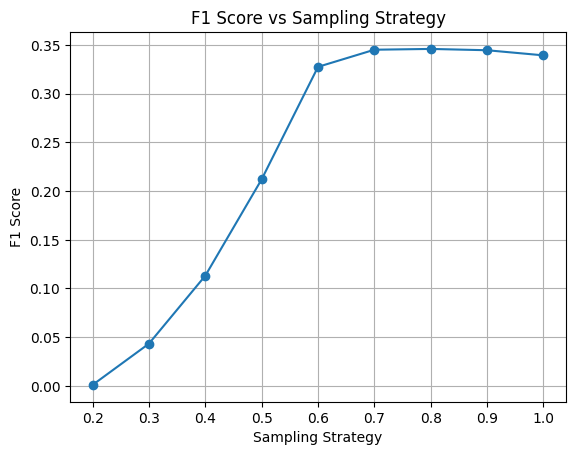

In [110]:
# sampling_strategy_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# f1_scores = []

# for value in sampling_strategy_values:
#     steps = [('under', RandomUnderSampler(sampling_strategy=value, random_state=19)), ('model', HistGradientBoostingClassifier(max_depth=5,learning_rate=0.01,random_state=19))]
#     pipeline = ImbPipeline(steps=steps)
    
#     scores = cross_val_score(pipeline, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
#     score = np.mean(scores)
    
#     print('Sampling Strategy=' + str(value) + ' & F1 Score=' + str(score))
#     f1_scores.append(score)

# plt.plot(sampling_strategy_values, f1_scores, marker='o')
# plt.xlabel('Sampling Strategy')
# plt.ylabel('F1 Score')
# plt.title('F1 Score vs Sampling Strategy')
# plt.grid(True)
# plt.show()

In [112]:
# model = HistGradientBoostingClassifier(class_weight='balanced',max_depth=5,learning_rate=0.01,random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=19)
# scores = cross_val_score(model, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.339


# Imbalanced Learning

Conclusion with the graphics above is that the sampling_strategy is normally better at 0.7 more less, especially in algorithms like RandomForestClassifier and GradientBoostingClassifier that are usually the best ones so far for me (and also historically really good algorithms for kaggle competitions). The outlier is ExtraTreesClassifier where the sampling_strategy is better when it is 0.9. This values are of course not absolute, so in future improvements or even with more time, we could explore this even further.

Cost-sensitive learning: This involves assigning a higher cost to misclassifying minority classes.

In [62]:
y_binary.value_counts(normalize=True)

readmitted_binary
0    0.888399
1    0.111601
Name: proportion, dtype: float64

### Random Undersampling

We are going to use MinMaxScaler, because RobustScaler can only be a last resource option (said by the professor) and because we dont have normal or normalike distributions (also because we have binary features which dont have normal distributions).

In [63]:
print("Number transactions X_train dataset: ", X_scaled.shape)
print("Number transactions y_train dataset: ", y_binary.shape)

print("Before OverSampling, counts of label '1': {}".format(sum(y_binary==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_binary==0)))

rus = RandomUnderSampler(sampling_strategy=0.7, random_state=19)
X_train_res, y_train_res = rus.fit_resample(X_scaled, y_binary.values.ravel())

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

Number transactions X_train dataset:  (71236, 13)
Number transactions y_train dataset:  (71236,)
Before OverSampling, counts of label '1': 7950
Before OverSampling, counts of label '0': 63286 

After OverSampling, the shape of train_X: (19307, 13)
After OverSampling, the shape of train_y: (19307,) 

After OverSampling, counts of label '1': 7950
After OverSampling, counts of label '0': 11357


# Algorithms

### Decision Trees

In [293]:
# models = [
#     DecisionTreeClassifier(class_weight='balanced',random_state=19)
# ]
 
# hyperparameters = [
#     {
#         'criterion': ['gini','entropy'],
#         'splitter': ['random','best'],
#         'max_depth': [8,9,10,11,12],
#         'min_samples_split': range(20,200),
#         'min_samples_leaf': range(2,40)
#     } 
# ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     gs = RandomizedSearchCV(model, params, cv=10, n_iter=500, scoring='f1', verbose=10)
    
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
    
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 500 candidates, totalling 5000 fits
[CV 1/10; 1/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random
[CV 1/10; 1/500] END criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random;, score=0.324 total time=   0.0s
[CV 2/10; 1/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random
[CV 2/10; 1/500] END criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random;, score=0.339 total time=   0.0s
[CV 3/10; 1/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random
[CV 3/10; 1/500] END criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random;, score=0.345 total time=   0.0s
[CV 4/10; 1/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=93, splitter=random
[CV 4/10; 1/500] END criterion=entrop

[CV 3/10; 4/500] END criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best;, score=0.346 total time=   0.0s
[CV 4/10; 4/500] START criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best
[CV 4/10; 4/500] END criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best;, score=0.318 total time=   0.0s
[CV 5/10; 4/500] START criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best
[CV 5/10; 4/500] END criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best;, score=0.328 total time=   0.0s
[CV 6/10; 4/500] START criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best
[CV 6/10; 4/500] END criterion=entropy, max_depth=10, min_samples_leaf=28, min_samples_split=182, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 4/500] START criterion=entropy, max_depth=10, min_samples_leaf=28, m

[CV 8/10; 7/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=54, splitter=random;, score=0.342 total time=   0.0s
[CV 9/10; 7/500] START criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=54, splitter=random
[CV 9/10; 7/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=54, splitter=random;, score=0.330 total time=   0.0s
[CV 10/10; 7/500] START criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=54, splitter=random
[CV 10/10; 7/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=54, splitter=random;, score=0.311 total time=   0.0s
[CV 1/10; 8/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=52, splitter=best
[CV 1/10; 8/500] END criterion=entropy, max_depth=11, min_samples_leaf=23, min_samples_split=52, splitter=best;, score=0.329 total time=   0.0s
[CV 2/10; 8/500] START criterion=entropy, max_depth=11, min_samples_leaf=23, m

[CV 2/10; 11/500] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best;, score=0.329 total time=   0.0s
[CV 3/10; 11/500] START criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best
[CV 3/10; 11/500] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best;, score=0.347 total time=   0.0s
[CV 4/10; 11/500] START criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best
[CV 4/10; 11/500] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best;, score=0.311 total time=   0.0s
[CV 5/10; 11/500] START criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best
[CV 5/10; 11/500] END criterion=entropy, max_depth=12, min_samples_leaf=5, min_samples_split=199, splitter=best;, score=0.320 total time=   0.0s
[CV 6/10; 11/500] START criterion=entropy, max_depth=12, min_samples_leaf=5, m

[CV 4/10; 14/500] END criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best;, score=0.319 total time=   0.0s
[CV 5/10; 14/500] START criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best
[CV 5/10; 14/500] END criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best;, score=0.329 total time=   0.0s
[CV 6/10; 14/500] START criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best
[CV 6/10; 14/500] END criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 14/500] START criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best
[CV 7/10; 14/500] END criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=best;, score=0.333 total time=   0.0s
[CV 8/10; 14/500] START criterion=gini, max_depth=8, min_samples_leaf=6, min_samples_split=169, splitter=b

[CV 10/10; 17/500] END criterion=gini, max_depth=8, min_samples_leaf=14, min_samples_split=29, splitter=best;, score=0.337 total time=   0.0s
[CV 1/10; 18/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random
[CV 1/10; 18/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random;, score=0.329 total time=   0.0s
[CV 2/10; 18/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random
[CV 2/10; 18/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random;, score=0.332 total time=   0.0s
[CV 3/10; 18/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random
[CV 3/10; 18/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=148, splitter=random;, score=0.340 total time=   0.0s
[CV 4/10; 18/500] START criterion=entropy, max_depth=9, min_samples_l

[CV 3/10; 21/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random;, score=0.344 total time=   0.0s
[CV 4/10; 21/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random
[CV 4/10; 21/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random;, score=0.317 total time=   0.0s
[CV 5/10; 21/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random
[CV 5/10; 21/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random;, score=0.325 total time=   0.0s
[CV 6/10; 21/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random
[CV 6/10; 21/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=184, splitter=random;, score=0.331 total time=   0.0s
[CV 7/10; 21/500] START criterion=entropy, max_depth=10, 

[CV 6/10; 24/500] END criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best;, score=0.316 total time=   0.0s
[CV 7/10; 24/500] START criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best
[CV 7/10; 24/500] END criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best;, score=0.320 total time=   0.0s
[CV 8/10; 24/500] START criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best
[CV 8/10; 24/500] END criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best;, score=0.322 total time=   0.0s
[CV 9/10; 24/500] START criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best
[CV 9/10; 24/500] END criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, splitter=best;, score=0.313 total time=   0.0s
[CV 10/10; 24/500] START criterion=gini, max_depth=12, min_samples_leaf=12, min_samples_split=29, s

[CV 10/10; 27/500] END criterion=gini, max_depth=11, min_samples_leaf=27, min_samples_split=116, splitter=best;, score=0.328 total time=   0.0s
[CV 1/10; 28/500] START criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random
[CV 1/10; 28/500] END criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random;, score=0.339 total time=   0.0s
[CV 2/10; 28/500] START criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random
[CV 2/10; 28/500] END criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random;, score=0.335 total time=   0.0s
[CV 3/10; 28/500] START criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random
[CV 3/10; 28/500] END criterion=gini, max_depth=11, min_samples_leaf=30, min_samples_split=100, splitter=random;, score=0.337 total time=   0.0s
[CV 4/10; 28/500] START criterion=gini, max_depth=11, min_samples_leaf=30, min_

[CV 2/10; 31/500] END criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best;, score=0.330 total time=   0.0s
[CV 3/10; 31/500] START criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best
[CV 3/10; 31/500] END criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best;, score=0.348 total time=   0.0s
[CV 4/10; 31/500] START criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best
[CV 4/10; 31/500] END criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best;, score=0.307 total time=   0.0s
[CV 5/10; 31/500] START criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best
[CV 5/10; 31/500] END criterion=entropy, max_depth=11, min_samples_leaf=24, min_samples_split=115, splitter=best;, score=0.328 total time=   0.0s
[CV 6/10; 31/500] START criterion=entropy, max_depth=11, min_samples_le

[CV 6/10; 34/500] END criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random;, score=0.336 total time=   0.0s
[CV 7/10; 34/500] START criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random
[CV 7/10; 34/500] END criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random;, score=0.336 total time=   0.0s
[CV 8/10; 34/500] START criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random
[CV 8/10; 34/500] END criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random;, score=0.349 total time=   0.0s
[CV 9/10; 34/500] START criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random
[CV 9/10; 34/500] END criterion=entropy, max_depth=10, min_samples_leaf=39, min_samples_split=51, splitter=random;, score=0.330 total time=   0.0s
[CV 10/10; 34/500] START criterion=entropy, max_depth=10, min_sa

[CV 10/10; 37/500] END criterion=entropy, max_depth=10, min_samples_leaf=11, min_samples_split=101, splitter=random;, score=0.329 total time=   0.0s
[CV 1/10; 38/500] START criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random
[CV 1/10; 38/500] END criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random;, score=0.325 total time=   0.0s
[CV 2/10; 38/500] START criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random
[CV 2/10; 38/500] END criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random;, score=0.344 total time=   0.0s
[CV 3/10; 38/500] START criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random
[CV 3/10; 38/500] END criterion=gini, max_depth=11, min_samples_leaf=37, min_samples_split=182, splitter=random;, score=0.334 total time=   0.0s
[CV 4/10; 38/500] START criterion=gini, max_depth=11, min_samples_leaf=37,

[CV 5/10; 41/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random;, score=0.330 total time=   0.0s
[CV 6/10; 41/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random
[CV 6/10; 41/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random;, score=0.337 total time=   0.0s
[CV 7/10; 41/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random
[CV 7/10; 41/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random;, score=0.337 total time=   0.0s
[CV 8/10; 41/500] START criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random
[CV 8/10; 41/500] END criterion=entropy, max_depth=9, min_samples_leaf=38, min_samples_split=68, splitter=random;, score=0.335 total time=   0.0s
[CV 9/10; 41/500] START criterion=entropy, max_depth=9, min_samples_lea

[CV 9/10; 44/500] END criterion=gini, max_depth=8, min_samples_leaf=12, min_samples_split=76, splitter=best;, score=0.332 total time=   0.0s
[CV 10/10; 44/500] START criterion=gini, max_depth=8, min_samples_leaf=12, min_samples_split=76, splitter=best
[CV 10/10; 44/500] END criterion=gini, max_depth=8, min_samples_leaf=12, min_samples_split=76, splitter=best;, score=0.337 total time=   0.0s
[CV 1/10; 45/500] START criterion=gini, max_depth=11, min_samples_leaf=25, min_samples_split=155, splitter=random
[CV 1/10; 45/500] END criterion=gini, max_depth=11, min_samples_leaf=25, min_samples_split=155, splitter=random;, score=0.331 total time=   0.0s
[CV 2/10; 45/500] START criterion=gini, max_depth=11, min_samples_leaf=25, min_samples_split=155, splitter=random
[CV 2/10; 45/500] END criterion=gini, max_depth=11, min_samples_leaf=25, min_samples_split=155, splitter=random;, score=0.336 total time=   0.0s
[CV 3/10; 45/500] START criterion=gini, max_depth=11, min_samples_leaf=25, min_samples_s

[CV 3/10; 48/500] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best;, score=0.331 total time=   0.0s
[CV 4/10; 48/500] START criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best
[CV 4/10; 48/500] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best;, score=0.309 total time=   0.0s
[CV 5/10; 48/500] START criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best
[CV 5/10; 48/500] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best;, score=0.317 total time=   0.0s
[CV 6/10; 48/500] START criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best
[CV 6/10; 48/500] END criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split=128, splitter=best;, score=0.329 total time=   0.0s
[CV 7/10; 48/500] START criterion=gini, max_depth=12, min_samples_leaf=15, min_samples_split

[CV 8/10; 51/500] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=33, splitter=random;, score=0.329 total time=   0.0s
[CV 9/10; 51/500] START criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=33, splitter=random
[CV 9/10; 51/500] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=33, splitter=random;, score=0.312 total time=   0.0s
[CV 10/10; 51/500] START criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=33, splitter=random
[CV 10/10; 51/500] END criterion=gini, max_depth=12, min_samples_leaf=2, min_samples_split=33, splitter=random;, score=0.317 total time=   0.0s
[CV 1/10; 52/500] START criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=114, splitter=random
[CV 1/10; 52/500] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=114, splitter=random;, score=0.332 total time=   0.0s
[CV 2/10; 52/500] START criterion=entropy, max_depth=8, min_samples_leaf=3, min_samp

[CV 3/10; 55/500] END criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 55/500] START criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best
[CV 4/10; 55/500] END criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best;, score=0.315 total time=   0.0s
[CV 5/10; 55/500] START criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best
[CV 5/10; 55/500] END criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best;, score=0.320 total time=   0.0s
[CV 6/10; 55/500] START criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best
[CV 6/10; 55/500] END criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split=162, splitter=best;, score=0.329 total time=   0.0s
[CV 7/10; 55/500] START criterion=gini, max_depth=12, min_samples_leaf=30, min_samples_split

[CV 5/10; 58/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random;, score=0.328 total time=   0.0s
[CV 6/10; 58/500] START criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random
[CV 6/10; 58/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random;, score=0.338 total time=   0.0s
[CV 7/10; 58/500] START criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random
[CV 7/10; 58/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random;, score=0.326 total time=   0.0s
[CV 8/10; 58/500] START criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random
[CV 8/10; 58/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=125, splitter=random;, score=0.345 total time=   0.0s
[CV 9/10; 58/500] START criterion=entropy, max_depth=8, min_samples_lea

[CV 1/10; 62/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random;, score=0.334 total time=   0.0s
[CV 2/10; 62/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random
[CV 2/10; 62/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random;, score=0.344 total time=   0.0s
[CV 3/10; 62/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random
[CV 3/10; 62/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random;, score=0.343 total time=   0.0s
[CV 4/10; 62/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random
[CV 4/10; 62/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=189, splitter=random;, score=0.318 total time=   0.0s
[CV 5/10; 62/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min

[CV 4/10; 65/500] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best;, score=0.316 total time=   0.0s
[CV 5/10; 65/500] START criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best
[CV 5/10; 65/500] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best;, score=0.333 total time=   0.0s
[CV 6/10; 65/500] START criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best
[CV 6/10; 65/500] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best;, score=0.335 total time=   0.0s
[CV 7/10; 65/500] START criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best
[CV 7/10; 65/500] END criterion=entropy, max_depth=9, min_samples_leaf=3, min_samples_split=101, splitter=best;, score=0.320 total time=   0.0s
[CV 8/10; 65/500] START criterion=entropy, max_depth=9, min_samples_leaf=3, min_sampl

[CV 7/10; 68/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best;, score=0.327 total time=   0.0s
[CV 8/10; 68/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best
[CV 8/10; 68/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best;, score=0.331 total time=   0.0s
[CV 9/10; 68/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best
[CV 9/10; 68/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best;, score=0.321 total time=   0.0s
[CV 10/10; 68/500] START criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best
[CV 10/10; 68/500] END criterion=gini, max_depth=12, min_samples_leaf=16, min_samples_split=93, splitter=best;, score=0.328 total time=   0.0s
[CV 1/10; 69/500] START criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=110,

[CV 2/10; 72/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random;, score=0.333 total time=   0.0s
[CV 3/10; 72/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random
[CV 3/10; 72/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random;, score=0.341 total time=   0.0s
[CV 4/10; 72/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random
[CV 4/10; 72/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random;, score=0.314 total time=   0.0s
[CV 5/10; 72/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random
[CV 5/10; 72/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=148, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 72/500] START criterion=entropy, max_depth=12, 

[CV 5/10; 75/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random;, score=0.328 total time=   0.0s
[CV 6/10; 75/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random
[CV 6/10; 75/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random;, score=0.340 total time=   0.0s
[CV 7/10; 75/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random
[CV 7/10; 75/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random;, score=0.334 total time=   0.0s
[CV 8/10; 75/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random
[CV 8/10; 75/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=184, splitter=random;, score=0.341 total time=   0.0s
[CV 9/10; 75/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_samples

[CV 7/10; 78/500] END criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best;, score=0.334 total time=   0.0s
[CV 8/10; 78/500] START criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best
[CV 8/10; 78/500] END criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best;, score=0.342 total time=   0.0s
[CV 9/10; 78/500] START criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best
[CV 9/10; 78/500] END criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best;, score=0.333 total time=   0.0s
[CV 10/10; 78/500] START criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best
[CV 10/10; 78/500] END criterion=entropy, max_depth=10, min_samples_leaf=35, min_samples_split=80, splitter=best;, score=0.326 total time=   0.0s
[CV 1/10; 79/500] START criterion=gini, max_depth=8, min_samples_leaf=18, mi

[CV 2/10; 82/500] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random;, score=0.340 total time=   0.0s
[CV 3/10; 82/500] START criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random
[CV 3/10; 82/500] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random;, score=0.341 total time=   0.0s
[CV 4/10; 82/500] START criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random
[CV 4/10; 82/500] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random;, score=0.323 total time=   0.0s
[CV 5/10; 82/500] START criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random
[CV 5/10; 82/500] END criterion=gini, max_depth=11, min_samples_leaf=10, min_samples_split=33, splitter=random;, score=0.323 total time=   0.0s
[CV 6/10; 82/500] START criterion=gini, max_depth=11, min_samples_leaf=10, min_sample

[CV 4/10; 85/500] END criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random;, score=0.315 total time=   0.0s
[CV 5/10; 85/500] START criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random
[CV 5/10; 85/500] END criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random;, score=0.325 total time=   0.0s
[CV 6/10; 85/500] START criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random
[CV 6/10; 85/500] END criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random;, score=0.336 total time=   0.0s
[CV 7/10; 85/500] START criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random
[CV 7/10; 85/500] END criterion=gini, max_depth=10, min_samples_leaf=37, min_samples_split=33, splitter=random;, score=0.330 total time=   0.0s
[CV 8/10; 85/500] START criterion=gini, max_depth=10, min_samples_leaf=37, min_sample

[CV 6/10; 88/500] END criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random;, score=0.325 total time=   0.0s
[CV 7/10; 88/500] START criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random
[CV 7/10; 88/500] END criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random;, score=0.327 total time=   0.0s
[CV 8/10; 88/500] START criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random
[CV 8/10; 88/500] END criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random;, score=0.337 total time=   0.0s
[CV 9/10; 88/500] START criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random
[CV 9/10; 88/500] END criterion=entropy, max_depth=10, min_samples_leaf=9, min_samples_split=37, splitter=random;, score=0.322 total time=   0.0s
[CV 10/10; 88/500] START criterion=entropy, max_depth=10, min_samples_l

[CV 9/10; 91/500] END criterion=gini, max_depth=9, min_samples_leaf=27, min_samples_split=151, splitter=best;, score=0.336 total time=   0.0s
[CV 10/10; 91/500] START criterion=gini, max_depth=9, min_samples_leaf=27, min_samples_split=151, splitter=best
[CV 10/10; 91/500] END criterion=gini, max_depth=9, min_samples_leaf=27, min_samples_split=151, splitter=best;, score=0.337 total time=   0.0s
[CV 1/10; 92/500] START criterion=entropy, max_depth=12, min_samples_leaf=21, min_samples_split=151, splitter=random
[CV 1/10; 92/500] END criterion=entropy, max_depth=12, min_samples_leaf=21, min_samples_split=151, splitter=random;, score=0.332 total time=   0.0s
[CV 2/10; 92/500] START criterion=entropy, max_depth=12, min_samples_leaf=21, min_samples_split=151, splitter=random
[CV 2/10; 92/500] END criterion=entropy, max_depth=12, min_samples_leaf=21, min_samples_split=151, splitter=random;, score=0.334 total time=   0.0s
[CV 3/10; 92/500] START criterion=entropy, max_depth=12, min_samples_leaf

[CV 2/10; 95/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best;, score=0.326 total time=   0.0s
[CV 3/10; 95/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best
[CV 3/10; 95/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 95/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best
[CV 4/10; 95/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best;, score=0.309 total time=   0.0s
[CV 5/10; 95/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best
[CV 5/10; 95/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=133, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 95/500] START criterion=entropy, max_depth=12, min_samples_le

[CV 7/10; 98/500] END criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random;, score=0.333 total time=   0.0s
[CV 8/10; 98/500] START criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random
[CV 8/10; 98/500] END criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random;, score=0.337 total time=   0.0s
[CV 9/10; 98/500] START criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random
[CV 9/10; 98/500] END criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random;, score=0.337 total time=   0.0s
[CV 10/10; 98/500] START criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random
[CV 10/10; 98/500] END criterion=entropy, max_depth=9, min_samples_leaf=39, min_samples_split=48, splitter=random;, score=0.329 total time=   0.0s
[CV 1/10; 99/500] START criterion=gini, max_depth=8, min_samples_leaf

[CV 9/10; 101/500] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=133, splitter=best;, score=0.334 total time=   0.0s
[CV 10/10; 101/500] START criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=133, splitter=best
[CV 10/10; 101/500] END criterion=gini, max_depth=9, min_samples_leaf=10, min_samples_split=133, splitter=best;, score=0.331 total time=   0.0s
[CV 1/10; 102/500] START criterion=entropy, max_depth=12, min_samples_leaf=6, min_samples_split=167, splitter=random
[CV 1/10; 102/500] END criterion=entropy, max_depth=12, min_samples_leaf=6, min_samples_split=167, splitter=random;, score=0.332 total time=   0.0s
[CV 2/10; 102/500] START criterion=entropy, max_depth=12, min_samples_leaf=6, min_samples_split=167, splitter=random
[CV 2/10; 102/500] END criterion=entropy, max_depth=12, min_samples_leaf=6, min_samples_split=167, splitter=random;, score=0.333 total time=   0.0s
[CV 3/10; 102/500] START criterion=entropy, max_depth=12, min_samples_

[CV 5/10; 105/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random;, score=0.321 total time=   0.0s
[CV 6/10; 105/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random
[CV 6/10; 105/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random;, score=0.334 total time=   0.0s
[CV 7/10; 105/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random
[CV 7/10; 105/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random;, score=0.332 total time=   0.0s
[CV 8/10; 105/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random
[CV 8/10; 105/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=56, splitter=random;, score=0.338 total time=   0.0s
[CV 9/10; 105/500] START criterion=entropy, max_depth=10,

[CV 8/10; 108/500] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=34, splitter=best;, score=0.330 total time=   0.0s
[CV 9/10; 108/500] START criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=34, splitter=best
[CV 9/10; 108/500] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=34, splitter=best;, score=0.320 total time=   0.0s
[CV 10/10; 108/500] START criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=34, splitter=best
[CV 10/10; 108/500] END criterion=entropy, max_depth=12, min_samples_leaf=3, min_samples_split=34, splitter=best;, score=0.329 total time=   0.0s
[CV 1/10; 109/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=25, splitter=best
[CV 1/10; 109/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=25, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 109/500] START criterion=gini, max_depth=10, min_samples_leaf=4, min_sam

[CV 1/10; 112/500] END criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random;, score=0.328 total time=   0.0s
[CV 2/10; 112/500] START criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random
[CV 2/10; 112/500] END criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random;, score=0.343 total time=   0.0s
[CV 3/10; 112/500] START criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random
[CV 3/10; 112/500] END criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random;, score=0.344 total time=   0.0s
[CV 4/10; 112/500] START criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random
[CV 4/10; 112/500] END criterion=gini, max_depth=10, min_samples_leaf=29, min_samples_split=88, splitter=random;, score=0.319 total time=   0.0s
[CV 5/10; 112/500] START criterion=gini, max_depth=10, min_samples_leaf=29, mi

[CV 3/10; 115/500] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 115/500] START criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best
[CV 4/10; 115/500] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best;, score=0.317 total time=   0.0s
[CV 5/10; 115/500] START criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best
[CV 5/10; 115/500] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best;, score=0.330 total time=   0.0s
[CV 6/10; 115/500] START criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best
[CV 6/10; 115/500] END criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split=137, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 115/500] START criterion=gini, max_depth=10, min_samples_leaf=7, min_samples_split

[CV 6/10; 118/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best;, score=0.322 total time=   0.0s
[CV 7/10; 118/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best
[CV 7/10; 118/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best;, score=0.329 total time=   0.0s
[CV 8/10; 118/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best
[CV 8/10; 118/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best;, score=0.331 total time=   0.0s
[CV 9/10; 118/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best
[CV 9/10; 118/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=31, splitter=best;, score=0.326 total time=   0.0s
[CV 10/10; 118/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_spl

[CV 8/10; 121/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=145, splitter=best;, score=0.345 total time=   0.0s
[CV 9/10; 121/500] START criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=145, splitter=best
[CV 9/10; 121/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=145, splitter=best;, score=0.340 total time=   0.0s
[CV 10/10; 121/500] START criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=145, splitter=best
[CV 10/10; 121/500] END criterion=entropy, max_depth=9, min_samples_leaf=29, min_samples_split=145, splitter=best;, score=0.336 total time=   0.0s
[CV 1/10; 122/500] START criterion=gini, max_depth=9, min_samples_leaf=37, min_samples_split=44, splitter=random
[CV 1/10; 122/500] END criterion=gini, max_depth=9, min_samples_leaf=37, min_samples_split=44, splitter=random;, score=0.320 total time=   0.0s
[CV 2/10; 122/500] START criterion=gini, max_depth=9, min_samples_leaf=37

[CV 2/10; 125/500] END criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best;, score=0.334 total time=   0.0s
[CV 3/10; 125/500] START criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best
[CV 3/10; 125/500] END criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 125/500] START criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best
[CV 4/10; 125/500] END criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best;, score=0.315 total time=   0.0s
[CV 5/10; 125/500] START criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best
[CV 5/10; 125/500] END criterion=entropy, max_depth=10, min_samples_leaf=8, min_samples_split=44, splitter=best;, score=0.323 total time=   0.0s
[CV 6/10; 125/500] START criterion=entropy, max_depth=10, min_samples_leaf=8, 

[CV 6/10; 128/500] END criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best;, score=0.323 total time=   0.0s
[CV 7/10; 128/500] START criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best
[CV 7/10; 128/500] END criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best;, score=0.327 total time=   0.0s
[CV 8/10; 128/500] START criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best
[CV 8/10; 128/500] END criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best;, score=0.332 total time=   0.0s
[CV 9/10; 128/500] START criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best
[CV 9/10; 128/500] END criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_split=27, splitter=best;, score=0.316 total time=   0.0s
[CV 10/10; 128/500] START criterion=gini, max_depth=12, min_samples_leaf=37, min_samples_spl

[CV 2/10; 132/500] END criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random;, score=0.347 total time=   0.0s
[CV 3/10; 132/500] START criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random
[CV 3/10; 132/500] END criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random;, score=0.353 total time=   0.0s
[CV 4/10; 132/500] START criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random
[CV 4/10; 132/500] END criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random;, score=0.317 total time=   0.0s
[CV 5/10; 132/500] START criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random
[CV 5/10; 132/500] END criterion=entropy, max_depth=8, min_samples_leaf=32, min_samples_split=65, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 132/500] START criterion=entropy, max_depth=8, min_sam

[CV 7/10; 135/500] END criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random;, score=0.329 total time=   0.0s
[CV 8/10; 135/500] START criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random
[CV 8/10; 135/500] END criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random;, score=0.340 total time=   0.0s
[CV 9/10; 135/500] START criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random
[CV 9/10; 135/500] END criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random;, score=0.330 total time=   0.0s
[CV 10/10; 135/500] START criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random
[CV 10/10; 135/500] END criterion=gini, max_depth=9, min_samples_leaf=36, min_samples_split=120, splitter=random;, score=0.298 total time=   0.0s
[CV 1/10; 136/500] START criterion=entropy, max_depth=9, min_samples_leaf=31

[CV 9/10; 138/500] END criterion=entropy, max_depth=11, min_samples_leaf=36, min_samples_split=141, splitter=best;, score=0.334 total time=   0.0s
[CV 10/10; 138/500] START criterion=entropy, max_depth=11, min_samples_leaf=36, min_samples_split=141, splitter=best
[CV 10/10; 138/500] END criterion=entropy, max_depth=11, min_samples_leaf=36, min_samples_split=141, splitter=best;, score=0.331 total time=   0.0s
[CV 1/10; 139/500] START criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=32, splitter=random
[CV 1/10; 139/500] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=32, splitter=random;, score=0.335 total time=   0.0s
[CV 2/10; 139/500] START criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=32, splitter=random
[CV 2/10; 139/500] END criterion=gini, max_depth=12, min_samples_leaf=20, min_samples_split=32, splitter=random;, score=0.336 total time=   0.0s
[CV 3/10; 139/500] START criterion=gini, max_depth=12, min_samples_lea

[CV 3/10; 142/500] END criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random;, score=0.345 total time=   0.0s
[CV 4/10; 142/500] START criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random
[CV 4/10; 142/500] END criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random;, score=0.324 total time=   0.0s
[CV 5/10; 142/500] START criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random
[CV 5/10; 142/500] END criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random;, score=0.318 total time=   0.0s
[CV 6/10; 142/500] START criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random
[CV 6/10; 142/500] END criterion=gini, max_depth=10, min_samples_leaf=20, min_samples_split=23, splitter=random;, score=0.333 total time=   0.0s
[CV 7/10; 142/500] START criterion=gini, max_depth=10, min_samples_leaf=20, mi

[CV 8/10; 145/500] END criterion=gini, max_depth=12, min_samples_leaf=29, min_samples_split=35, splitter=random;, score=0.343 total time=   0.0s
[CV 9/10; 145/500] START criterion=gini, max_depth=12, min_samples_leaf=29, min_samples_split=35, splitter=random
[CV 9/10; 145/500] END criterion=gini, max_depth=12, min_samples_leaf=29, min_samples_split=35, splitter=random;, score=0.325 total time=   0.0s
[CV 10/10; 145/500] START criterion=gini, max_depth=12, min_samples_leaf=29, min_samples_split=35, splitter=random
[CV 10/10; 145/500] END criterion=gini, max_depth=12, min_samples_leaf=29, min_samples_split=35, splitter=random;, score=0.327 total time=   0.0s
[CV 1/10; 146/500] START criterion=gini, max_depth=12, min_samples_leaf=24, min_samples_split=87, splitter=random
[CV 1/10; 146/500] END criterion=gini, max_depth=12, min_samples_leaf=24, min_samples_split=87, splitter=random;, score=0.331 total time=   0.0s
[CV 2/10; 146/500] START criterion=gini, max_depth=12, min_samples_leaf=24, 

[CV 1/10; 149/500] END criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best;, score=0.334 total time=   0.0s
[CV 2/10; 149/500] START criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best
[CV 2/10; 149/500] END criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best;, score=0.338 total time=   0.0s
[CV 3/10; 149/500] START criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best
[CV 3/10; 149/500] END criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 149/500] START criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best
[CV 4/10; 149/500] END criterion=gini, max_depth=10, min_samples_leaf=22, min_samples_split=190, splitter=best;, score=0.319 total time=   0.0s
[CV 5/10; 149/500] START criterion=gini, max_depth=10, min_samples_leaf=22, min_sampl

[CV 3/10; 152/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best;, score=0.346 total time=   0.0s
[CV 4/10; 152/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best
[CV 4/10; 152/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best;, score=0.321 total time=   0.0s
[CV 5/10; 152/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best
[CV 5/10; 152/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best;, score=0.332 total time=   0.0s
[CV 6/10; 152/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best
[CV 6/10; 152/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 152/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=93, sp

[CV 6/10; 155/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best;, score=0.334 total time=   0.0s
[CV 7/10; 155/500] START criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best
[CV 7/10; 155/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best;, score=0.332 total time=   0.0s
[CV 8/10; 155/500] START criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best
[CV 8/10; 155/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best;, score=0.343 total time=   0.0s
[CV 9/10; 155/500] START criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best
[CV 9/10; 155/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=83, splitter=best;, score=0.331 total time=   0.0s
[CV 10/10; 155/500] START criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_spl

[CV 9/10; 158/500] END criterion=entropy, max_depth=11, min_samples_leaf=21, min_samples_split=135, splitter=random;, score=0.323 total time=   0.0s
[CV 10/10; 158/500] START criterion=entropy, max_depth=11, min_samples_leaf=21, min_samples_split=135, splitter=random
[CV 10/10; 158/500] END criterion=entropy, max_depth=11, min_samples_leaf=21, min_samples_split=135, splitter=random;, score=0.331 total time=   0.0s
[CV 1/10; 159/500] START criterion=entropy, max_depth=8, min_samples_leaf=13, min_samples_split=138, splitter=best
[CV 1/10; 159/500] END criterion=entropy, max_depth=8, min_samples_leaf=13, min_samples_split=138, splitter=best;, score=0.338 total time=   0.0s
[CV 2/10; 159/500] START criterion=entropy, max_depth=8, min_samples_leaf=13, min_samples_split=138, splitter=best
[CV 2/10; 159/500] END criterion=entropy, max_depth=8, min_samples_leaf=13, min_samples_split=138, splitter=best;, score=0.334 total time=   0.0s
[CV 3/10; 159/500] START criterion=entropy, max_depth=8, min

[CV 1/10; 162/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 162/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best
[CV 2/10; 162/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best;, score=0.332 total time=   0.0s
[CV 3/10; 162/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best
[CV 3/10; 162/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best;, score=0.344 total time=   0.0s
[CV 4/10; 162/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best
[CV 4/10; 162/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=64, splitter=best;, score=0.323 total time=   0.0s
[CV 5/10; 162/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, 

[CV 4/10; 165/500] END criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best;, score=0.319 total time=   0.0s
[CV 5/10; 165/500] START criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best
[CV 5/10; 165/500] END criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 165/500] START criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best
[CV 6/10; 165/500] END criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best;, score=0.325 total time=   0.0s
[CV 7/10; 165/500] START criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best
[CV 7/10; 165/500] END criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=196, splitter=best;, score=0.338 total time=   0.0s
[CV 8/10; 165/500] START criterion=gini, max_depth=11, min_samples_leaf=39, min_sampl

[CV 10/10; 168/500] END criterion=entropy, max_depth=8, min_samples_leaf=15, min_samples_split=153, splitter=random;, score=0.338 total time=   0.0s
[CV 1/10; 169/500] START criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best
[CV 1/10; 169/500] END criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best;, score=0.338 total time=   0.0s
[CV 2/10; 169/500] START criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best
[CV 2/10; 169/500] END criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best;, score=0.331 total time=   0.0s
[CV 3/10; 169/500] START criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best
[CV 3/10; 169/500] END criterion=entropy, max_depth=11, min_samples_leaf=4, min_samples_split=188, splitter=best;, score=0.350 total time=   0.0s
[CV 4/10; 169/500] START criterion=entropy, max_depth=11, min_sample

[CV 2/10; 172/500] END criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random;, score=0.348 total time=   0.0s
[CV 3/10; 172/500] START criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random
[CV 3/10; 172/500] END criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random;, score=0.351 total time=   0.0s
[CV 4/10; 172/500] START criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random
[CV 4/10; 172/500] END criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random;, score=0.320 total time=   0.0s
[CV 5/10; 172/500] START criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random
[CV 5/10; 172/500] END criterion=gini, max_depth=8, min_samples_leaf=11, min_samples_split=36, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 172/500] START criterion=gini, max_depth=8, min_samples_leaf=11, min_sample

[CV 8/10; 175/500] END criterion=gini, max_depth=10, min_samples_leaf=18, min_samples_split=74, splitter=random;, score=0.344 total time=   0.0s
[CV 9/10; 175/500] START criterion=gini, max_depth=10, min_samples_leaf=18, min_samples_split=74, splitter=random
[CV 9/10; 175/500] END criterion=gini, max_depth=10, min_samples_leaf=18, min_samples_split=74, splitter=random;, score=0.327 total time=   0.0s
[CV 10/10; 175/500] START criterion=gini, max_depth=10, min_samples_leaf=18, min_samples_split=74, splitter=random
[CV 10/10; 175/500] END criterion=gini, max_depth=10, min_samples_leaf=18, min_samples_split=74, splitter=random;, score=0.329 total time=   0.0s
[CV 1/10; 176/500] START criterion=gini, max_depth=10, min_samples_leaf=34, min_samples_split=158, splitter=random
[CV 1/10; 176/500] END criterion=gini, max_depth=10, min_samples_leaf=34, min_samples_split=158, splitter=random;, score=0.330 total time=   0.0s
[CV 2/10; 176/500] START criterion=gini, max_depth=10, min_samples_leaf=34

[CV 4/10; 179/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random;, score=0.319 total time=   0.0s
[CV 5/10; 179/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random
[CV 5/10; 179/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 179/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random
[CV 6/10; 179/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random;, score=0.332 total time=   0.0s
[CV 7/10; 179/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random
[CV 7/10; 179/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=118, splitter=random;, score=0.328 total time=   0.0s
[CV 8/10; 179/500] START criterion=gini, max_depth=10, min_samples_leaf

[CV 8/10; 182/500] END criterion=entropy, max_depth=10, min_samples_leaf=18, min_samples_split=57, splitter=random;, score=0.342 total time=   0.0s
[CV 9/10; 182/500] START criterion=entropy, max_depth=10, min_samples_leaf=18, min_samples_split=57, splitter=random
[CV 9/10; 182/500] END criterion=entropy, max_depth=10, min_samples_leaf=18, min_samples_split=57, splitter=random;, score=0.333 total time=   0.0s
[CV 10/10; 182/500] START criterion=entropy, max_depth=10, min_samples_leaf=18, min_samples_split=57, splitter=random
[CV 10/10; 182/500] END criterion=entropy, max_depth=10, min_samples_leaf=18, min_samples_split=57, splitter=random;, score=0.331 total time=   0.0s
[CV 1/10; 183/500] START criterion=entropy, max_depth=9, min_samples_leaf=36, min_samples_split=172, splitter=best
[CV 1/10; 183/500] END criterion=entropy, max_depth=9, min_samples_leaf=36, min_samples_split=172, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 183/500] START criterion=entropy, max_depth=9, mi

[CV 10/10; 185/500] END criterion=gini, max_depth=11, min_samples_leaf=39, min_samples_split=153, splitter=best;, score=0.329 total time=   0.0s
[CV 1/10; 186/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random
[CV 1/10; 186/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random;, score=0.326 total time=   0.0s
[CV 2/10; 186/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random
[CV 2/10; 186/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random;, score=0.332 total time=   0.0s
[CV 3/10; 186/500] START criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random
[CV 3/10; 186/500] END criterion=entropy, max_depth=12, min_samples_leaf=12, min_samples_split=144, splitter=random;, score=0.346 total time=   0.0s
[CV 4/10; 186/500] START criterion=entropy, max_depth=

[CV 3/10; 189/500] END criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best;, score=0.344 total time=   0.0s
[CV 4/10; 189/500] START criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best
[CV 4/10; 189/500] END criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best;, score=0.317 total time=   0.0s
[CV 5/10; 189/500] START criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best
[CV 5/10; 189/500] END criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best;, score=0.325 total time=   0.0s
[CV 6/10; 189/500] START criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best
[CV 6/10; 189/500] END criterion=entropy, max_depth=10, min_samples_leaf=6, min_samples_split=184, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 189/500] START criterion=entropy, max_depth=10, min_samples_l

[CV 7/10; 192/500] END criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best;, score=0.326 total time=   0.0s
[CV 8/10; 192/500] START criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best
[CV 8/10; 192/500] END criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best;, score=0.347 total time=   0.0s
[CV 9/10; 192/500] START criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best
[CV 9/10; 192/500] END criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best;, score=0.340 total time=   0.0s
[CV 10/10; 192/500] START criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best
[CV 10/10; 192/500] END criterion=entropy, max_depth=9, min_samples_leaf=18, min_samples_split=98, splitter=best;, score=0.334 total time=   0.0s
[CV 1/10; 193/500] START criterion=entropy, max_depth=8, min_samples_leaf=15

[CV 9/10; 195/500] END criterion=entropy, max_depth=12, min_samples_leaf=25, min_samples_split=42, splitter=best;, score=0.322 total time=   0.0s
[CV 10/10; 195/500] START criterion=entropy, max_depth=12, min_samples_leaf=25, min_samples_split=42, splitter=best
[CV 10/10; 195/500] END criterion=entropy, max_depth=12, min_samples_leaf=25, min_samples_split=42, splitter=best;, score=0.326 total time=   0.0s
[CV 1/10; 196/500] START criterion=gini, max_depth=8, min_samples_leaf=30, min_samples_split=48, splitter=random
[CV 1/10; 196/500] END criterion=gini, max_depth=8, min_samples_leaf=30, min_samples_split=48, splitter=random;, score=0.326 total time=   0.0s
[CV 2/10; 196/500] START criterion=gini, max_depth=8, min_samples_leaf=30, min_samples_split=48, splitter=random
[CV 2/10; 196/500] END criterion=gini, max_depth=8, min_samples_leaf=30, min_samples_split=48, splitter=random;, score=0.346 total time=   0.0s
[CV 3/10; 196/500] START criterion=gini, max_depth=8, min_samples_leaf=30, mi

[CV 3/10; 199/500] END criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best;, score=0.340 total time=   0.0s
[CV 4/10; 199/500] START criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best
[CV 4/10; 199/500] END criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best;, score=0.313 total time=   0.0s
[CV 5/10; 199/500] START criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best
[CV 5/10; 199/500] END criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best;, score=0.325 total time=   0.0s
[CV 6/10; 199/500] START criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best
[CV 6/10; 199/500] END criterion=entropy, max_depth=12, min_samples_leaf=24, min_samples_split=167, splitter=best;, score=0.330 total time=   0.0s
[CV 7/10; 199/500] START criterion=entropy, max_depth=12, min_sa

[CV 6/10; 202/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best;, score=0.335 total time=   0.0s
[CV 7/10; 202/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best
[CV 7/10; 202/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best;, score=0.329 total time=   0.0s
[CV 8/10; 202/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best
[CV 8/10; 202/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best;, score=0.343 total time=   0.0s
[CV 9/10; 202/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best
[CV 9/10; 202/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=177, splitter=best;, score=0.336 total time=   0.0s
[CV 10/10; 202/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_spli

[CV 10/10; 205/500] END criterion=gini, max_depth=9, min_samples_leaf=6, min_samples_split=93, splitter=random;, score=0.332 total time=   0.0s
[CV 1/10; 206/500] START criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best
[CV 1/10; 206/500] END criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best;, score=0.332 total time=   0.0s
[CV 2/10; 206/500] START criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best
[CV 2/10; 206/500] END criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best;, score=0.330 total time=   0.0s
[CV 3/10; 206/500] START criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best
[CV 3/10; 206/500] END criterion=entropy, max_depth=11, min_samples_leaf=26, min_samples_split=68, splitter=best;, score=0.348 total time=   0.0s
[CV 4/10; 206/500] START criterion=entropy, max_depth=11, min_samples_lea

[CV 2/10; 209/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best;, score=0.342 total time=   0.0s
[CV 3/10; 209/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best
[CV 3/10; 209/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best;, score=0.345 total time=   0.0s
[CV 4/10; 209/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best
[CV 4/10; 209/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best;, score=0.321 total time=   0.0s
[CV 5/10; 209/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best
[CV 5/10; 209/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, splitter=best;, score=0.330 total time=   0.0s
[CV 6/10; 209/500] START criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=21, sp

[CV 5/10; 212/500] END criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 212/500] START criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best
[CV 6/10; 212/500] END criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best;, score=0.324 total time=   0.0s
[CV 7/10; 212/500] START criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best
[CV 7/10; 212/500] END criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best;, score=0.336 total time=   0.0s
[CV 8/10; 212/500] START criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best
[CV 8/10; 212/500] END criterion=gini, max_depth=11, min_samples_leaf=35, min_samples_split=123, splitter=best;, score=0.338 total time=   0.0s
[CV 9/10; 212/500] START criterion=gini, max_depth=11, min_samples_leaf=35, min_sampl

[CV 7/10; 215/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best;, score=0.323 total time=   0.0s
[CV 8/10; 215/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best
[CV 8/10; 215/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best;, score=0.333 total time=   0.0s
[CV 9/10; 215/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best
[CV 9/10; 215/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best;, score=0.326 total time=   0.0s
[CV 10/10; 215/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best
[CV 10/10; 215/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=115, splitter=best;, score=0.329 total time=   0.0s
[CV 1/10; 216/500] START criterion=gini, max_depth=9, min_samp

[CV 1/10; 219/500] END criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random;, score=0.332 total time=   0.0s
[CV 2/10; 219/500] START criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random
[CV 2/10; 219/500] END criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random;, score=0.339 total time=   0.0s
[CV 3/10; 219/500] START criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random
[CV 3/10; 219/500] END criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random;, score=0.344 total time=   0.0s
[CV 4/10; 219/500] START criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random
[CV 4/10; 219/500] END criterion=entropy, max_depth=10, min_samples_leaf=27, min_samples_split=163, splitter=random;, score=0.314 total time=   0.0s
[CV 5/10; 219/500] START criterion=entropy, max_de

[CV 4/10; 222/500] END criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best;, score=0.311 total time=   0.0s
[CV 5/10; 222/500] START criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best
[CV 5/10; 222/500] END criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best;, score=0.332 total time=   0.0s
[CV 6/10; 222/500] START criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best
[CV 6/10; 222/500] END criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best;, score=0.335 total time=   0.0s
[CV 7/10; 222/500] START criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best
[CV 7/10; 222/500] END criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_split=79, splitter=best;, score=0.332 total time=   0.0s
[CV 8/10; 222/500] START criterion=gini, max_depth=10, min_samples_leaf=23, min_samples_spli

[CV 6/10; 225/500] END criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random;, score=0.328 total time=   0.0s
[CV 7/10; 225/500] START criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random
[CV 7/10; 225/500] END criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random;, score=0.329 total time=   0.0s
[CV 8/10; 225/500] START criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random
[CV 8/10; 225/500] END criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random;, score=0.339 total time=   0.0s
[CV 9/10; 225/500] START criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random
[CV 9/10; 225/500] END criterion=gini, max_depth=11, min_samples_leaf=24, min_samples_split=127, splitter=random;, score=0.326 total time=   0.0s
[CV 10/10; 225/500] START criterion=gini, max_depth=11, min_samples_lea

[CV 1/10; 229/500] END criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random;, score=0.331 total time=   0.0s
[CV 2/10; 229/500] START criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random
[CV 2/10; 229/500] END criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random;, score=0.339 total time=   0.0s
[CV 3/10; 229/500] START criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random
[CV 3/10; 229/500] END criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random;, score=0.341 total time=   0.0s
[CV 4/10; 229/500] START criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random
[CV 4/10; 229/500] END criterion=entropy, max_depth=12, min_samples_leaf=35, min_samples_split=74, splitter=random;, score=0.325 total time=   0.0s
[CV 5/10; 229/500] START criterion=entropy, max_depth=12,

[CV 4/10; 232/500] END criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best;, score=0.316 total time=   0.0s
[CV 5/10; 232/500] START criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best
[CV 5/10; 232/500] END criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best;, score=0.320 total time=   0.0s
[CV 6/10; 232/500] START criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best
[CV 6/10; 232/500] END criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best;, score=0.331 total time=   0.0s
[CV 7/10; 232/500] START criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best
[CV 7/10; 232/500] END criterion=gini, max_depth=12, min_samples_leaf=32, min_samples_split=177, splitter=best;, score=0.331 total time=   0.0s
[CV 8/10; 232/500] START criterion=gini, max_depth=12, min_samples_leaf=32, min_sampl

[CV 6/10; 235/500] END criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random;, score=0.331 total time=   0.0s
[CV 7/10; 235/500] START criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random
[CV 7/10; 235/500] END criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random;, score=0.333 total time=   0.0s
[CV 8/10; 235/500] START criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random
[CV 8/10; 235/500] END criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random;, score=0.342 total time=   0.0s
[CV 9/10; 235/500] START criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random
[CV 9/10; 235/500] END criterion=gini, max_depth=11, min_samples_leaf=6, min_samples_split=197, splitter=random;, score=0.330 total time=   0.0s
[CV 10/10; 235/500] START criterion=gini, max_depth=11, min_samples_leaf=6, mi

[CV 9/10; 238/500] END criterion=gini, max_depth=10, min_samples_leaf=17, min_samples_split=150, splitter=best;, score=0.328 total time=   0.0s
[CV 10/10; 238/500] START criterion=gini, max_depth=10, min_samples_leaf=17, min_samples_split=150, splitter=best
[CV 10/10; 238/500] END criterion=gini, max_depth=10, min_samples_leaf=17, min_samples_split=150, splitter=best;, score=0.326 total time=   0.0s
[CV 1/10; 239/500] START criterion=gini, max_depth=8, min_samples_leaf=21, min_samples_split=25, splitter=best
[CV 1/10; 239/500] END criterion=gini, max_depth=8, min_samples_leaf=21, min_samples_split=25, splitter=best;, score=0.334 total time=   0.0s
[CV 2/10; 239/500] START criterion=gini, max_depth=8, min_samples_leaf=21, min_samples_split=25, splitter=best
[CV 2/10; 239/500] END criterion=gini, max_depth=8, min_samples_leaf=21, min_samples_split=25, splitter=best;, score=0.342 total time=   0.0s
[CV 3/10; 239/500] START criterion=gini, max_depth=8, min_samples_leaf=21, min_samples_spli

[CV 4/10; 242/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best;, score=0.321 total time=   0.0s
[CV 5/10; 242/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best
[CV 5/10; 242/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best;, score=0.332 total time=   0.0s
[CV 6/10; 242/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best
[CV 6/10; 242/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 242/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best
[CV 7/10; 242/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=133, splitter=best;, score=0.333 total time=   0.0s
[CV 8/10; 242/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split

[CV 7/10; 245/500] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best;, score=0.326 total time=   0.0s
[CV 8/10; 245/500] START criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best
[CV 8/10; 245/500] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best;, score=0.328 total time=   0.0s
[CV 9/10; 245/500] START criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best
[CV 9/10; 245/500] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best;, score=0.327 total time=   0.0s
[CV 10/10; 245/500] START criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best
[CV 10/10; 245/500] END criterion=gini, max_depth=11, min_samples_leaf=7, min_samples_split=23, splitter=best;, score=0.327 total time=   0.0s
[CV 1/10; 246/500] START criterion=gini, max_depth=11, min_samples_leaf=36, min_samples_split=153

[CV 9/10; 248/500] END criterion=gini, max_depth=9, min_samples_leaf=12, min_samples_split=174, splitter=best;, score=0.335 total time=   0.0s
[CV 10/10; 248/500] START criterion=gini, max_depth=9, min_samples_leaf=12, min_samples_split=174, splitter=best
[CV 10/10; 248/500] END criterion=gini, max_depth=9, min_samples_leaf=12, min_samples_split=174, splitter=best;, score=0.332 total time=   0.0s
[CV 1/10; 249/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=26, splitter=random
[CV 1/10; 249/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=26, splitter=random;, score=0.321 total time=   0.0s
[CV 2/10; 249/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=26, splitter=random
[CV 2/10; 249/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=26, splitter=random;, score=0.329 total time=   0.0s
[CV 3/10; 249/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples

[CV 3/10; 252/500] END criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random;, score=0.346 total time=   0.0s
[CV 4/10; 252/500] START criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random
[CV 4/10; 252/500] END criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random;, score=0.311 total time=   0.0s
[CV 5/10; 252/500] START criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random
[CV 5/10; 252/500] END criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random;, score=0.324 total time=   0.0s
[CV 6/10; 252/500] START criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random
[CV 6/10; 252/500] END criterion=gini, max_depth=11, min_samples_leaf=17, min_samples_split=72, splitter=random;, score=0.321 total time=   0.0s
[CV 7/10; 252/500] START criterion=gini, max_depth=11, min_samples_leaf=17, mi

[CV 7/10; 255/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best;, score=0.328 total time=   0.0s
[CV 8/10; 255/500] START criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best
[CV 8/10; 255/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best;, score=0.336 total time=   0.0s
[CV 9/10; 255/500] START criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best
[CV 9/10; 255/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best;, score=0.330 total time=   0.0s
[CV 10/10; 255/500] START criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best
[CV 10/10; 255/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=33, splitter=best;, score=0.325 total time=   0.0s
[CV 1/10; 256/500] START criterion=entropy, max_depth=8, min_samples_leaf=35, min_samples_

[CV 10/10; 258/500] END criterion=gini, max_depth=9, min_samples_leaf=2, min_samples_split=161, splitter=best;, score=0.332 total time=   0.0s
[CV 1/10; 259/500] START criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random
[CV 1/10; 259/500] END criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random;, score=0.331 total time=   0.0s
[CV 2/10; 259/500] START criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random
[CV 2/10; 259/500] END criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random;, score=0.322 total time=   0.0s
[CV 3/10; 259/500] START criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random
[CV 3/10; 259/500] END criterion=gini, max_depth=9, min_samples_leaf=28, min_samples_split=121, splitter=random;, score=0.335 total time=   0.0s
[CV 4/10; 259/500] START criterion=gini, max_depth=9, min_samples_leaf=28, min_s

[CV 5/10; 262/500] END criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random;, score=0.325 total time=   0.0s
[CV 6/10; 262/500] START criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random
[CV 6/10; 262/500] END criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random;, score=0.329 total time=   0.0s
[CV 7/10; 262/500] START criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random
[CV 7/10; 262/500] END criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random;, score=0.312 total time=   0.0s
[CV 8/10; 262/500] START criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random
[CV 8/10; 262/500] END criterion=gini, max_depth=12, min_samples_leaf=14, min_samples_split=21, splitter=random;, score=0.326 total time=   0.0s
[CV 9/10; 262/500] START criterion=gini, max_depth=12, min_samples_leaf=14, mi

[CV 7/10; 265/500] END criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random;, score=0.326 total time=   0.0s
[CV 8/10; 265/500] START criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random
[CV 8/10; 265/500] END criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random;, score=0.347 total time=   0.0s
[CV 9/10; 265/500] START criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random
[CV 9/10; 265/500] END criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random;, score=0.329 total time=   0.0s
[CV 10/10; 265/500] START criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random
[CV 10/10; 265/500] END criterion=entropy, max_depth=8, min_samples_leaf=23, min_samples_split=167, splitter=random;, score=0.321 total time=   0.0s
[CV 1/10; 266/500] START criterion=gini, max_depth=8, m

[CV 1/10; 269/500] END criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random;, score=0.336 total time=   0.0s
[CV 2/10; 269/500] START criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random
[CV 2/10; 269/500] END criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random;, score=0.316 total time=   0.0s
[CV 3/10; 269/500] START criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random
[CV 3/10; 269/500] END criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random;, score=0.346 total time=   0.0s
[CV 4/10; 269/500] START criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random
[CV 4/10; 269/500] END criterion=gini, max_depth=9, min_samples_leaf=31, min_samples_split=152, splitter=random;, score=0.325 total time=   0.0s
[CV 5/10; 269/500] START criterion=gini, max_depth=9, min_samples_leaf=31, min

[CV 5/10; 272/500] END criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 272/500] START criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best
[CV 6/10; 272/500] END criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best;, score=0.339 total time=   0.0s
[CV 7/10; 272/500] START criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best
[CV 7/10; 272/500] END criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best;, score=0.335 total time=   0.0s
[CV 8/10; 272/500] START criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best
[CV 8/10; 272/500] END criterion=entropy, max_depth=11, min_samples_leaf=11, min_samples_split=142, splitter=best;, score=0.343 total time=   0.0s
[CV 9/10; 272/500] START criterion=entropy, max_depth=11, min_sa

[CV 9/10; 275/500] END criterion=gini, max_depth=10, min_samples_leaf=34, min_samples_split=179, splitter=random;, score=0.303 total time=   0.0s
[CV 10/10; 275/500] START criterion=gini, max_depth=10, min_samples_leaf=34, min_samples_split=179, splitter=random
[CV 10/10; 275/500] END criterion=gini, max_depth=10, min_samples_leaf=34, min_samples_split=179, splitter=random;, score=0.324 total time=   0.0s
[CV 1/10; 276/500] START criterion=entropy, max_depth=11, min_samples_leaf=2, min_samples_split=71, splitter=random
[CV 1/10; 276/500] END criterion=entropy, max_depth=11, min_samples_leaf=2, min_samples_split=71, splitter=random;, score=0.322 total time=   0.0s
[CV 2/10; 276/500] START criterion=entropy, max_depth=11, min_samples_leaf=2, min_samples_split=71, splitter=random
[CV 2/10; 276/500] END criterion=entropy, max_depth=11, min_samples_leaf=2, min_samples_split=71, splitter=random;, score=0.341 total time=   0.0s
[CV 3/10; 276/500] START criterion=entropy, max_depth=11, min_sam

[CV 4/10; 279/500] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random;, score=0.324 total time=   0.0s
[CV 5/10; 279/500] START criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random
[CV 5/10; 279/500] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random;, score=0.322 total time=   0.0s
[CV 6/10; 279/500] START criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random
[CV 6/10; 279/500] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random;, score=0.337 total time=   0.0s
[CV 7/10; 279/500] START criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random
[CV 7/10; 279/500] END criterion=entropy, max_depth=10, min_samples_leaf=10, min_samples_split=83, splitter=random;, score=0.333 total time=   0.0s
[CV 8/10; 279/500] START criterion=entropy, max_depth=10,

[CV 8/10; 282/500] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=56, splitter=best;, score=0.348 total time=   0.0s
[CV 9/10; 282/500] START criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=56, splitter=best
[CV 9/10; 282/500] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=56, splitter=best;, score=0.333 total time=   0.0s
[CV 10/10; 282/500] START criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=56, splitter=best
[CV 10/10; 282/500] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=56, splitter=best;, score=0.337 total time=   0.0s
[CV 1/10; 283/500] START criterion=entropy, max_depth=10, min_samples_leaf=32, min_samples_split=189, splitter=best
[CV 1/10; 283/500] END criterion=entropy, max_depth=10, min_samples_leaf=32, min_samples_split=189, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 283/500] START criterion=entropy, max_depth=10, min_samples_leaf=32, min_samples_s

[CV 1/10; 286/500] END criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random;, score=0.317 total time=   0.0s
[CV 2/10; 286/500] START criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random
[CV 2/10; 286/500] END criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random;, score=0.324 total time=   0.0s
[CV 3/10; 286/500] START criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random
[CV 3/10; 286/500] END criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random;, score=0.350 total time=   0.0s
[CV 4/10; 286/500] START criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random
[CV 4/10; 286/500] END criterion=gini, max_depth=8, min_samples_leaf=18, min_samples_split=164, splitter=random;, score=0.311 total time=   0.0s
[CV 5/10; 286/500] START criterion=gini, max_depth=8, min_samples_leaf=18, min

[CV 5/10; 289/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 289/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random
[CV 6/10; 289/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random;, score=0.337 total time=   0.0s
[CV 7/10; 289/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random
[CV 7/10; 289/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random;, score=0.328 total time=   0.0s
[CV 8/10; 289/500] START criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random
[CV 8/10; 289/500] END criterion=gini, max_depth=10, min_samples_leaf=15, min_samples_split=86, splitter=random;, score=0.338 total time=   0.0s
[CV 9/10; 289/500] START criterion=gini, max_depth=10, min_samples_leaf=15, mi

[CV 9/10; 292/500] END criterion=entropy, max_depth=10, min_samples_leaf=14, min_samples_split=134, splitter=best;, score=0.334 total time=   0.0s
[CV 10/10; 292/500] START criterion=entropy, max_depth=10, min_samples_leaf=14, min_samples_split=134, splitter=best
[CV 10/10; 292/500] END criterion=entropy, max_depth=10, min_samples_leaf=14, min_samples_split=134, splitter=best;, score=0.323 total time=   0.0s
[CV 1/10; 293/500] START criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=182, splitter=random
[CV 1/10; 293/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=182, splitter=random;, score=0.321 total time=   0.0s
[CV 2/10; 293/500] START criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=182, splitter=random
[CV 2/10; 293/500] END criterion=gini, max_depth=10, min_samples_leaf=14, min_samples_split=182, splitter=random;, score=0.342 total time=   0.0s
[CV 3/10; 293/500] START criterion=gini, max_depth=10, min_samples

[CV 3/10; 296/500] END criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random;, score=0.342 total time=   0.0s
[CV 4/10; 296/500] START criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random
[CV 4/10; 296/500] END criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random;, score=0.315 total time=   0.0s
[CV 5/10; 296/500] START criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random
[CV 5/10; 296/500] END criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 296/500] START criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random
[CV 6/10; 296/500] END criterion=entropy, max_depth=12, min_samples_leaf=27, min_samples_split=71, splitter=random;, score=0.323 total time=   0.0s
[CV 7/10; 296/500] START criterion=entropy, max_depth=12,

[CV 9/10; 299/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=111, splitter=random;, score=0.331 total time=   0.0s
[CV 10/10; 299/500] START criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=111, splitter=random
[CV 10/10; 299/500] END criterion=gini, max_depth=10, min_samples_leaf=31, min_samples_split=111, splitter=random;, score=0.336 total time=   0.0s
[CV 1/10; 300/500] START criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=129, splitter=random
[CV 1/10; 300/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=129, splitter=random;, score=0.339 total time=   0.0s
[CV 2/10; 300/500] START criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=129, splitter=random
[CV 2/10; 300/500] END criterion=entropy, max_depth=8, min_samples_leaf=2, min_samples_split=129, splitter=random;, score=0.345 total time=   0.0s
[CV 3/10; 300/500] START criterion=entropy, max_depth=8, min_samp

[CV 1/10; 303/500] END criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best;, score=0.328 total time=   0.0s
[CV 2/10; 303/500] START criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best
[CV 2/10; 303/500] END criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best;, score=0.322 total time=   0.0s
[CV 3/10; 303/500] START criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best
[CV 3/10; 303/500] END criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best;, score=0.334 total time=   0.0s
[CV 4/10; 303/500] START criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best
[CV 4/10; 303/500] END criterion=entropy, max_depth=12, min_samples_leaf=37, min_samples_split=119, splitter=best;, score=0.311 total time=   0.0s
[CV 5/10; 303/500] START criterion=entropy, max_depth=12, min_sa

[CV 7/10; 306/500] END criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random;, score=0.325 total time=   0.0s
[CV 8/10; 306/500] START criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random
[CV 8/10; 306/500] END criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random;, score=0.332 total time=   0.0s
[CV 9/10; 306/500] START criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random
[CV 9/10; 306/500] END criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random;, score=0.334 total time=   0.0s
[CV 10/10; 306/500] START criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random
[CV 10/10; 306/500] END criterion=entropy, max_depth=8, min_samples_leaf=7, min_samples_split=95, splitter=random;, score=0.335 total time=   0.0s
[CV 1/10; 307/500] START criterion=entropy, max_depth=12, min_samples

[CV 10/10; 309/500] END criterion=gini, max_depth=9, min_samples_leaf=9, min_samples_split=113, splitter=random;, score=0.326 total time=   0.0s
[CV 1/10; 310/500] START criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random
[CV 1/10; 310/500] END criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random;, score=0.326 total time=   0.0s
[CV 2/10; 310/500] START criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random
[CV 2/10; 310/500] END criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random;, score=0.339 total time=   0.0s
[CV 3/10; 310/500] START criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random
[CV 3/10; 310/500] END criterion=entropy, max_depth=11, min_samples_leaf=25, min_samples_split=194, splitter=random;, score=0.344 total time=   0.0s
[CV 4/10; 310/500] START criterion=entropy, max_depth=

[CV 4/10; 313/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random;, score=0.308 total time=   0.0s
[CV 5/10; 313/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random
[CV 5/10; 313/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random;, score=0.313 total time=   0.0s
[CV 6/10; 313/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random
[CV 6/10; 313/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random;, score=0.324 total time=   0.0s
[CV 7/10; 313/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random
[CV 7/10; 313/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=23, splitter=random;, score=0.323 total time=   0.0s
[CV 8/10; 313/500] START criterion=entropy, max_depth=12,

[CV 7/10; 316/500] END criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random;, score=0.330 total time=   0.0s
[CV 8/10; 316/500] START criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random
[CV 8/10; 316/500] END criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random;, score=0.343 total time=   0.0s
[CV 9/10; 316/500] START criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random
[CV 9/10; 316/500] END criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random;, score=0.331 total time=   0.0s
[CV 10/10; 316/500] START criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random
[CV 10/10; 316/500] END criterion=entropy, max_depth=8, min_samples_leaf=22, min_samples_split=64, splitter=random;, score=0.336 total time=   0.0s
[CV 1/10; 317/500] START criterion=gini, max_depth=12, min_sam

[CV 1/10; 320/500] END criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random;, score=0.335 total time=   0.0s
[CV 2/10; 320/500] START criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random
[CV 2/10; 320/500] END criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random;, score=0.336 total time=   0.0s
[CV 3/10; 320/500] START criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random
[CV 3/10; 320/500] END criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random;, score=0.347 total time=   0.0s
[CV 4/10; 320/500] START criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random
[CV 4/10; 320/500] END criterion=entropy, max_depth=12, min_samples_leaf=4, min_samples_split=110, splitter=random;, score=0.313 total time=   0.0s
[CV 5/10; 320/500] START criterion=entropy, max_depth=12,

[CV 5/10; 323/500] END criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random;, score=0.337 total time=   0.0s
[CV 6/10; 323/500] START criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random
[CV 6/10; 323/500] END criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random;, score=0.321 total time=   0.0s
[CV 7/10; 323/500] START criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random
[CV 7/10; 323/500] END criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random;, score=0.322 total time=   0.0s
[CV 8/10; 323/500] START criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random
[CV 8/10; 323/500] END criterion=gini, max_depth=11, min_samples_leaf=12, min_samples_split=95, splitter=random;, score=0.339 total time=   0.0s
[CV 9/10; 323/500] START criterion=gini, max_depth=11, min_samples_leaf=12, mi

[CV 7/10; 326/500] END criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best;, score=0.334 total time=   0.0s
[CV 8/10; 326/500] START criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best
[CV 8/10; 326/500] END criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best;, score=0.347 total time=   0.0s
[CV 9/10; 326/500] START criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best
[CV 9/10; 326/500] END criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best;, score=0.333 total time=   0.0s
[CV 10/10; 326/500] START criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best
[CV 10/10; 326/500] END criterion=gini, max_depth=8, min_samples_leaf=31, min_samples_split=103, splitter=best;, score=0.340 total time=   0.0s
[CV 1/10; 327/500] START criterion=gini, max_depth=8, min_samples_leaf=37, min_samples_spl

[CV 2/10; 330/500] END criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random;, score=0.336 total time=   0.0s
[CV 3/10; 330/500] START criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random
[CV 3/10; 330/500] END criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random;, score=0.346 total time=   0.0s
[CV 4/10; 330/500] START criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random
[CV 4/10; 330/500] END criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random;, score=0.319 total time=   0.0s
[CV 5/10; 330/500] START criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random
[CV 5/10; 330/500] END criterion=gini, max_depth=10, min_samples_leaf=33, min_samples_split=132, splitter=random;, score=0.323 total time=   0.0s
[CV 6/10; 330/500] START criterion=gini, max_depth=10, min_samples_leaf

[CV 6/10; 333/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best;, score=0.337 total time=   0.0s
[CV 7/10; 333/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best
[CV 7/10; 333/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best;, score=0.337 total time=   0.0s
[CV 8/10; 333/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best
[CV 8/10; 333/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best;, score=0.342 total time=   0.0s
[CV 9/10; 333/500] START criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best
[CV 9/10; 333/500] END criterion=entropy, max_depth=10, min_samples_leaf=17, min_samples_split=169, splitter=best;, score=0.336 total time=   0.0s
[CV 10/10; 333/500] START criterion=entropy, max_depth=10, min_s

[CV 1/10; 337/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 337/500] START criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best
[CV 2/10; 337/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best;, score=0.334 total time=   0.0s
[CV 3/10; 337/500] START criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best
[CV 3/10; 337/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best;, score=0.346 total time=   0.0s
[CV 4/10; 337/500] START criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best
[CV 4/10; 337/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=150, splitter=best;, score=0.321 total time=   0.0s
[CV 5/10; 337/500] START criterion=entropy, max_depth=8, min_samples_le

[CV 4/10; 340/500] END criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best;, score=0.300 total time=   0.0s
[CV 5/10; 340/500] START criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best
[CV 5/10; 340/500] END criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best;, score=0.322 total time=   0.0s
[CV 6/10; 340/500] START criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best
[CV 6/10; 340/500] END criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best;, score=0.321 total time=   0.0s
[CV 7/10; 340/500] START criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best
[CV 7/10; 340/500] END criterion=entropy, max_depth=12, min_samples_leaf=16, min_samples_split=65, splitter=best;, score=0.318 total time=   0.0s
[CV 8/10; 340/500] START criterion=entropy, max_depth=12, min_samples_l

[CV 6/10; 343/500] END criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random;, score=0.336 total time=   0.0s
[CV 7/10; 343/500] START criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random
[CV 7/10; 343/500] END criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random;, score=0.332 total time=   0.0s
[CV 8/10; 343/500] START criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random
[CV 8/10; 343/500] END criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random;, score=0.330 total time=   0.0s
[CV 9/10; 343/500] START criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random
[CV 9/10; 343/500] END criterion=entropy, max_depth=9, min_samples_leaf=13, min_samples_split=83, splitter=random;, score=0.338 total time=   0.0s
[CV 10/10; 343/500] START criterion=entropy, max_depth=9, min_sa

[CV 9/10; 346/500] END criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=185, splitter=random;, score=0.322 total time=   0.0s
[CV 10/10; 346/500] START criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=185, splitter=random
[CV 10/10; 346/500] END criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=185, splitter=random;, score=0.329 total time=   0.0s
[CV 1/10; 347/500] START criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=81, splitter=random
[CV 1/10; 347/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=81, splitter=random;, score=0.332 total time=   0.0s
[CV 2/10; 347/500] START criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=81, splitter=random
[CV 2/10; 347/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=81, splitter=random;, score=0.333 total time=   0.0s
[CV 3/10; 347/500] START criterion=entropy, max_depth=11, min

[CV 10/10; 349/500] END criterion=entropy, max_depth=8, min_samples_leaf=20, min_samples_split=190, splitter=random;, score=0.333 total time=   0.0s
[CV 1/10; 350/500] START criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best
[CV 1/10; 350/500] END criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best;, score=0.325 total time=   0.0s
[CV 2/10; 350/500] START criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best
[CV 2/10; 350/500] END criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best;, score=0.327 total time=   0.0s
[CV 3/10; 350/500] START criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best
[CV 3/10; 350/500] END criterion=gini, max_depth=12, min_samples_leaf=23, min_samples_split=168, splitter=best;, score=0.342 total time=   0.0s
[CV 4/10; 350/500] START criterion=gini, max_depth=12, min_samples_leaf=23, min_

[CV 4/10; 353/500] END criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random;, score=0.316 total time=   0.0s
[CV 5/10; 353/500] START criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random
[CV 5/10; 353/500] END criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random;, score=0.321 total time=   0.0s
[CV 6/10; 353/500] START criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random
[CV 6/10; 353/500] END criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random;, score=0.330 total time=   0.0s
[CV 7/10; 353/500] START criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random
[CV 7/10; 353/500] END criterion=entropy, max_depth=11, min_samples_leaf=37, min_samples_split=192, splitter=random;, score=0.323 total time=   0.0s
[CV 8/10; 353/500] START criterion=entropy, max_de

[CV 7/10; 356/500] END criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best;, score=0.331 total time=   0.0s
[CV 8/10; 356/500] START criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best
[CV 8/10; 356/500] END criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best;, score=0.341 total time=   0.0s
[CV 9/10; 356/500] START criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best
[CV 9/10; 356/500] END criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best;, score=0.331 total time=   0.0s
[CV 10/10; 356/500] START criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best
[CV 10/10; 356/500] END criterion=gini, max_depth=10, min_samples_leaf=11, min_samples_split=138, splitter=best;, score=0.323 total time=   0.0s
[CV 1/10; 357/500] START criterion=gini, max_depth=8, min_samples_leaf=27, min_samp

[CV 1/10; 360/500] END criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random;, score=0.327 total time=   0.0s
[CV 2/10; 360/500] START criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random
[CV 2/10; 360/500] END criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random;, score=0.335 total time=   0.0s
[CV 3/10; 360/500] START criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random
[CV 3/10; 360/500] END criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random;, score=0.340 total time=   0.0s
[CV 4/10; 360/500] START criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random
[CV 4/10; 360/500] END criterion=gini, max_depth=10, min_samples_leaf=6, min_samples_split=42, splitter=random;, score=0.321 total time=   0.0s
[CV 5/10; 360/500] START criterion=gini, max_depth=10, min_samples_leaf=6, min_sample

[CV 5/10; 363/500] END criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best;, score=0.330 total time=   0.0s
[CV 6/10; 363/500] START criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best
[CV 6/10; 363/500] END criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 363/500] START criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best
[CV 7/10; 363/500] END criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best;, score=0.329 total time=   0.0s
[CV 8/10; 363/500] START criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best
[CV 8/10; 363/500] END criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split=171, splitter=best;, score=0.344 total time=   0.0s
[CV 9/10; 363/500] START criterion=gini, max_depth=9, min_samples_leaf=22, min_samples_split

[CV 9/10; 366/500] END criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=126, splitter=best;, score=0.318 total time=   0.0s
[CV 10/10; 366/500] START criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=126, splitter=best
[CV 10/10; 366/500] END criterion=gini, max_depth=12, min_samples_leaf=34, min_samples_split=126, splitter=best;, score=0.326 total time=   0.0s
[CV 1/10; 367/500] START criterion=gini, max_depth=11, min_samples_leaf=9, min_samples_split=84, splitter=best
[CV 1/10; 367/500] END criterion=gini, max_depth=11, min_samples_leaf=9, min_samples_split=84, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 367/500] START criterion=gini, max_depth=11, min_samples_leaf=9, min_samples_split=84, splitter=best
[CV 2/10; 367/500] END criterion=gini, max_depth=11, min_samples_leaf=9, min_samples_split=84, splitter=best;, score=0.332 total time=   0.0s
[CV 3/10; 367/500] START criterion=gini, max_depth=11, min_samples_leaf=9, min_samples_spli

[CV 3/10; 370/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random;, score=0.336 total time=   0.0s
[CV 4/10; 370/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random
[CV 4/10; 370/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random;, score=0.316 total time=   0.0s
[CV 5/10; 370/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random
[CV 5/10; 370/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random;, score=0.316 total time=   0.0s
[CV 6/10; 370/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random
[CV 6/10; 370/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=104, splitter=random;, score=0.329 total time=   0.0s
[CV 7/10; 370/500] START criterion=entropy, max_de

[CV 7/10; 373/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best;, score=0.333 total time=   0.0s
[CV 8/10; 373/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best
[CV 8/10; 373/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best;, score=0.348 total time=   0.0s
[CV 9/10; 373/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best
[CV 9/10; 373/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best;, score=0.331 total time=   0.0s
[CV 10/10; 373/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best
[CV 10/10; 373/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=118, splitter=best;, score=0.340 total time=   0.0s
[CV 1/10; 374/500] START criterion=entropy, max_depth=12, min_samples_leaf=3

[CV 1/10; 377/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 377/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best
[CV 2/10; 377/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best;, score=0.331 total time=   0.0s
[CV 3/10; 377/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best
[CV 3/10; 377/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best;, score=0.342 total time=   0.0s
[CV 4/10; 377/500] START criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best
[CV 4/10; 377/500] END criterion=entropy, max_depth=10, min_samples_leaf=37, min_samples_split=103, splitter=best;, score=0.314 total time=   0.0s
[CV 5/10; 377/500] START criterion=entropy, max_depth=10, min_sa

[CV 3/10; 380/500] END criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best;, score=0.341 total time=   0.0s
[CV 4/10; 380/500] START criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best
[CV 4/10; 380/500] END criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best;, score=0.312 total time=   0.0s
[CV 5/10; 380/500] START criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best
[CV 5/10; 380/500] END criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best;, score=0.323 total time=   0.0s
[CV 6/10; 380/500] START criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best
[CV 6/10; 380/500] END criterion=entropy, max_depth=12, min_samples_leaf=19, min_samples_split=193, splitter=best;, score=0.328 total time=   0.0s
[CV 7/10; 380/500] START criterion=entropy, max_depth=12, min_sa

[CV 9/10; 383/500] END criterion=entropy, max_depth=8, min_samples_leaf=27, min_samples_split=64, splitter=random;, score=0.333 total time=   0.0s
[CV 10/10; 383/500] START criterion=entropy, max_depth=8, min_samples_leaf=27, min_samples_split=64, splitter=random
[CV 10/10; 383/500] END criterion=entropy, max_depth=8, min_samples_leaf=27, min_samples_split=64, splitter=random;, score=0.334 total time=   0.0s
[CV 1/10; 384/500] START criterion=gini, max_depth=11, min_samples_leaf=26, min_samples_split=177, splitter=best
[CV 1/10; 384/500] END criterion=gini, max_depth=11, min_samples_leaf=26, min_samples_split=177, splitter=best;, score=0.328 total time=   0.0s
[CV 2/10; 384/500] START criterion=gini, max_depth=11, min_samples_leaf=26, min_samples_split=177, splitter=best
[CV 2/10; 384/500] END criterion=gini, max_depth=11, min_samples_leaf=26, min_samples_split=177, splitter=best;, score=0.328 total time=   0.0s
[CV 3/10; 384/500] START criterion=gini, max_depth=11, min_samples_leaf=26

[CV 3/10; 387/500] END criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best;, score=0.341 total time=   0.0s
[CV 4/10; 387/500] START criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best
[CV 4/10; 387/500] END criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best;, score=0.317 total time=   0.0s
[CV 5/10; 387/500] START criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best
[CV 5/10; 387/500] END criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best;, score=0.320 total time=   0.0s
[CV 6/10; 387/500] START criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best
[CV 6/10; 387/500] END criterion=gini, max_depth=12, min_samples_leaf=31, min_samples_split=188, splitter=best;, score=0.330 total time=   0.0s
[CV 7/10; 387/500] START criterion=gini, max_depth=12, min_samples_leaf=31, min_sampl

[CV 6/10; 390/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best;, score=0.334 total time=   0.0s
[CV 7/10; 390/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best
[CV 7/10; 390/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best;, score=0.332 total time=   0.0s
[CV 8/10; 390/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best
[CV 8/10; 390/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best;, score=0.349 total time=   0.0s
[CV 9/10; 390/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best
[CV 9/10; 390/500] END criterion=entropy, max_depth=8, min_samples_leaf=9, min_samples_split=53, splitter=best;, score=0.332 total time=   0.0s
[CV 10/10; 390/500] START criterion=entropy, max_depth=8, min_samples_leaf=9, min_sam

[CV 9/10; 393/500] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=117, splitter=best;, score=0.332 total time=   0.0s
[CV 10/10; 393/500] START criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=117, splitter=best
[CV 10/10; 393/500] END criterion=gini, max_depth=8, min_samples_leaf=7, min_samples_split=117, splitter=best;, score=0.338 total time=   0.0s
[CV 1/10; 394/500] START criterion=gini, max_depth=8, min_samples_leaf=26, min_samples_split=113, splitter=best
[CV 1/10; 394/500] END criterion=gini, max_depth=8, min_samples_leaf=26, min_samples_split=113, splitter=best;, score=0.334 total time=   0.0s
[CV 2/10; 394/500] START criterion=gini, max_depth=8, min_samples_leaf=26, min_samples_split=113, splitter=best
[CV 2/10; 394/500] END criterion=gini, max_depth=8, min_samples_leaf=26, min_samples_split=113, splitter=best;, score=0.343 total time=   0.0s
[CV 3/10; 394/500] START criterion=gini, max_depth=8, min_samples_leaf=26, min_samples_split=

[CV 3/10; 397/500] END criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best;, score=0.342 total time=   0.0s
[CV 4/10; 397/500] START criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best
[CV 4/10; 397/500] END criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best;, score=0.308 total time=   0.0s
[CV 5/10; 397/500] START criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best
[CV 5/10; 397/500] END criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 397/500] START criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best
[CV 6/10; 397/500] END criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_split=52, splitter=best;, score=0.321 total time=   0.0s
[CV 7/10; 397/500] START criterion=gini, max_depth=11, min_samples_leaf=21, min_samples_spli

[CV 9/10; 400/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=97, splitter=random;, score=0.332 total time=   0.0s
[CV 10/10; 400/500] START criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=97, splitter=random
[CV 10/10; 400/500] END criterion=entropy, max_depth=8, min_samples_leaf=30, min_samples_split=97, splitter=random;, score=0.333 total time=   0.0s
[CV 1/10; 401/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=93, splitter=random
[CV 1/10; 401/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=93, splitter=random;, score=0.333 total time=   0.0s
[CV 2/10; 401/500] START criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=93, splitter=random
[CV 2/10; 401/500] END criterion=gini, max_depth=8, min_samples_leaf=25, min_samples_split=93, splitter=random;, score=0.334 total time=   0.0s
[CV 3/10; 401/500] START criterion=gini, max_depth=8, min_samples_leaf=25,

[CV 1/10; 404/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 404/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best
[CV 2/10; 404/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best;, score=0.335 total time=   0.0s
[CV 3/10; 404/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best
[CV 3/10; 404/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best;, score=0.345 total time=   0.0s
[CV 4/10; 404/500] START criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best
[CV 4/10; 404/500] END criterion=entropy, max_depth=8, min_samples_leaf=29, min_samples_split=197, splitter=best;, score=0.320 total time=   0.0s
[CV 5/10; 404/500] START criterion=entropy, max_depth=8, min_samples_le

[CV 3/10; 407/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best;, score=0.344 total time=   0.0s
[CV 4/10; 407/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best
[CV 4/10; 407/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best;, score=0.310 total time=   0.0s
[CV 5/10; 407/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best
[CV 5/10; 407/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best;, score=0.323 total time=   0.0s
[CV 6/10; 407/500] START criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best
[CV 6/10; 407/500] END criterion=entropy, max_depth=12, min_samples_leaf=10, min_samples_split=175, splitter=best;, score=0.334 total time=   0.0s
[CV 7/10; 407/500] START criterion=entropy, max_depth=12, min_sa

[CV 5/10; 410/500] END criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best;, score=0.331 total time=   0.0s
[CV 6/10; 410/500] START criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best
[CV 6/10; 410/500] END criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best;, score=0.334 total time=   0.0s
[CV 7/10; 410/500] START criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best
[CV 7/10; 410/500] END criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best;, score=0.334 total time=   0.0s
[CV 8/10; 410/500] START criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best
[CV 8/10; 410/500] END criterion=entropy, max_depth=8, min_samples_leaf=37, min_samples_split=145, splitter=best;, score=0.347 total time=   0.0s
[CV 9/10; 410/500] START criterion=entropy, max_depth=8, min_samples_le

[CV 7/10; 413/500] END criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random;, score=0.330 total time=   0.0s
[CV 8/10; 413/500] START criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random
[CV 8/10; 413/500] END criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random;, score=0.347 total time=   0.0s
[CV 9/10; 413/500] START criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random
[CV 9/10; 413/500] END criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random;, score=0.321 total time=   0.0s
[CV 10/10; 413/500] START criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random
[CV 10/10; 413/500] END criterion=gini, max_depth=10, min_samples_leaf=28, min_samples_split=152, splitter=random;, score=0.328 total time=   0.0s
[CV 1/10; 414/500] START criterion=gini, max_depth=8, min_samples_lea

[CV 9/10; 416/500] END criterion=entropy, max_depth=10, min_samples_leaf=13, min_samples_split=121, splitter=best;, score=0.335 total time=   0.0s
[CV 10/10; 416/500] START criterion=entropy, max_depth=10, min_samples_leaf=13, min_samples_split=121, splitter=best
[CV 10/10; 416/500] END criterion=entropy, max_depth=10, min_samples_leaf=13, min_samples_split=121, splitter=best;, score=0.322 total time=   0.0s
[CV 1/10; 417/500] START criterion=gini, max_depth=8, min_samples_leaf=23, min_samples_split=23, splitter=random
[CV 1/10; 417/500] END criterion=gini, max_depth=8, min_samples_leaf=23, min_samples_split=23, splitter=random;, score=0.321 total time=   0.0s
[CV 2/10; 417/500] START criterion=gini, max_depth=8, min_samples_leaf=23, min_samples_split=23, splitter=random
[CV 2/10; 417/500] END criterion=gini, max_depth=8, min_samples_leaf=23, min_samples_split=23, splitter=random;, score=0.346 total time=   0.0s
[CV 3/10; 417/500] START criterion=gini, max_depth=8, min_samples_leaf=23,

[CV 1/10; 420/500] END criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 420/500] START criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best
[CV 2/10; 420/500] END criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best;, score=0.340 total time=   0.0s
[CV 3/10; 420/500] START criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best
[CV 3/10; 420/500] END criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best;, score=0.345 total time=   0.0s
[CV 4/10; 420/500] START criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best
[CV 4/10; 420/500] END criterion=entropy, max_depth=9, min_samples_leaf=19, min_samples_split=157, splitter=best;, score=0.320 total time=   0.0s
[CV 5/10; 420/500] START criterion=entropy, max_depth=9, min_samples_le

[CV 5/10; 423/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best;, score=0.329 total time=   0.0s
[CV 6/10; 423/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best
[CV 6/10; 423/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 423/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best
[CV 7/10; 423/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best;, score=0.328 total time=   0.0s
[CV 8/10; 423/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best
[CV 8/10; 423/500] END criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split=168, splitter=best;, score=0.344 total time=   0.0s
[CV 9/10; 423/500] START criterion=gini, max_depth=9, min_samples_leaf=32, min_samples_split

[CV 9/10; 426/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=142, splitter=best;, score=0.330 total time=   0.0s
[CV 10/10; 426/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=142, splitter=best
[CV 10/10; 426/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=142, splitter=best;, score=0.329 total time=   0.0s
[CV 1/10; 427/500] START criterion=entropy, max_depth=12, min_samples_leaf=17, min_samples_split=136, splitter=best
[CV 1/10; 427/500] END criterion=entropy, max_depth=12, min_samples_leaf=17, min_samples_split=136, splitter=best;, score=0.333 total time=   0.0s
[CV 2/10; 427/500] START criterion=entropy, max_depth=12, min_samples_leaf=17, min_samples_split=136, splitter=best
[CV 2/10; 427/500] END criterion=entropy, max_depth=12, min_samples_leaf=17, min_samples_split=136, splitter=best;, score=0.323 total time=   0.0s
[CV 3/10; 427/500] START criterion=entropy, max_depth=12, min_

[CV 2/10; 430/500] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random;, score=0.338 total time=   0.0s
[CV 3/10; 430/500] START criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random
[CV 3/10; 430/500] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random;, score=0.336 total time=   0.0s
[CV 4/10; 430/500] START criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random
[CV 4/10; 430/500] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random;, score=0.320 total time=   0.0s
[CV 5/10; 430/500] START criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random
[CV 5/10; 430/500] END criterion=entropy, max_depth=11, min_samples_leaf=5, min_samples_split=96, splitter=random;, score=0.324 total time=   0.0s
[CV 6/10; 430/500] START criterion=entropy, max_depth=11, min_sa

[CV 5/10; 433/500] END criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best;, score=0.326 total time=   0.0s
[CV 6/10; 433/500] START criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best
[CV 6/10; 433/500] END criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best;, score=0.338 total time=   0.0s
[CV 7/10; 433/500] START criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best
[CV 7/10; 433/500] END criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best;, score=0.335 total time=   0.0s
[CV 8/10; 433/500] START criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best
[CV 8/10; 433/500] END criterion=entropy, max_depth=11, min_samples_leaf=9, min_samples_split=153, splitter=best;, score=0.343 total time=   0.0s
[CV 9/10; 433/500] START criterion=entropy, max_depth=11, min_samples_l

[CV 8/10; 436/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=185, splitter=random;, score=0.342 total time=   0.0s
[CV 9/10; 436/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=185, splitter=random
[CV 9/10; 436/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=185, splitter=random;, score=0.332 total time=   0.0s
[CV 10/10; 436/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=185, splitter=random
[CV 10/10; 436/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=185, splitter=random;, score=0.328 total time=   0.0s
[CV 1/10; 437/500] START criterion=gini, max_depth=11, min_samples_leaf=19, min_samples_split=44, splitter=random
[CV 1/10; 437/500] END criterion=gini, max_depth=11, min_samples_leaf=19, min_samples_split=44, splitter=random;, score=0.325 total time=   0.0s
[CV 2/10; 437/500] START criterion=gini, max_depth=11, min_samples

[CV 10/10; 439/500] END criterion=gini, max_depth=8, min_samples_leaf=24, min_samples_split=103, splitter=random;, score=0.334 total time=   0.0s
[CV 1/10; 440/500] START criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random
[CV 1/10; 440/500] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random;, score=0.338 total time=   0.0s
[CV 2/10; 440/500] START criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random
[CV 2/10; 440/500] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random;, score=0.344 total time=   0.0s
[CV 3/10; 440/500] START criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random
[CV 3/10; 440/500] END criterion=entropy, max_depth=8, min_samples_leaf=3, min_samples_split=151, splitter=random;, score=0.350 total time=   0.0s
[CV 4/10; 440/500] START criterion=entropy, max_depth=8, min_samp

[CV 3/10; 443/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best;, score=0.339 total time=   0.0s
[CV 4/10; 443/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best
[CV 4/10; 443/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best;, score=0.309 total time=   0.0s
[CV 5/10; 443/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best
[CV 5/10; 443/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best;, score=0.322 total time=   0.0s
[CV 6/10; 443/500] START criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best
[CV 6/10; 443/500] END criterion=entropy, max_depth=12, min_samples_leaf=33, min_samples_split=131, splitter=best;, score=0.327 total time=   0.0s
[CV 7/10; 443/500] START criterion=entropy, max_depth=12, min_sa

[CV 5/10; 446/500] END criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best;, score=0.322 total time=   0.0s
[CV 6/10; 446/500] START criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best
[CV 6/10; 446/500] END criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best;, score=0.327 total time=   0.0s
[CV 7/10; 446/500] START criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best
[CV 7/10; 446/500] END criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best;, score=0.324 total time=   0.0s
[CV 8/10; 446/500] START criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best
[CV 8/10; 446/500] END criterion=entropy, max_depth=12, min_samples_leaf=34, min_samples_split=106, splitter=best;, score=0.333 total time=   0.0s
[CV 9/10; 446/500] START criterion=entropy, max_depth=12, min_sa

[CV 10/10; 449/500] END criterion=gini, max_depth=11, min_samples_leaf=18, min_samples_split=64, splitter=random;, score=0.333 total time=   0.0s
[CV 1/10; 450/500] START criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best
[CV 1/10; 450/500] END criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best;, score=0.340 total time=   0.0s
[CV 2/10; 450/500] START criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best
[CV 2/10; 450/500] END criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best;, score=0.341 total time=   0.0s
[CV 3/10; 450/500] START criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best
[CV 3/10; 450/500] END criterion=entropy, max_depth=9, min_samples_leaf=8, min_samples_split=197, splitter=best;, score=0.346 total time=   0.0s
[CV 4/10; 450/500] START criterion=entropy, max_depth=9, min_samples_leaf=8, 

[CV 2/10; 453/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random;, score=0.340 total time=   0.0s
[CV 3/10; 453/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random
[CV 3/10; 453/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random;, score=0.345 total time=   0.0s
[CV 4/10; 453/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random
[CV 4/10; 453/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random;, score=0.315 total time=   0.0s
[CV 5/10; 453/500] START criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random
[CV 5/10; 453/500] END criterion=gini, max_depth=11, min_samples_leaf=20, min_samples_split=71, splitter=random;, score=0.324 total time=   0.0s
[CV 6/10; 453/500] START criterion=gini, max_depth=11, min_samples_leaf=20, mi

[CV 6/10; 456/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random;, score=0.333 total time=   0.0s
[CV 7/10; 456/500] START criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random
[CV 7/10; 456/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random;, score=0.327 total time=   0.0s
[CV 8/10; 456/500] START criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random
[CV 8/10; 456/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random;, score=0.332 total time=   0.0s
[CV 9/10; 456/500] START criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random
[CV 9/10; 456/500] END criterion=entropy, max_depth=11, min_samples_leaf=27, min_samples_split=198, splitter=random;, score=0.329 total time=   0.0s
[CV 10/10; 456/500] START criterion=entropy, max_d

[CV 10/10; 459/500] END criterion=gini, max_depth=10, min_samples_leaf=4, min_samples_split=123, splitter=best;, score=0.324 total time=   0.0s
[CV 1/10; 460/500] START criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best
[CV 1/10; 460/500] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best;, score=0.336 total time=   0.0s
[CV 2/10; 460/500] START criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best
[CV 2/10; 460/500] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best;, score=0.341 total time=   0.0s
[CV 3/10; 460/500] START criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best
[CV 3/10; 460/500] END criterion=entropy, max_depth=9, min_samples_leaf=15, min_samples_split=197, splitter=best;, score=0.344 total time=   0.0s
[CV 4/10; 460/500] START criterion=entropy, max_depth=9, min_samples_leaf

[CV 3/10; 463/500] END criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random;, score=0.345 total time=   0.0s
[CV 4/10; 463/500] START criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random
[CV 4/10; 463/500] END criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random;, score=0.314 total time=   0.0s
[CV 5/10; 463/500] START criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random
[CV 5/10; 463/500] END criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random;, score=0.321 total time=   0.0s
[CV 6/10; 463/500] START criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random
[CV 6/10; 463/500] END criterion=entropy, max_depth=9, min_samples_leaf=24, min_samples_split=169, splitter=random;, score=0.336 total time=   0.0s
[CV 7/10; 463/500] START criterion=entropy, max_depth=9, 

[CV 5/10; 466/500] END criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random;, score=0.332 total time=   0.0s
[CV 6/10; 466/500] START criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random
[CV 6/10; 466/500] END criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random;, score=0.336 total time=   0.0s
[CV 7/10; 466/500] START criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random
[CV 7/10; 466/500] END criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random;, score=0.325 total time=   0.0s
[CV 8/10; 466/500] START criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random
[CV 8/10; 466/500] END criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=50, splitter=random;, score=0.344 total time=   0.0s
[CV 9/10; 466/500] START criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=

[CV 7/10; 469/500] END criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best;, score=0.325 total time=   0.0s
[CV 8/10; 469/500] START criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best
[CV 8/10; 469/500] END criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best;, score=0.332 total time=   0.0s
[CV 9/10; 469/500] START criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best
[CV 9/10; 469/500] END criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best;, score=0.315 total time=   0.0s
[CV 10/10; 469/500] START criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best
[CV 10/10; 469/500] END criterion=gini, max_depth=12, min_samples_leaf=36, min_samples_split=30, splitter=best;, score=0.323 total time=   0.0s
[CV 1/10; 470/500] START criterion=entropy, max_depth=9, min_samples_leaf=16, min_samples_

[CV 9/10; 472/500] END criterion=gini, max_depth=9, min_samples_leaf=30, min_samples_split=30, splitter=random;, score=0.330 total time=   0.0s
[CV 10/10; 472/500] START criterion=gini, max_depth=9, min_samples_leaf=30, min_samples_split=30, splitter=random
[CV 10/10; 472/500] END criterion=gini, max_depth=9, min_samples_leaf=30, min_samples_split=30, splitter=random;, score=0.334 total time=   0.0s
[CV 1/10; 473/500] START criterion=entropy, max_depth=9, min_samples_leaf=17, min_samples_split=172, splitter=best
[CV 1/10; 473/500] END criterion=entropy, max_depth=9, min_samples_leaf=17, min_samples_split=172, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 473/500] START criterion=entropy, max_depth=9, min_samples_leaf=17, min_samples_split=172, splitter=best
[CV 2/10; 473/500] END criterion=entropy, max_depth=9, min_samples_leaf=17, min_samples_split=172, splitter=best;, score=0.340 total time=   0.0s
[CV 3/10; 473/500] START criterion=entropy, max_depth=9, min_samples_leaf=1

[CV 3/10; 476/500] END criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best;, score=0.343 total time=   0.0s
[CV 4/10; 476/500] START criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best
[CV 4/10; 476/500] END criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best;, score=0.313 total time=   0.0s
[CV 5/10; 476/500] START criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best
[CV 5/10; 476/500] END criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best;, score=0.327 total time=   0.0s
[CV 6/10; 476/500] START criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best
[CV 6/10; 476/500] END criterion=gini, max_depth=11, min_samples_leaf=13, min_samples_split=124, splitter=best;, score=0.328 total time=   0.0s
[CV 7/10; 476/500] START criterion=gini, max_depth=11, min_samples_leaf=13, min_sampl

[CV 5/10; 479/500] END criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best;, score=0.334 total time=   0.0s
[CV 6/10; 479/500] START criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best
[CV 6/10; 479/500] END criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best;, score=0.336 total time=   0.0s
[CV 7/10; 479/500] START criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best
[CV 7/10; 479/500] END criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best;, score=0.324 total time=   0.0s
[CV 8/10; 479/500] START criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best
[CV 8/10; 479/500] END criterion=entropy, max_depth=9, min_samples_leaf=23, min_samples_split=120, splitter=best;, score=0.347 total time=   0.0s
[CV 9/10; 479/500] START criterion=entropy, max_depth=9, min_samples_le

[CV 10/10; 482/500] END criterion=gini, max_depth=11, min_samples_leaf=38, min_samples_split=143, splitter=best;, score=0.329 total time=   0.0s
[CV 1/10; 483/500] START criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random
[CV 1/10; 483/500] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random;, score=0.333 total time=   0.0s
[CV 2/10; 483/500] START criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random
[CV 2/10; 483/500] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random;, score=0.341 total time=   0.0s
[CV 3/10; 483/500] START criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random
[CV 3/10; 483/500] END criterion=entropy, max_depth=10, min_samples_leaf=2, min_samples_split=41, splitter=random;, score=0.350 total time=   0.0s
[CV 4/10; 483/500] START criterion=entropy, max_depth=10, min_samp

[CV 3/10; 486/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random;, score=0.343 total time=   0.0s
[CV 4/10; 486/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random
[CV 4/10; 486/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random;, score=0.315 total time=   0.0s
[CV 5/10; 486/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random
[CV 5/10; 486/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random;, score=0.315 total time=   0.0s
[CV 6/10; 486/500] START criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random
[CV 6/10; 486/500] END criterion=entropy, max_depth=12, min_samples_leaf=22, min_samples_split=26, splitter=random;, score=0.328 total time=   0.0s
[CV 7/10; 486/500] START criterion=entropy, max_depth=12,

[CV 6/10; 489/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best;, score=0.334 total time=   0.0s
[CV 7/10; 489/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best
[CV 7/10; 489/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best;, score=0.322 total time=   0.0s
[CV 8/10; 489/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best
[CV 8/10; 489/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best;, score=0.346 total time=   0.0s
[CV 9/10; 489/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best
[CV 9/10; 489/500] END criterion=entropy, max_depth=9, min_samples_leaf=6, min_samples_split=100, splitter=best;, score=0.337 total time=   0.0s
[CV 10/10; 489/500] START criterion=entropy, max_depth=9, min_samples_leaf=6, 

[CV 8/10; 492/500] END criterion=gini, max_depth=8, min_samples_leaf=13, min_samples_split=171, splitter=random;, score=0.347 total time=   0.0s
[CV 9/10; 492/500] START criterion=gini, max_depth=8, min_samples_leaf=13, min_samples_split=171, splitter=random
[CV 9/10; 492/500] END criterion=gini, max_depth=8, min_samples_leaf=13, min_samples_split=171, splitter=random;, score=0.332 total time=   0.0s
[CV 10/10; 492/500] START criterion=gini, max_depth=8, min_samples_leaf=13, min_samples_split=171, splitter=random
[CV 10/10; 492/500] END criterion=gini, max_depth=8, min_samples_leaf=13, min_samples_split=171, splitter=random;, score=0.333 total time=   0.0s
[CV 1/10; 493/500] START criterion=gini, max_depth=8, min_samples_leaf=38, min_samples_split=133, splitter=best
[CV 1/10; 493/500] END criterion=gini, max_depth=8, min_samples_leaf=38, min_samples_split=133, splitter=best;, score=0.337 total time=   0.0s
[CV 2/10; 493/500] START criterion=gini, max_depth=8, min_samples_leaf=38, min_s

[CV 10/10; 495/500] END criterion=gini, max_depth=8, min_samples_leaf=4, min_samples_split=178, splitter=random;, score=0.314 total time=   0.0s
[CV 1/10; 496/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best
[CV 1/10; 496/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best;, score=0.335 total time=   0.0s
[CV 2/10; 496/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best
[CV 2/10; 496/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best;, score=0.332 total time=   0.0s
[CV 3/10; 496/500] START criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best
[CV 3/10; 496/500] END criterion=entropy, max_depth=11, min_samples_leaf=15, min_samples_split=77, splitter=best;, score=0.345 total time=   0.0s
[CV 4/10; 496/500] START criterion=entropy, max_depth=11, min_samples_le

[CV 5/10; 499/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random;, score=0.319 total time=   0.0s
[CV 6/10; 499/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random
[CV 6/10; 499/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random;, score=0.335 total time=   0.0s
[CV 7/10; 499/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random
[CV 7/10; 499/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random;, score=0.327 total time=   0.0s
[CV 8/10; 499/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random
[CV 8/10; 499/500] END criterion=gini, max_depth=9, min_samples_leaf=20, min_samples_split=56, splitter=random;, score=0.336 total time=   0.0s
[CV 9/10; 499/500] START criterion=gini, max_depth=9, min_samples_leaf=20, min_sample

In [294]:
# test_scores_df

,best_score,best_params
0,0.337198,"{'splitter': 'random', 'min_samples_split': 18..."


In [295]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_splitter,param_min_samples_split,param_min_samples_leaf,param_max_depth,param_criterion,params,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
85,0.047227,0.001972,0.003656,0.002215,random,187,18,10,gini,"{'splitter': 'random', 'min_samples_split': 18...",...,0.319432,0.331511,0.340604,0.333944,0.347933,0.331655,0.336130,0.337198,0.008944,1
240,0.064231,0.003647,0.001828,0.001183,best,71,20,8,gini,"{'splitter': 'best', 'min_samples_split': 71, ...",...,0.321141,0.331214,0.335004,0.333433,0.347073,0.334585,0.339853,0.336852,0.007610,2
341,0.059292,0.004081,0.002953,0.000497,best,197,31,8,gini,"{'splitter': 'best', 'min_samples_split': 197,...",...,0.320596,0.331085,0.333727,0.333333,0.346824,0.333237,0.340736,0.336609,0.007662,3
151,0.061404,0.002923,0.001962,0.003028,best,93,24,8,gini,"{'splitter': 'best', 'min_samples_split': 93, ...",...,0.320866,0.331622,0.335689,0.333234,0.346508,0.333333,0.340867,0.336582,0.007388,4
326,0.059324,0.006239,0.003969,0.004920,best,168,37,8,gini,"{'splitter': 'best', 'min_samples_split': 168,...",...,0.320696,0.330971,0.334917,0.333135,0.345628,0.333912,0.338963,0.336570,0.007479,5


In [296]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_dt_2.csv', index = False, encoding='utf-8')

### Random Forest

In [135]:
# cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)

In [93]:
# importances = model.fit(X_scaled, y_binary).feature_importances_
# pd.Series(importances, index=X_binary_1.columns).sort_values(ascending = False)

number_encounters             0.428321
inpatient_visits              0.144606
discharge_disposition         0.081834
secondary_diagnosis_types     0.079075
primary_diagnosis_types       0.078604
medical_specialty             0.051897
admission_type                0.027229
Has_Insurance                 0.023176
a1c_test_result               0.022938
race_caucasian                0.017619
presc_diabetes_meds_binary    0.015128
glucose_test_result           0.014977
metformin                     0.014597
dtype: float64

In [99]:
# result = permutation_importance(
#     model.fit(X_scaled, y_binary),  
#     X_scaled, 
#     y_binary, 
#     scoring='f1',
#     n_repeats=10, 
#     random_state=19, 
#     n_jobs=2
# )

# importances2 = pd.Series(result.importances_mean, index=X_binary_1.columns)
# print(importances2.sort_values(ascending=False))

number_encounters             0.180649
inpatient_visits              0.074979
discharge_disposition         0.032729
secondary_diagnosis_types     0.027915
primary_diagnosis_types       0.027493
medical_specialty             0.025340
Has_Insurance                 0.020461
admission_type                0.016207
presc_diabetes_meds_binary    0.015277
race_caucasian                0.013216
metformin                     0.013165
a1c_test_result               0.012013
glucose_test_result           0.006036
dtype: float64


### Apply out-of-bag samples

### Out-of-Bag Scoring

In [130]:
# ensemble_clfs_depth = {
#         "RF, max_features='sqrt'": RandomForestClassifier(oob_score=True,class_weight='balanced',random_state=19),
#         "RF, max_features='log2'": RandomForestClassifier(oob_score=True,max_features='log2',class_weight='balanced',random_state=19),
#         "RF, max_features=None": RandomForestClassifier(oob_score=True,max_features=None,class_weight='balanced',random_state=19)
# }

In [131]:
# min_depth_=8
# max_depth_=40

In [132]:
# error_rate = dict((label, []) for label in ensemble_clfs_depth)
# for label, clf in ensemble_clfs_depth.items():
#     for i in range(min_depth_, max_depth_ + 1):
#         clf.set_params(max_depth=i)
#         clf.fit(X_scaled, y_binary)
        
#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))

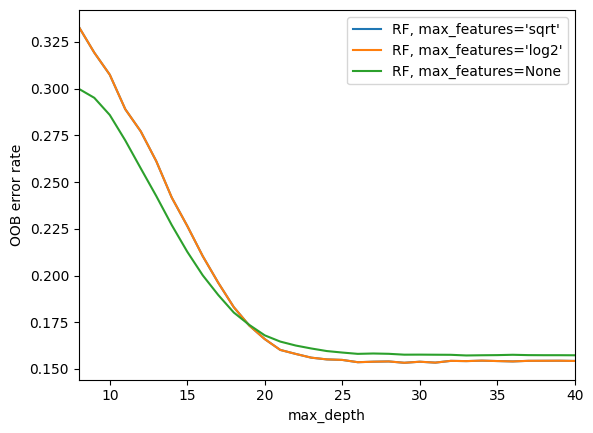

In [133]:
# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(min_depth_, max_depth_)
# plt.xlabel("max_depth")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

In [119]:
# ensemble_clfs = {
#         "RF, max_features='sqrt'": RandomForestClassifier(oob_score=True,max_depth=21,class_weight='balanced',random_state=19),
#         "RF, max_features='log2'": RandomForestClassifier(oob_score=True,max_features='log2',max_depth=21,class_weight='balanced',random_state=19),
#         "RF, max_features=None": RandomForestClassifier(oob_score=True,max_features=None,max_depth=21,class_weight='balanced',random_state=19)
# }

In [124]:
# min_estimators=50
# max_estimators=1000

In [125]:
# error_rate = dict((label, []) for label in ensemble_clfs)
# for label, clf in ensemble_clfs.items():
#     for i in range(min_estimators, max_estimators + 1,10):
#         clf.set_params(n_estimators=i)
#         clf.fit(X_scaled, y_binary)

#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))

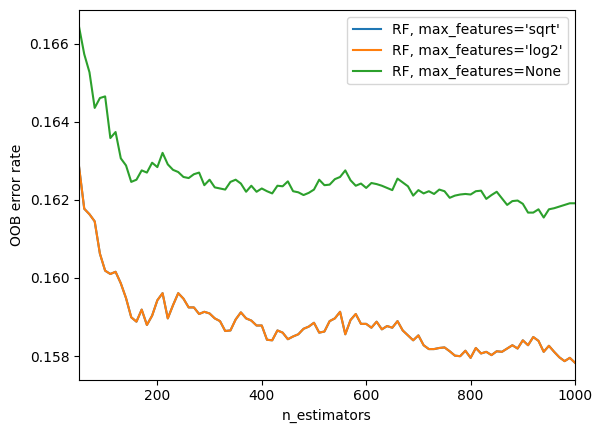

In [126]:
# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(min_estimators, max_estimators)
# plt.xlabel("n_estimators")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

In [134]:
# ensemble_clfs_samples_split = {
#         "RF, max_features='log2'": RandomForestClassifier(oob_score=True,max_features='log2',n_estimators=400,max_depth=21,class_weight='balanced',random_state=19),
#         "RF, max_features=None": RandomForestClassifier(oob_score=True,max_features=None,n_estimators=400,max_depth=21,class_weight='balanced',random_state=19)
# }

In [135]:
# number_min_samples_split=10
# number_max_samples_split=400

In [136]:
# error_rate = dict((label, []) for label in ensemble_clfs_samples_split)
# for label, clf in ensemble_clfs_samples_split.items():
#     for i in range(number_min_samples_split, number_max_samples_split + 1,10):
#         clf.set_params(min_samples_split=i)
#         clf.fit(X_scaled, y_binary)

#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))

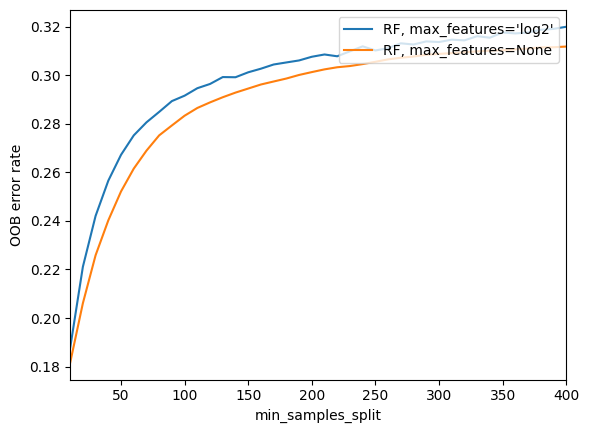

In [137]:
# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(number_min_samples_split, number_max_samples_split)
# plt.xlabel("min_samples_split")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

In [141]:
# number_min_samples_split_1=2
# number_max_samples_split_10=10

In [142]:
# error_rate = dict((label, []) for label in ensemble_clfs_samples_split)
# for label, clf in ensemble_clfs_samples_split.items():
#     for i in range(number_min_samples_split_1, number_max_samples_split_10 + 1):
#         clf.set_params(min_samples_split=i)
#         clf.fit(X_scaled, y_binary)

#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))

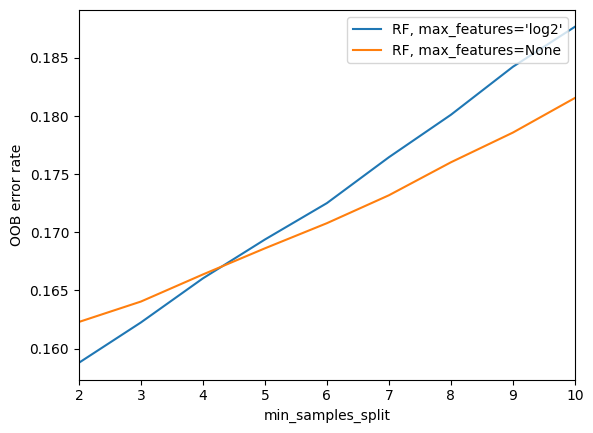

In [143]:
# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(number_min_samples_split_1, number_max_samples_split_10)
# plt.xlabel("min_samples_split")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

In [147]:
# number_min_samples_leaf=1
# number_max_samples_leaf=30

In [148]:
# error_rate = dict((label, []) for label in ensemble_clfs_samples_split)
# for label, clf in ensemble_clfs_samples_split.items():
#     for i in range(number_min_samples_leaf, number_max_samples_leaf + 1):
#         clf.set_params(min_samples_leaf=i)
#         clf.fit(X_scaled, y_binary)

#         oob_error = 1 - clf.oob_score_
#         error_rate[label].append((i, oob_error))

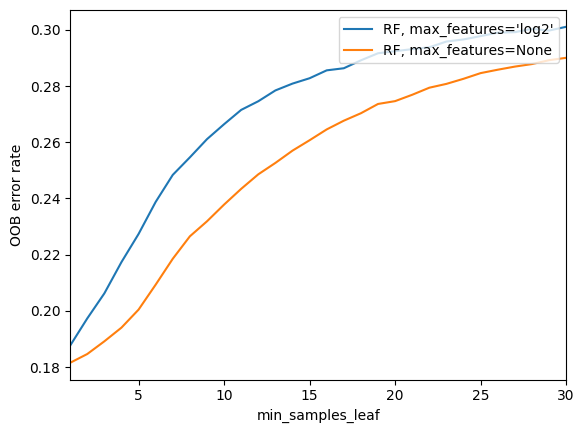

In [149]:
# for label, clf_err in error_rate.items():
#     xs, ys = zip(*clf_err)
#     plt.plot(xs, ys, label=label)

# plt.xlim(number_min_samples_leaf, number_max_samples_leaf)
# plt.xlabel("min_samples_leaf")
# plt.ylabel("OOB error rate")
# plt.legend(loc="upper right")
# plt.show()

### Grid & Randomized Search

In [380]:
# models = [
#     ('rf', RandomForestClassifier(random_state=19))
# ]
 
# hyperparameters = [
#     {
#         'rf__n_estimators': range(200,800,10),
#         'rf__criterion': ['gini', 'entropy'],
#         'rf__max_depth': range(15,20),
#         'rf__min_samples_split': range(10,80),
#         'rf__min_samples_leaf': range(2,15),
#         'rf__max_features': ['sqrt','log2'],
#         'rf__ccp_alpha': [0,0.0001]
#     } 
# ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=400, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])    
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 400 candidates, totalling 4000 fits
[CV 1/10; 1/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=740
[CV 1/10; 1/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=740;, score=0.350 total time=   4.9s
[CV 2/10; 1/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=740
[CV 2/10; 1/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=740;, score=0.352 total time=   5.0s
[CV 3/10; 1/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_spli

[CV 2/10; 3/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=10, rf__n_estimators=740;, score=0.353 total time=   4.9s
[CV 3/10; 3/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=10, rf__n_estimators=740
[CV 3/10; 3/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=10, rf__n_estimators=740;, score=0.367 total time=   4.9s
[CV 4/10; 3/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=10, rf__n_estimators=740
[CV 4/10; 3/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=10, rf__n_estimators=740;, score=0.327 total time=   4.8s
[C

[CV 3/10; 5/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=23, rf__n_estimators=250;, score=0.369 total time=   1.9s
[CV 4/10; 5/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=23, rf__n_estimators=250
[CV 4/10; 5/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=23, rf__n_estimators=250;, score=0.328 total time=   2.0s
[CV 5/10; 5/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=23, rf__n_estimators=250
[CV 5/10; 5/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=23, rf__n_estimators=250;, score=0.338 total time=   1.9s
[CV 6/1

[CV 4/10; 7/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=60, rf__n_estimators=220;, score=0.331 total time=   1.2s
[CV 5/10; 7/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=60, rf__n_estimators=220
[CV 5/10; 7/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=60, rf__n_estimators=220;, score=0.341 total time=   1.2s
[CV 6/10; 7/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=60, rf__n_estimators=220
[CV 6/10; 7/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=60, rf__n_estimators=220;, score=0.351 total time=   1.2s
[CV 7/10; 7/400] START rf__

[CV 6/10; 9/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=72, rf__n_estimators=250;, score=0.352 total time=   1.6s
[CV 7/10; 9/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=72, rf__n_estimators=250
[CV 7/10; 9/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=72, rf__n_estimators=250;, score=0.351 total time=   1.4s
[CV 8/10; 9/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=72, rf__n_estimators=250
[CV 8/10; 9/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=72, rf__n_estimators=250;, score=0.359 total time=   1.4s
[CV 9/10; 9/400] START

[CV 8/10; 11/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=45, rf__n_estimators=220;, score=0.360 total time=   1.2s
[CV 9/10; 11/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=45, rf__n_estimators=220
[CV 9/10; 11/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=45, rf__n_estimators=220;, score=0.341 total time=   1.2s
[CV 10/10; 11/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=45, rf__n_estimators=220
[CV 10/10; 11/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=45, rf__n_estimators=220;, score=0.354 total time=   1.2s
[CV 1/10; 12/400] ST

[CV 10/10; 13/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=74, rf__n_estimators=230;, score=0.353 total time=   1.2s
[CV 1/10; 14/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=67, rf__n_estimators=500
[CV 1/10; 14/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=67, rf__n_estimators=500;, score=0.344 total time=   2.7s
[CV 2/10; 14/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=67, rf__n_estimators=500
[CV 2/10; 14/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=67, rf__n_estimators=500;, score=0.354 total time=   2.7s
[CV 3/10; 14/400

[CV 2/10; 16/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=54, rf__n_estimators=410;, score=0.353 total time=   2.5s
[CV 3/10; 16/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=54, rf__n_estimators=410
[CV 3/10; 16/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=54, rf__n_estimators=410;, score=0.370 total time=   2.5s
[CV 4/10; 16/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=54, rf__n_estimators=410
[CV 4/10; 16/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=54, rf__n_estimators=410;, score=0.330 total time=   2.4s
[CV 5/10; 16/400]

[CV 4/10; 18/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=68, rf__n_estimators=210;, score=0.329 total time=   1.1s
[CV 5/10; 18/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=68, rf__n_estimators=210
[CV 5/10; 18/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=68, rf__n_estimators=210;, score=0.346 total time=   1.2s
[CV 6/10; 18/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=68, rf__n_estimators=210
[CV 6/10; 18/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=68, rf__n_estimators=210;, score=0.349 total time=   1.2s
[C

[CV 6/10; 20/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=52, rf__n_estimators=740;, score=0.353 total time=   4.3s
[CV 7/10; 20/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=52, rf__n_estimators=740
[CV 7/10; 20/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=52, rf__n_estimators=740;, score=0.351 total time=   4.2s
[CV 8/10; 20/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=52, rf__n_estimators=740
[CV 8/10; 20/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=52, rf__n_estimators=740;, score=0.358 total time=   4.

[CV 8/10; 22/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=33, rf__n_estimators=250;, score=0.361 total time=   1.4s
[CV 9/10; 22/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=33, rf__n_estimators=250
[CV 9/10; 22/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=33, rf__n_estimators=250;, score=0.337 total time=   1.5s
[CV 10/10; 22/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=33, rf__n_estimators=250
[CV 10/10; 22/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=33, rf__n_estimators=250;, score=0.355 total time=   1.6s
[CV 1/10; 

[CV 10/10; 24/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=220;, score=0.354 total time=   1.3s
[CV 1/10; 25/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=21, rf__n_estimators=700
[CV 1/10; 25/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=21, rf__n_estimators=700;, score=0.346 total time=   4.3s
[CV 2/10; 25/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=21, rf__n_estimators=700
[CV 2/10; 25/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=21, rf__n_estimators=700;, score=0.355 total time=   4.4s
[CV 3/10

[CV 2/10; 27/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=55, rf__n_estimators=570;, score=0.353 total time=   3.3s
[CV 3/10; 27/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=55, rf__n_estimators=570
[CV 3/10; 27/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=55, rf__n_estimators=570;, score=0.370 total time=   3.4s
[CV 4/10; 27/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=55, rf__n_estimators=570
[CV 4/10; 27/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=55, rf__n_estimators=570;, score=0.328 total time=   3.4s
[CV 5/10; 27/400] START rf__ccp_alpha=0, r

[CV 4/10; 29/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=61, rf__n_estimators=740;, score=0.329 total time=   4.5s
[CV 5/10; 29/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=61, rf__n_estimators=740
[CV 5/10; 29/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=61, rf__n_estimators=740;, score=0.346 total time=   4.3s
[CV 6/10; 29/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=61, rf__n_estimators=740
[CV 6/10; 29/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=61, rf__n_estimators=740;, score=0.350 total time=   4.3s
[C

[CV 6/10; 31/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=35, rf__n_estimators=280;, score=0.350 total time=   1.6s
[CV 7/10; 31/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=35, rf__n_estimators=280
[CV 7/10; 31/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=35, rf__n_estimators=280;, score=0.348 total time=   1.7s
[CV 8/10; 31/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=35, rf__n_estimators=280
[CV 8/10; 31/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=35, rf__n_estimators=280;, score=0.360 total time=   1.6s
[CV 9/10; 31/400]

[CV 8/10; 33/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=32, rf__n_estimators=400;, score=0.360 total time=   2.3s
[CV 9/10; 33/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=32, rf__n_estimators=400
[CV 9/10; 33/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=32, rf__n_estimators=400;, score=0.338 total time=   2.3s
[CV 10/10; 33/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=32, rf__n_estimators=400
[CV 10/10; 33/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=32, rf__n_estimators=400;, score=0.352 total time=   2.3s
[CV 1/10; 

[CV 10/10; 35/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=44, rf__n_estimators=240;, score=0.351 total time=   1.3s
[CV 1/10; 36/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=14, rf__n_estimators=200
[CV 1/10; 36/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=14, rf__n_estimators=200;, score=0.347 total time=   1.2s
[CV 2/10; 36/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=14, rf__n_estimators=200
[CV 2/10; 36/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=14, rf__n_estimators=200;, score=0.353 total time=   1.2s
[CV 3/10; 36/400]

[CV 2/10; 38/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=30, rf__n_estimators=740;, score=0.354 total time=   5.2s
[CV 3/10; 38/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=30, rf__n_estimators=740
[CV 3/10; 38/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=30, rf__n_estimators=740;, score=0.368 total time=   5.0s
[CV 4/10; 38/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=30, rf__n_estimators=740
[CV 4/10; 38/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=30, rf__n_estimators=740;, score=0.330 total time=   4.9s
[CV 5/10; 38/400]

[CV 3/10; 40/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=66, rf__n_estimators=620;, score=0.369 total time=   3.6s
[CV 4/10; 40/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=66, rf__n_estimators=620
[CV 4/10; 40/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=66, rf__n_estimators=620;, score=0.331 total time=   3.6s
[CV 5/10; 40/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=66, rf__n_estimators=620
[CV 5/10; 40/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=66, rf__n_estimators=620;, score=0.343 total time=   3.6s
[C

[CV 4/10; 42/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=70, rf__n_estimators=340;, score=0.329 total time=   1.8s
[CV 5/10; 42/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=70, rf__n_estimators=340
[CV 5/10; 42/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=70, rf__n_estimators=340;, score=0.343 total time=   1.8s
[CV 6/10; 42/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=70, rf__n_estimators=340
[CV 6/10; 42/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=70, rf__n_estimators=340;, score=0.352 total time=   1.8s
[CV 7/10; 42

[CV 5/10; 44/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=33, rf__n_estimators=240;, score=0.341 total time=   1.5s
[CV 6/10; 44/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=33, rf__n_estimators=240
[CV 6/10; 44/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=33, rf__n_estimators=240;, score=0.351 total time=   1.5s
[CV 7/10; 44/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=33, rf__n_estimators=240
[CV 7/10; 44/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=33, rf__n_estimators=240;, score=0.351 total time=   1.

[CV 7/10; 46/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=45, rf__n_estimators=490;, score=0.351 total time=   3.2s
[CV 8/10; 46/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=45, rf__n_estimators=490
[CV 8/10; 46/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=45, rf__n_estimators=490;, score=0.359 total time=   3.1s
[CV 9/10; 46/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=45, rf__n_estimators=490
[CV 9/10; 46/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=45, rf__n_estimators=490;, score=0.340 total time=   3.0s
[C

[CV 9/10; 48/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=14, rf__n_estimators=300;, score=0.339 total time=   2.3s
[CV 10/10; 48/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=14, rf__n_estimators=300
[CV 10/10; 48/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=14, rf__n_estimators=300;, score=0.354 total time=   2.4s
[CV 1/10; 49/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=19, rf__n_estimators=490
[CV 1/10; 49/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=19, rf__n_estimators=490;, score=0.346 total time=   3.1s
[CV 2/10; 49/400] START

[CV 1/10; 51/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=780;, score=0.346 total time=   4.4s
[CV 2/10; 51/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=780
[CV 2/10; 51/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=780;, score=0.356 total time=   4.5s
[CV 3/10; 51/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=780
[CV 3/10; 51/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=780;, score=0.365 total time=   4.7s
[CV 4/10; 51

[CV 2/10; 53/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=12, rf__n_estimators=430;, score=0.354 total time=   3.6s
[CV 3/10; 53/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=12, rf__n_estimators=430
[CV 3/10; 53/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=12, rf__n_estimators=430;, score=0.365 total time=   3.5s
[CV 4/10; 53/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=12, rf__n_estimators=430
[CV 4/10; 53/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=12, rf__n_estimators=430;, score=0.329 total time=   3.4s
[CV 5/10; 53/400] START rf_

[CV 4/10; 55/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=34, rf__n_estimators=720;, score=0.330 total time=   4.3s
[CV 5/10; 55/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=34, rf__n_estimators=720
[CV 5/10; 55/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=34, rf__n_estimators=720;, score=0.343 total time=   4.6s
[CV 6/10; 55/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=34, rf__n_estimators=720
[CV 6/10; 55/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=34, rf__n_estimators=720;, score=0.352 total time=   4.

[CV 6/10; 57/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=11, rf__n_estimators=450;, score=0.356 total time=   2.9s
[CV 7/10; 57/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=11, rf__n_estimators=450
[CV 7/10; 57/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=11, rf__n_estimators=450;, score=0.351 total time=   2.9s
[CV 8/10; 57/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=11, rf__n_estimators=450
[CV 8/10; 57/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=11, rf__n_estimators=450;, score=0.360 total time=   3.1s
[CV 9/10; 57/400] STAR

[CV 8/10; 59/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=38, rf__n_estimators=440;, score=0.364 total time=   2.8s
[CV 9/10; 59/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=38, rf__n_estimators=440
[CV 9/10; 59/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=38, rf__n_estimators=440;, score=0.339 total time=   3.1s
[CV 10/10; 59/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=38, rf__n_estimators=440
[CV 10/10; 59/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=38, rf__n_estimators=440;, score=0.353 total time=   2.9s
[CV 1/10; 60/40

[CV 10/10; 61/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=54, rf__n_estimators=320;, score=0.355 total time=   1.8s
[CV 1/10; 62/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=41, rf__n_estimators=270
[CV 1/10; 62/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=41, rf__n_estimators=270;, score=0.347 total time=   1.8s
[CV 2/10; 62/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=41, rf__n_estimators=270
[CV 2/10; 62/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=41, rf__n_estimators=270;, score=0.355 total time=   1.8s
[CV 3/10; 62/

[CV 2/10; 64/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=240;, score=0.353 total time=   1.3s
[CV 3/10; 64/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=240
[CV 3/10; 64/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=240;, score=0.366 total time=   1.3s
[CV 4/10; 64/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=240
[CV 4/10; 64/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=240;, score=0.331 total time=   1.3s
[CV 5/10; 64/400]

[CV 4/10; 66/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=17, rf__n_estimators=280;, score=0.326 total time=   1.9s
[CV 5/10; 66/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=17, rf__n_estimators=280
[CV 5/10; 66/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=17, rf__n_estimators=280;, score=0.342 total time=   1.8s
[CV 6/10; 66/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=17, rf__n_estimators=280
[CV 6/10; 66/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=17, rf__n_estimators=280;, score=0.355 total time=   1.8s
[CV 7/10; 66/400] START rf__ccp_alpha=0, r

[CV 6/10; 68/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=280;, score=0.351 total time=   1.5s
[CV 7/10; 68/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=280
[CV 7/10; 68/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=280;, score=0.349 total time=   1.5s
[CV 8/10; 68/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=280
[CV 8/10; 68/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=280;, score=0.359 total time=   1.5s
[CV 9/10; 68/400] START rf__ccp_alpha=0, r

[CV 8/10; 70/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=270;, score=0.359 total time=   1.6s
[CV 9/10; 70/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=270
[CV 9/10; 70/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=270;, score=0.341 total time=   1.7s
[CV 10/10; 70/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=270
[CV 10/10; 70/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=270;, score=0.353 total time=   1.6s


[CV 10/10; 72/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=78, rf__n_estimators=390;, score=0.355 total time=   2.3s
[CV 1/10; 73/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=46, rf__n_estimators=600
[CV 1/10; 73/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=46, rf__n_estimators=600;, score=0.349 total time=   3.6s
[CV 2/10; 73/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=46, rf__n_estimators=600
[CV 2/10; 73/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=46, rf__n_estimators=600;, score=0.354 total time=   3.4s
[CV 3/10; 73/400] STAR

[CV 2/10; 75/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=77, rf__n_estimators=680;, score=0.353 total time=   3.7s
[CV 3/10; 75/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=77, rf__n_estimators=680
[CV 3/10; 75/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=77, rf__n_estimators=680;, score=0.366 total time=   3.7s
[CV 4/10; 75/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=77, rf__n_estimators=680
[CV 4/10; 75/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=77, rf__n_estimators=680;, score=0.333 total time=   3.9s
[C

[CV 4/10; 77/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=15, rf__n_estimators=280;, score=0.327 total time=   1.7s
[CV 5/10; 77/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=15, rf__n_estimators=280
[CV 5/10; 77/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=15, rf__n_estimators=280;, score=0.339 total time=   1.9s
[CV 6/10; 77/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=15, rf__n_estimators=280
[CV 6/10; 77/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=15, rf__n_estimators=280;, score=0.355 total time=   2.2s
[CV 7/10; 77/400] START rf__ccp_alpha

[CV 6/10; 79/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=58, rf__n_estimators=780;, score=0.351 total time=   4.6s
[CV 7/10; 79/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=58, rf__n_estimators=780
[CV 7/10; 79/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=58, rf__n_estimators=780;, score=0.352 total time=   4.4s
[CV 8/10; 79/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=58, rf__n_estimators=780
[CV 8/10; 79/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=58, rf__n_estimators=780;, score=0.361 total time=   4.

[CV 8/10; 81/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=490;, score=0.362 total time=   2.8s
[CV 9/10; 81/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=490
[CV 9/10; 81/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=490;, score=0.341 total time=   3.0s
[CV 10/10; 81/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=490
[CV 10/10; 81/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=490;, score=0.355 total time=   2.8s
[CV 1/10; 82/40

[CV 10/10; 83/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=76, rf__n_estimators=480;, score=0.355 total time=   2.8s
[CV 1/10; 84/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=54, rf__n_estimators=330
[CV 1/10; 84/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=54, rf__n_estimators=330;, score=0.347 total time=   1.8s
[CV 2/10; 84/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=54, rf__n_estimators=330
[CV 2/10; 84/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=54, rf__n_estimators=330;, score=0.352 total time=   1.8s
[CV 3/10; 84/

[CV 2/10; 86/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=75, rf__n_estimators=310;, score=0.353 total time=   1.6s
[CV 3/10; 86/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=75, rf__n_estimators=310
[CV 3/10; 86/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=75, rf__n_estimators=310;, score=0.369 total time=   1.6s
[CV 4/10; 86/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=75, rf__n_estimators=310
[CV 4/10; 86/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=75, rf__n_estimators=310;, score=0.333 total time=   1.6s
[CV 5/10; 86/400]

[CV 3/10; 88/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=64, rf__n_estimators=430;, score=0.369 total time=   2.3s
[CV 4/10; 88/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=64, rf__n_estimators=430
[CV 4/10; 88/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=64, rf__n_estimators=430;, score=0.330 total time=   2.3s
[CV 5/10; 88/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=64, rf__n_estimators=430
[CV 5/10; 88/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=64, rf__n_estimators=430;, score=0.344 total time=   2.3s
[CV 6/10; 88/400] START rf_

[CV 5/10; 90/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=46, rf__n_estimators=350;, score=0.341 total time=   2.0s
[CV 6/10; 90/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=46, rf__n_estimators=350
[CV 6/10; 90/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=46, rf__n_estimators=350;, score=0.352 total time=   2.2s
[CV 7/10; 90/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=46, rf__n_estimators=350
[CV 7/10; 90/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=46, rf__n_estimators=350;, score=0.354 total time=   2.2s
[CV 8/10; 90/400] START rf__ccp_alpha=0, r

[CV 7/10; 92/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=37, rf__n_estimators=250;, score=0.352 total time=   1.4s
[CV 8/10; 92/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=37, rf__n_estimators=250
[CV 8/10; 92/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=37, rf__n_estimators=250;, score=0.361 total time=   1.4s
[CV 9/10; 92/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=37, rf__n_estimators=250
[CV 9/10; 92/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=37, rf__n_estimators=250;, score=0.338 total time=   1.4s
[CV 10/10; 92/400] START rf

[CV 9/10; 94/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=57, rf__n_estimators=520;, score=0.336 total time=   3.1s
[CV 10/10; 94/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=57, rf__n_estimators=520
[CV 10/10; 94/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=57, rf__n_estimators=520;, score=0.352 total time=   3.2s
[CV 1/10; 95/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=32, rf__n_estimators=510
[CV 1/10; 95/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=32, rf__n_estimators=510;, score=0.349 total time=   2.9s
[CV 2/10; 95/400] START rf__c

[CV 1/10; 97/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=240;, score=0.348 total time=   1.4s
[CV 2/10; 97/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=240
[CV 2/10; 97/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=240;, score=0.352 total time=   1.3s
[CV 3/10; 97/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=240
[CV 3/10; 97/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=240;, score=0.367 total time=   1.3s
[CV 4/10; 97/400]

[CV 3/10; 99/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=65, rf__n_estimators=610;, score=0.370 total time=   3.4s
[CV 4/10; 99/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=65, rf__n_estimators=610
[CV 4/10; 99/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=65, rf__n_estimators=610;, score=0.329 total time=   3.3s
[CV 5/10; 99/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=65, rf__n_estimators=610
[CV 5/10; 99/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=65, rf__n_estimators=610;, score=0.346 total time=   3.3s
[CV 6/10; 99/400] START rf__ccp_alpha=0, r

[CV 5/10; 101/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=27, rf__n_estimators=680;, score=0.344 total time=   4.1s
[CV 6/10; 101/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=27, rf__n_estimators=680
[CV 6/10; 101/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=27, rf__n_estimators=680;, score=0.351 total time=   4.0s
[CV 7/10; 101/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=27, rf__n_estimators=680
[CV 7/10; 101/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=27, rf__n_estimators=680;, score=0.353 total time=   3.9s
[CV 8/1

[CV 7/10; 103/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=69, rf__n_estimators=660;, score=0.351 total time=   3.7s
[CV 8/10; 103/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=69, rf__n_estimators=660
[CV 8/10; 103/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=69, rf__n_estimators=660;, score=0.358 total time=   3.6s
[CV 9/10; 103/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=69, rf__n_estimators=660
[CV 9/10; 103/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=69, rf__n_estimators=660;, score=0.344 total time=   3.6s
[CV 10/10; 1

[CV 9/10; 105/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=42, rf__n_estimators=690;, score=0.339 total time=   4.5s
[CV 10/10; 105/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=42, rf__n_estimators=690
[CV 10/10; 105/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=42, rf__n_estimators=690;, score=0.354 total time=   4.4s
[CV 1/10; 106/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=46, rf__n_estimators=690
[CV 1/10; 106/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=46, rf__n_estimators=690;, score=0.348 total time=   4.0s
[CV 2/10

[CV 1/10; 108/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=24, rf__n_estimators=710;, score=0.348 total time=   4.7s
[CV 2/10; 108/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=24, rf__n_estimators=710
[CV 2/10; 108/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=24, rf__n_estimators=710;, score=0.355 total time=   4.7s
[CV 3/10; 108/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=24, rf__n_estimators=710
[CV 3/10; 108/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=24, rf__n_estimators=710;, score=0.370 total time=

[CV 2/10; 110/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=15, rf__n_estimators=650;, score=0.358 total time=   4.8s
[CV 3/10; 110/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=15, rf__n_estimators=650
[CV 3/10; 110/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=15, rf__n_estimators=650;, score=0.370 total time=   4.7s
[CV 4/10; 110/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=15, rf__n_estimators=650
[CV 4/10; 110/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=15, rf__n_estimators=650;, score=0.327 total time=   5.0s
[CV 5/10; 110/400] START rf__ccp_alph

[CV 4/10; 112/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=60, rf__n_estimators=220;, score=0.327 total time=   1.2s
[CV 5/10; 112/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=60, rf__n_estimators=220
[CV 5/10; 112/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=60, rf__n_estimators=220;, score=0.344 total time=   1.2s
[CV 6/10; 112/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=60, rf__n_estimators=220
[CV 6/10; 112/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=60, rf__n_estimators=220;, score=0.352 total time=   1.2s
[CV 7/10; 11

[CV 5/10; 114/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=36, rf__n_estimators=770;, score=0.343 total time=   4.8s
[CV 6/10; 114/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=36, rf__n_estimators=770
[CV 6/10; 114/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=36, rf__n_estimators=770;, score=0.352 total time=   4.7s
[CV 7/10; 114/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=36, rf__n_estimators=770
[CV 7/10; 114/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=36, rf__n_estimators=770;, score=0.352 total time=   4.6s
[CV 8/10; 11

[CV 7/10; 116/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=26, rf__n_estimators=670;, score=0.354 total time=   4.5s
[CV 8/10; 116/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=26, rf__n_estimators=670
[CV 8/10; 116/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=26, rf__n_estimators=670;, score=0.357 total time=   4.2s
[CV 9/10; 116/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=26, rf__n_estimators=670
[CV 9/10; 116/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=26, rf__n_estimators=670;, score=0.339 total time=   4.2s
[CV 10/

[CV 8/10; 118/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=34, rf__n_estimators=300;, score=0.362 total time=   1.8s
[CV 9/10; 118/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=34, rf__n_estimators=300
[CV 9/10; 118/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=34, rf__n_estimators=300;, score=0.339 total time=   1.9s
[CV 10/10; 118/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=34, rf__n_estimators=300
[CV 10/10; 118/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=34, rf__n_estimators=300;, score=0.353 total time=   

[CV 9/10; 120/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=51, rf__n_estimators=620;, score=0.338 total time=   4.1s
[CV 10/10; 120/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=51, rf__n_estimators=620
[CV 10/10; 120/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=51, rf__n_estimators=620;, score=0.353 total time=   3.9s
[CV 1/10; 121/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=64, rf__n_estimators=510
[CV 1/10; 121/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=64, rf__n_estimators=510;, score=0.347 total time=   

[CV 1/10; 123/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=75, rf__n_estimators=530;, score=0.346 total time=   3.0s
[CV 2/10; 123/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=75, rf__n_estimators=530
[CV 2/10; 123/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=75, rf__n_estimators=530;, score=0.353 total time=   3.0s
[CV 3/10; 123/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=75, rf__n_estimators=530
[CV 3/10; 123/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=75, rf__n_estimators=530;, score=0.367 total time=

[CV 3/10; 125/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=21, rf__n_estimators=700;, score=0.366 total time=   4.8s
[CV 4/10; 125/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=21, rf__n_estimators=700
[CV 4/10; 125/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=21, rf__n_estimators=700;, score=0.329 total time=   4.7s
[CV 5/10; 125/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=21, rf__n_estimators=700
[CV 5/10; 125/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=21, rf__n_estimators=700;, score=0.339 total time=   4.8s
[CV 6/10; 125/400] STA

[CV 5/10; 127/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=410;, score=0.342 total time=   2.4s
[CV 6/10; 127/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=410
[CV 6/10; 127/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=410;, score=0.351 total time=   2.3s
[CV 7/10; 127/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=410
[CV 7/10; 127/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=410;, score=0.352 total time=   2.2s
[CV 8/10; 127/400] START rf__ccp_alph

[CV 7/10; 129/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=770;, score=0.351 total time=   4.5s
[CV 8/10; 129/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=770
[CV 8/10; 129/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=770;, score=0.359 total time=   4.6s
[CV 9/10; 129/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=770
[CV 9/10; 129/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=50, rf__n_estimators=770;, score=0.340 total time=   4.4s
[CV 10/10; 1

[CV 9/10; 131/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=47, rf__n_estimators=710;, score=0.339 total time=   3.9s
[CV 10/10; 131/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=47, rf__n_estimators=710
[CV 10/10; 131/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=47, rf__n_estimators=710;, score=0.352 total time=   4.2s
[CV 1/10; 132/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=730
[CV 1/10; 132/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=45, rf__n_estimators=730;, score=0.348 total time=   4.4s
[CV 2/10; 132/400] START rf__ccp

[CV 1/10; 134/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=30, rf__n_estimators=210;, score=0.348 total time=   1.2s
[CV 2/10; 134/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=30, rf__n_estimators=210
[CV 2/10; 134/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=30, rf__n_estimators=210;, score=0.356 total time=   1.3s
[CV 3/10; 134/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=30, rf__n_estimators=210
[CV 3/10; 134/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=30, rf__n_estimators=210;, score=0.372 total time=

[CV 2/10; 136/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=16, rf__n_estimators=600;, score=0.353 total time=   4.5s
[CV 3/10; 136/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=16, rf__n_estimators=600
[CV 3/10; 136/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=16, rf__n_estimators=600;, score=0.368 total time=   4.7s
[CV 4/10; 136/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=16, rf__n_estimators=600
[CV 4/10; 136/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=16, rf__n_estimators=600;, score=0.329 total time=   4.

[CV 3/10; 138/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=790;, score=0.371 total time=   5.4s
[CV 4/10; 138/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=790
[CV 4/10; 138/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=790;, score=0.331 total time=   5.4s
[CV 5/10; 138/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=790
[CV 5/10; 138/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=790;, score=0.337 total time=   5.6s
[CV 6/10; 138/400] STA

[CV 4/10; 140/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=39, rf__n_estimators=680;, score=0.330 total time=   4.1s
[CV 5/10; 140/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=39, rf__n_estimators=680
[CV 5/10; 140/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=39, rf__n_estimators=680;, score=0.340 total time=   4.2s
[CV 6/10; 140/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=39, rf__n_estimators=680
[CV 6/10; 140/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=39, rf__n_estimators=680;, score=0.351 total time=

[CV 6/10; 142/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=59, rf__n_estimators=500;, score=0.352 total time=   2.7s
[CV 7/10; 142/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=59, rf__n_estimators=500
[CV 7/10; 142/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=59, rf__n_estimators=500;, score=0.350 total time=   2.6s
[CV 8/10; 142/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=59, rf__n_estimators=500
[CV 8/10; 142/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=59, rf__n_estimators=500;, score=0.359 total time=   2.7s
[CV 9/10; 142/400] START rf__ccp

[CV 8/10; 144/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=52, rf__n_estimators=590;, score=0.360 total time=   3.6s
[CV 9/10; 144/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=52, rf__n_estimators=590
[CV 9/10; 144/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=52, rf__n_estimators=590;, score=0.342 total time=   3.9s
[CV 10/10; 144/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=52, rf__n_estimators=590
[CV 10/10; 144/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=52, rf__n_estimators=590;, score=0.352 total time=   

[CV 10/10; 146/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=57, rf__n_estimators=730;, score=0.356 total time=   4.6s
[CV 1/10; 147/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=62, rf__n_estimators=540
[CV 1/10; 147/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=62, rf__n_estimators=540;, score=0.348 total time=   3.0s
[CV 2/10; 147/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=62, rf__n_estimators=540
[CV 2/10; 147/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=62, rf__n_estimators=540;, score=0.354 total time=   3.0s
[CV 3/10; 1

[CV 2/10; 149/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=490;, score=0.353 total time=   3.0s
[CV 3/10; 149/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=490
[CV 3/10; 149/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=490;, score=0.370 total time=   2.9s
[CV 4/10; 149/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=490
[CV 4/10; 149/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=490;, score=0.332 total time=

[CV 3/10; 151/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=21, rf__n_estimators=510;, score=0.369 total time=   3.5s
[CV 4/10; 151/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=21, rf__n_estimators=510
[CV 4/10; 151/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=21, rf__n_estimators=510;, score=0.332 total time=   3.5s
[CV 5/10; 151/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=21, rf__n_estimators=510
[CV 5/10; 151/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=21, rf__n_estimators=510;, score=0.339 total time=   3.

[CV 5/10; 153/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=27, rf__n_estimators=780;, score=0.339 total time=   5.0s
[CV 6/10; 153/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=27, rf__n_estimators=780
[CV 6/10; 153/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=27, rf__n_estimators=780;, score=0.355 total time=   4.8s
[CV 7/10; 153/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=27, rf__n_estimators=780
[CV 7/10; 153/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=27, rf__n_estimators=780;, score=0.350 total time=   4.8s
[CV 8/10; 153/400] START rf__ccp

[CV 7/10; 155/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=390;, score=0.353 total time=   3.2s
[CV 8/10; 155/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=390
[CV 8/10; 155/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=390;, score=0.362 total time=   3.2s
[CV 9/10; 155/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=390
[CV 9/10; 155/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=390;, score=0.338 total time=   3.1s
[CV 10/10; 1

[CV 8/10; 157/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=31, rf__n_estimators=570;, score=0.361 total time=   3.4s
[CV 9/10; 157/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=31, rf__n_estimators=570
[CV 9/10; 157/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=31, rf__n_estimators=570;, score=0.339 total time=   3.7s
[CV 10/10; 157/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=31, rf__n_estimators=570
[CV 10/10; 157/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=31, rf__n_estimators=570;, score=0.354 total tim

[CV 10/10; 159/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=15, rf__n_estimators=600;, score=0.353 total time=   5.2s
[CV 1/10; 160/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=71, rf__n_estimators=680
[CV 1/10; 160/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=71, rf__n_estimators=680;, score=0.346 total time=   3.6s
[CV 2/10; 160/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=71, rf__n_estimators=680
[CV 2/10; 160/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=71, rf__n_estimators=680;, score=0.352 total time=   3.

[CV 1/10; 162/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=50, rf__n_estimators=330;, score=0.345 total time=   1.8s
[CV 2/10; 162/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=50, rf__n_estimators=330
[CV 2/10; 162/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=50, rf__n_estimators=330;, score=0.355 total time=   1.8s
[CV 3/10; 162/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=50, rf__n_estimators=330
[CV 3/10; 162/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=50, rf__n_estimators=330;, score=0.368 total time=

[CV 2/10; 164/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=27, rf__n_estimators=560;, score=0.355 total time=   3.9s
[CV 3/10; 164/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=27, rf__n_estimators=560
[CV 3/10; 164/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=27, rf__n_estimators=560;, score=0.370 total time=   3.7s
[CV 4/10; 164/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=27, rf__n_estimators=560
[CV 4/10; 164/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=27, rf__n_estimators=560;, score=0.330 total time=   3.7s
[CV 5/10; 16

[CV 3/10; 166/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=36, rf__n_estimators=440;, score=0.369 total time=   3.0s
[CV 4/10; 166/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=36, rf__n_estimators=440
[CV 4/10; 166/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=36, rf__n_estimators=440;, score=0.331 total time=   2.9s
[CV 5/10; 166/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=36, rf__n_estimators=440
[CV 5/10; 166/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=7, rf__min_samples_split=36, rf__n_estimators=440;, score=0.340 total time=   2.

[CV 4/10; 168/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=23, rf__n_estimators=260;, score=0.330 total time=   1.8s
[CV 5/10; 168/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=23, rf__n_estimators=260
[CV 5/10; 168/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=23, rf__n_estimators=260;, score=0.339 total time=   1.7s
[CV 6/10; 168/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=23, rf__n_estimators=260
[CV 6/10; 168/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=23, rf__n_estimators=260;, score=0.350 total time=

[CV 6/10; 170/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=29, rf__n_estimators=570;, score=0.352 total time=   3.8s
[CV 7/10; 170/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=29, rf__n_estimators=570
[CV 7/10; 170/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=29, rf__n_estimators=570;, score=0.350 total time=   4.0s
[CV 8/10; 170/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=29, rf__n_estimators=570
[CV 8/10; 170/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=29, rf__n_estimators=570;, score=0.363 total time=   4.0s
[CV 9/10; 170/400] START rf__ccp_alph

[CV 8/10; 172/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=56, rf__n_estimators=640;, score=0.360 total time=   4.0s
[CV 9/10; 172/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=56, rf__n_estimators=640
[CV 9/10; 172/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=56, rf__n_estimators=640;, score=0.339 total time=   3.7s
[CV 10/10; 172/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=56, rf__n_estimators=640
[CV 10/10; 172/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=56, rf__n_estimators=640;, score=0.355 total time=   

[CV 9/10; 174/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=12, rf__n_estimators=300;, score=0.340 total time=   2.0s
[CV 10/10; 174/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=12, rf__n_estimators=300
[CV 10/10; 174/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=12, rf__n_estimators=300;, score=0.353 total time=   2.0s
[CV 1/10; 175/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=730
[CV 1/10; 175/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=730;, score=0.349 total time=

[CV 10/10; 176/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=22, rf__n_estimators=250;, score=0.355 total time=   1.7s
[CV 1/10; 177/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=11, rf__n_estimators=230
[CV 1/10; 177/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=11, rf__n_estimators=230;, score=0.347 total time=   2.0s
[CV 2/10; 177/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=11, rf__n_estimators=230
[CV 2/10; 177/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=5, rf__min_samples_split=11, rf__n_estimators=230;, score=0.347 total time=   

[CV 1/10; 179/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=38, rf__n_estimators=590;, score=0.350 total time=   3.5s
[CV 2/10; 179/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=38, rf__n_estimators=590
[CV 2/10; 179/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=38, rf__n_estimators=590;, score=0.357 total time=   3.6s
[CV 3/10; 179/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=38, rf__n_estimators=590
[CV 3/10; 179/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=38, rf__n_estimators=590;, score=0.371 total time=   3.7s
[CV 4/10; 179/400] START rf__ccp_alph

[CV 3/10; 181/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=78, rf__n_estimators=440;, score=0.368 total time=   2.2s
[CV 4/10; 181/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=78, rf__n_estimators=440
[CV 4/10; 181/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=78, rf__n_estimators=440;, score=0.331 total time=   2.2s
[CV 5/10; 181/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=78, rf__n_estimators=440
[CV 5/10; 181/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=78, rf__n_estimators=440;, score=0.344 total time=   2.2s
[CV 6/1

[CV 5/10; 183/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=37, rf__n_estimators=370;, score=0.340 total time=   2.4s
[CV 6/10; 183/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=37, rf__n_estimators=370
[CV 6/10; 183/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=37, rf__n_estimators=370;, score=0.352 total time=   2.4s
[CV 7/10; 183/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=37, rf__n_estimators=370
[CV 7/10; 183/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=37, rf__n_estimators=370;, score=0.351 total time=   2.4s
[CV 8/10; 18

[CV 7/10; 185/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=760;, score=0.352 total time=   4.8s
[CV 8/10; 185/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=760
[CV 8/10; 185/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=760;, score=0.361 total time=   4.5s
[CV 9/10; 185/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=760
[CV 9/10; 185/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=53, rf__n_estimators=760;, score=0.337 total time=   4.5s
[CV 10/10; 1

[CV 9/10; 187/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=670;, score=0.341 total time=   4.6s
[CV 10/10; 187/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=670
[CV 10/10; 187/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=14, rf__n_estimators=670;, score=0.354 total time=   4.4s
[CV 1/10; 188/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=76, rf__n_estimators=760
[CV 1/10; 188/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=76, rf__n_estimators=760;, score=0.348 total time=   4.1s
[CV 2/10; 188/400] START rf__

[CV 1/10; 190/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=66, rf__n_estimators=210;, score=0.349 total time=   1.1s
[CV 2/10; 190/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=66, rf__n_estimators=210
[CV 2/10; 190/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=66, rf__n_estimators=210;, score=0.355 total time=   1.1s
[CV 3/10; 190/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=66, rf__n_estimators=210
[CV 3/10; 190/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=66, rf__n_estimators=210;, score=0.367 total time=   1.0s
[CV 4/10; 190/400] START rf__ccp

[CV 3/10; 192/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=70, rf__n_estimators=640;, score=0.367 total time=   3.5s
[CV 4/10; 192/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=70, rf__n_estimators=640
[CV 4/10; 192/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=70, rf__n_estimators=640;, score=0.331 total time=   3.4s
[CV 5/10; 192/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=70, rf__n_estimators=640
[CV 5/10; 192/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=70, rf__n_estimators=640;, score=0.344 total time=

[CV 4/10; 194/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=22, rf__n_estimators=380;, score=0.327 total time=   2.6s
[CV 5/10; 194/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=22, rf__n_estimators=380
[CV 5/10; 194/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=22, rf__n_estimators=380;, score=0.339 total time=   2.6s
[CV 6/10; 194/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=22, rf__n_estimators=380
[CV 6/10; 194/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=22, rf__n_estimators=380;, score=0.351 total time=   2.6s
[CV 7/10; 19

[CV 6/10; 196/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=68, rf__n_estimators=790;, score=0.350 total time=   4.6s
[CV 7/10; 196/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=68, rf__n_estimators=790
[CV 7/10; 196/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=68, rf__n_estimators=790;, score=0.351 total time=   4.3s
[CV 8/10; 196/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=68, rf__n_estimators=790
[CV 8/10; 196/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=68, rf__n_estimators=790;, score=0.362 total time=   4.3s
[CV 9/10; 196/400] START rf__ccp_alph

[CV 8/10; 198/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=71, rf__n_estimators=740;, score=0.358 total time=   3.9s
[CV 9/10; 198/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=71, rf__n_estimators=740
[CV 9/10; 198/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=71, rf__n_estimators=740;, score=0.342 total time=   3.9s
[CV 10/10; 198/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=71, rf__n_estimators=740
[CV 10/10; 198/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=71, rf__n_estimators=740;, score=0.354 total time=   4.1s
[CV 1

[CV 10/10; 200/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=48, rf__n_estimators=760;, score=0.354 total time=   4.6s
[CV 1/10; 201/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=69, rf__n_estimators=250
[CV 1/10; 201/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=69, rf__n_estimators=250;, score=0.349 total time=   1.3s
[CV 2/10; 201/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=69, rf__n_estimators=250
[CV 2/10; 201/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=69, rf__n_estimators=250;, score=0.350 total time=   1.3s
[CV 3/10; 201/4

[CV 2/10; 203/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=370;, score=0.359 total time=   3.1s
[CV 3/10; 203/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=370
[CV 3/10; 203/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=370;, score=0.369 total time=   3.0s
[CV 4/10; 203/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=370
[CV 4/10; 203/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=370;, score=0.327 total time=   3.1s
[CV 5/10; 20

[CV 4/10; 205/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=700;, score=0.331 total time=   4.0s
[CV 5/10; 205/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=700
[CV 5/10; 205/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=700;, score=0.344 total time=   3.9s
[CV 6/10; 205/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=700
[CV 6/10; 205/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=43, rf__n_estimators=700;, score=0.352 total time=   4.3s
[CV 7/1

[CV 6/10; 207/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=53, rf__n_estimators=370;, score=0.352 total time=   2.1s
[CV 7/10; 207/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=53, rf__n_estimators=370
[CV 7/10; 207/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=53, rf__n_estimators=370;, score=0.352 total time=   2.2s
[CV 8/10; 207/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=53, rf__n_estimators=370
[CV 8/10; 207/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=53, rf__n_estimators=370;, score=0.357 total time=   2.1s
[CV 9/10; 20

[CV 8/10; 209/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=33, rf__n_estimators=600;, score=0.360 total time=   3.7s
[CV 9/10; 209/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=33, rf__n_estimators=600
[CV 9/10; 209/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=33, rf__n_estimators=600;, score=0.340 total time=   3.5s
[CV 10/10; 209/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=33, rf__n_estimators=600
[CV 10/10; 209/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=33, rf__n_estimators=600;, score=0.354 total tim

[CV 10/10; 211/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=38, rf__n_estimators=650;, score=0.357 total time=   4.2s
[CV 1/10; 212/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=44, rf__n_estimators=380
[CV 1/10; 212/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=44, rf__n_estimators=380;, score=0.349 total time=   2.3s
[CV 2/10; 212/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=44, rf__n_estimators=380
[CV 2/10; 212/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=44, rf__n_estimators=380;, score=0.356 total time=   2.2s
[CV 3/10; 212/400] START rf

[CV 2/10; 214/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=33, rf__n_estimators=200;, score=0.353 total time=   1.2s
[CV 3/10; 214/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=33, rf__n_estimators=200
[CV 3/10; 214/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=33, rf__n_estimators=200;, score=0.367 total time=   1.2s
[CV 4/10; 214/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=33, rf__n_estimators=200
[CV 4/10; 214/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=33, rf__n_estimators=200;, score=0.328 total time=   1.2s
[CV 5/10; 21

[CV 4/10; 216/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=38, rf__n_estimators=260;, score=0.328 total time=   1.6s
[CV 5/10; 216/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=38, rf__n_estimators=260
[CV 5/10; 216/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=38, rf__n_estimators=260;, score=0.343 total time=   1.6s
[CV 6/10; 216/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=38, rf__n_estimators=260
[CV 6/10; 216/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=38, rf__n_estimators=260;, score=0.350 total time=   1.5s
[CV 7/10; 21

[CV 6/10; 218/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=58, rf__n_estimators=440;, score=0.351 total time=   2.9s
[CV 7/10; 218/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=58, rf__n_estimators=440
[CV 7/10; 218/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=58, rf__n_estimators=440;, score=0.350 total time=   2.7s
[CV 8/10; 218/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=58, rf__n_estimators=440
[CV 8/10; 218/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=58, rf__n_estimators=440;, score=0.359 total time=   2.

[CV 8/10; 220/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=600;, score=0.358 total time=   3.5s
[CV 9/10; 220/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=600
[CV 9/10; 220/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=600;, score=0.340 total time=   3.5s
[CV 10/10; 220/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=600
[CV 10/10; 220/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=26, rf__n_estimators=600;, score=0.355 total time=   3.5s
[CV 1

[CV 10/10; 222/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=73, rf__n_estimators=420;, score=0.352 total time=   2.1s
[CV 1/10; 223/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=47, rf__n_estimators=560
[CV 1/10; 223/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=47, rf__n_estimators=560;, score=0.350 total time=   3.4s
[CV 2/10; 223/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=47, rf__n_estimators=560
[CV 2/10; 223/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=47, rf__n_estimators=560;, score=0.354 total time=   3.4s
[CV 3/10; 223/400] STAR

[CV 2/10; 225/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=790;, score=0.354 total time=   5.1s
[CV 3/10; 225/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=790
[CV 3/10; 225/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=790;, score=0.370 total time=   4.7s
[CV 4/10; 225/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=790
[CV 4/10; 225/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=31, rf__n_estimators=790;, score=0.329 total time=   4.7s
[CV 5/10; 225/400

[CV 4/10; 227/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=29, rf__n_estimators=300;, score=0.329 total time=   1.8s
[CV 5/10; 227/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=29, rf__n_estimators=300
[CV 5/10; 227/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=29, rf__n_estimators=300;, score=0.341 total time=   1.8s
[CV 6/10; 227/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=29, rf__n_estimators=300
[CV 6/10; 227/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=29, rf__n_estimators=300;, score=0.354 total time=

[CV 6/10; 229/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=42, rf__n_estimators=630;, score=0.351 total time=   3.6s
[CV 7/10; 229/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=42, rf__n_estimators=630
[CV 7/10; 229/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=42, rf__n_estimators=630;, score=0.352 total time=   3.6s
[CV 8/10; 229/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=42, rf__n_estimators=630
[CV 8/10; 229/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=42, rf__n_estimators=630;, score=0.359 total time=

[CV 7/10; 231/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=25, rf__n_estimators=590;, score=0.350 total time=   3.5s
[CV 8/10; 231/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=25, rf__n_estimators=590
[CV 8/10; 231/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=25, rf__n_estimators=590;, score=0.358 total time=   3.6s
[CV 9/10; 231/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=25, rf__n_estimators=590
[CV 9/10; 231/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=25, rf__n_estimators=590;, score=0.336 total time=   3.8s
[CV 10/10; 231/40

[CV 9/10; 233/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=16, rf__n_estimators=670;, score=0.338 total time=   5.5s
[CV 10/10; 233/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=16, rf__n_estimators=670
[CV 10/10; 233/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=16, rf__n_estimators=670;, score=0.354 total time=   5.1s
[CV 1/10; 234/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=290
[CV 1/10; 234/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=61, rf__n_estimators=290;, score=0.346 total time=   1.6s
[

[CV 1/10; 236/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=76, rf__n_estimators=730;, score=0.348 total time=   4.2s
[CV 2/10; 236/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=76, rf__n_estimators=730
[CV 2/10; 236/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=76, rf__n_estimators=730;, score=0.353 total time=   4.2s
[CV 3/10; 236/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=76, rf__n_estimators=730
[CV 3/10; 236/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=76, rf__n_estimators=730;, score=0.368 total time=   4.

[CV 2/10; 238/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=460;, score=0.354 total time=   2.7s
[CV 3/10; 238/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=460
[CV 3/10; 238/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=460;, score=0.372 total time=   2.9s
[CV 4/10; 238/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=460
[CV 4/10; 238/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=460;, score=0.331 total time=   2.

[CV 4/10; 240/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=50, rf__n_estimators=370;, score=0.330 total time=   2.1s
[CV 5/10; 240/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=50, rf__n_estimators=370
[CV 5/10; 240/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=50, rf__n_estimators=370;, score=0.345 total time=   2.1s
[CV 6/10; 240/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=50, rf__n_estimators=370
[CV 6/10; 240/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=50, rf__n_estimators=370;, score=0.353 total time=   2.1s
[CV 7/1

[CV 6/10; 242/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=790;, score=0.349 total time=   4.4s
[CV 7/10; 242/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=790
[CV 7/10; 242/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=790;, score=0.351 total time=   4.6s
[CV 8/10; 242/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=790
[CV 8/10; 242/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=790;, score=0.359 total time=   4.5s
[CV 9/1

[CV 8/10; 244/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=24, rf__n_estimators=480;, score=0.361 total time=   3.4s
[CV 9/10; 244/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=24, rf__n_estimators=480
[CV 9/10; 244/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=24, rf__n_estimators=480;, score=0.339 total time=   3.2s
[CV 10/10; 244/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=24, rf__n_estimators=480
[CV 10/10; 244/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=24, rf__n_estimators=480;, score=0.357 total time=   3.2s
[CV 1/10; 245/400] START rf__ccp_al

[CV 10/10; 246/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=27, rf__n_estimators=580;, score=0.354 total time=   3.7s
[CV 1/10; 247/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=21, rf__n_estimators=620
[CV 1/10; 247/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=21, rf__n_estimators=620;, score=0.346 total time=   4.9s
[CV 2/10; 247/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=21, rf__n_estimators=620
[CV 2/10; 247/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=2, rf__min_samples_split=21, rf__n_estimators=620;, score=0.355 total time=   4.6s
[CV 3/10; 247/400] START

[CV 2/10; 249/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=76, rf__n_estimators=710;, score=0.356 total time=   3.9s
[CV 3/10; 249/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=76, rf__n_estimators=710
[CV 3/10; 249/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=76, rf__n_estimators=710;, score=0.368 total time=   4.0s
[CV 4/10; 249/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=76, rf__n_estimators=710
[CV 4/10; 249/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=76, rf__n_estimators=710;, score=0.329 total time=   3.

[CV 4/10; 251/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=58, rf__n_estimators=210;, score=0.334 total time=   1.0s
[CV 5/10; 251/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=58, rf__n_estimators=210
[CV 5/10; 251/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=58, rf__n_estimators=210;, score=0.341 total time=   1.1s
[CV 6/10; 251/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=58, rf__n_estimators=210
[CV 6/10; 251/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=58, rf__n_estimators=210;, score=0.351 total time=   1.1s
[CV 7/10; 251/400] START rf__ccp

[CV 6/10; 253/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=67, rf__n_estimators=630;, score=0.351 total time=   3.8s
[CV 7/10; 253/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=67, rf__n_estimators=630
[CV 7/10; 253/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=67, rf__n_estimators=630;, score=0.350 total time=   3.6s
[CV 8/10; 253/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=67, rf__n_estimators=630
[CV 8/10; 253/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=67, rf__n_estimators=630;, score=0.361 total time=   3.5s
[CV 9/10; 253/400] START rf__ccp_alph

[CV 8/10; 255/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=44, rf__n_estimators=730;, score=0.360 total time=   4.3s
[CV 9/10; 255/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=44, rf__n_estimators=730
[CV 9/10; 255/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=44, rf__n_estimators=730;, score=0.339 total time=   4.6s
[CV 10/10; 255/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=44, rf__n_estimators=730
[CV 10/10; 255/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=44, rf__n_estimators=730;, score=0.356 total time=   4.3s
[CV 1/10; 256/400] S

[CV 10/10; 257/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=49, rf__n_estimators=430;, score=0.356 total time=   2.4s
[CV 1/10; 258/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=61, rf__n_estimators=410
[CV 1/10; 258/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=61, rf__n_estimators=410;, score=0.346 total time=   2.2s
[CV 2/10; 258/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=61, rf__n_estimators=410
[CV 2/10; 258/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=61, rf__n_estimators=410;, score=0.352 total time=   2.2s
[CV 3/

[CV 1/10; 260/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=14, rf__n_estimators=250;, score=0.345 total time=   1.8s
[CV 2/10; 260/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=14, rf__n_estimators=250
[CV 2/10; 260/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=14, rf__n_estimators=250;, score=0.352 total time=   1.9s
[CV 3/10; 260/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=14, rf__n_estimators=250
[CV 3/10; 260/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=14, rf__n_estimators=250;, score=0.367 total time=   1.8s
[CV 4/10; 260/400] START rf__ccp_alph

[CV 3/10; 262/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=380;, score=0.368 total time=   2.2s
[CV 4/10; 262/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=380
[CV 4/10; 262/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=380;, score=0.333 total time=   2.2s
[CV 5/10; 262/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=380
[CV 5/10; 262/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=69, rf__n_estimators=380;, score=0.345 total time=   2.0s
[CV 6/10; 26

[CV 4/10; 264/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=19, rf__n_estimators=700;, score=0.330 total time=   5.1s
[CV 5/10; 264/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=19, rf__n_estimators=700
[CV 5/10; 264/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=19, rf__n_estimators=700;, score=0.338 total time=   5.5s
[CV 6/10; 264/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=19, rf__n_estimators=700
[CV 6/10; 264/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=19, rf__n_estimators=700;, score=0.353 total time=   5.3s
[CV 7/10; 264/400] START rf__ccp_alph

[CV 6/10; 266/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=58, rf__n_estimators=720;, score=0.351 total time=   4.1s
[CV 7/10; 266/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=58, rf__n_estimators=720
[CV 7/10; 266/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=58, rf__n_estimators=720;, score=0.353 total time=   3.9s
[CV 8/10; 266/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=58, rf__n_estimators=720
[CV 8/10; 266/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=58, rf__n_estimators=720;, score=0.357 total time=   3.9s
[CV 9/10; 266/400] START rf__ccp

[CV 8/10; 268/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=75, rf__n_estimators=480;, score=0.361 total time=   2.6s
[CV 9/10; 268/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=75, rf__n_estimators=480
[CV 9/10; 268/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=75, rf__n_estimators=480;, score=0.339 total time=   2.6s
[CV 10/10; 268/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=75, rf__n_estimators=480
[CV 10/10; 268/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=75, rf__n_estimators=480;, score=0.354 total time=   

[CV 10/10; 270/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=38, rf__n_estimators=640;, score=0.355 total time=   3.8s
[CV 1/10; 271/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=73, rf__n_estimators=390
[CV 1/10; 271/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=73, rf__n_estimators=390;, score=0.347 total time=   2.0s
[CV 2/10; 271/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=73, rf__n_estimators=390
[CV 2/10; 271/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=73, rf__n_estimators=390;, score=0.355 total time=   2.0s
[CV 3/1

[CV 1/10; 273/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=29, rf__n_estimators=590;, score=0.346 total time=   4.1s
[CV 2/10; 273/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=29, rf__n_estimators=590
[CV 2/10; 273/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=29, rf__n_estimators=590;, score=0.354 total time=   4.0s
[CV 3/10; 273/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=29, rf__n_estimators=590
[CV 3/10; 273/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=29, rf__n_estimators=590;, score=0.365 total time=   3.9s
[CV 4/10; 273/400] START rf__ccp_alph

[CV 3/10; 275/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=18, rf__n_estimators=420;, score=0.366 total time=   2.9s
[CV 4/10; 275/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=18, rf__n_estimators=420
[CV 4/10; 275/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=18, rf__n_estimators=420;, score=0.327 total time=   2.8s
[CV 5/10; 275/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=18, rf__n_estimators=420
[CV 5/10; 275/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=18, rf__n_estimators=420;, score=0.339 total time=   2.7s
[CV 6/10; 275/400

[CV 5/10; 277/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=62, rf__n_estimators=670;, score=0.344 total time=   3.9s
[CV 6/10; 277/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=62, rf__n_estimators=670
[CV 6/10; 277/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=62, rf__n_estimators=670;, score=0.349 total time=   4.2s
[CV 7/10; 277/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=62, rf__n_estimators=670
[CV 7/10; 277/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=62, rf__n_estimators=670;, score=0.351 total time=   3.8s
[CV 8/10; 27

[CV 7/10; 279/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=18, rf__n_estimators=500;, score=0.353 total time=   2.9s
[CV 8/10; 279/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=18, rf__n_estimators=500
[CV 8/10; 279/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=18, rf__n_estimators=500;, score=0.362 total time=   2.8s
[CV 9/10; 279/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=18, rf__n_estimators=500
[CV 9/10; 279/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=18, rf__n_estimators=500;, score=0.339 total time=   2.9s
[CV 10/10; 279/400] START rf__cc

[CV 9/10; 281/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=21, rf__n_estimators=540;, score=0.341 total time=   3.2s
[CV 10/10; 281/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=21, rf__n_estimators=540
[CV 10/10; 281/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=21, rf__n_estimators=540;, score=0.355 total time=   3.2s
[CV 1/10; 282/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=280
[CV 1/10; 282/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=280;, score=0.347 total time=   1.6s
[CV 2/10; 282/400] ST

[CV 1/10; 284/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=12, rf__n_estimators=690;, score=0.349 total time=   5.6s
[CV 2/10; 284/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=12, rf__n_estimators=690
[CV 2/10; 284/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=12, rf__n_estimators=690;, score=0.353 total time=   5.6s
[CV 3/10; 284/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=12, rf__n_estimators=690
[CV 3/10; 284/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=12, rf__n_estimators=690;, score=0.367 total time=   5.9s
[CV 4/10; 28

[CV 2/10; 286/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=320;, score=0.353 total time=   2.1s
[CV 3/10; 286/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=320
[CV 3/10; 286/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=320;, score=0.370 total time=   2.2s
[CV 4/10; 286/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=320
[CV 4/10; 286/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=320;, score=0.331 total time=   2.

[CV 3/10; 288/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=300;, score=0.369 total time=   1.5s
[CV 4/10; 288/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=300
[CV 4/10; 288/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=300;, score=0.331 total time=   1.5s
[CV 5/10; 288/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=300
[CV 5/10; 288/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=300;, score=0.344 total time=   1.5s
[CV 6/1

[CV 4/10; 290/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=63, rf__n_estimators=770;, score=0.331 total time=   4.2s
[CV 5/10; 290/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=63, rf__n_estimators=770
[CV 5/10; 290/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=63, rf__n_estimators=770;, score=0.344 total time=   4.1s
[CV 6/10; 290/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=63, rf__n_estimators=770
[CV 6/10; 290/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=63, rf__n_estimators=770;, score=0.351 total time=

[CV 5/10; 292/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=17, rf__n_estimators=590;, score=0.344 total time=   3.8s
[CV 6/10; 292/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=17, rf__n_estimators=590
[CV 6/10; 292/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=17, rf__n_estimators=590;, score=0.351 total time=   3.7s
[CV 7/10; 292/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=17, rf__n_estimators=590
[CV 7/10; 292/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=17, rf__n_estimators=590;, score=0.353 total time=   3.7s
[CV 8/1

[CV 7/10; 294/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=57, rf__n_estimators=250;, score=0.353 total time=   1.4s
[CV 8/10; 294/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=57, rf__n_estimators=250
[CV 8/10; 294/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=57, rf__n_estimators=250;, score=0.361 total time=   1.4s
[CV 9/10; 294/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=57, rf__n_estimators=250
[CV 9/10; 294/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=57, rf__n_estimators=250;, score=0.339 total time=   1.4s
[CV 10/10; 294/400] ST

[CV 8/10; 296/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=62, rf__n_estimators=440;, score=0.358 total time=   2.4s
[CV 9/10; 296/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=62, rf__n_estimators=440
[CV 9/10; 296/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=62, rf__n_estimators=440;, score=0.340 total time=   2.4s
[CV 10/10; 296/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=62, rf__n_estimators=440
[CV 10/10; 296/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=62, rf__n_estimators=440;, score=0.354 total tim

[CV 9/10; 298/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=16, rf__n_estimators=490;, score=0.338 total time=   3.2s
[CV 10/10; 298/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=16, rf__n_estimators=490
[CV 10/10; 298/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=16, rf__n_estimators=490;, score=0.355 total time=   3.3s
[CV 1/10; 299/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=16, rf__n_estimators=420
[CV 1/10; 299/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=16, rf__n_estimators=420;, score=0.347 total time=   2.7s
[CV 2/10; 299/400

[CV 1/10; 301/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=79, rf__n_estimators=690;, score=0.344 total time=   3.7s
[CV 2/10; 301/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=79, rf__n_estimators=690
[CV 2/10; 301/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=79, rf__n_estimators=690;, score=0.355 total time=   3.6s
[CV 3/10; 301/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=79, rf__n_estimators=690
[CV 3/10; 301/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=79, rf__n_estimators=690;, score=0.366 total time=

[CV 2/10; 303/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=35, rf__n_estimators=700;, score=0.355 total time=   4.6s
[CV 3/10; 303/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=35, rf__n_estimators=700
[CV 3/10; 303/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=35, rf__n_estimators=700;, score=0.367 total time=   4.5s
[CV 4/10; 303/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=35, rf__n_estimators=700
[CV 4/10; 303/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=35, rf__n_estimators=700;, score=0.328 total time=   4.4s
[CV 5/10; 30

[CV 4/10; 305/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=300;, score=0.326 total time=   1.9s
[CV 5/10; 305/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=300
[CV 5/10; 305/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=300;, score=0.337 total time=   1.9s
[CV 6/10; 305/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=300
[CV 6/10; 305/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=300;, score=0.354 total time=   1.8s
[CV 7/10; 305/400] STA

[CV 6/10; 307/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=770;, score=0.350 total time=   4.5s
[CV 7/10; 307/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=770
[CV 7/10; 307/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=770;, score=0.352 total time=   4.4s
[CV 8/10; 307/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=770
[CV 8/10; 307/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=57, rf__n_estimators=770;, score=0.359 total time=   4.4s
[CV 9/10; 30

[CV 8/10; 309/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=74, rf__n_estimators=220;, score=0.358 total time=   1.1s
[CV 9/10; 309/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=74, rf__n_estimators=220
[CV 9/10; 309/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=74, rf__n_estimators=220;, score=0.340 total time=   1.1s
[CV 10/10; 309/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=74, rf__n_estimators=220
[CV 10/10; 309/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=74, rf__n_estimators=220;, score=0.355 total time=   1.1s
[CV 1/10; 310/400] S

[CV 10/10; 311/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=36, rf__n_estimators=620;, score=0.357 total time=   4.0s
[CV 1/10; 312/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=43, rf__n_estimators=500
[CV 1/10; 312/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=43, rf__n_estimators=500;, score=0.348 total time=   2.9s
[CV 2/10; 312/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=43, rf__n_estimators=500
[CV 2/10; 312/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=43, rf__n_estimators=500;, score=0.355 total time=   2.9s
[CV 3/10; 312/400] START rf__ccp

[CV 2/10; 314/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=20, rf__n_estimators=440;, score=0.353 total time=   3.1s
[CV 3/10; 314/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=20, rf__n_estimators=440
[CV 3/10; 314/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=20, rf__n_estimators=440;, score=0.365 total time=   3.3s
[CV 4/10; 314/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=20, rf__n_estimators=440
[CV 4/10; 314/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=20, rf__n_estimators=440;, score=0.326 total time=   3.3s
[CV 5/10; 31

[CV 4/10; 316/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=12, rf__n_estimators=250;, score=0.327 total time=   1.4s
[CV 5/10; 316/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=12, rf__n_estimators=250
[CV 5/10; 316/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=12, rf__n_estimators=250;, score=0.344 total time=   1.4s
[CV 6/10; 316/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=12, rf__n_estimators=250
[CV 6/10; 316/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=14, rf__min_samples_split=12, rf__n_estimators=250;, score=0.351 total time=   1.4s
[CV 7/1

[CV 6/10; 318/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=61, rf__n_estimators=300;, score=0.350 total time=   1.7s
[CV 7/10; 318/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=61, rf__n_estimators=300
[CV 7/10; 318/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=61, rf__n_estimators=300;, score=0.352 total time=   1.7s
[CV 8/10; 318/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=61, rf__n_estimators=300
[CV 8/10; 318/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=61, rf__n_estimators=300;, score=0.360 total time=   1.8s
[CV 9/10; 31

[CV 7/10; 320/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=41, rf__n_estimators=620;, score=0.353 total time=   3.7s
[CV 8/10; 320/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=41, rf__n_estimators=620
[CV 8/10; 320/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=41, rf__n_estimators=620;, score=0.357 total time=   3.5s
[CV 9/10; 320/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=41, rf__n_estimators=620
[CV 9/10; 320/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=13, rf__min_samples_split=41, rf__n_estimators=620;, score=0.340 total time=   3.5s
[CV 10/

[CV 8/10; 322/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=41, rf__n_estimators=450;, score=0.363 total time=   2.8s
[CV 9/10; 322/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=41, rf__n_estimators=450
[CV 9/10; 322/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=41, rf__n_estimators=450;, score=0.340 total time=   2.7s
[CV 10/10; 322/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=41, rf__n_estimators=450
[CV 10/10; 322/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=41, rf__n_estimators=450;, score=0.353 total tim

[CV 9/10; 324/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=27, rf__n_estimators=450;, score=0.340 total time=   3.1s
[CV 10/10; 324/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=27, rf__n_estimators=450
[CV 10/10; 324/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=27, rf__n_estimators=450;, score=0.354 total time=   2.8s
[CV 1/10; 325/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=78, rf__n_estimators=260
[CV 1/10; 325/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=78, rf__n_estimators=260;, score=0.345 total time=   1

[CV 10/10; 326/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=47, rf__n_estimators=570;, score=0.353 total time=   3.3s
[CV 1/10; 327/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=43, rf__n_estimators=590
[CV 1/10; 327/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=43, rf__n_estimators=590;, score=0.346 total time=   3.4s
[CV 2/10; 327/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=43, rf__n_estimators=590
[CV 2/10; 327/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=43, rf__n_estimators=590;, score=0.356 total time=   3.4s
[CV 3/1

[CV 1/10; 329/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=330;, score=0.347 total time=   2.2s
[CV 2/10; 329/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=330
[CV 2/10; 329/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=330;, score=0.356 total time=   2.1s
[CV 3/10; 329/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=330
[CV 3/10; 329/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=330;, score=0.368 total time=   2.0s
[CV 4/10; 329/400] START rf__ccp_alph

[CV 3/10; 331/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=67, rf__n_estimators=380;, score=0.369 total time=   2.0s
[CV 4/10; 331/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=67, rf__n_estimators=380
[CV 4/10; 331/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=67, rf__n_estimators=380;, score=0.332 total time=   2.3s
[CV 5/10; 331/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=67, rf__n_estimators=380
[CV 5/10; 331/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=67, rf__n_estimators=380;, score=0.345 total time=   2.2s
[CV 6/10; 331/400] START rf__ccp_alph

[CV 5/10; 333/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=390;, score=0.342 total time=   2.5s
[CV 6/10; 333/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=390
[CV 6/10; 333/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=390;, score=0.354 total time=   2.5s
[CV 7/10; 333/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=390
[CV 7/10; 333/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=24, rf__n_estimators=390;, score=0.353 total time=   2.5s
[CV 8/10; 33

[CV 6/10; 335/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=35, rf__n_estimators=540;, score=0.352 total time=   3.3s
[CV 7/10; 335/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=35, rf__n_estimators=540
[CV 7/10; 335/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=35, rf__n_estimators=540;, score=0.352 total time=   3.3s
[CV 8/10; 335/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=35, rf__n_estimators=540
[CV 8/10; 335/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=9, rf__min_samples_split=35, rf__n_estimators=540;, score=0.360 total time=   3.

[CV 8/10; 337/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.360 total time=   4.4s
[CV 9/10; 337/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720
[CV 9/10; 337/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.341 total time=   4.4s
[CV 10/10; 337/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720
[CV 10/10; 337/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.354 total time=   4.6s
[CV 1/10; 

[CV 9/10; 339/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=40, rf__n_estimators=370;, score=0.337 total time=   2.4s
[CV 10/10; 339/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=40, rf__n_estimators=370
[CV 10/10; 339/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=11, rf__min_samples_split=40, rf__n_estimators=370;, score=0.354 total time=   2.2s
[CV 1/10; 340/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=48, rf__n_estimators=320
[CV 1/10; 340/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=15, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=48, rf__n_estimators=320;, score=0.346 total time=   1.8

[CV 1/10; 342/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.347 total time=   4.4s
[CV 2/10; 342/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720
[CV 2/10; 342/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.356 total time=   4.8s
[CV 3/10; 342/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720
[CV 3/10; 342/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=36, rf__n_estimators=720;, score=0.369 total time=   4.5s
[CV 4/10; 342/400] STA

[CV 3/10; 344/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=35, rf__n_estimators=610;, score=0.367 total time=   4.1s
[CV 4/10; 344/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=35, rf__n_estimators=610
[CV 4/10; 344/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=35, rf__n_estimators=610;, score=0.329 total time=   4.1s
[CV 5/10; 344/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=35, rf__n_estimators=610
[CV 5/10; 344/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=35, rf__n_estimators=610;, score=0.336 total time=   4.

[CV 4/10; 346/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=12, rf__n_estimators=440;, score=0.325 total time=   4.0s
[CV 5/10; 346/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=12, rf__n_estimators=440
[CV 5/10; 346/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=12, rf__n_estimators=440;, score=0.338 total time=   3.8s
[CV 6/10; 346/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=12, rf__n_estimators=440
[CV 6/10; 346/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=12, rf__n_estimators=440;, score=0.345 total time=   3.

[CV 5/10; 348/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=490;, score=0.344 total time=   2.5s
[CV 6/10; 348/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=490
[CV 6/10; 348/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=490;, score=0.355 total time=   2.6s
[CV 7/10; 348/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=490
[CV 7/10; 348/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=76, rf__n_estimators=490;, score=0.348 total time=   2.7s
[CV 8/10; 348/400] START rf__ccp

[CV 7/10; 350/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=470;, score=0.346 total time=   3.7s
[CV 8/10; 350/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=470
[CV 8/10; 350/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=470;, score=0.361 total time=   3.7s
[CV 9/10; 350/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=470
[CV 9/10; 350/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=13, rf__n_estimators=470;, score=0.337 total time=   3.7s
[CV 10/10; 350/400] ST

[CV 9/10; 352/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=23, rf__n_estimators=520;, score=0.336 total time=   3.9s
[CV 10/10; 352/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=23, rf__n_estimators=520
[CV 10/10; 352/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=23, rf__n_estimators=520;, score=0.354 total time=   3.8s
[CV 1/10; 353/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=69, rf__n_estimators=440
[CV 1/10; 353/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=69, rf__n_estimators=440;, score=0.346 total time=   2.3s
[CV 2/10; 353/40

[CV 1/10; 355/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=50, rf__n_estimators=780;, score=0.350 total time=   4.9s
[CV 2/10; 355/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=50, rf__n_estimators=780
[CV 2/10; 355/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=50, rf__n_estimators=780;, score=0.354 total time=   5.0s
[CV 3/10; 355/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=50, rf__n_estimators=780
[CV 3/10; 355/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=50, rf__n_estimators=780;, score=0.370 total time=   5.0s
[CV 4/10; 355/400] STA

[CV 3/10; 357/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=650;, score=0.365 total time=   4.9s
[CV 4/10; 357/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=650
[CV 4/10; 357/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=650;, score=0.329 total time=   5.1s
[CV 5/10; 357/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=650
[CV 5/10; 357/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=12, rf__n_estimators=650;, score=0.338 total time=   5.3s
[CV 6/10; 357/400] STA

[CV 5/10; 359/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=29, rf__n_estimators=680;, score=0.337 total time=   4.3s
[CV 6/10; 359/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=29, rf__n_estimators=680
[CV 6/10; 359/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=29, rf__n_estimators=680;, score=0.355 total time=   4.2s
[CV 7/10; 359/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=29, rf__n_estimators=680
[CV 7/10; 359/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=8, rf__min_samples_split=29, rf__n_estimators=680;, score=0.349 total time=   4.2s
[CV 8/10; 359/400] START rf__ccp_alph

[CV 7/10; 361/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=620;, score=0.352 total time=   3.5s
[CV 8/10; 361/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=620
[CV 8/10; 361/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=620;, score=0.358 total time=   3.4s
[CV 9/10; 361/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=620
[CV 9/10; 361/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=75, rf__n_estimators=620;, score=0.339 total time=   3.3s
[CV 10/10; 361/400] START rf__ccp_alp

[CV 9/10; 363/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=45, rf__n_estimators=240;, score=0.337 total time=   1.3s
[CV 10/10; 363/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=45, rf__n_estimators=240
[CV 10/10; 363/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=45, rf__n_estimators=240;, score=0.355 total time=   1.3s
[CV 1/10; 364/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=54, rf__n_estimators=500
[CV 1/10; 364/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=54, rf__n_estimators=500;, score=0.349 total time=   3.0s
[CV 2/10; 364/400] START rf__ccp

[CV 1/10; 366/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=41, rf__n_estimators=710;, score=0.346 total time=   4.2s
[CV 2/10; 366/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=41, rf__n_estimators=710
[CV 2/10; 366/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=41, rf__n_estimators=710;, score=0.355 total time=   4.5s
[CV 3/10; 366/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=41, rf__n_estimators=710
[CV 3/10; 366/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=41, rf__n_estimators=710;, score=0.371 total time=   4.4s
[CV 4/10; 366/400] START rf__ccp_alph

[CV 3/10; 368/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=29, rf__n_estimators=450;, score=0.369 total time=   2.9s
[CV 4/10; 368/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=29, rf__n_estimators=450
[CV 4/10; 368/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=29, rf__n_estimators=450;, score=0.332 total time=   2.7s
[CV 5/10; 368/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=29, rf__n_estimators=450
[CV 5/10; 368/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=11, rf__min_samples_split=29, rf__n_estimators=450;, score=0.336 total time=

[CV 4/10; 370/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=78, rf__n_estimators=630;, score=0.329 total time=   3.2s
[CV 5/10; 370/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=78, rf__n_estimators=630
[CV 5/10; 370/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=78, rf__n_estimators=630;, score=0.346 total time=   3.2s
[CV 6/10; 370/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=78, rf__n_estimators=630
[CV 6/10; 370/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=12, rf__min_samples_split=78, rf__n_estimators=630;, score=0.350 total time=   3.6s
[CV 7/10; 370/400

[CV 6/10; 372/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=45, rf__n_estimators=310;, score=0.350 total time=   1.9s
[CV 7/10; 372/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=45, rf__n_estimators=310
[CV 7/10; 372/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=45, rf__n_estimators=310;, score=0.352 total time=   1.9s
[CV 8/10; 372/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=45, rf__n_estimators=310
[CV 8/10; 372/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=45, rf__n_estimators=310;, score=0.361 total time=   1.8s
[CV 9/10; 37

[CV 7/10; 374/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=15, rf__n_estimators=520;, score=0.357 total time=   3.9s
[CV 8/10; 374/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=15, rf__n_estimators=520
[CV 8/10; 374/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=15, rf__n_estimators=520;, score=0.362 total time=   3.9s
[CV 9/10; 374/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=15, rf__n_estimators=520
[CV 9/10; 374/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=15, rf__max_features=log2, rf__min_samples_leaf=4, rf__min_samples_split=15, rf__n_estimators=520;, score=0.339 total time=   4.

[CV 8/10; 376/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=64, rf__n_estimators=780;, score=0.360 total time=   4.6s
[CV 9/10; 376/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=64, rf__n_estimators=780
[CV 9/10; 376/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=64, rf__n_estimators=780;, score=0.340 total time=   4.4s
[CV 10/10; 376/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=64, rf__n_estimators=780
[CV 10/10; 376/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=3, rf__min_samples_split=64, rf__n_estimators=780;, score=0.353 total time=   4.4s
[CV 1/10; 

[CV 10/10; 378/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=17, rf__max_features=log2, rf__min_samples_leaf=2, rf__min_samples_split=34, rf__n_estimators=460;, score=0.352 total time=   3.1s
[CV 1/10; 379/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=78, rf__n_estimators=220
[CV 1/10; 379/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=78, rf__n_estimators=220;, score=0.349 total time=   1.2s
[CV 2/10; 379/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=78, rf__n_estimators=220
[CV 2/10; 379/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=3, rf__min_samples_split=78, rf__n_estimators=220;, score=0.351 total time=   1.2s
[CV 3/10; 3

[CV 2/10; 381/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=39, rf__n_estimators=440;, score=0.353 total time=   2.6s
[CV 3/10; 381/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=39, rf__n_estimators=440
[CV 3/10; 381/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=39, rf__n_estimators=440;, score=0.370 total time=   2.6s
[CV 4/10; 381/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=39, rf__n_estimators=440
[CV 4/10; 381/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=10, rf__min_samples_split=39, rf__n_estimators=440;, score=0.332 total time=

[CV 4/10; 383/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=670;, score=0.328 total time=   4.3s
[CV 5/10; 383/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=670
[CV 5/10; 383/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=670;, score=0.340 total time=   4.5s
[CV 6/10; 383/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=670
[CV 6/10; 383/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=5, rf__min_samples_split=36, rf__n_estimators=670;, score=0.352 total time=   4.2s
[CV 7/10; 38

[CV 6/10; 385/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=14, rf__n_estimators=420;, score=0.353 total time=   3.0s
[CV 7/10; 385/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=14, rf__n_estimators=420
[CV 7/10; 385/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=14, rf__n_estimators=420;, score=0.351 total time=   3.0s
[CV 8/10; 385/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=14, rf__n_estimators=420
[CV 8/10; 385/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=8, rf__min_samples_split=14, rf__n_estimators=420;, score=0.361 total time=   2.8s
[CV 9/10; 385/400] START rf__ccp_alph

[CV 8/10; 387/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=74, rf__n_estimators=390;, score=0.357 total time=   2.0s
[CV 9/10; 387/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=74, rf__n_estimators=390
[CV 9/10; 387/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=74, rf__n_estimators=390;, score=0.342 total time=   2.1s
[CV 10/10; 387/400] START rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=74, rf__n_estimators=390
[CV 10/10; 387/400] END rf__ccp_alpha=0.0001, rf__criterion=gini, rf__max_depth=18, rf__max_features=sqrt, rf__min_samples_leaf=14, rf__min_samples_split=74, rf__n_estimators=390;, score=0.356 total time=   2.1s
[CV 1

[CV 9/10; 389/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=14, rf__n_estimators=330;, score=0.341 total time=   2.1s
[CV 10/10; 389/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=14, rf__n_estimators=330
[CV 10/10; 389/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=12, rf__min_samples_split=14, rf__n_estimators=330;, score=0.351 total time=   2.1s
[CV 1/10; 390/400] START rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=37, rf__n_estimators=410
[CV 1/10; 390/400] END rf__ccp_alpha=0, rf__criterion=entropy, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=37, rf__n_estimators=410;, score=0.350 total time=   2.8s
[C

[CV 10/10; 391/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=17, rf__max_features=sqrt, rf__min_samples_leaf=9, rf__min_samples_split=54, rf__n_estimators=580;, score=0.356 total time=   3.3s
[CV 1/10; 392/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=320
[CV 1/10; 392/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=320;, score=0.347 total time=   1.8s
[CV 2/10; 392/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=320
[CV 2/10; 392/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=19, rf__max_features=sqrt, rf__min_samples_leaf=4, rf__min_samples_split=64, rf__n_estimators=320;, score=0.355 total time=   1.9s
[CV 3/10; 392/400] START rf_

[CV 2/10; 394/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=59, rf__n_estimators=440;, score=0.354 total time=   2.4s
[CV 3/10; 394/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=59, rf__n_estimators=440
[CV 3/10; 394/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=59, rf__n_estimators=440;, score=0.370 total time=   2.4s
[CV 4/10; 394/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=59, rf__n_estimators=440
[CV 4/10; 394/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=sqrt, rf__min_samples_leaf=7, rf__min_samples_split=59, rf__n_estimators=440;, score=0.329 total time=   2.4s
[CV 5/10; 394/400] START rf__ccp_alph

[CV 4/10; 396/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=490;, score=0.331 total time=   3.0s
[CV 5/10; 396/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=490
[CV 5/10; 396/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=490;, score=0.339 total time=   3.0s
[CV 6/10; 396/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=490
[CV 6/10; 396/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=19, rf__max_features=log2, rf__min_samples_leaf=13, rf__min_samples_split=13, rf__n_estimators=490;, score=0.351 total time=

[CV 6/10; 398/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=59, rf__n_estimators=340;, score=0.353 total time=   1.8s
[CV 7/10; 398/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=59, rf__n_estimators=340
[CV 7/10; 398/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=59, rf__n_estimators=340;, score=0.350 total time=   1.8s
[CV 8/10; 398/400] START rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=59, rf__n_estimators=340
[CV 8/10; 398/400] END rf__ccp_alpha=0, rf__criterion=gini, rf__max_depth=16, rf__max_features=log2, rf__min_samples_leaf=6, rf__min_samples_split=59, rf__n_estimators=340;, score=0.361 total time=   1.8s
[CV 9/10; 398/400] START rf__ccp_alph

[CV 8/10; 400/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=76, rf__n_estimators=210;, score=0.358 total time=   1.1s
[CV 9/10; 400/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=76, rf__n_estimators=210
[CV 9/10; 400/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=76, rf__n_estimators=210;, score=0.338 total time=   1.1s
[CV 10/10; 400/400] START rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=76, rf__n_estimators=210
[CV 10/10; 400/400] END rf__ccp_alpha=0.0001, rf__criterion=entropy, rf__max_depth=18, rf__max_features=log2, rf__min_samples_leaf=10, rf__min_samples_split=76, rf__n_estimators=210;, score=0.356 total tim

In [381]:
# test_scores_df

,best_score,best_params
0,0.351421,"{'rf__n_estimators': 590, 'rf__min_samples_spl..."


In [382]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_rf__n_estimators,param_rf__min_samples_split,param_rf__min_samples_leaf,param_rf__max_features,param_rf__max_depth,param_rf__criterion,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
178,3.255883,0.091424,0.367923,0.016816,590,38,7,sqrt,15,gini,...,0.329158,0.340838,0.353976,0.356326,0.363189,0.339493,0.353617,0.351421,0.011518,1
222,3.212001,0.132588,0.352108,0.012771,560,47,6,log2,19,entropy,...,0.331933,0.341649,0.354817,0.350314,0.361717,0.340557,0.355691,0.351246,0.010740,2
242,3.673766,0.105818,0.415900,0.017883,650,36,8,log2,17,gini,...,0.332748,0.339088,0.355450,0.350731,0.362232,0.342187,0.356267,0.351171,0.010245,3
397,1.785608,0.071135,0.204500,0.004801,340,59,6,log2,16,gini,...,0.330875,0.343392,0.352861,0.349913,0.361034,0.339610,0.355361,0.351137,0.010372,4
332,2.474509,0.088413,0.218526,0.017245,390,24,8,sqrt,18,gini,...,0.327273,0.342423,0.354018,0.352655,0.362614,0.342602,0.354174,0.351114,0.011208,5


In [383]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_rf_features_20.csv', index = False, encoding='utf-8')

### With class_weight='balanced'

In [386]:
# rf_model_1 = RandomForestClassifier(class_weight='balanced',criterion='gini',max_depth=15,min_samples_leaf=7,min_samples_split=38,n_estimators=590,ccp_alpha=0,random_state=19)
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=19)
# scores = cross_val_score(rf_model_1, X_scaled, y_binary, scoring='f1', cv=cv, n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.346


### Hist Gradient Boosting Classifier

In [376]:
# models = [
#     ('hgbc', HistGradientBoostingClassifier(random_state=19))
# ]
 
# hyperparameters = [
#     {
#         'hgbc__learning_rate': [0.1],
#         'hgbc__max_iter': [200],
#         'hgbc__max_leaf_nodes': range(15,90),
#         'hgbc__max_depth': [4,5],
#         'hgbc__min_samples_leaf': range(10,75),
#         'hgbc__l2_regularization': [0,0.0001,0.001]
#     } 
# ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=300, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV 1/10; 1/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=67
[CV 1/10; 1/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=67;, score=0.356 total time=   0.1s
[CV 2/10; 1/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=67
[CV 2/10; 1/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=67;, score=0.356 total time=   0.1s
[CV 3/10; 1/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=67
[CV 3/10; 1/300] END hg

[CV 3/10; 3/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=65;, score=0.369 total time=   0.2s
[CV 4/10; 3/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=65
[CV 4/10; 3/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=65;, score=0.329 total time=   0.2s
[CV 5/10; 3/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=65
[CV 5/10; 3/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=65;, score=0.349 total time=   0.1s
[CV 6/10; 3/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__m

[CV 6/10; 5/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=28, hgbc__min_samples_leaf=44;, score=0.356 total time=   0.2s
[CV 7/10; 5/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=28, hgbc__min_samples_leaf=44
[CV 7/10; 5/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=28, hgbc__min_samples_leaf=44;, score=0.357 total time=   0.1s
[CV 8/10; 5/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=28, hgbc__min_samples_leaf=44
[CV 8/10; 5/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=28, hgbc__min_samples_leaf=44;, score=0.365 total time=   0.1s
[CV 9/10; 5/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__m

[CV 9/10; 7/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=23, hgbc__min_samples_leaf=52;, score=0.343 total time=   0.2s
[CV 10/10; 7/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=23, hgbc__min_samples_leaf=52
[CV 10/10; 7/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=23, hgbc__min_samples_leaf=52;, score=0.348 total time=   0.2s
[CV 1/10; 8/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=29
[CV 1/10; 8/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=29;, score=0.352 total time=   0.2s
[CV 2/10; 8/300] START hgbc__l2_regularization=0.001, hgbc__

[CV 2/10; 10/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=83, hgbc__min_samples_leaf=45;, score=0.361 total time=   0.3s
[CV 3/10; 10/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=83, hgbc__min_samples_leaf=45
[CV 3/10; 10/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=83, hgbc__min_samples_leaf=45;, score=0.370 total time=   0.3s
[CV 4/10; 10/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=83, hgbc__min_samples_leaf=45
[CV 4/10; 10/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=83, hgbc__min_samples_leaf=45;, score=0.328 total time=   0.3s
[CV 5/10; 10/300] START hgbc__l2_regularization=0.00

[CV 5/10; 12/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=43;, score=0.347 total time=   0.2s
[CV 6/10; 12/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=43
[CV 6/10; 12/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=43;, score=0.357 total time=   0.2s
[CV 7/10; 12/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=43
[CV 7/10; 12/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=43;, score=0.355 total time=   0.2s
[CV 8/10; 12/300] START hgbc__l2_regularization=0.001, hg

[CV 7/10; 14/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=32, hgbc__min_samples_leaf=17;, score=0.353 total time=   0.2s
[CV 8/10; 14/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=32, hgbc__min_samples_leaf=17
[CV 8/10; 14/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=32, hgbc__min_samples_leaf=17;, score=0.365 total time=   0.3s
[CV 9/10; 14/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=32, hgbc__min_samples_leaf=17
[CV 9/10; 14/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=32, hgbc__min_samples_leaf=17;, score=0.346 total time=   0.3s
[CV 10/10; 14/300] START hgbc__l2_regularization=0.0

[CV 9/10; 16/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=33;, score=0.346 total time=   0.1s
[CV 10/10; 16/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=33
[CV 10/10; 16/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=33;, score=0.352 total time=   0.2s
[CV 1/10; 17/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=51
[CV 1/10; 17/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=51;, score=0.353 total time=   0.2s
[CV 2/10; 17/300] START hgbc__l2_regularization=0.00

[CV 2/10; 19/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=39;, score=0.358 total time=   0.2s
[CV 3/10; 19/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=39
[CV 3/10; 19/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=39;, score=0.369 total time=   0.2s
[CV 4/10; 19/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=39
[CV 4/10; 19/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=39;, score=0.328 total time=   0.1s
[CV 5/10; 19/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 5/10; 21/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=17, hgbc__min_samples_leaf=37;, score=0.347 total time=   0.2s
[CV 6/10; 21/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=17, hgbc__min_samples_leaf=37
[CV 6/10; 21/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=17, hgbc__min_samples_leaf=37;, score=0.355 total time=   0.2s
[CV 7/10; 21/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=17, hgbc__min_samples_leaf=37
[CV 7/10; 21/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=17, hgbc__min_samples_leaf=37;, score=0.353 total time=   0.1s
[CV 8/10; 21/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 8/10; 23/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=68;, score=0.364 total time=   0.2s
[CV 9/10; 23/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=68
[CV 9/10; 23/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=68;, score=0.342 total time=   0.2s
[CV 10/10; 23/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=68
[CV 10/10; 23/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=68;, score=0.357 total time=   0.2s
[CV 1/10; 24/300] START hgbc__l2_regularization=0.001, 

[CV 1/10; 26/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=24;, score=0.352 total time=   0.2s
[CV 2/10; 26/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=24
[CV 2/10; 26/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=24;, score=0.359 total time=   0.2s
[CV 3/10; 26/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=24
[CV 3/10; 26/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=24;, score=0.368 total time=   0.2s
[CV 4/10; 26/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 4/10; 28/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=28;, score=0.327 total time=   0.2s
[CV 5/10; 28/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=28
[CV 5/10; 28/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=28;, score=0.346 total time=   0.2s
[CV 6/10; 28/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=28
[CV 6/10; 28/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=28;, score=0.350 total time=   0.2s
[CV 7/10; 28/300] START hgbc__l2_regularization=0.00

[CV 7/10; 30/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=24;, score=0.354 total time=   0.2s
[CV 8/10; 30/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=24
[CV 8/10; 30/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=24;, score=0.363 total time=   0.3s
[CV 9/10; 30/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=24
[CV 9/10; 30/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=24;, score=0.342 total time=   0.2s
[CV 10/10; 30/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, 

[CV 10/10; 32/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=71, hgbc__min_samples_leaf=11;, score=0.354 total time=   0.2s
[CV 1/10; 33/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=44
[CV 1/10; 33/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=44;, score=0.354 total time=   0.1s
[CV 2/10; 33/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=44
[CV 2/10; 33/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=44;, score=0.359 total time=   0.2s
[CV 3/10; 33/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, 

[CV 3/10; 35/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=35;, score=0.369 total time=   0.2s
[CV 4/10; 35/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=35
[CV 4/10; 35/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=35;, score=0.325 total time=   0.1s
[CV 5/10; 35/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=35
[CV 5/10; 35/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=35;, score=0.349 total time=   0.1s
[CV 6/10; 35/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 6/10; 37/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=54;, score=0.351 total time=   0.2s
[CV 7/10; 37/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=54
[CV 7/10; 37/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=54;, score=0.352 total time=   0.1s
[CV 8/10; 37/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=54
[CV 8/10; 37/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=54;, score=0.365 total time=   0.3s
[CV 9/10; 37/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 9/10; 39/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=10;, score=0.348 total time=   0.2s
[CV 10/10; 39/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=10
[CV 10/10; 39/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=10;, score=0.357 total time=   0.1s
[CV 1/10; 40/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=58, hgbc__min_samples_leaf=66
[CV 1/10; 40/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=58, hgbc__min_samples_leaf=66;, score=0.355 total time=   0.2s
[CV 2/10; 40/300] START hgbc__l2_regularization=0.

[CV 2/10; 42/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.359 total time=   0.3s
[CV 3/10; 42/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67
[CV 3/10; 42/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.370 total time=   0.1s
[CV 4/10; 42/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67
[CV 4/10; 42/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.331 total time=   0.1s
[CV 5/10; 42/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 5/10; 44/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=53;, score=0.345 total time=   0.2s
[CV 6/10; 44/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=53
[CV 6/10; 44/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=53;, score=0.353 total time=   0.2s
[CV 7/10; 44/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=53
[CV 7/10; 44/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=53;, score=0.356 total time=   0.2s
[CV 8/10; 44/300] START hgbc__l2_regularization=0.001, hg

[CV 9/10; 46/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=44;, score=0.347 total time=   0.1s
[CV 10/10; 46/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=44
[CV 10/10; 46/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=44;, score=0.357 total time=   0.1s
[CV 1/10; 47/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=15
[CV 1/10; 47/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=15;, score=0.354 total time=   0.1s
[CV 2/10; 47/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1,

[CV 2/10; 49/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=54;, score=0.360 total time=   0.2s
[CV 3/10; 49/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=54
[CV 3/10; 49/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=54;, score=0.371 total time=   0.2s
[CV 4/10; 49/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=54
[CV 4/10; 49/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=54;, score=0.324 total time=   0.2s
[CV 5/10; 49/300] START hgbc__l2_regularization=0.00

[CV 5/10; 51/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=69;, score=0.349 total time=   0.1s
[CV 6/10; 51/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=69
[CV 6/10; 51/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=69;, score=0.356 total time=   0.1s
[CV 7/10; 51/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=69
[CV 7/10; 51/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=69;, score=0.352 total time=   0.2s
[CV 8/10; 51/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 8/10; 53/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.366 total time=   0.1s
[CV 9/10; 53/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67
[CV 9/10; 53/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.345 total time=   0.2s
[CV 10/10; 53/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67
[CV 10/10; 53/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=67;, score=0.353 total time=   0.1s
[CV 1/10; 54/300] START hgbc__l2_regularization=0.

[CV 10/10; 55/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=53, hgbc__min_samples_leaf=67;, score=0.350 total time=   0.2s
[CV 1/10; 56/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=20
[CV 1/10; 56/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=20;, score=0.356 total time=   0.2s
[CV 2/10; 56/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=20
[CV 2/10; 56/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=20;, score=0.363 total time=   0.2s
[CV 3/10; 56/300] START hgbc__l2_regularization=0.0

[CV 3/10; 58/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=17;, score=0.368 total time=   0.2s
[CV 4/10; 58/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=17
[CV 4/10; 58/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=17;, score=0.324 total time=   0.2s
[CV 5/10; 58/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=17
[CV 5/10; 58/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=17;, score=0.343 total time=   0.2s
[CV 6/10; 58/300] START hgbc__l2_regularization=0.001, hg

[CV 6/10; 60/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=60;, score=0.353 total time=   0.3s
[CV 7/10; 60/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=60
[CV 7/10; 60/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=60;, score=0.353 total time=   0.2s
[CV 8/10; 60/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=60
[CV 8/10; 60/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=60;, score=0.365 total time=   0.2s
[CV 9/10; 60/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 9/10; 62/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=31;, score=0.346 total time=   0.2s
[CV 10/10; 62/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=31
[CV 10/10; 62/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=31;, score=0.354 total time=   0.1s
[CV 1/10; 63/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=33
[CV 1/10; 63/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=33;, score=0.353 total time=   0.2s
[CV 2/10; 63/300] START hgbc__l2_regularization=0.0001, hgbc__lea

[CV 2/10; 65/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=56;, score=0.360 total time=   0.2s
[CV 3/10; 65/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=56
[CV 3/10; 65/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=56;, score=0.370 total time=   0.1s
[CV 4/10; 65/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=56
[CV 4/10; 65/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=56;, score=0.329 total time=   0.2s
[CV 5/10; 65/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 5/10; 67/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=26;, score=0.340 total time=   0.2s
[CV 6/10; 67/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=26
[CV 6/10; 67/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=26;, score=0.349 total time=   0.2s
[CV 7/10; 67/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=26
[CV 7/10; 67/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=26;, score=0.355 total time=   0.1s
[CV 8/10; 67/300] START hgbc__l2_regularization=0.001, hg

[CV 8/10; 69/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.362 total time=   0.1s
[CV 9/10; 69/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24
[CV 9/10; 69/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.347 total time=   0.1s
[CV 10/10; 69/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24
[CV 10/10; 69/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.357 total time=   0.1s
[CV 1/10; 70/300] START hgbc__l2_regularization=0,

[CV 1/10; 72/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=44;, score=0.359 total time=   0.3s
[CV 2/10; 72/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=44
[CV 2/10; 72/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=44;, score=0.360 total time=   0.3s
[CV 3/10; 72/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=44
[CV 3/10; 72/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=44;, score=0.367 total time=   0.4s
[CV 4/10; 72/300] START hgbc__l2_regularization=0.00

[CV 4/10; 74/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=17;, score=0.325 total time=   0.1s
[CV 5/10; 74/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=17
[CV 5/10; 74/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=17;, score=0.350 total time=   0.1s
[CV 6/10; 74/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=17
[CV 6/10; 74/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=50, hgbc__min_samples_leaf=17;, score=0.353 total time=   0.1s
[CV 7/10; 74/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 7/10; 76/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=18;, score=0.355 total time=   0.1s
[CV 8/10; 76/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=18
[CV 8/10; 76/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=18;, score=0.367 total time=   0.1s
[CV 9/10; 76/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=18
[CV 9/10; 76/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=18;, score=0.348 total time=   0.1s
[CV 10/10; 76/300] START hgbc__l2_regularization=0.001, h

[CV 10/10; 78/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=89, hgbc__min_samples_leaf=56;, score=0.353 total time=   0.1s
[CV 1/10; 79/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=30
[CV 1/10; 79/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=30;, score=0.354 total time=   0.2s
[CV 2/10; 79/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=30
[CV 2/10; 79/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=30;, score=0.361 total time=   0.2s
[CV 3/10; 79/300] START hgbc__l2_regularization=0.00

[CV 3/10; 81/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=20;, score=0.367 total time=   0.2s
[CV 4/10; 81/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=20
[CV 4/10; 81/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=20;, score=0.323 total time=   0.2s
[CV 5/10; 81/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=20
[CV 5/10; 81/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=20;, score=0.344 total time=   0.2s
[CV 6/10; 81/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 6/10; 83/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=56;, score=0.353 total time=   0.2s
[CV 7/10; 83/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=56
[CV 7/10; 83/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=56;, score=0.356 total time=   0.2s
[CV 8/10; 83/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=56
[CV 8/10; 83/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=56;, score=0.366 total time=   0.3s
[CV 9/10; 83/300] START hgbc__l2_regularization=0.001, hg

[CV 9/10; 85/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=26;, score=0.347 total time=   0.2s
[CV 10/10; 85/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=26
[CV 10/10; 85/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=26;, score=0.354 total time=   0.1s
[CV 1/10; 86/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=34
[CV 1/10; 86/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=34;, score=0.353 total time=   0.1s
[CV 2/10; 86/300] START hgbc__l2_regularization=0.001, hgbc__learni

[CV 2/10; 88/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=14;, score=0.359 total time=   0.2s
[CV 3/10; 88/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=14
[CV 3/10; 88/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=14;, score=0.369 total time=   0.2s
[CV 4/10; 88/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=14
[CV 4/10; 88/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=14;, score=0.325 total time=   0.2s
[CV 5/10; 88/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 5/10; 90/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=26;, score=0.348 total time=   0.2s
[CV 6/10; 90/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=26
[CV 6/10; 90/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=26;, score=0.351 total time=   0.1s
[CV 7/10; 90/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=26
[CV 7/10; 90/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=26;, score=0.357 total time=   0.1s
[CV 8/10; 90/300] START hgbc__l2_regularization=0.001, hg

[CV 8/10; 92/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=19;, score=0.366 total time=   0.1s
[CV 9/10; 92/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=19
[CV 9/10; 92/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=19;, score=0.345 total time=   0.1s
[CV 10/10; 92/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=19
[CV 10/10; 92/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=19;, score=0.355 total time=   0.1s
[CV 1/10; 93/300] START hgbc__l2_regularization=0, hgbc

[CV 1/10; 95/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=39;, score=0.353 total time=   0.1s
[CV 2/10; 95/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=39
[CV 2/10; 95/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=39;, score=0.357 total time=   0.2s
[CV 3/10; 95/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=39
[CV 3/10; 95/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=37, hgbc__min_samples_leaf=39;, score=0.366 total time=   0.2s
[CV 4/10; 95/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, h

[CV 4/10; 97/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=69;, score=0.327 total time=   0.2s
[CV 5/10; 97/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=69
[CV 5/10; 97/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=69;, score=0.344 total time=   0.2s
[CV 6/10; 97/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=69
[CV 6/10; 97/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=69;, score=0.355 total time=   0.2s
[CV 7/10; 97/300] START hgbc__l2_regularization=0.001, hg

[CV 7/10; 99/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=54;, score=0.355 total time=   0.2s
[CV 8/10; 99/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=54
[CV 8/10; 99/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=54;, score=0.366 total time=   0.2s
[CV 9/10; 99/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=54
[CV 9/10; 99/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=54;, score=0.344 total time=   0.1s
[CV 10/10; 99/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, 

[CV 10/10; 101/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=62;, score=0.352 total time=   0.2s
[CV 1/10; 102/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=54
[CV 1/10; 102/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=54;, score=0.354 total time=   0.1s
[CV 2/10; 102/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=54
[CV 2/10; 102/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=82, hgbc__min_samples_leaf=54;, score=0.360 total time=   0.2s
[CV 3/10; 102/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 3/10; 104/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=41;, score=0.371 total time=   0.2s
[CV 4/10; 104/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=41
[CV 4/10; 104/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=41;, score=0.324 total time=   0.1s
[CV 5/10; 104/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=41
[CV 5/10; 104/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=41;, score=0.348 total time=   0.1s
[CV 6/10; 104/300] START hgbc__l2_regularizatio

[CV 5/10; 106/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=44;, score=0.342 total time=   0.2s
[CV 6/10; 106/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=44
[CV 6/10; 106/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=44;, score=0.353 total time=   0.3s
[CV 7/10; 106/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=44
[CV 7/10; 106/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=44;, score=0.359 total time=   0.2s
[CV 8/10; 106/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 8/10; 108/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=74;, score=0.366 total time=   0.1s
[CV 9/10; 108/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=74
[CV 9/10; 108/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=74;, score=0.344 total time=   0.2s
[CV 10/10; 108/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=74
[CV 10/10; 108/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=74;, score=0.356 total time=   0.2s
[CV 1/10; 109/300] START hgbc__l2_regularizat

[CV 1/10; 111/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=20;, score=0.352 total time=   0.2s
[CV 2/10; 111/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=20
[CV 2/10; 111/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=20;, score=0.364 total time=   0.3s
[CV 3/10; 111/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=20
[CV 3/10; 111/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=20;, score=0.367 total time=   0.2s
[CV 4/10; 111/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 4/10; 113/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=19;, score=0.328 total time=   0.2s
[CV 5/10; 113/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=19
[CV 5/10; 113/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=19;, score=0.348 total time=   0.2s
[CV 6/10; 113/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=19
[CV 6/10; 113/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=19;, score=0.353 total time=   0.1s
[CV 7/10; 113/300] START hgbc__l2_regularizatio

[CV 6/10; 115/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=66;, score=0.354 total time=   0.2s
[CV 7/10; 115/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=66
[CV 7/10; 115/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=66;, score=0.358 total time=   0.2s
[CV 8/10; 115/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=66
[CV 8/10; 115/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=66;, score=0.366 total time=   0.2s
[CV 9/10; 115/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 8/10; 117/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=51;, score=0.366 total time=   0.1s
[CV 9/10; 117/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=51
[CV 9/10; 117/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=51;, score=0.346 total time=   0.2s
[CV 10/10; 117/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=51
[CV 10/10; 117/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=51;, score=0.357 total time=   0.2s
[CV 1/10; 118/300] START hgbc__l2_regularization=0

[CV 1/10; 120/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=66;, score=0.355 total time=   0.2s
[CV 2/10; 120/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=66
[CV 2/10; 120/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=66;, score=0.358 total time=   0.2s
[CV 3/10; 120/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=66
[CV 3/10; 120/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=66;, score=0.367 total time=   0.2s
[CV 4/10; 120/300] START hgbc__l2_regularizatio

[CV 3/10; 122/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=52;, score=0.369 total time=   0.2s
[CV 4/10; 122/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=52
[CV 4/10; 122/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=52;, score=0.323 total time=   0.1s
[CV 5/10; 122/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=52
[CV 5/10; 122/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=52;, score=0.347 total time=   0.1s
[CV 6/10; 122/300] START hgbc__l2_regularization=0.0

[CV 5/10; 124/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=36;, score=0.345 total time=   0.3s
[CV 6/10; 124/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=36
[CV 6/10; 124/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=36;, score=0.350 total time=   0.2s
[CV 7/10; 124/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=36
[CV 7/10; 124/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=36;, score=0.360 total time=   0.2s
[CV 8/10; 124/300] START hgbc__l2_regularizatio

[CV 8/10; 126/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=24;, score=0.362 total time=   0.1s
[CV 9/10; 126/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=24
[CV 9/10; 126/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=24;, score=0.345 total time=   0.1s
[CV 10/10; 126/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=24
[CV 10/10; 126/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=55, hgbc__min_samples_leaf=24;, score=0.355 total time=   0.1s
[CV 1/10; 127/300] START hgbc__l2_regularization=0

[CV 10/10; 128/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=34;, score=0.354 total time=   0.2s
[CV 1/10; 129/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=40
[CV 1/10; 129/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=40;, score=0.350 total time=   0.1s
[CV 2/10; 129/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=40
[CV 2/10; 129/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=80, hgbc__min_samples_leaf=40;, score=0.362 total time=   0.2s
[CV 3/10; 129/300] START hgbc__l2_regularization=0

[CV 2/10; 131/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=62;, score=0.358 total time=   0.2s
[CV 3/10; 131/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=62
[CV 3/10; 131/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=62;, score=0.367 total time=   0.3s
[CV 4/10; 131/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=62
[CV 4/10; 131/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=62;, score=0.329 total time=   0.2s
[CV 5/10; 131/300] START hgbc__l2_regularization=0.0

[CV 4/10; 133/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=12;, score=0.320 total time=   0.2s
[CV 5/10; 133/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=12
[CV 5/10; 133/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=12;, score=0.342 total time=   0.2s
[CV 6/10; 133/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=12
[CV 6/10; 133/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=67, hgbc__min_samples_leaf=12;, score=0.354 total time=   0.2s
[CV 7/10; 133/300] START hgbc__l2_regularization=0.0

[CV 6/10; 135/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=70;, score=0.356 total time=   0.1s
[CV 7/10; 135/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=70
[CV 7/10; 135/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=70;, score=0.355 total time=   0.1s
[CV 8/10; 135/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=70
[CV 8/10; 135/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=70;, score=0.364 total time=   0.1s
[CV 9/10; 135/300] START hgbc__l2_regularization=0.0

[CV 9/10; 137/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=65;, score=0.345 total time=   0.2s
[CV 10/10; 137/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=65
[CV 10/10; 137/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=70, hgbc__min_samples_leaf=65;, score=0.349 total time=   0.2s
[CV 1/10; 138/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=34
[CV 1/10; 138/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=34;, score=0.358 total time=   0.2s
[CV 2/10; 138/300] START hgbc__l2_regularization=0

[CV 1/10; 140/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=47;, score=0.356 total time=   0.2s
[CV 2/10; 140/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=47
[CV 2/10; 140/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=47;, score=0.361 total time=   0.2s
[CV 3/10; 140/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=47
[CV 3/10; 140/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=47;, score=0.368 total time=   0.2s
[CV 4/10; 140/300] START hgbc__l2_regularizatio

[CV 3/10; 142/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=41;, score=0.368 total time=   0.2s
[CV 4/10; 142/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=41
[CV 4/10; 142/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=41;, score=0.325 total time=   0.2s
[CV 5/10; 142/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=41
[CV 5/10; 142/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=41;, score=0.344 total time=   0.2s
[CV 6/10; 142/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 6/10; 144/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=50;, score=0.354 total time=   0.2s
[CV 7/10; 144/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=50
[CV 7/10; 144/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=50;, score=0.360 total time=   0.2s
[CV 8/10; 144/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=50
[CV 8/10; 144/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=41, hgbc__min_samples_leaf=50;, score=0.364 total time=   0.2s
[CV 9/10; 144/300] START hgbc__l2_regularizatio

[CV 8/10; 146/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=69;, score=0.364 total time=   0.2s
[CV 9/10; 146/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=69
[CV 9/10; 146/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=69;, score=0.343 total time=   0.2s
[CV 10/10; 146/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=69
[CV 10/10; 146/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=69;, score=0.354 total time=   0.2s
[CV 1/10; 147/300] START hgbc__l2_regularization=0

[CV 10/10; 148/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=19;, score=0.355 total time=   0.2s
[CV 1/10; 149/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=63
[CV 1/10; 149/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=63;, score=0.355 total time=   0.2s
[CV 2/10; 149/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=63
[CV 2/10; 149/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=19, hgbc__min_samples_leaf=63;, score=0.355 total time=   0.2s
[CV 3/10; 149/300] START hgbc__l2_regularization=0

[CV 2/10; 151/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=37;, score=0.361 total time=   0.2s
[CV 3/10; 151/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=37
[CV 3/10; 151/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=37;, score=0.367 total time=   0.2s
[CV 4/10; 151/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=37
[CV 4/10; 151/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=36, hgbc__min_samples_leaf=37;, score=0.327 total time=   0.2s
[CV 5/10; 151/300] START hgbc__l2_regularization=0.0

[CV 5/10; 153/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=63, hgbc__min_samples_leaf=56;, score=0.349 total time=   0.2s
[CV 6/10; 153/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=63, hgbc__min_samples_leaf=56
[CV 6/10; 153/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=63, hgbc__min_samples_leaf=56;, score=0.353 total time=   0.3s
[CV 7/10; 153/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=63, hgbc__min_samples_leaf=56
[CV 7/10; 153/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=63, hgbc__min_samples_leaf=56;, score=0.356 total time=   0.1s
[CV 8/10; 153/300] START hgbc__l2_regularization=0.0

[CV 7/10; 155/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=57;, score=0.356 total time=   0.2s
[CV 8/10; 155/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=57
[CV 8/10; 155/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=57;, score=0.367 total time=   0.1s
[CV 9/10; 155/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=57
[CV 9/10; 155/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=61, hgbc__min_samples_leaf=57;, score=0.344 total time=   0.2s
[CV 10/10; 155/300] START hgbc__l2_regularizati

[CV 9/10; 157/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=49;, score=0.349 total time=   0.2s
[CV 10/10; 157/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=49
[CV 10/10; 157/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=49;, score=0.348 total time=   0.1s
[CV 1/10; 158/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=16
[CV 1/10; 158/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=16;, score=0.353 total time=   0.2s
[CV 2/10; 158/300] START hgbc__l2_regularizat

[CV 1/10; 160/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.357 total time=   0.2s
[CV 2/10; 160/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24
[CV 2/10; 160/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.359 total time=   0.2s
[CV 3/10; 160/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24
[CV 3/10; 160/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=66, hgbc__min_samples_leaf=24;, score=0.368 total time=   0.2s
[CV 4/10; 160/300] START hgbc__l2_regularization=0.0

[CV 3/10; 162/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=56;, score=0.370 total time=   0.1s
[CV 4/10; 162/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=56
[CV 4/10; 162/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=56;, score=0.329 total time=   0.2s
[CV 5/10; 162/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=56
[CV 5/10; 162/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=56;, score=0.345 total time=   0.2s
[CV 6/10; 162/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 6/10; 164/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=73;, score=0.354 total time=   0.2s
[CV 7/10; 164/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=73
[CV 7/10; 164/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=73;, score=0.352 total time=   0.2s
[CV 8/10; 164/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=73
[CV 8/10; 164/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=16, hgbc__min_samples_leaf=73;, score=0.364 total time=   0.1s
[CV 9/10; 164/300] START hgbc__l2_regularization=0.0

[CV 8/10; 166/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=11;, score=0.362 total time=   0.2s
[CV 9/10; 166/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=11
[CV 9/10; 166/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=11;, score=0.344 total time=   0.2s
[CV 10/10; 166/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=11
[CV 10/10; 166/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=11;, score=0.355 total time=   0.1s
[CV 1/10; 167/300] START hgbc__l2_regularization=0

[CV 10/10; 168/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=39, hgbc__min_samples_leaf=68;, score=0.357 total time=   0.2s
[CV 1/10; 169/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=30
[CV 1/10; 169/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=30;, score=0.355 total time=   0.1s
[CV 2/10; 169/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=30
[CV 2/10; 169/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=30;, score=0.362 total time=   0.1s
[CV 3/10; 169/300] START hgbc__l2_regularizati

[CV 2/10; 171/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=73;, score=0.361 total time=   0.1s
[CV 3/10; 171/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=73
[CV 3/10; 171/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=73;, score=0.372 total time=   0.2s
[CV 4/10; 171/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=73
[CV 4/10; 171/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=84, hgbc__min_samples_leaf=73;, score=0.326 total time=   0.2s
[CV 5/10; 171/300] START hgbc__l2_regularization=0.0

[CV 5/10; 173/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=30, hgbc__min_samples_leaf=37;, score=0.346 total time=   0.3s
[CV 6/10; 173/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=30, hgbc__min_samples_leaf=37
[CV 6/10; 173/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=30, hgbc__min_samples_leaf=37;, score=0.354 total time=   0.3s
[CV 7/10; 173/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=30, hgbc__min_samples_leaf=37
[CV 7/10; 173/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=30, hgbc__min_samples_leaf=37;, score=0.354 total time=   0.2s
[CV 8/10; 173/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 8/10; 175/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=37;, score=0.365 total time=   0.1s
[CV 9/10; 175/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=37
[CV 9/10; 175/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=37;, score=0.345 total time=   0.1s
[CV 10/10; 175/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=37
[CV 10/10; 175/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=37;, score=0.355 total time=   0.2s
[CV 1/10; 176/300] START hgbc__l2_regularization=0.001, hgbc__learning

[CV 1/10; 178/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=46;, score=0.354 total time=   0.2s
[CV 2/10; 178/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=46
[CV 2/10; 178/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=46;, score=0.362 total time=   0.3s
[CV 3/10; 178/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=46
[CV 3/10; 178/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=46;, score=0.370 total time=   0.2s
[CV 4/10; 178/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 4/10; 180/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=67;, score=0.327 total time=   0.1s
[CV 5/10; 180/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=67
[CV 5/10; 180/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=67;, score=0.343 total time=   0.2s
[CV 6/10; 180/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=67
[CV 6/10; 180/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=76, hgbc__min_samples_leaf=67;, score=0.358 total time=   0.2s
[CV 7/10; 180/300] START hgbc__l2_regularizatio

[CV 6/10; 182/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=38, hgbc__min_samples_leaf=42;, score=0.354 total time=   0.1s
[CV 7/10; 182/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=38, hgbc__min_samples_leaf=42
[CV 7/10; 182/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=38, hgbc__min_samples_leaf=42;, score=0.356 total time=   0.2s
[CV 8/10; 182/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=38, hgbc__min_samples_leaf=42
[CV 8/10; 182/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=38, hgbc__min_samples_leaf=42;, score=0.360 total time=   0.2s
[CV 9/10; 182/300] START hgbc__l2_regularization=0.0

[CV 10/10; 184/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=74, hgbc__min_samples_leaf=36;, score=0.356 total time=   0.1s
[CV 1/10; 185/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=56
[CV 1/10; 185/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=56;, score=0.353 total time=   0.1s
[CV 2/10; 185/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=56
[CV 2/10; 185/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=24, hgbc__min_samples_leaf=56;, score=0.360 total time=   0.1s
[CV 3/10; 185/300] START hgbc__l2_regularization=0.

[CV 2/10; 187/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=42;, score=0.361 total time=   0.2s
[CV 3/10; 187/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=42
[CV 3/10; 187/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=42;, score=0.370 total time=   0.2s
[CV 4/10; 187/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=42
[CV 4/10; 187/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=21, hgbc__min_samples_leaf=42;, score=0.326 total time=   0.2s
[CV 5/10; 187/300] START hgbc__l2_regularizatio

[CV 5/10; 189/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=64;, score=0.349 total time=   0.1s
[CV 6/10; 189/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=64
[CV 6/10; 189/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=64;, score=0.358 total time=   0.1s
[CV 7/10; 189/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=64
[CV 7/10; 189/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=64;, score=0.354 total time=   0.1s
[CV 8/10; 189/300] START hgbc__l2_regularizatio

[CV 7/10; 191/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=57;, score=0.356 total time=   0.2s
[CV 8/10; 191/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=57
[CV 8/10; 191/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=57;, score=0.367 total time=   0.1s
[CV 9/10; 191/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=57
[CV 9/10; 191/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=57;, score=0.344 total time=   0.1s
[CV 10/10; 191/300] START hgbc__l2_regularization=0.

[CV 9/10; 193/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=56, hgbc__min_samples_leaf=40;, score=0.349 total time=   0.2s
[CV 10/10; 193/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=56, hgbc__min_samples_leaf=40
[CV 10/10; 193/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=56, hgbc__min_samples_leaf=40;, score=0.348 total time=   0.2s
[CV 1/10; 194/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=18
[CV 1/10; 194/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=79, hgbc__min_samples_leaf=18;, score=0.354 total time=   0.3s
[CV 2/10; 194/300] START hgbc__l2_regularization=0

[CV 1/10; 196/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=36;, score=0.354 total time=   0.2s
[CV 2/10; 196/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=36
[CV 2/10; 196/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=36;, score=0.356 total time=   0.3s
[CV 3/10; 196/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=36
[CV 3/10; 196/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=33, hgbc__min_samples_leaf=36;, score=0.369 total time=   0.2s
[CV 4/10; 196/300] START hgbc__l2_regularizatio

[CV 4/10; 198/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=40;, score=0.326 total time=   0.1s
[CV 5/10; 198/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=40
[CV 5/10; 198/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=40;, score=0.340 total time=   0.3s
[CV 6/10; 198/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=40
[CV 6/10; 198/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=15, hgbc__min_samples_leaf=40;, score=0.353 total time=   0.2s
[CV 7/10; 198/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 7/10; 200/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70;, score=0.355 total time=   0.1s
[CV 8/10; 200/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70
[CV 8/10; 200/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70;, score=0.364 total time=   0.1s
[CV 9/10; 200/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70
[CV 9/10; 200/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70;, score=0.347 total time=   0.1s
[CV 10/10; 200/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 10/10; 202/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=26;, score=0.358 total time=   0.2s
[CV 1/10; 203/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=27
[CV 1/10; 203/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=27;, score=0.352 total time=   0.1s
[CV 2/10; 203/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=27
[CV 2/10; 203/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=27;, score=0.363 total time=   0.2s
[CV 3/10; 203/300] START hgbc__l2_regularization=0.

[CV 3/10; 205/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=17;, score=0.367 total time=   0.2s
[CV 4/10; 205/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=17
[CV 4/10; 205/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=17;, score=0.323 total time=   0.2s
[CV 5/10; 205/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=17
[CV 5/10; 205/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=31, hgbc__min_samples_leaf=17;, score=0.345 total time=   0.2s
[CV 6/10; 205/300] START hgbc__l2_regularizatio

[CV 7/10; 207/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=69, hgbc__min_samples_leaf=20;, score=0.355 total time=   0.1s
[CV 8/10; 207/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=69, hgbc__min_samples_leaf=20
[CV 8/10; 207/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=69, hgbc__min_samples_leaf=20;, score=0.364 total time=   0.1s
[CV 9/10; 207/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=69, hgbc__min_samples_leaf=20
[CV 9/10; 207/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=69, hgbc__min_samples_leaf=20;, score=0.347 total time=   0.2s
[CV 10/10; 207/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 9/10; 209/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=74;, score=0.344 total time=   0.2s
[CV 10/10; 209/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=74
[CV 10/10; 209/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=88, hgbc__min_samples_leaf=74;, score=0.356 total time=   0.2s
[CV 1/10; 210/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=24
[CV 1/10; 210/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=52, hgbc__min_samples_leaf=24;, score=0.352 total time=   0.2s
[CV 2/10; 210/300] START hgbc__l2_regularizatio

[CV 2/10; 212/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=39;, score=0.357 total time=   0.2s
[CV 3/10; 212/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=39
[CV 3/10; 212/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=39;, score=0.366 total time=   0.2s
[CV 4/10; 212/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=39
[CV 4/10; 212/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=85, hgbc__min_samples_leaf=39;, score=0.328 total time=   0.2s
[CV 5/10; 212/300] START hgbc__l2_regularizatio

[CV 4/10; 214/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.323 total time=   0.1s
[CV 5/10; 214/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42
[CV 5/10; 214/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.345 total time=   0.2s
[CV 6/10; 214/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42
[CV 6/10; 214/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.358 total time=   0.1s
[CV 7/10; 214/300] START hgbc__l2_regularization=0.0

[CV 7/10; 216/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=56;, score=0.357 total time=   0.2s
[CV 8/10; 216/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=56
[CV 8/10; 216/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=56;, score=0.366 total time=   0.1s
[CV 9/10; 216/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=56
[CV 9/10; 216/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=56;, score=0.345 total time=   0.2s
[CV 10/10; 216/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 10/10; 218/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=43;, score=0.351 total time=   0.2s
[CV 1/10; 219/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=89, hgbc__min_samples_leaf=25
[CV 1/10; 219/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=89, hgbc__min_samples_leaf=25;, score=0.354 total time=   0.1s
[CV 2/10; 219/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=89, hgbc__min_samples_leaf=25
[CV 2/10; 219/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=89, hgbc__min_samples_leaf=25;, score=0.363 total time=   0.2s
[CV 3/10; 219/300] START hgbc__l2_regularizati

[CV 2/10; 221/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=27;, score=0.359 total time=   0.2s
[CV 3/10; 221/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=27
[CV 3/10; 221/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=27;, score=0.371 total time=   0.2s
[CV 4/10; 221/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=27
[CV 4/10; 221/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=27;, score=0.326 total time=   0.2s
[CV 5/10; 221/300] START hgbc__l2_regularizatio

[CV 5/10; 223/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=20, hgbc__min_samples_leaf=18;, score=0.349 total time=   0.1s
[CV 6/10; 223/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=20, hgbc__min_samples_leaf=18
[CV 6/10; 223/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=20, hgbc__min_samples_leaf=18;, score=0.353 total time=   0.1s
[CV 7/10; 223/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=20, hgbc__min_samples_leaf=18
[CV 7/10; 223/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=20, hgbc__min_samples_leaf=18;, score=0.355 total time=   0.1s
[CV 8/10; 223/300] START hgbc__l2_regularization=0.0

[CV 7/10; 225/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=66;, score=0.358 total time=   0.2s
[CV 8/10; 225/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=66
[CV 8/10; 225/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=66;, score=0.366 total time=   0.2s
[CV 9/10; 225/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=66
[CV 9/10; 225/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=66;, score=0.346 total time=   0.2s
[CV 10/10; 225/300] START hgbc__l2_regularization=0.

[CV 10/10; 227/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=40, hgbc__min_samples_leaf=74;, score=0.356 total time=   0.2s
[CV 1/10; 228/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=77, hgbc__min_samples_leaf=53
[CV 1/10; 228/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=77, hgbc__min_samples_leaf=53;, score=0.354 total time=   0.2s
[CV 2/10; 228/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=77, hgbc__min_samples_leaf=53
[CV 2/10; 228/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=77, hgbc__min_samples_leaf=53;, score=0.356 total time=   0.2s
[CV 3/10; 228/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 3/10; 230/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=74;, score=0.369 total time=   0.2s
[CV 4/10; 230/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=74
[CV 4/10; 230/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=74;, score=0.327 total time=   0.2s
[CV 5/10; 230/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=74
[CV 5/10; 230/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=74;, score=0.344 total time=   0.2s
[CV 6/10; 230/300] START hgbc__l2_regularizatio

[CV 6/10; 232/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=32;, score=0.355 total time=   0.2s
[CV 7/10; 232/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=32
[CV 7/10; 232/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=32;, score=0.357 total time=   0.2s
[CV 8/10; 232/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=32
[CV 8/10; 232/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=32;, score=0.361 total time=   0.3s
[CV 9/10; 232/300] START hgbc__l2_regularizatio

[CV 8/10; 234/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=22;, score=0.364 total time=   0.2s
[CV 9/10; 234/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=22
[CV 9/10; 234/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=22;, score=0.349 total time=   0.2s
[CV 10/10; 234/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=22
[CV 10/10; 234/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=75, hgbc__min_samples_leaf=22;, score=0.353 total time=   0.1s
[CV 1/10; 235/300] START hgbc__l2_regularizat

[CV 1/10; 237/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=23;, score=0.356 total time=   0.1s
[CV 2/10; 237/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=23
[CV 2/10; 237/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=23;, score=0.363 total time=   0.2s
[CV 3/10; 237/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=23
[CV 3/10; 237/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=22, hgbc__min_samples_leaf=23;, score=0.369 total time=   0.3s
[CV 4/10; 237/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 4/10; 239/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=73, hgbc__min_samples_leaf=39;, score=0.328 total time=   0.1s
[CV 5/10; 239/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=73, hgbc__min_samples_leaf=39
[CV 5/10; 239/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=73, hgbc__min_samples_leaf=39;, score=0.348 total time=   0.1s
[CV 6/10; 239/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=73, hgbc__min_samples_leaf=39
[CV 6/10; 239/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=73, hgbc__min_samples_leaf=39;, score=0.357 total time=   0.1s
[CV 7/10; 239/300] START hgbc__l2_regularizatio

[CV 7/10; 241/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=31;, score=0.359 total time=   0.2s
[CV 8/10; 241/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=31
[CV 8/10; 241/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=31;, score=0.357 total time=   0.2s
[CV 9/10; 241/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=31
[CV 9/10; 241/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=54, hgbc__min_samples_leaf=31;, score=0.346 total time=   0.2s
[CV 10/10; 241/300] START hgbc__l2_regularization=0, hgbc__learning_rate

[CV 10/10; 243/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=86, hgbc__min_samples_leaf=40;, score=0.353 total time=   0.2s
[CV 1/10; 244/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=65
[CV 1/10; 244/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=65;, score=0.355 total time=   0.1s
[CV 2/10; 244/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=65
[CV 2/10; 244/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=60, hgbc__min_samples_leaf=65;, score=0.358 total time=   0.3s
[CV 3/10; 244/300] START hgbc__l2_regularization=0

[CV 2/10; 246/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=74;, score=0.358 total time=   0.2s
[CV 3/10; 246/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=74
[CV 3/10; 246/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=74;, score=0.366 total time=   0.2s
[CV 4/10; 246/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=74
[CV 4/10; 246/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=74;, score=0.327 total time=   0.1s
[CV 5/10; 246/300] START hgbc__l2_regularizatio

[CV 6/10; 248/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=27;, score=0.353 total time=   0.1s
[CV 7/10; 248/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=27
[CV 7/10; 248/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=27;, score=0.352 total time=   0.2s
[CV 8/10; 248/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=27
[CV 8/10; 248/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=27;, score=0.364 total time=   0.1s
[CV 9/10; 248/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 9/10; 250/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70;, score=0.347 total time=   0.1s
[CV 10/10; 250/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70
[CV 10/10; 250/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=72, hgbc__min_samples_leaf=70;, score=0.355 total time=   0.1s
[CV 1/10; 251/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=65
[CV 1/10; 251/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=26, hgbc__min_samples_leaf=65;, score=0.355 total time=   0.1s
[CV 2/10; 251/300] START hgbc__l2_regularizat

[CV 1/10; 253/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=68;, score=0.361 total time=   0.1s
[CV 2/10; 253/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=68
[CV 2/10; 253/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=68;, score=0.361 total time=   0.2s
[CV 3/10; 253/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=68
[CV 3/10; 253/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=68;, score=0.374 total time=   0.2s
[CV 4/10; 253/300] START hgbc__l2_regularizatio

[CV 3/10; 255/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=43;, score=0.369 total time=   0.2s
[CV 4/10; 255/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=43
[CV 4/10; 255/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=43;, score=0.326 total time=   0.2s
[CV 5/10; 255/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=43
[CV 5/10; 255/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=43;, score=0.345 total time=   0.2s
[CV 6/10; 255/300] START hgbc__l2_regularizatio

[CV 6/10; 257/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=74;, score=0.356 total time=   0.1s
[CV 7/10; 257/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=74
[CV 7/10; 257/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=74;, score=0.352 total time=   0.1s
[CV 8/10; 257/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=74
[CV 8/10; 257/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=74;, score=0.366 total time=   0.1s
[CV 9/10; 257/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 10/10; 259/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=34, hgbc__min_samples_leaf=55;, score=0.353 total time=   0.1s
[CV 1/10; 260/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=24
[CV 1/10; 260/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=24;, score=0.352 total time=   0.1s
[CV 2/10; 260/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=24
[CV 2/10; 260/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=18, hgbc__min_samples_leaf=24;, score=0.366 total time=   0.2s
[CV 3/10; 260/300] START hgbc__l2_regularization=0, hgbc__learning_

[CV 3/10; 262/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=35;, score=0.369 total time=   0.2s
[CV 4/10; 262/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=35
[CV 4/10; 262/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=35;, score=0.325 total time=   0.2s
[CV 5/10; 262/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=35
[CV 5/10; 262/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=35;, score=0.349 total time=   0.2s
[CV 6/10; 262/300] START hgbc__l2_regularizatio

[CV 6/10; 264/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=38;, score=0.354 total time=   0.2s
[CV 7/10; 264/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=38
[CV 7/10; 264/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=38;, score=0.358 total time=   0.2s
[CV 8/10; 264/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=38
[CV 8/10; 264/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=57, hgbc__min_samples_leaf=38;, score=0.364 total time=   0.2s
[CV 9/10; 264/300] START hgbc__l2_regularizatio

[CV 8/10; 266/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=66;, score=0.365 total time=   0.1s
[CV 9/10; 266/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=66
[CV 9/10; 266/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=66;, score=0.348 total time=   0.2s
[CV 10/10; 266/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=66
[CV 10/10; 266/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=66;, score=0.354 total time=   0.1s
[CV 1/10; 267/300] START hgbc__l2_regularization=0

[CV 1/10; 269/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.351 total time=   0.1s
[CV 2/10; 269/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42
[CV 2/10; 269/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.363 total time=   0.2s
[CV 3/10; 269/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42
[CV 3/10; 269/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=46, hgbc__min_samples_leaf=42;, score=0.369 total time=   0.2s
[CV 4/10; 269/300] START hgbc__l2_regularizatio

[CV 3/10; 271/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=27;, score=0.369 total time=   0.2s
[CV 4/10; 271/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=27
[CV 4/10; 271/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=27;, score=0.329 total time=   0.2s
[CV 5/10; 271/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=27
[CV 5/10; 271/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=87, hgbc__min_samples_leaf=27;, score=0.347 total time=   0.1s
[CV 6/10; 271/300] START hgbc__l2_regularizatio

[CV 6/10; 273/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=14;, score=0.353 total time=   0.1s
[CV 7/10; 273/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=14
[CV 7/10; 273/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=14;, score=0.352 total time=   0.1s
[CV 8/10; 273/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=14
[CV 8/10; 273/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=14;, score=0.366 total time=   0.2s
[CV 9/10; 273/300] START hgbc__l2_regularizatio

[CV 10/10; 275/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=17;, score=0.354 total time=   0.1s
[CV 1/10; 276/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=65
[CV 1/10; 276/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=65;, score=0.355 total time=   0.1s
[CV 2/10; 276/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=65
[CV 2/10; 276/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=47, hgbc__min_samples_leaf=65;, score=0.358 total time=   0.2s
[CV 3/10; 276/300] START hgbc__l2_regularization=0, hgbc__learning_

[CV 3/10; 278/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=71;, score=0.371 total time=   0.2s
[CV 4/10; 278/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=71
[CV 4/10; 278/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=71;, score=0.327 total time=   0.1s
[CV 5/10; 278/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=71
[CV 5/10; 278/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=71;, score=0.349 total time=   0.1s
[CV 6/10; 278/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 6/10; 280/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=49;, score=0.353 total time=   0.2s
[CV 7/10; 280/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=49
[CV 7/10; 280/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=49;, score=0.354 total time=   0.2s
[CV 8/10; 280/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=49
[CV 8/10; 280/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=25, hgbc__min_samples_leaf=49;, score=0.365 total time=   0.2s
[CV 9/10; 280/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 9/10; 282/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=51;, score=0.346 total time=   0.2s
[CV 10/10; 282/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=51
[CV 10/10; 282/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=81, hgbc__min_samples_leaf=51;, score=0.357 total time=   0.2s
[CV 1/10; 283/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=15
[CV 1/10; 283/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=15;, score=0.354 total time=   0.1s
[CV 2/10; 283/300] START hgbc__l2_regularizatio

[CV 1/10; 285/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=30;, score=0.357 total time=   0.2s
[CV 2/10; 285/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=30
[CV 2/10; 285/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=30;, score=0.362 total time=   0.2s
[CV 3/10; 285/300] START hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=30
[CV 3/10; 285/300] END hgbc__l2_regularization=0.0001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=42, hgbc__min_samples_leaf=30;, score=0.367 total time=   0.3s
[CV 4/10; 285/300] START hgbc__l2_regularizatio

[CV 3/10; 287/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=56;, score=0.371 total time=   0.2s
[CV 4/10; 287/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=56
[CV 4/10; 287/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=56;, score=0.327 total time=   0.2s
[CV 5/10; 287/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=56
[CV 5/10; 287/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=56;, score=0.349 total time=   0.2s
[CV 6/10; 287/300] START hgbc__l2_regularization=0.0

[CV 6/10; 289/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=34;, score=0.354 total time=   0.1s
[CV 7/10; 289/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=34
[CV 7/10; 289/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=34;, score=0.358 total time=   0.1s
[CV 8/10; 289/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=34
[CV 8/10; 289/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=62, hgbc__min_samples_leaf=34;, score=0.363 total time=   0.1s
[CV 9/10; 289/300] START hgbc__l2_regularization=0, hgbc__learning_rate=

[CV 9/10; 291/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=55;, score=0.344 total time=   0.1s
[CV 10/10; 291/300] START hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=55
[CV 10/10; 291/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=44, hgbc__min_samples_leaf=55;, score=0.353 total time=   0.1s
[CV 1/10; 292/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=19
[CV 1/10; 292/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=27, hgbc__min_samples_leaf=19;, score=0.356 total time=   0.2s
[CV 2/10; 292/300] START hgbc__l2_regularization=0.001, hgbc__

[CV 1/10; 294/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=29, hgbc__min_samples_leaf=24;, score=0.353 total time=   0.2s
[CV 2/10; 294/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=29, hgbc__min_samples_leaf=24
[CV 2/10; 294/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=29, hgbc__min_samples_leaf=24;, score=0.355 total time=   0.3s
[CV 3/10; 294/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=29, hgbc__min_samples_leaf=24
[CV 3/10; 294/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=29, hgbc__min_samples_leaf=24;, score=0.369 total time=   0.2s
[CV 4/10; 294/300] START hgbc__l2_regularization=0.0

[CV 4/10; 296/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=47;, score=0.327 total time=   0.2s
[CV 5/10; 296/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=47
[CV 5/10; 296/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=47;, score=0.342 total time=   0.2s
[CV 6/10; 296/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=47
[CV 6/10; 296/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=5, hgbc__max_iter=200, hgbc__max_leaf_nodes=51, hgbc__min_samples_leaf=47;, score=0.354 total time=   0.2s
[CV 7/10; 296/300] START hgbc__l2_regularization=0.0

[CV 6/10; 298/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=34;, score=0.356 total time=   0.1s
[CV 7/10; 298/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=34
[CV 7/10; 298/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=34;, score=0.358 total time=   0.2s
[CV 8/10; 298/300] START hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=34
[CV 8/10; 298/300] END hgbc__l2_regularization=0.001, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=65, hgbc__min_samples_leaf=34;, score=0.363 total time=   0.1s
[CV 9/10; 298/300] START hgbc__l2_regularization=0.0

[CV 10/10; 300/300] END hgbc__l2_regularization=0, hgbc__learning_rate=0.1, hgbc__max_depth=4, hgbc__max_iter=200, hgbc__max_leaf_nodes=48, hgbc__min_samples_leaf=48;, score=0.354 total time=   0.2s


In [377]:
# test_scores_df

,best_score,best_params
0,0.354907,"{'hgbc__min_samples_leaf': 15, 'hgbc__max_leaf..."


In [378]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_hgbc__min_samples_leaf,param_hgbc__max_leaf_nodes,param_hgbc__max_iter,param_hgbc__max_depth,param_hgbc__learning_rate,param_hgbc__l2_regularization,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
282,0.227603,0.032951,0.007518,0.005338,15,48,200,4,0.1,0.001,...,0.328212,0.349282,0.355375,0.356346,0.365107,0.352448,0.353389,0.354907,0.011215,1
19,0.243974,0.037046,0.014400,0.004627,15,68,200,4,0.1,0.001,...,0.328212,0.349282,0.355375,0.356346,0.365107,0.352448,0.353389,0.354907,0.011215,1
252,0.261105,0.051464,0.014276,0.003710,68,18,200,5,0.1,0.0001,...,0.331250,0.346446,0.356723,0.354422,0.366396,0.341027,0.354595,0.354771,0.011917,3
46,0.218485,0.033577,0.010819,0.007630,15,47,200,4,0.1,0,...,0.328212,0.349282,0.355375,0.356346,0.364336,0.352448,0.353389,0.354659,0.010862,4
69,0.219307,0.031836,0.012302,0.004741,15,39,200,4,0.1,0,...,0.328212,0.349282,0.355375,0.356346,0.364336,0.352448,0.353389,0.354659,0.010862,4


In [379]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_histgbc_12.csv', index = False, encoding='utf-8')

### Gradient Boosting Classifier

In [372]:
# models = [
#     ('gbc', GradientBoostingClassifier(random_state=19))
# ]
  
# hyperparameters = [
#     {
#         'gbc__n_estimators': range(450,800,5),
#         'gbc__max_depth': range(5,11),
#         'gbc__min_samples_split': range(40,110,5),
#         'gbc__min_samples_leaf': range(10,70),
#         'gbc__learning_rate': [0.01,0.1],
#         'gbc__subsample':[0.5,0.6,0.7],
#         'gbc__ccp_alpha': [0.0,0.0001]
#     }
#                   ]


# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=300, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV 1/10; 1/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.5
[CV 1/10; 1/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.5;, score=0.346 total time=   6.5s
[CV 2/10; 1/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.5
[CV 2/10; 1/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.5;, score=0.355 total time=   6.8s
[CV 3/10; 1/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=11, gbc__min_samples_split

[CV 1/10; 3/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=31, gbc__min_samples_split=40, gbc__n_estimators=480, gbc__subsample=0.7;, score=0.355 total time=   7.9s
[CV 2/10; 3/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=31, gbc__min_samples_split=40, gbc__n_estimators=480, gbc__subsample=0.7
[CV 2/10; 3/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=31, gbc__min_samples_split=40, gbc__n_estimators=480, gbc__subsample=0.7;, score=0.357 total time=   8.0s
[CV 3/10; 3/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=31, gbc__min_samples_split=40, gbc__n_estimators=480, gbc__subsample=0.7
[CV 3/10; 3/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=31, gbc__min_samples_split=40, gbc__n_estimators=480, gbc__subsample=0.7;, score=0.366 total time=   7.9s
[C

[CV 2/10; 5/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=620, gbc__subsample=0.6;, score=0.313 total time=   9.3s
[CV 3/10; 5/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=620, gbc__subsample=0.6
[CV 3/10; 5/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=620, gbc__subsample=0.6;, score=0.328 total time=  10.1s
[CV 4/10; 5/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=620, gbc__subsample=0.6
[CV 4/10; 5/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=620, gbc__subsample=0.6;, score=0.299 total time=   9.

[CV 3/10; 7/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=67, gbc__min_samples_split=105, gbc__n_estimators=485, gbc__subsample=0.5;, score=0.369 total time=   3.5s
[CV 4/10; 7/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=67, gbc__min_samples_split=105, gbc__n_estimators=485, gbc__subsample=0.5
[CV 4/10; 7/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=67, gbc__min_samples_split=105, gbc__n_estimators=485, gbc__subsample=0.5;, score=0.335 total time=   3.4s
[CV 5/10; 7/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=67, gbc__min_samples_split=105, gbc__n_estimators=485, gbc__subsample=0.5
[CV 5/10; 7/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=67, gbc__min_samples_split=105, gbc__n_estimators=485, gbc__subsample=0.5;, score=0.341 total 

[CV 4/10; 9/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=90, gbc__n_estimators=515, gbc__subsample=0.6;, score=0.328 total time=   5.2s
[CV 5/10; 9/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=90, gbc__n_estimators=515, gbc__subsample=0.6
[CV 5/10; 9/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=90, gbc__n_estimators=515, gbc__subsample=0.6;, score=0.343 total time=   5.4s
[CV 6/10; 9/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=90, gbc__n_estimators=515, gbc__subsample=0.6
[CV 6/10; 9/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=90, gbc__n_estimators=515, gbc__subsample=0.6;, score=0.357 total time=   5.2s
[C

[CV 5/10; 11/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.344 total time=   5.7s
[CV 6/10; 11/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6
[CV 6/10; 11/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.359 total time=   5.4s
[CV 7/10; 11/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6
[CV 7/10; 11/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.355 total 

[CV 6/10; 13/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=69, gbc__min_samples_split=90, gbc__n_estimators=665, gbc__subsample=0.7;, score=0.351 total time=   9.5s
[CV 7/10; 13/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=69, gbc__min_samples_split=90, gbc__n_estimators=665, gbc__subsample=0.7
[CV 7/10; 13/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=69, gbc__min_samples_split=90, gbc__n_estimators=665, gbc__subsample=0.7;, score=0.356 total time=   9.5s
[CV 8/10; 13/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=69, gbc__min_samples_split=90, gbc__n_estimators=665, gbc__subsample=0.7
[CV 8/10; 13/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=69, gbc__min_samples_split=90, gbc__n_estimators=665, gbc__subsample=0.7;, score=0.364 total time=   9.

[CV 7/10; 15/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=105, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.359 total time=   5.6s
[CV 8/10; 15/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=105, gbc__n_estimators=460, gbc__subsample=0.5
[CV 8/10; 15/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=105, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.367 total time=   5.2s
[CV 9/10; 15/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=105, gbc__n_estimators=460, gbc__subsample=0.5
[CV 9/10; 15/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=105, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.

[CV 8/10; 17/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=60, gbc__n_estimators=475, gbc__subsample=0.6;, score=0.369 total time=   5.5s
[CV 9/10; 17/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=60, gbc__n_estimators=475, gbc__subsample=0.6
[CV 9/10; 17/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=60, gbc__n_estimators=475, gbc__subsample=0.6;, score=0.347 total time=   5.1s
[CV 10/10; 17/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=60, gbc__n_estimators=475, gbc__subsample=0.6
[CV 10/10; 17/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=60, gbc__n_estimators=475, gbc__subsample=0.6;, score=0.359 tota

[CV 9/10; 19/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=10, gbc__min_samples_split=105, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.347 total time=   5.3s
[CV 10/10; 19/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=10, gbc__min_samples_split=105, gbc__n_estimators=465, gbc__subsample=0.7
[CV 10/10; 19/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=10, gbc__min_samples_split=105, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.350 total time=   5.5s
[CV 1/10; 20/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=63, gbc__min_samples_split=95, gbc__n_estimators=600, gbc__subsample=0.6
[CV 1/10; 20/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=63, gbc__min_samples_split=95, gbc__n_estimators=600, gbc__subsample=0.6;, score=0.356

[CV 10/10; 21/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=55, gbc__n_estimators=655, gbc__subsample=0.5;, score=0.351 total time=   7.3s
[CV 1/10; 22/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=18, gbc__min_samples_split=70, gbc__n_estimators=535, gbc__subsample=0.6
[CV 1/10; 22/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=18, gbc__min_samples_split=70, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.354 total time=   7.1s
[CV 2/10; 22/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=18, gbc__min_samples_split=70, gbc__n_estimators=535, gbc__subsample=0.6
[CV 2/10; 22/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=18, gbc__min_samples_split=70, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.358 t

[CV 1/10; 24/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.357 total time=   9.9s
[CV 2/10; 24/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.6
[CV 2/10; 24/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.360 total time=   9.9s
[CV 3/10; 24/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.6
[CV 3/10; 24/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.372 total 

[CV 2/10; 26/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=50, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.363 total time=   9.1s
[CV 3/10; 26/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=50, gbc__n_estimators=775, gbc__subsample=0.7
[CV 3/10; 26/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=50, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.373 total time=   9.2s
[CV 4/10; 26/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=50, gbc__n_estimators=775, gbc__subsample=0.7
[CV 4/10; 26/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=50, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.329 total 

[CV 3/10; 28/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=100, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.344 total time=   6.2s
[CV 4/10; 28/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=100, gbc__n_estimators=485, gbc__subsample=0.6
[CV 4/10; 28/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=100, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.322 total time=   6.0s
[CV 5/10; 28/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=100, gbc__n_estimators=485, gbc__subsample=0.6
[CV 5/10; 28/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=100, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.310 total time=   6.

[CV 4/10; 30/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=60, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.6;, score=0.330 total time=   7.8s
[CV 5/10; 30/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=60, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.6
[CV 5/10; 30/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=60, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.6;, score=0.341 total time=   8.1s
[CV 6/10; 30/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=60, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.6
[CV 6/10; 30/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=60, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.6;, score=0.352 t

[CV 5/10; 32/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.342 total time=   7.4s
[CV 6/10; 32/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.6
[CV 6/10; 32/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.349 total time=   7.3s
[CV 7/10; 32/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.6
[CV 7/10; 32/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=11, gbc__min_samples_split=55, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.354 total time=   7.

[CV 6/10; 34/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=555, gbc__subsample=0.6;, score=0.353 total time=   7.2s
[CV 7/10; 34/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=555, gbc__subsample=0.6
[CV 7/10; 34/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=555, gbc__subsample=0.6;, score=0.353 total time=   6.8s
[CV 8/10; 34/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=555, gbc__subsample=0.6
[CV 8/10; 34/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=555, gbc__subsample=0.6;, score=0.359 t

[CV 7/10; 36/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=43, gbc__min_samples_split=60, gbc__n_estimators=785, gbc__subsample=0.5;, score=0.358 total time=   8.2s
[CV 8/10; 36/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=43, gbc__min_samples_split=60, gbc__n_estimators=785, gbc__subsample=0.5
[CV 8/10; 36/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=43, gbc__min_samples_split=60, gbc__n_estimators=785, gbc__subsample=0.5;, score=0.358 total time=   8.2s
[CV 9/10; 36/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=43, gbc__min_samples_split=60, gbc__n_estimators=785, gbc__subsample=0.5
[CV 9/10; 36/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=43, gbc__min_samples_split=60, gbc__n_estimators=785, gbc__subsample=0.5;, score=0.341 total 

[CV 8/10; 38/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=50, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6;, score=0.362 total time=   7.5s
[CV 9/10; 38/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=50, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6
[CV 9/10; 38/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=50, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6;, score=0.343 total time=   7.3s
[CV 10/10; 38/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=50, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6
[CV 10/10; 38/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=50, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6;, score=0.353 total time=   

[CV 9/10; 40/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=28, gbc__min_samples_split=100, gbc__n_estimators=640, gbc__subsample=0.6;, score=0.346 total time=   6.4s
[CV 10/10; 40/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=28, gbc__min_samples_split=100, gbc__n_estimators=640, gbc__subsample=0.6
[CV 10/10; 40/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=28, gbc__min_samples_split=100, gbc__n_estimators=640, gbc__subsample=0.6;, score=0.360 total time=   6.6s
[CV 1/10; 41/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=33, gbc__min_samples_split=100, gbc__n_estimators=715, gbc__subsample=0.7
[CV 1/10; 41/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=33, gbc__min_samples_split=100, gbc__n_estimators=715, gbc__subsample=0.7;, score=0.3

[CV 10/10; 42/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=100, gbc__n_estimators=600, gbc__subsample=0.6;, score=0.321 total time=   8.3s
[CV 1/10; 43/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5
[CV 1/10; 43/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5;, score=0.354 total time=   4.6s
[CV 2/10; 43/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5
[CV 2/10; 43/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5;, score=0.361 tot

[CV 1/10; 45/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=33, gbc__min_samples_split=50, gbc__n_estimators=570, gbc__subsample=0.6;, score=0.334 total time=   5.8s
[CV 2/10; 45/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=33, gbc__min_samples_split=50, gbc__n_estimators=570, gbc__subsample=0.6
[CV 2/10; 45/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=33, gbc__min_samples_split=50, gbc__n_estimators=570, gbc__subsample=0.6;, score=0.330 total time=   6.0s
[CV 3/10; 45/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=33, gbc__min_samples_split=50, gbc__n_estimators=570, gbc__subsample=0.6
[CV 3/10; 45/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=33, gbc__min_samples_split=50, gbc__n_estimators=570, gbc__subsample=0.6;, score=0.343 total time=   5.8s
[C

[CV 2/10; 47/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=49, gbc__min_samples_split=85, gbc__n_estimators=665, gbc__subsample=0.6;, score=0.358 total time=   9.1s
[CV 3/10; 47/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=49, gbc__min_samples_split=85, gbc__n_estimators=665, gbc__subsample=0.6
[CV 3/10; 47/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=49, gbc__min_samples_split=85, gbc__n_estimators=665, gbc__subsample=0.6;, score=0.373 total time=   8.8s
[CV 4/10; 47/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=49, gbc__min_samples_split=85, gbc__n_estimators=665, gbc__subsample=0.6
[CV 4/10; 47/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=49, gbc__min_samples_split=85, gbc__n_estimators=665, gbc__subsample=0.6;, score=0.332 total time=   9.

[CV 3/10; 49/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=13, gbc__min_samples_split=75, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.367 total time=   9.2s
[CV 4/10; 49/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=13, gbc__min_samples_split=75, gbc__n_estimators=645, gbc__subsample=0.7
[CV 4/10; 49/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=13, gbc__min_samples_split=75, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.331 total time=   9.7s
[CV 5/10; 49/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=13, gbc__min_samples_split=75, gbc__n_estimators=645, gbc__subsample=0.7
[CV 5/10; 49/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=13, gbc__min_samples_split=75, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.339 total time=   9.

[CV 4/10; 51/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=21, gbc__min_samples_split=70, gbc__n_estimators=655, gbc__subsample=0.6;, score=0.295 total time=  10.2s
[CV 5/10; 51/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=21, gbc__min_samples_split=70, gbc__n_estimators=655, gbc__subsample=0.6
[CV 5/10; 51/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=21, gbc__min_samples_split=70, gbc__n_estimators=655, gbc__subsample=0.6;, score=0.291 total time=  10.3s
[CV 6/10; 51/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=21, gbc__min_samples_split=70, gbc__n_estimators=655, gbc__subsample=0.6
[CV 6/10; 51/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=21, gbc__min_samples_split=70, gbc__n_estimators=655, gbc__subsample=0.6;, score=0.289 total time=  10.

[CV 5/10; 53/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=14, gbc__min_samples_split=95, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.347 total time=   6.8s
[CV 6/10; 53/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=14, gbc__min_samples_split=95, gbc__n_estimators=595, gbc__subsample=0.6
[CV 6/10; 53/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=14, gbc__min_samples_split=95, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.355 total time=   6.6s
[CV 7/10; 53/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=14, gbc__min_samples_split=95, gbc__n_estimators=595, gbc__subsample=0.6
[CV 7/10; 53/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=14, gbc__min_samples_split=95, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.359 t

[CV 6/10; 55/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=640, gbc__subsample=0.7;, score=0.316 total time=   8.6s
[CV 7/10; 55/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=640, gbc__subsample=0.7
[CV 7/10; 55/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=640, gbc__subsample=0.7;, score=0.319 total time=   8.8s
[CV 8/10; 55/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=640, gbc__subsample=0.7
[CV 8/10; 55/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=640, gbc__subsample=0.7;, score=0.327 total time=   8.6s
[C

[CV 7/10; 57/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=10, gbc__min_samples_split=55, gbc__n_estimators=495, gbc__subsample=0.6;, score=0.359 total time=   6.4s
[CV 8/10; 57/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=10, gbc__min_samples_split=55, gbc__n_estimators=495, gbc__subsample=0.6
[CV 8/10; 57/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=10, gbc__min_samples_split=55, gbc__n_estimators=495, gbc__subsample=0.6;, score=0.371 total time=   6.1s
[CV 9/10; 57/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=10, gbc__min_samples_split=55, gbc__n_estimators=495, gbc__subsample=0.6
[CV 9/10; 57/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=10, gbc__min_samples_split=55, gbc__n_estimators=495, gbc__subsample=0.6;, score=0.344 t

[CV 8/10; 59/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.309 total time=   9.0s
[CV 9/10; 59/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.5
[CV 9/10; 59/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.308 total time=   9.2s
[CV 10/10; 59/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.5
[CV 10/10; 59/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.313 total time=   

[CV 9/10; 61/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=21, gbc__min_samples_split=80, gbc__n_estimators=680, gbc__subsample=0.5;, score=0.347 total time=   6.7s
[CV 10/10; 61/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=21, gbc__min_samples_split=80, gbc__n_estimators=680, gbc__subsample=0.5
[CV 10/10; 61/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=21, gbc__min_samples_split=80, gbc__n_estimators=680, gbc__subsample=0.5;, score=0.355 total time=   7.0s
[CV 1/10; 62/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.5
[CV 1/10; 62/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=35, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.354 total

[CV 10/10; 63/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=50, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.359 total time=   7.8s
[CV 1/10; 64/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=485, gbc__subsample=0.5
[CV 1/10; 64/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=485, gbc__subsample=0.5;, score=0.350 total time=   5.4s
[CV 2/10; 64/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=485, gbc__subsample=0.5
[CV 2/10; 64/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=42, gbc__min_samples_split=45, gbc__n_estimators=485, gbc__subsample=0.5;, score=0.361 tot

[CV 1/10; 66/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=45, gbc__n_estimators=535, gbc__subsample=0.5;, score=0.351 total time=   5.5s
[CV 2/10; 66/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=45, gbc__n_estimators=535, gbc__subsample=0.5
[CV 2/10; 66/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=45, gbc__n_estimators=535, gbc__subsample=0.5;, score=0.359 total time=   5.4s
[CV 3/10; 66/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=45, gbc__n_estimators=535, gbc__subsample=0.5
[CV 3/10; 66/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=45, gbc__n_estimators=535, gbc__subsample=0.5;, score=0.367 t

[CV 2/10; 68/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=685, gbc__subsample=0.7;, score=0.362 total time=   9.5s
[CV 3/10; 68/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=685, gbc__subsample=0.7
[CV 3/10; 68/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=685, gbc__subsample=0.7;, score=0.373 total time=   9.6s
[CV 4/10; 68/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=685, gbc__subsample=0.7
[CV 4/10; 68/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=685, gbc__subsample=0.7;, score=0.

[CV 3/10; 70/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=15, gbc__min_samples_split=45, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.374 total time=   7.3s
[CV 4/10; 70/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=15, gbc__min_samples_split=45, gbc__n_estimators=625, gbc__subsample=0.5
[CV 4/10; 70/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=15, gbc__min_samples_split=45, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.330 total time=   7.7s
[CV 5/10; 70/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=15, gbc__min_samples_split=45, gbc__n_estimators=625, gbc__subsample=0.5
[CV 5/10; 70/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=15, gbc__min_samples_split=45, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.

[CV 4/10; 72/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=80, gbc__n_estimators=795, gbc__subsample=0.5;, score=0.327 total time=   6.7s
[CV 5/10; 72/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=80, gbc__n_estimators=795, gbc__subsample=0.5
[CV 5/10; 72/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=80, gbc__n_estimators=795, gbc__subsample=0.5;, score=0.336 total time=   6.9s
[CV 6/10; 72/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=80, gbc__n_estimators=795, gbc__subsample=0.5
[CV 6/10; 72/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=80, gbc__n_estimators=795, gbc__subsample=0.5;, score=0.349 total 

[CV 5/10; 74/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=555, gbc__subsample=0.5;, score=0.347 total time=   5.7s
[CV 6/10; 74/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=555, gbc__subsample=0.5
[CV 6/10; 74/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=555, gbc__subsample=0.5;, score=0.355 total time=   6.0s
[CV 7/10; 74/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=555, gbc__subsample=0.5
[CV 7/10; 74/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=555, gbc__subsample=0.5;, score=0.

[CV 6/10; 76/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=58, gbc__min_samples_split=60, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.349 total time=   5.8s
[CV 7/10; 76/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=58, gbc__min_samples_split=60, gbc__n_estimators=625, gbc__subsample=0.5
[CV 7/10; 76/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=58, gbc__min_samples_split=60, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.360 total time=   5.6s
[CV 8/10; 76/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=58, gbc__min_samples_split=60, gbc__n_estimators=625, gbc__subsample=0.5
[CV 8/10; 76/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=58, gbc__min_samples_split=60, gbc__n_estimators=625, gbc__subsample=0.5;, score=0.363 total 

[CV 7/10; 78/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=68, gbc__min_samples_split=50, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.342 total time=   3.9s
[CV 8/10; 78/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=68, gbc__min_samples_split=50, gbc__n_estimators=480, gbc__subsample=0.6
[CV 8/10; 78/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=68, gbc__min_samples_split=50, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.357 total time=   4.2s
[CV 9/10; 78/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=68, gbc__min_samples_split=50, gbc__n_estimators=480, gbc__subsample=0.6
[CV 9/10; 78/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=68, gbc__min_samples_split=50, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.343 total time=   3.9s
[C

[CV 8/10; 80/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=90, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.363 total time=   6.9s
[CV 9/10; 80/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=90, gbc__n_estimators=780, gbc__subsample=0.7
[CV 9/10; 80/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=90, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.348 total time=   7.0s
[CV 10/10; 80/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=90, gbc__n_estimators=780, gbc__subsample=0.7
[CV 10/10; 80/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=90, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.357

[CV 9/10; 82/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.7;, score=0.343 total time=   6.6s
[CV 10/10; 82/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.7
[CV 10/10; 82/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.7;, score=0.347 total time=   6.3s
[CV 1/10; 83/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=90, gbc__n_estimators=605, gbc__subsample=0.5
[CV 1/10; 83/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=90, gbc__n_estimators=605, gbc__subsample=0.5;, score=0.328 total t

[CV 10/10; 84/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=33, gbc__min_samples_split=70, gbc__n_estimators=480, gbc__subsample=0.7;, score=0.352 total time=   7.0s
[CV 1/10; 85/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=55, gbc__min_samples_split=40, gbc__n_estimators=540, gbc__subsample=0.5
[CV 1/10; 85/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=55, gbc__min_samples_split=40, gbc__n_estimators=540, gbc__subsample=0.5;, score=0.354 total time=   5.1s
[CV 2/10; 85/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=55, gbc__min_samples_split=40, gbc__n_estimators=540, gbc__subsample=0.5
[CV 2/10; 85/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=55, gbc__min_samples_split=40, gbc__n_estimators=540, gbc__subsample=0.5;, score=0.358 total time=

[CV 1/10; 87/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=66, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.356 total time=   4.4s
[CV 2/10; 87/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=66, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.5
[CV 2/10; 87/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=66, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.358 total time=   4.6s
[CV 3/10; 87/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=66, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.5
[CV 3/10; 87/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=66, gbc__min_samples_split=85, gbc__n_estimators=460, gbc__subsample=0.5;, score=0.369 total time=   4.

[CV 2/10; 89/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=90, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.365 total time=   7.0s
[CV 3/10; 89/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=90, gbc__n_estimators=725, gbc__subsample=0.6
[CV 3/10; 89/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=90, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.372 total time=   6.9s
[CV 4/10; 89/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=90, gbc__n_estimators=725, gbc__subsample=0.6
[CV 4/10; 89/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=90, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.332 total 

[CV 3/10; 91/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=56, gbc__min_samples_split=50, gbc__n_estimators=530, gbc__subsample=0.5;, score=0.368 total time=   5.2s
[CV 4/10; 91/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=56, gbc__min_samples_split=50, gbc__n_estimators=530, gbc__subsample=0.5
[CV 4/10; 91/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=56, gbc__min_samples_split=50, gbc__n_estimators=530, gbc__subsample=0.5;, score=0.332 total time=   5.1s
[CV 5/10; 91/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=56, gbc__min_samples_split=50, gbc__n_estimators=530, gbc__subsample=0.5
[CV 5/10; 91/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=56, gbc__min_samples_split=50, gbc__n_estimators=530, gbc__subsample=0.5;, score=0.349 t

[CV 4/10; 93/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=90, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.325 total time=   4.8s
[CV 5/10; 93/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=90, gbc__n_estimators=590, gbc__subsample=0.6
[CV 5/10; 93/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=90, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.328 total time=   4.9s
[CV 6/10; 93/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=90, gbc__n_estimators=590, gbc__subsample=0.6
[CV 6/10; 93/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=90, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.337 total time=   5.1s
[C

[CV 5/10; 95/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=38, gbc__min_samples_split=90, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.342 total time=   8.1s
[CV 6/10; 95/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=38, gbc__min_samples_split=90, gbc__n_estimators=645, gbc__subsample=0.7
[CV 6/10; 95/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=38, gbc__min_samples_split=90, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.357 total time=   8.4s
[CV 7/10; 95/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=38, gbc__min_samples_split=90, gbc__n_estimators=645, gbc__subsample=0.7
[CV 7/10; 95/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=38, gbc__min_samples_split=90, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.356 total 

[CV 6/10; 97/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=27, gbc__min_samples_split=85, gbc__n_estimators=750, gbc__subsample=0.5;, score=0.354 total time=   6.7s
[CV 7/10; 97/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=27, gbc__min_samples_split=85, gbc__n_estimators=750, gbc__subsample=0.5
[CV 7/10; 97/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=27, gbc__min_samples_split=85, gbc__n_estimators=750, gbc__subsample=0.5;, score=0.355 total time=   6.7s
[CV 8/10; 97/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=27, gbc__min_samples_split=85, gbc__n_estimators=750, gbc__subsample=0.5
[CV 8/10; 97/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=27, gbc__min_samples_split=85, gbc__n_estimators=750, gbc__subsample=0.5;, score=0.368 t

[CV 7/10; 99/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=655, gbc__subsample=0.5;, score=0.331 total time=   5.9s
[CV 8/10; 99/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=655, gbc__subsample=0.5
[CV 8/10; 99/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=655, gbc__subsample=0.5;, score=0.330 total time=   5.6s
[CV 9/10; 99/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=655, gbc__subsample=0.5
[CV 9/10; 99/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=42, gbc__min_samples_split=75, gbc__n_estimators=655, gbc__subsample=0.5;, score=0.330 total time=   5.8s
[C

[CV 8/10; 101/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=635, gbc__subsample=0.6;, score=0.373 total time=   7.2s
[CV 9/10; 101/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=635, gbc__subsample=0.6
[CV 9/10; 101/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=635, gbc__subsample=0.6;, score=0.345 total time=   7.1s
[CV 10/10; 101/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=635, gbc__subsample=0.6
[CV 10/10; 101/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=635, gbc__subsample=0.6;, score=

[CV 9/10; 103/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=59, gbc__min_samples_split=105, gbc__n_estimators=575, gbc__subsample=0.7;, score=0.339 total time=   8.2s
[CV 10/10; 103/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=59, gbc__min_samples_split=105, gbc__n_estimators=575, gbc__subsample=0.7
[CV 10/10; 103/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=59, gbc__min_samples_split=105, gbc__n_estimators=575, gbc__subsample=0.7;, score=0.354 total time=   8.5s
[CV 1/10; 104/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=69, gbc__min_samples_split=55, gbc__n_estimators=760, gbc__subsample=0.7
[CV 1/10; 104/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=69, gbc__min_samples_split=55, gbc__n_estimators=760, gbc__subsample=0.7;, score=0.354 to

[CV 10/10; 105/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=68, gbc__min_samples_split=105, gbc__n_estimators=625, gbc__subsample=0.6;, score=0.358 total time=   7.4s
[CV 1/10; 106/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=40, gbc__n_estimators=455, gbc__subsample=0.6
[CV 1/10; 106/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=40, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.335 total time=   4.7s
[CV 2/10; 106/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=40, gbc__n_estimators=455, gbc__subsample=0.6
[CV 2/10; 106/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=40, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.333 total time=  

[CV 1/10; 108/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=48, gbc__min_samples_split=90, gbc__n_estimators=765, gbc__subsample=0.5;, score=0.350 total time=   7.2s
[CV 2/10; 108/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=48, gbc__min_samples_split=90, gbc__n_estimators=765, gbc__subsample=0.5
[CV 2/10; 108/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=48, gbc__min_samples_split=90, gbc__n_estimators=765, gbc__subsample=0.5;, score=0.365 total time=   6.9s
[CV 3/10; 108/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=48, gbc__min_samples_split=90, gbc__n_estimators=765, gbc__subsample=0.5
[CV 3/10; 108/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=48, gbc__min_samples_split=90, gbc__n_estimators=765, gbc__subsample=0.5;, score=0.366 t

[CV 2/10; 110/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=37, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.366 total time=   8.9s
[CV 3/10; 110/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=37, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7
[CV 3/10; 110/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=37, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.374 total time=   8.7s
[CV 4/10; 110/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=37, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7
[CV 4/10; 110/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=37, gbc__min_samples_split=80, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.333 t

[CV 3/10; 112/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=95, gbc__n_estimators=690, gbc__subsample=0.6;, score=0.366 total time=   8.5s
[CV 4/10; 112/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=95, gbc__n_estimators=690, gbc__subsample=0.6
[CV 4/10; 112/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=95, gbc__n_estimators=690, gbc__subsample=0.6;, score=0.336 total time=   8.9s
[CV 5/10; 112/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=95, gbc__n_estimators=690, gbc__subsample=0.6
[CV 5/10; 112/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=30, gbc__min_samples_split=95, gbc__n_estimators=690, gbc__subsample=0.6;, score=0.341 total time=

[CV 4/10; 114/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=25, gbc__min_samples_split=85, gbc__n_estimators=650, gbc__subsample=0.6;, score=0.329 total time=   7.4s
[CV 5/10; 114/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=25, gbc__min_samples_split=85, gbc__n_estimators=650, gbc__subsample=0.6
[CV 5/10; 114/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=25, gbc__min_samples_split=85, gbc__n_estimators=650, gbc__subsample=0.6;, score=0.340 total time=   7.1s
[CV 6/10; 114/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=25, gbc__min_samples_split=85, gbc__n_estimators=650, gbc__subsample=0.6
[CV 6/10; 114/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=25, gbc__min_samples_split=85, gbc__n_estimators=650, gbc__subsample=0.6;, score=0.349 total time=

[CV 5/10; 116/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=785, gbc__subsample=0.5;, score=0.337 total time=   8.1s
[CV 6/10; 116/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=785, gbc__subsample=0.5
[CV 6/10; 116/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=785, gbc__subsample=0.5;, score=0.347 total time=   7.9s
[CV 7/10; 116/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=785, gbc__subsample=0.5
[CV 7/10; 116/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=785, gbc__subsample=0.5;, sco

[CV 6/10; 118/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=53, gbc__min_samples_split=55, gbc__n_estimators=735, gbc__subsample=0.5;, score=0.346 total time=   6.6s
[CV 7/10; 118/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=53, gbc__min_samples_split=55, gbc__n_estimators=735, gbc__subsample=0.5
[CV 7/10; 118/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=53, gbc__min_samples_split=55, gbc__n_estimators=735, gbc__subsample=0.5;, score=0.355 total time=   6.9s
[CV 8/10; 118/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=53, gbc__min_samples_split=55, gbc__n_estimators=735, gbc__subsample=0.5
[CV 8/10; 118/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=53, gbc__min_samples_split=55, gbc__n_estimators=735, gbc__subsample=0.5;, score=0.358 t

[CV 7/10; 120/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=44, gbc__min_samples_split=75, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.355 total time=   6.5s
[CV 8/10; 120/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=44, gbc__min_samples_split=75, gbc__n_estimators=725, gbc__subsample=0.6
[CV 8/10; 120/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=44, gbc__min_samples_split=75, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.370 total time=   6.7s
[CV 9/10; 120/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=44, gbc__min_samples_split=75, gbc__n_estimators=725, gbc__subsample=0.6
[CV 9/10; 120/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=44, gbc__min_samples_split=75, gbc__n_estimators=725, gbc__subsample=0.6;, score=0.

[CV 8/10; 122/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.367 total time=   6.1s
[CV 9/10; 122/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.6
[CV 9/10; 122/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.348 total time=   6.4s
[CV 10/10; 122/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.6
[CV 10/10; 122/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.355

[CV 9/10; 124/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=55, gbc__n_estimators=655, gbc__subsample=0.7;, score=0.344 total time=   7.4s
[CV 10/10; 124/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=55, gbc__n_estimators=655, gbc__subsample=0.7
[CV 10/10; 124/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=17, gbc__min_samples_split=55, gbc__n_estimators=655, gbc__subsample=0.7;, score=0.361 total time=   7.2s
[CV 1/10; 125/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=555, gbc__subsample=0.7
[CV 1/10; 125/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=555, gbc__subsample=0.7;, score=0.332 total time=

[CV 10/10; 126/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=670, gbc__subsample=0.7;, score=0.349 total time=   9.6s
[CV 1/10; 127/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=69, gbc__min_samples_split=100, gbc__n_estimators=700, gbc__subsample=0.6
[CV 1/10; 127/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=69, gbc__min_samples_split=100, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.354 total time=   8.3s
[CV 2/10; 127/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=69, gbc__min_samples_split=100, gbc__n_estimators=700, gbc__subsample=0.6
[CV 2/10; 127/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=69, gbc__min_samples_split=100, gbc__n_estimators=700, gbc__subsample=0.6;, sc

[CV 1/10; 129/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.353 total time=   7.5s
[CV 2/10; 129/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=735, gbc__subsample=0.7
[CV 2/10; 129/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.364 total time=   7.4s
[CV 3/10; 129/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=735, gbc__subsample=0.7
[CV 3/10; 129/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=735, gbc__subsample=0.7;, score=0.

[CV 2/10; 131/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=75, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.357 total time=   4.5s
[CV 3/10; 131/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=75, gbc__n_estimators=550, gbc__subsample=0.5
[CV 3/10; 131/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=75, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.372 total time=   4.7s
[CV 4/10; 131/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=75, gbc__n_estimators=550, gbc__subsample=0.5
[CV 4/10; 131/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=59, gbc__min_samples_split=75, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.

[CV 3/10; 133/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=60, gbc__n_estimators=770, gbc__subsample=0.7;, score=0.369 total time=   8.6s
[CV 4/10; 133/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=60, gbc__n_estimators=770, gbc__subsample=0.7
[CV 4/10; 133/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=60, gbc__n_estimators=770, gbc__subsample=0.7;, score=0.328 total time=   8.3s
[CV 5/10; 133/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=60, gbc__n_estimators=770, gbc__subsample=0.7
[CV 5/10; 133/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=60, gbc__n_estimators=770, gbc__subsample=0.7;, score=0.343 total time=

[CV 4/10; 135/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=545, gbc__subsample=0.6;, score=0.311 total time=   5.6s
[CV 5/10; 135/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=545, gbc__subsample=0.6
[CV 5/10; 135/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=545, gbc__subsample=0.6;, score=0.305 total time=   5.3s
[CV 6/10; 135/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=545, gbc__subsample=0.6
[CV 6/10; 135/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=30, gbc__min_samples_split=40, gbc__n_estimators=545, gbc__subsample=0.6;, score=0.320 total time=   5.

[CV 5/10; 137/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.343 total time=   8.5s
[CV 6/10; 137/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=785, gbc__subsample=0.6
[CV 6/10; 137/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.351 total time=   8.6s
[CV 7/10; 137/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=785, gbc__subsample=0.6
[CV 7/10; 137/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.355 total time=

[CV 6/10; 139/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=695, gbc__subsample=0.6;, score=0.351 total time=   8.4s
[CV 7/10; 139/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=695, gbc__subsample=0.6
[CV 7/10; 139/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=695, gbc__subsample=0.6;, score=0.354 total time=   8.1s
[CV 8/10; 139/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=695, gbc__subsample=0.6
[CV 8/10; 139/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=50, gbc__min_samples_split=105, gbc__n_estimators=695, gbc__subsample=0.6;, sco

[CV 7/10; 141/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=105, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.357 total time=   6.9s
[CV 8/10; 141/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=105, gbc__n_estimators=645, gbc__subsample=0.7
[CV 8/10; 141/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=105, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.365 total time=   6.9s
[CV 9/10; 141/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=105, gbc__n_estimators=645, gbc__subsample=0.7
[CV 9/10; 141/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=20, gbc__min_samples_split=105, gbc__n_estimators=645, gbc__subsample=0.7;, score=0.344 total 

[CV 8/10; 143/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=48, gbc__min_samples_split=80, gbc__n_estimators=495, gbc__subsample=0.5;, score=0.353 total time=   3.7s
[CV 9/10; 143/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=48, gbc__min_samples_split=80, gbc__n_estimators=495, gbc__subsample=0.5
[CV 9/10; 143/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=48, gbc__min_samples_split=80, gbc__n_estimators=495, gbc__subsample=0.5;, score=0.339 total time=   3.7s
[CV 10/10; 143/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=48, gbc__min_samples_split=80, gbc__n_estimators=495, gbc__subsample=0.5
[CV 10/10; 143/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=48, gbc__min_samples_split=80, gbc__n_estimators=495, gbc__subsample=0.5;, score=0.348 total time=   

[CV 9/10; 145/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=36, gbc__min_samples_split=75, gbc__n_estimators=700, gbc__subsample=0.5;, score=0.343 total time=   5.6s
[CV 10/10; 145/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=36, gbc__min_samples_split=75, gbc__n_estimators=700, gbc__subsample=0.5
[CV 10/10; 145/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=36, gbc__min_samples_split=75, gbc__n_estimators=700, gbc__subsample=0.5;, score=0.363 total time=   5.4s
[CV 1/10; 146/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=55, gbc__n_estimators=480, gbc__subsample=0.6
[CV 1/10; 146/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=36, gbc__min_samples_split=55, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.354

[CV 10/10; 147/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=58, gbc__min_samples_split=65, gbc__n_estimators=650, gbc__subsample=0.6;, score=0.358 total time=   6.3s
[CV 1/10; 148/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=65, gbc__n_estimators=465, gbc__subsample=0.7
[CV 1/10; 148/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=65, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.301 total time=   7.0s
[CV 2/10; 148/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=65, gbc__n_estimators=465, gbc__subsample=0.7
[CV 2/10; 148/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=35, gbc__min_samples_split=65, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.316 total time=   

[CV 1/10; 150/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=95, gbc__n_estimators=550, gbc__subsample=0.7;, score=0.352 total time=   7.3s
[CV 2/10; 150/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=95, gbc__n_estimators=550, gbc__subsample=0.7
[CV 2/10; 150/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=95, gbc__n_estimators=550, gbc__subsample=0.7;, score=0.358 total time=   7.2s
[CV 3/10; 150/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=95, gbc__n_estimators=550, gbc__subsample=0.7
[CV 3/10; 150/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=95, gbc__n_estimators=550, gbc__subsample=0.7;, score=0.377 t

[CV 2/10; 152/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=27, gbc__min_samples_split=40, gbc__n_estimators=760, gbc__subsample=0.6;, score=0.360 total time=   6.9s
[CV 3/10; 152/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=27, gbc__min_samples_split=40, gbc__n_estimators=760, gbc__subsample=0.6
[CV 3/10; 152/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=27, gbc__min_samples_split=40, gbc__n_estimators=760, gbc__subsample=0.6;, score=0.372 total time=   6.6s
[CV 4/10; 152/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=27, gbc__min_samples_split=40, gbc__n_estimators=760, gbc__subsample=0.6
[CV 4/10; 152/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=27, gbc__min_samples_split=40, gbc__n_estimators=760, gbc__subsample=0.6;, score=0.330 t

[CV 3/10; 154/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=90, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.370 total time=   7.6s
[CV 4/10; 154/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=90, gbc__n_estimators=700, gbc__subsample=0.6
[CV 4/10; 154/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=90, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.333 total time=   7.9s
[CV 5/10; 154/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=90, gbc__n_estimators=700, gbc__subsample=0.6
[CV 5/10; 154/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=90, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.341 t

[CV 4/10; 156/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=90, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.330 total time=   6.0s
[CV 5/10; 156/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=90, gbc__n_estimators=485, gbc__subsample=0.6
[CV 5/10; 156/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=90, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.348 total time=   5.8s
[CV 6/10; 156/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=90, gbc__n_estimators=485, gbc__subsample=0.6
[CV 6/10; 156/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=90, gbc__n_estimators=485, gbc__subsample=0.6;, score=0.

[CV 5/10; 158/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=64, gbc__min_samples_split=40, gbc__n_estimators=790, gbc__subsample=0.7;, score=0.303 total time=  12.1s
[CV 6/10; 158/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=64, gbc__min_samples_split=40, gbc__n_estimators=790, gbc__subsample=0.7
[CV 6/10; 158/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=64, gbc__min_samples_split=40, gbc__n_estimators=790, gbc__subsample=0.7;, score=0.314 total time=  12.2s
[CV 7/10; 158/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=64, gbc__min_samples_split=40, gbc__n_estimators=790, gbc__subsample=0.7
[CV 7/10; 158/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=64, gbc__min_samples_split=40, gbc__n_estimators=790, gbc__subsample=0.7;, score=0.319 total time=

[CV 6/10; 160/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=25, gbc__min_samples_split=45, gbc__n_estimators=510, gbc__subsample=0.5;, score=0.343 total time=   7.1s
[CV 7/10; 160/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=25, gbc__min_samples_split=45, gbc__n_estimators=510, gbc__subsample=0.5
[CV 7/10; 160/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=25, gbc__min_samples_split=45, gbc__n_estimators=510, gbc__subsample=0.5;, score=0.350 total time=   7.1s
[CV 8/10; 160/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=25, gbc__min_samples_split=45, gbc__n_estimators=510, gbc__subsample=0.5
[CV 8/10; 160/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=25, gbc__min_samples_split=45, gbc__n_estimators=510, gbc__subsample=0.5;, score=0.366 total 

[CV 7/10; 162/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=28, gbc__min_samples_split=50, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.354 total time=   4.0s
[CV 8/10; 162/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=28, gbc__min_samples_split=50, gbc__n_estimators=465, gbc__subsample=0.7
[CV 8/10; 162/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=28, gbc__min_samples_split=50, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.365 total time=   3.9s
[CV 9/10; 162/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=28, gbc__min_samples_split=50, gbc__n_estimators=465, gbc__subsample=0.7
[CV 9/10; 162/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=28, gbc__min_samples_split=50, gbc__n_estimators=465, gbc__subsample=0.7;, score=0.351 t

[CV 8/10; 164/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=100, gbc__n_estimators=560, gbc__subsample=0.7;, score=0.350 total time=   5.6s
[CV 9/10; 164/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=100, gbc__n_estimators=560, gbc__subsample=0.7
[CV 9/10; 164/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=100, gbc__n_estimators=560, gbc__subsample=0.7;, score=0.338 total time=   5.1s
[CV 10/10; 164/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=100, gbc__n_estimators=560, gbc__subsample=0.7
[CV 10/10; 164/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=54, gbc__min_samples_split=100, gbc__n_estimators=560, gbc__subsample=0.7;, score=0.350 total tim

[CV 9/10; 166/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=45, gbc__min_samples_split=85, gbc__n_estimators=600, gbc__subsample=0.7;, score=0.349 total time=   7.9s
[CV 10/10; 166/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=45, gbc__min_samples_split=85, gbc__n_estimators=600, gbc__subsample=0.7
[CV 10/10; 166/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=45, gbc__min_samples_split=85, gbc__n_estimators=600, gbc__subsample=0.7;, score=0.351 total time=   7.7s
[CV 1/10; 167/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=35, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.5
[CV 1/10; 167/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=35, gbc__min_samples_split=70, gbc__n_estimators=645, gbc__subsample=0.5;, score=0.353 

[CV 10/10; 168/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=63, gbc__min_samples_split=95, gbc__n_estimators=485, gbc__subsample=0.7;, score=0.355 total time=   5.0s
[CV 1/10; 169/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=610, gbc__subsample=0.7
[CV 1/10; 169/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=610, gbc__subsample=0.7;, score=0.337 total time=   6.7s
[CV 2/10; 169/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=610, gbc__subsample=0.7
[CV 2/10; 169/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=610, gbc__subsample=0.7;, score=0.332 total time= 

[CV 1/10; 171/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=695, gbc__subsample=0.5;, score=0.323 total time=   6.2s
[CV 2/10; 171/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=695, gbc__subsample=0.5
[CV 2/10; 171/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=695, gbc__subsample=0.5;, score=0.335 total time=   5.9s
[CV 3/10; 171/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=695, gbc__subsample=0.5
[CV 3/10; 171/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=56, gbc__min_samples_split=40, gbc__n_estimators=695, gbc__subsample=0.5;, score=0.345 total time=   5.

[CV 2/10; 173/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=48, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5;, score=0.358 total time=   5.7s
[CV 3/10; 173/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=48, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5
[CV 3/10; 173/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=48, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5;, score=0.368 total time=   5.5s
[CV 4/10; 173/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=48, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5
[CV 4/10; 173/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=48, gbc__min_samples_split=105, gbc__n_estimators=480, gbc__subsample=0.5;, score=0.332 total 

[CV 3/10; 175/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=22, gbc__min_samples_split=60, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.373 total time=   5.4s
[CV 4/10; 175/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=22, gbc__min_samples_split=60, gbc__n_estimators=500, gbc__subsample=0.5
[CV 4/10; 175/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=22, gbc__min_samples_split=60, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.332 total time=   5.4s
[CV 5/10; 175/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=22, gbc__min_samples_split=60, gbc__n_estimators=500, gbc__subsample=0.5
[CV 5/10; 175/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=22, gbc__min_samples_split=60, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.

[CV 4/10; 177/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=47, gbc__min_samples_split=50, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.302 total time=   7.8s
[CV 5/10; 177/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=47, gbc__min_samples_split=50, gbc__n_estimators=535, gbc__subsample=0.6
[CV 5/10; 177/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=47, gbc__min_samples_split=50, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.303 total time=   7.5s
[CV 6/10; 177/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=47, gbc__min_samples_split=50, gbc__n_estimators=535, gbc__subsample=0.6
[CV 6/10; 177/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=47, gbc__min_samples_split=50, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.320 total time=

[CV 5/10; 179/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=37, gbc__min_samples_split=40, gbc__n_estimators=740, gbc__subsample=0.6;, score=0.346 total time=   7.7s
[CV 6/10; 179/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=37, gbc__min_samples_split=40, gbc__n_estimators=740, gbc__subsample=0.6
[CV 6/10; 179/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=37, gbc__min_samples_split=40, gbc__n_estimators=740, gbc__subsample=0.6;, score=0.357 total time=   7.4s
[CV 7/10; 179/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=37, gbc__min_samples_split=40, gbc__n_estimators=740, gbc__subsample=0.6
[CV 7/10; 179/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=37, gbc__min_samples_split=40, gbc__n_estimators=740, gbc__subsample=0.6;, score=0.

[CV 6/10; 181/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=59, gbc__min_samples_split=100, gbc__n_estimators=705, gbc__subsample=0.6;, score=0.355 total time=   8.3s
[CV 7/10; 181/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=59, gbc__min_samples_split=100, gbc__n_estimators=705, gbc__subsample=0.6
[CV 7/10; 181/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=59, gbc__min_samples_split=100, gbc__n_estimators=705, gbc__subsample=0.6;, score=0.357 total time=   8.5s
[CV 8/10; 181/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=59, gbc__min_samples_split=100, gbc__n_estimators=705, gbc__subsample=0.6
[CV 8/10; 181/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=59, gbc__min_samples_split=100, gbc__n_estimators=705, gbc__subsample=0.6;

[CV 7/10; 183/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=42, gbc__min_samples_split=40, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.322 total time=   5.5s
[CV 8/10; 183/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=42, gbc__min_samples_split=40, gbc__n_estimators=450, gbc__subsample=0.5
[CV 8/10; 183/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=42, gbc__min_samples_split=40, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.328 total time=   5.2s
[CV 9/10; 183/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=42, gbc__min_samples_split=40, gbc__n_estimators=450, gbc__subsample=0.5
[CV 9/10; 183/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=42, gbc__min_samples_split=40, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.318 total time=   5.

[CV 8/10; 185/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=32, gbc__min_samples_split=70, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.341 total time=   4.5s
[CV 9/10; 185/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=32, gbc__min_samples_split=70, gbc__n_estimators=455, gbc__subsample=0.6
[CV 9/10; 185/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=32, gbc__min_samples_split=70, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.335 total time=   4.6s
[CV 10/10; 185/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=32, gbc__min_samples_split=70, gbc__n_estimators=455, gbc__subsample=0.6
[CV 10/10; 185/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=6, gbc__min_samples_leaf=32, gbc__min_samples_split=70, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.341 total time=   

[CV 9/10; 187/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=39, gbc__min_samples_split=60, gbc__n_estimators=675, gbc__subsample=0.6;, score=0.343 total time=   9.3s
[CV 10/10; 187/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=39, gbc__min_samples_split=60, gbc__n_estimators=675, gbc__subsample=0.6
[CV 10/10; 187/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=39, gbc__min_samples_split=60, gbc__n_estimators=675, gbc__subsample=0.6;, score=0.349 total time=   9.3s
[CV 1/10; 188/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=46, gbc__min_samples_split=55, gbc__n_estimators=620, gbc__subsample=0.6
[CV 1/10; 188/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=46, gbc__min_samples_split=55, gbc__n_estimators=620, gbc__subsample=0.6;, score=0.356 tot

[CV 10/10; 189/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=12, gbc__min_samples_split=65, gbc__n_estimators=670, gbc__subsample=0.6;, score=0.321 total time=   7.8s
[CV 1/10; 190/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=34, gbc__min_samples_split=95, gbc__n_estimators=655, gbc__subsample=0.6
[CV 1/10; 190/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=34, gbc__min_samples_split=95, gbc__n_estimators=655, gbc__subsample=0.6;, score=0.357 total time=   7.9s
[CV 2/10; 190/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=34, gbc__min_samples_split=95, gbc__n_estimators=655, gbc__subsample=0.6
[CV 2/10; 190/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=34, gbc__min_samples_split=95, gbc__n_estimators=655, gbc__subsample=0.6;, score=0.356 total time=

[CV 1/10; 192/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=590, gbc__subsample=0.7;, score=0.356 total time=   5.2s
[CV 2/10; 192/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=590, gbc__subsample=0.7
[CV 2/10; 192/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=590, gbc__subsample=0.7;, score=0.366 total time=   5.3s
[CV 3/10; 192/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=590, gbc__subsample=0.7
[CV 3/10; 192/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=50, gbc__n_estimators=590, gbc__subsample=0.7;, score=0.367 t

[CV 2/10; 194/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.362 total time=  10.6s
[CV 3/10; 194/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=780, gbc__subsample=0.7
[CV 3/10; 194/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.372 total time=  10.6s
[CV 4/10; 194/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=780, gbc__subsample=0.7
[CV 4/10; 194/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=780, gbc__subsample=0.7;, score=0.

[CV 3/10; 196/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=40, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.363 total time=   7.4s
[CV 4/10; 196/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=40, gbc__n_estimators=715, gbc__subsample=0.5
[CV 4/10; 196/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=40, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.329 total time=   7.9s
[CV 5/10; 196/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=40, gbc__n_estimators=715, gbc__subsample=0.5
[CV 5/10; 196/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=13, gbc__min_samples_split=40, gbc__n_estimators=715, gbc__subsample=0.5;, score=0.331 t

[CV 4/10; 198/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=585, gbc__subsample=0.7;, score=0.333 total time=   8.9s
[CV 5/10; 198/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=585, gbc__subsample=0.7
[CV 5/10; 198/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=585, gbc__subsample=0.7;, score=0.338 total time=   9.1s
[CV 6/10; 198/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=585, gbc__subsample=0.7
[CV 6/10; 198/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=57, gbc__min_samples_split=65, gbc__n_estimators=585, gbc__subsample=0.7;, score=0.349 total 

[CV 5/10; 200/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.339 total time=   9.6s
[CV 6/10; 200/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.6
[CV 6/10; 200/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.349 total time=   9.7s
[CV 7/10; 200/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.6
[CV 7/10; 200/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=51, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.6;, score=0.354 total time=

[CV 6/10; 202/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=465, gbc__subsample=0.6;, score=0.354 total time=   5.1s
[CV 7/10; 202/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=465, gbc__subsample=0.6
[CV 7/10; 202/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=465, gbc__subsample=0.6;, score=0.357 total time=   5.6s
[CV 8/10; 202/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=465, gbc__subsample=0.6
[CV 8/10; 202/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=465, gbc__subsample=0.6;, score=0.363 t

[CV 7/10; 204/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=68, gbc__min_samples_split=100, gbc__n_estimators=615, gbc__subsample=0.6;, score=0.356 total time=   5.7s
[CV 8/10; 204/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=68, gbc__min_samples_split=100, gbc__n_estimators=615, gbc__subsample=0.6
[CV 8/10; 204/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=68, gbc__min_samples_split=100, gbc__n_estimators=615, gbc__subsample=0.6;, score=0.365 total time=   5.7s
[CV 9/10; 204/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=68, gbc__min_samples_split=100, gbc__n_estimators=615, gbc__subsample=0.6
[CV 9/10; 204/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=68, gbc__min_samples_split=100, gbc__n_estimators=615, gbc__subsample=0.6;, sco

[CV 8/10; 206/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=50, gbc__n_estimators=690, gbc__subsample=0.7;, score=0.367 total time=   9.1s
[CV 9/10; 206/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=50, gbc__n_estimators=690, gbc__subsample=0.7
[CV 9/10; 206/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=50, gbc__n_estimators=690, gbc__subsample=0.7;, score=0.342 total time=   9.4s
[CV 10/10; 206/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=50, gbc__n_estimators=690, gbc__subsample=0.7
[CV 10/10; 206/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=17, gbc__min_samples_split=50, gbc__n_estimators=690, gbc__subsample=0.7;, score=0.352

[CV 9/10; 208/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=85, gbc__n_estimators=615, gbc__subsample=0.6;, score=0.347 total time=   6.2s
[CV 10/10; 208/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=85, gbc__n_estimators=615, gbc__subsample=0.6
[CV 10/10; 208/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=85, gbc__n_estimators=615, gbc__subsample=0.6;, score=0.354 total time=   6.3s
[CV 1/10; 209/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=20, gbc__min_samples_split=95, gbc__n_estimators=580, gbc__subsample=0.7
[CV 1/10; 209/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=20, gbc__min_samples_split=95, gbc__n_estimators=580, gbc__subsample=0.7;, score=0.354 

[CV 10/10; 210/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=28, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.7;, score=0.352 total time=   9.5s
[CV 1/10; 211/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=75, gbc__n_estimators=610, gbc__subsample=0.5
[CV 1/10; 211/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=75, gbc__n_estimators=610, gbc__subsample=0.5;, score=0.356 total time=   4.7s
[CV 2/10; 211/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=75, gbc__n_estimators=610, gbc__subsample=0.5
[CV 2/10; 211/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=65, gbc__min_samples_split=75, gbc__n_estimators=610, gbc__subsample=0.5;, score=0.357 total t

[CV 1/10; 213/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=580, gbc__subsample=0.6;, score=0.356 total time=   6.1s
[CV 2/10; 213/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=580, gbc__subsample=0.6
[CV 2/10; 213/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=580, gbc__subsample=0.6;, score=0.365 total time=   6.1s
[CV 3/10; 213/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=580, gbc__subsample=0.6
[CV 3/10; 213/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=100, gbc__n_estimators=580, gbc__subsample=0.6;, score=0.

[CV 2/10; 215/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=730, gbc__subsample=0.6;, score=0.361 total time=   9.4s
[CV 3/10; 215/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=730, gbc__subsample=0.6
[CV 3/10; 215/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=730, gbc__subsample=0.6;, score=0.369 total time=   9.2s
[CV 4/10; 215/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=730, gbc__subsample=0.6
[CV 4/10; 215/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=730, gbc__subsample=0.6;, sco

[CV 3/10; 217/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=705, gbc__subsample=0.6;, score=0.328 total time=   9.9s
[CV 4/10; 217/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=705, gbc__subsample=0.6
[CV 4/10; 217/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=705, gbc__subsample=0.6;, score=0.299 total time=  10.0s
[CV 5/10; 217/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=705, gbc__subsample=0.6
[CV 5/10; 217/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=24, gbc__min_samples_split=85, gbc__n_estimators=705, gbc__subsample=0.6;, score=0.299 total time=   9.

[CV 4/10; 219/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.331 total time=   3.8s
[CV 5/10; 219/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.5
[CV 5/10; 219/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.338 total time=   3.8s
[CV 6/10; 219/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.5
[CV 6/10; 219/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=47, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.5;, score=0.349 t

[CV 5/10; 221/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=44, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.6;, score=0.301 total time=   7.8s
[CV 6/10; 221/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=44, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.6
[CV 6/10; 221/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=44, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.6;, score=0.322 total time=   7.4s
[CV 7/10; 221/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=44, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.6
[CV 7/10; 221/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=44, gbc__min_samples_split=45, gbc__n_estimators=675, gbc__subsample=0.6;, score=0.320 total time=   7.

[CV 6/10; 223/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=33, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.357 total time=   7.0s
[CV 7/10; 223/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=33, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.6
[CV 7/10; 223/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=33, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.355 total time=   6.9s
[CV 8/10; 223/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=33, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.6
[CV 8/10; 223/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=33, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.

[CV 7/10; 225/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=25, gbc__min_samples_split=75, gbc__n_estimators=450, gbc__subsample=0.6;, score=0.354 total time=   4.8s
[CV 8/10; 225/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=25, gbc__min_samples_split=75, gbc__n_estimators=450, gbc__subsample=0.6
[CV 8/10; 225/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=25, gbc__min_samples_split=75, gbc__n_estimators=450, gbc__subsample=0.6;, score=0.365 total time=   4.8s
[CV 9/10; 225/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=25, gbc__min_samples_split=75, gbc__n_estimators=450, gbc__subsample=0.6
[CV 9/10; 225/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=25, gbc__min_samples_split=75, gbc__n_estimators=450, gbc__subsample=0.6;, score=0.350 t

[CV 8/10; 227/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=57, gbc__min_samples_split=105, gbc__n_estimators=685, gbc__subsample=0.5;, score=0.369 total time=   5.7s
[CV 9/10; 227/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=57, gbc__min_samples_split=105, gbc__n_estimators=685, gbc__subsample=0.5
[CV 9/10; 227/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=57, gbc__min_samples_split=105, gbc__n_estimators=685, gbc__subsample=0.5;, score=0.349 total time=   5.6s
[CV 10/10; 227/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=57, gbc__min_samples_split=105, gbc__n_estimators=685, gbc__subsample=0.5
[CV 10/10; 227/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=57, gbc__min_samples_split=105, gbc__n_estimators=685, gbc__subsample=0.5;, s

[CV 9/10; 229/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=755, gbc__subsample=0.6;, score=0.343 total time=   6.6s
[CV 10/10; 229/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=755, gbc__subsample=0.6
[CV 10/10; 229/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=55, gbc__min_samples_split=70, gbc__n_estimators=755, gbc__subsample=0.6;, score=0.359 total time=   6.4s
[CV 1/10; 230/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.5
[CV 1/10; 230/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=62, gbc__min_samples_split=90, gbc__n_estimators=680, gbc__subsample=0.5;, score=0.353 t

[CV 10/10; 231/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=8, gbc__min_samples_leaf=43, gbc__min_samples_split=65, gbc__n_estimators=575, gbc__subsample=0.5;, score=0.333 total time=   6.6s
[CV 1/10; 232/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=22, gbc__min_samples_split=85, gbc__n_estimators=555, gbc__subsample=0.7
[CV 1/10; 232/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=22, gbc__min_samples_split=85, gbc__n_estimators=555, gbc__subsample=0.7;, score=0.352 total time=   6.2s
[CV 2/10; 232/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=22, gbc__min_samples_split=85, gbc__n_estimators=555, gbc__subsample=0.7
[CV 2/10; 232/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=22, gbc__min_samples_split=85, gbc__n_estimators=555, gbc__subsample=0.7;, score=0.358 total time=

[CV 1/10; 234/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=65, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.7;, score=0.352 total time=   9.4s
[CV 2/10; 234/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=65, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.7
[CV 2/10; 234/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=65, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.7;, score=0.357 total time=   9.8s
[CV 3/10; 234/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=65, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.7
[CV 3/10; 234/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=65, gbc__min_samples_split=45, gbc__n_estimators=785, gbc__subsample=0.7;, score=0.364 total time=

[CV 2/10; 236/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=75, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.305 total time=  11.5s
[CV 3/10; 236/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=75, gbc__n_estimators=790, gbc__subsample=0.6
[CV 3/10; 236/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=75, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.322 total time=  11.4s
[CV 4/10; 236/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=75, gbc__n_estimators=790, gbc__subsample=0.6
[CV 4/10; 236/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=48, gbc__min_samples_split=75, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.298 total time=

[CV 3/10; 238/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=39, gbc__min_samples_split=80, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.373 total time=   6.7s
[CV 4/10; 238/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=39, gbc__min_samples_split=80, gbc__n_estimators=595, gbc__subsample=0.6
[CV 4/10; 238/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=39, gbc__min_samples_split=80, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.331 total time=   6.7s
[CV 5/10; 238/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=39, gbc__min_samples_split=80, gbc__n_estimators=595, gbc__subsample=0.6
[CV 5/10; 238/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=39, gbc__min_samples_split=80, gbc__n_estimators=595, gbc__subsample=0.6;, score=0.

[CV 4/10; 240/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=29, gbc__min_samples_split=55, gbc__n_estimators=755, gbc__subsample=0.5;, score=0.330 total time=   8.7s
[CV 5/10; 240/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=29, gbc__min_samples_split=55, gbc__n_estimators=755, gbc__subsample=0.5
[CV 5/10; 240/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=29, gbc__min_samples_split=55, gbc__n_estimators=755, gbc__subsample=0.5;, score=0.337 total time=   8.6s
[CV 6/10; 240/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=29, gbc__min_samples_split=55, gbc__n_estimators=755, gbc__subsample=0.5
[CV 6/10; 240/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=29, gbc__min_samples_split=55, gbc__n_estimators=755, gbc__subsample=0.5;, score=0.348 total time=

[CV 5/10; 242/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=85, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.348 total time=   8.7s
[CV 6/10; 242/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=85, gbc__n_estimators=700, gbc__subsample=0.6
[CV 6/10; 242/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=85, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.354 total time=   8.5s
[CV 7/10; 242/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=85, gbc__n_estimators=700, gbc__subsample=0.6
[CV 7/10; 242/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=14, gbc__min_samples_split=85, gbc__n_estimators=700, gbc__subsample=0.6;, score=0.

[CV 6/10; 244/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=23, gbc__min_samples_split=105, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.359 total time=   5.2s
[CV 7/10; 244/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=23, gbc__min_samples_split=105, gbc__n_estimators=590, gbc__subsample=0.6
[CV 7/10; 244/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=23, gbc__min_samples_split=105, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.354 total time=   5.0s
[CV 8/10; 244/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=23, gbc__min_samples_split=105, gbc__n_estimators=590, gbc__subsample=0.6
[CV 8/10; 244/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=23, gbc__min_samples_split=105, gbc__n_estimators=590, gbc__subsample=0.6;, score=0.366 total 

[CV 7/10; 246/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=25, gbc__min_samples_split=80, gbc__n_estimators=635, gbc__subsample=0.7;, score=0.357 total time=   8.4s
[CV 8/10; 246/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=25, gbc__min_samples_split=80, gbc__n_estimators=635, gbc__subsample=0.7
[CV 8/10; 246/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=25, gbc__min_samples_split=80, gbc__n_estimators=635, gbc__subsample=0.7;, score=0.369 total time=   8.7s
[CV 9/10; 246/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=25, gbc__min_samples_split=80, gbc__n_estimators=635, gbc__subsample=0.7
[CV 9/10; 246/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=25, gbc__min_samples_split=80, gbc__n_estimators=635, gbc__subsample=0.7;, score=0.

[CV 8/10; 248/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=100, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.368 total time=   6.4s
[CV 9/10; 248/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=100, gbc__n_estimators=455, gbc__subsample=0.6
[CV 9/10; 248/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=100, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.345 total time=   6.3s
[CV 10/10; 248/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=100, gbc__n_estimators=455, gbc__subsample=0.6
[CV 10/10; 248/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=61, gbc__min_samples_split=100, gbc__n_estimators=455, gbc__subsample=0.6;, score=0.352

[CV 9/10; 250/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=65, gbc__min_samples_split=55, gbc__n_estimators=745, gbc__subsample=0.6;, score=0.347 total time=   8.2s
[CV 10/10; 250/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=65, gbc__min_samples_split=55, gbc__n_estimators=745, gbc__subsample=0.6
[CV 10/10; 250/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=65, gbc__min_samples_split=55, gbc__n_estimators=745, gbc__subsample=0.6;, score=0.353 total time=   7.9s
[CV 1/10; 251/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=41, gbc__min_samples_split=90, gbc__n_estimators=465, gbc__subsample=0.6
[CV 1/10; 251/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=41, gbc__min_samples_split=90, gbc__n_estimators=465, gbc__subsample=0.6;, score=0.315 to

[CV 10/10; 252/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=19, gbc__min_samples_split=70, gbc__n_estimators=515, gbc__subsample=0.5;, score=0.358 total time=   4.9s
[CV 1/10; 253/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=38, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.7
[CV 1/10; 253/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=38, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.7;, score=0.352 total time=   4.1s
[CV 2/10; 253/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=38, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.7
[CV 2/10; 253/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=38, gbc__min_samples_split=65, gbc__n_estimators=450, gbc__subsample=0.7;, score=0

[CV 1/10; 255/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=565, gbc__subsample=0.5;, score=0.315 total time=   5.7s
[CV 2/10; 255/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=565, gbc__subsample=0.5
[CV 2/10; 255/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=565, gbc__subsample=0.5;, score=0.323 total time=   5.6s
[CV 3/10; 255/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=565, gbc__subsample=0.5
[CV 3/10; 255/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=90, gbc__n_estimators=565, gbc__subsample=0.5;, score=0.335 total time=   5.

[CV 2/10; 257/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=37, gbc__min_samples_split=50, gbc__n_estimators=795, gbc__subsample=0.7;, score=0.328 total time=   7.5s
[CV 3/10; 257/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=37, gbc__min_samples_split=50, gbc__n_estimators=795, gbc__subsample=0.7
[CV 3/10; 257/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=37, gbc__min_samples_split=50, gbc__n_estimators=795, gbc__subsample=0.7;, score=0.348 total time=   7.7s
[CV 4/10; 257/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=37, gbc__min_samples_split=50, gbc__n_estimators=795, gbc__subsample=0.7
[CV 4/10; 257/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=37, gbc__min_samples_split=50, gbc__n_estimators=795, gbc__subsample=0.7;, score=0.325 total time=   7.

[CV 3/10; 259/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=66, gbc__min_samples_split=50, gbc__n_estimators=765, gbc__subsample=0.7;, score=0.366 total time=  11.9s
[CV 4/10; 259/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=66, gbc__min_samples_split=50, gbc__n_estimators=765, gbc__subsample=0.7
[CV 4/10; 259/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=66, gbc__min_samples_split=50, gbc__n_estimators=765, gbc__subsample=0.7;, score=0.335 total time=  11.7s
[CV 5/10; 259/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=66, gbc__min_samples_split=50, gbc__n_estimators=765, gbc__subsample=0.7
[CV 5/10; 259/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=10, gbc__min_samples_leaf=66, gbc__min_samples_split=50, gbc__n_estimators=765, gbc__subsample=0.7;, score=0.335 total 

[CV 4/10; 261/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=43, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.7;, score=0.327 total time=   6.2s
[CV 5/10; 261/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=43, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.7
[CV 5/10; 261/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=43, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.7;, score=0.348 total time=   6.1s
[CV 6/10; 261/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=43, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.7
[CV 6/10; 261/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=43, gbc__min_samples_split=45, gbc__n_estimators=715, gbc__subsample=0.7;, score=0.358 t

[CV 5/10; 263/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=50, gbc__n_estimators=740, gbc__subsample=0.7;, score=0.346 total time=   9.4s
[CV 6/10; 263/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=50, gbc__n_estimators=740, gbc__subsample=0.7
[CV 6/10; 263/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=50, gbc__n_estimators=740, gbc__subsample=0.7;, score=0.355 total time=   9.2s
[CV 7/10; 263/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=50, gbc__n_estimators=740, gbc__subsample=0.7
[CV 7/10; 263/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=35, gbc__min_samples_split=50, gbc__n_estimators=740, gbc__subsample=0.7;, score=0.

[CV 6/10; 265/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.320 total time=   7.3s
[CV 7/10; 265/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=775, gbc__subsample=0.7
[CV 7/10; 265/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.340 total time=   7.4s
[CV 8/10; 265/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=775, gbc__subsample=0.7
[CV 8/10; 265/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=11, gbc__min_samples_split=75, gbc__n_estimators=775, gbc__subsample=0.7;, score=0.340 total time=   7.

[CV 7/10; 267/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=40, gbc__min_samples_split=80, gbc__n_estimators=615, gbc__subsample=0.7;, score=0.357 total time=   8.2s
[CV 8/10; 267/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=40, gbc__min_samples_split=80, gbc__n_estimators=615, gbc__subsample=0.7
[CV 8/10; 267/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=40, gbc__min_samples_split=80, gbc__n_estimators=615, gbc__subsample=0.7;, score=0.367 total time=   8.3s
[CV 9/10; 267/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=40, gbc__min_samples_split=80, gbc__n_estimators=615, gbc__subsample=0.7
[CV 9/10; 267/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=40, gbc__min_samples_split=80, gbc__n_estimators=615, gbc__subsample=0.7;, score=0.347 t

[CV 8/10; 269/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=12, gbc__min_samples_split=60, gbc__n_estimators=490, gbc__subsample=0.6;, score=0.369 total time=   5.7s
[CV 9/10; 269/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=12, gbc__min_samples_split=60, gbc__n_estimators=490, gbc__subsample=0.6
[CV 9/10; 269/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=12, gbc__min_samples_split=60, gbc__n_estimators=490, gbc__subsample=0.6;, score=0.343 total time=   5.7s
[CV 10/10; 269/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=12, gbc__min_samples_split=60, gbc__n_estimators=490, gbc__subsample=0.6
[CV 10/10; 269/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=12, gbc__min_samples_split=60, gbc__n_estimators=490, gbc__subsample=0.6;, score=

[CV 9/10; 271/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=52, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6;, score=0.345 total time=   4.5s
[CV 10/10; 271/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=52, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6
[CV 10/10; 271/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=5, gbc__min_samples_leaf=52, gbc__min_samples_split=45, gbc__n_estimators=525, gbc__subsample=0.6;, score=0.357 total time=   4.5s
[CV 1/10; 272/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=695, gbc__subsample=0.5
[CV 1/10; 272/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=59, gbc__min_samples_split=80, gbc__n_estimators=695, gbc__subsample=0.5;, score=0.354 tot

[CV 10/10; 273/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=19, gbc__min_samples_split=105, gbc__n_estimators=570, gbc__subsample=0.5;, score=0.346 total time=   4.3s
[CV 1/10; 274/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=13, gbc__min_samples_split=100, gbc__n_estimators=670, gbc__subsample=0.7
[CV 1/10; 274/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=13, gbc__min_samples_split=100, gbc__n_estimators=670, gbc__subsample=0.7;, score=0.354 total time=   7.5s
[CV 2/10; 274/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=13, gbc__min_samples_split=100, gbc__n_estimators=670, gbc__subsample=0.7
[CV 2/10; 274/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=13, gbc__min_samples_split=100, gbc__n_estimators=670, gbc__subsample=0.7;, score=0.358 total 

[CV 1/10; 276/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.346 total time=   6.2s
[CV 2/10; 276/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=790, gbc__subsample=0.6
[CV 2/10; 276/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.358 total time=   6.0s
[CV 3/10; 276/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=790, gbc__subsample=0.6
[CV 3/10; 276/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=790, gbc__subsample=0.6;, score=0.371 t

[CV 2/10; 278/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=75, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.304 total time=   8.3s
[CV 3/10; 278/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=75, gbc__n_estimators=535, gbc__subsample=0.6
[CV 3/10; 278/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=75, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.318 total time=   8.7s
[CV 4/10; 278/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=75, gbc__n_estimators=535, gbc__subsample=0.6
[CV 4/10; 278/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=24, gbc__min_samples_split=75, gbc__n_estimators=535, gbc__subsample=0.6;, score=0.298 total time=

[CV 3/10; 280/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.363 total time=   4.4s
[CV 4/10; 280/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=500, gbc__subsample=0.5
[CV 4/10; 280/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.338 total time=   4.7s
[CV 5/10; 280/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=500, gbc__subsample=0.5
[CV 5/10; 280/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=7, gbc__min_samples_leaf=61, gbc__min_samples_split=50, gbc__n_estimators=500, gbc__subsample=0.5;, score=0.337 t

[CV 4/10; 282/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=26, gbc__min_samples_split=100, gbc__n_estimators=725, gbc__subsample=0.7;, score=0.298 total time=  11.0s
[CV 5/10; 282/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=26, gbc__min_samples_split=100, gbc__n_estimators=725, gbc__subsample=0.7
[CV 5/10; 282/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=26, gbc__min_samples_split=100, gbc__n_estimators=725, gbc__subsample=0.7;, score=0.299 total time=  11.2s
[CV 6/10; 282/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=26, gbc__min_samples_split=100, gbc__n_estimators=725, gbc__subsample=0.7
[CV 6/10; 282/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=26, gbc__min_samples_split=100, gbc__n_estimators=725, gbc__subsample=0.7;, score=0.306 total time=

[CV 5/10; 284/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=685, gbc__subsample=0.6;, score=0.321 total time=   5.9s
[CV 6/10; 284/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=685, gbc__subsample=0.6
[CV 6/10; 284/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=685, gbc__subsample=0.6;, score=0.331 total time=   5.7s
[CV 7/10; 284/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=685, gbc__subsample=0.6
[CV 7/10; 284/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=5, gbc__min_samples_leaf=61, gbc__min_samples_split=75, gbc__n_estimators=685, gbc__subsample=0.6;, score=0.333 total time=   5.

[CV 6/10; 286/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.355 total time=   5.3s
[CV 7/10; 286/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=550, gbc__subsample=0.5
[CV 7/10; 286/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.357 total time=   5.0s
[CV 8/10; 286/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=550, gbc__subsample=0.5
[CV 8/10; 286/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=32, gbc__min_samples_split=45, gbc__n_estimators=550, gbc__subsample=0.5;, score=0.

[CV 7/10; 288/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.358 total time=   7.3s
[CV 8/10; 288/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6
[CV 8/10; 288/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.369 total time=   7.6s
[CV 9/10; 288/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6
[CV 9/10; 288/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=75, gbc__n_estimators=680, gbc__subsample=0.6;, score=0.

[CV 8/10; 290/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=56, gbc__min_samples_split=100, gbc__n_estimators=570, gbc__subsample=0.7;, score=0.366 total time=   6.5s
[CV 9/10; 290/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=56, gbc__min_samples_split=100, gbc__n_estimators=570, gbc__subsample=0.7
[CV 9/10; 290/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=56, gbc__min_samples_split=100, gbc__n_estimators=570, gbc__subsample=0.7;, score=0.347 total time=   6.4s
[CV 10/10; 290/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=56, gbc__min_samples_split=100, gbc__n_estimators=570, gbc__subsample=0.7
[CV 10/10; 290/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=7, gbc__min_samples_leaf=56, gbc__min_samples_split=100, gbc__n_estimators=570, gbc__subsample=0.7;, s

[CV 9/10; 292/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=61, gbc__min_samples_split=70, gbc__n_estimators=710, gbc__subsample=0.5;, score=0.336 total time=   6.9s
[CV 10/10; 292/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=61, gbc__min_samples_split=70, gbc__n_estimators=710, gbc__subsample=0.5
[CV 10/10; 292/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.1, gbc__max_depth=9, gbc__min_samples_leaf=61, gbc__min_samples_split=70, gbc__n_estimators=710, gbc__subsample=0.5;, score=0.357 total time=   7.1s
[CV 1/10; 293/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=20, gbc__min_samples_split=55, gbc__n_estimators=650, gbc__subsample=0.5
[CV 1/10; 293/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=9, gbc__min_samples_leaf=20, gbc__min_samples_split=55, gbc__n_estimators=650, gbc__subsample=0.5;, score=0.3

[CV 10/10; 294/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=33, gbc__min_samples_split=55, gbc__n_estimators=785, gbc__subsample=0.7;, score=0.348 total time=  10.8s
[CV 1/10; 295/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=550, gbc__subsample=0.6
[CV 1/10; 295/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=550, gbc__subsample=0.6;, score=0.351 total time=   5.6s
[CV 2/10; 295/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=550, gbc__subsample=0.6
[CV 2/10; 295/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.01, gbc__max_depth=6, gbc__min_samples_leaf=23, gbc__min_samples_split=90, gbc__n_estimators=550, gbc__subsample=0.6;, score=0.358 total time

[CV 1/10; 297/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=46, gbc__min_samples_split=60, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.305 total time=   6.9s
[CV 2/10; 297/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=46, gbc__min_samples_split=60, gbc__n_estimators=480, gbc__subsample=0.6
[CV 2/10; 297/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=46, gbc__min_samples_split=60, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.315 total time=   7.1s
[CV 3/10; 297/300] START gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=46, gbc__min_samples_split=60, gbc__n_estimators=480, gbc__subsample=0.6
[CV 3/10; 297/300] END gbc__ccp_alpha=0.0, gbc__learning_rate=0.1, gbc__max_depth=10, gbc__min_samples_leaf=46, gbc__min_samples_split=60, gbc__n_estimators=480, gbc__subsample=0.6;, score=0.334 total time=

[CV 2/10; 299/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=60, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.362 total time=   8.0s
[CV 3/10; 299/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=60, gbc__n_estimators=715, gbc__subsample=0.6
[CV 3/10; 299/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=60, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.373 total time=   8.3s
[CV 4/10; 299/300] START gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=60, gbc__n_estimators=715, gbc__subsample=0.6
[CV 4/10; 299/300] END gbc__ccp_alpha=0.0001, gbc__learning_rate=0.01, gbc__max_depth=8, gbc__min_samples_leaf=47, gbc__min_samples_split=60, gbc__n_estimators=715, gbc__subsample=0.6;, score=0.

In [373]:
# test_scores_df

,best_score,best_params
0,0.35601,"{'gbc__subsample': 0.6, 'gbc__n_estimators': 4..."


In [374]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gbc__subsample,param_gbc__n_estimators,param_gbc__min_samples_split,param_gbc__min_samples_leaf,param_gbc__max_depth,param_gbc__learning_rate,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
16,5.167043,0.175030,0.013678,0.001168,0.6,475,60,35,7,0.1,...,0.337094,0.341667,0.356610,0.359315,0.368774,0.346694,0.358886,0.356010,0.010939,1
210,4.638713,0.088713,0.077321,0.003367,0.5,610,75,65,5,0.01,...,0.331126,0.347647,0.358350,0.355695,0.370292,0.352257,0.357412,0.355920,0.011014,2
19,7.741249,0.191761,0.013991,0.000617,0.6,600,95,63,10,0.1,...,0.337451,0.346953,0.352540,0.356942,0.364281,0.344780,0.362314,0.355915,0.010461,3
260,6.285087,0.093244,0.011363,0.002346,0.7,715,45,43,5,0.1,...,0.326502,0.348214,0.358249,0.355309,0.370787,0.351034,0.353304,0.355599,0.012049,4
39,6.614220,0.114474,0.014151,0.000742,0.6,640,100,28,7,0.1,...,0.336857,0.339465,0.352300,0.358741,0.367652,0.346407,0.359558,0.355559,0.010898,5


In [375]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_gb_14.csv', index = False, encoding='utf-8')

### AdaBoost Classifier

In [333]:
# models = [
#     ('adabc', AdaBoostClassifier(random_state=19))
# ]
  
# hyperparameters = [
#     {
#         'adabc__n_estimators': range(50,600,10),
#         'adabc__estimator': [DecisionTreeClassifier(max_depth=3,random_state=19),
#                              DecisionTreeClassifier(max_depth=4,random_state=19)],
#         'adabc__learning_rate': [0.001,0.01,0.1,0.2],
#         'adabc__algorithm': ['SAMME', 'SAMME.R']
#     }
#                   ]


# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=300, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV 1/10; 1/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470
[CV 1/10; 1/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470;, score=0.333 total time=   5.1s
[CV 2/10; 1/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470
[CV 2/10; 1/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470;, score=0.339 total time=   5.1s
[CV 3/10; 1/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470
[CV 3/10; 1/300] END ad

[CV 3/10; 3/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.346 total time=   4.0s
[CV 4/10; 3/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540
[CV 4/10; 3/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.321 total time=   4.0s
[CV 5/10; 3/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540
[CV 5/10; 3/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.333 total time=   4.3s
[CV 6/10; 3/300] START adabc__algorithm=SAMME, adabc__est

[CV 5/10; 5/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=230;, score=0.333 total time=   2.0s
[CV 6/10; 5/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=230
[CV 6/10; 5/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=230;, score=0.349 total time=   2.0s
[CV 7/10; 5/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=230
[CV 7/10; 5/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=230;, score=0.345 total time=   2.2s
[CV 8/10; 5/300] START adabc__algorithm=SAMME.R

[CV 8/10; 7/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.362 total time=   0.5s
[CV 9/10; 7/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 9/10; 7/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.343 total time=   0.5s
[CV 10/10; 7/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 10/10; 7/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.350 total time=   0.5s
[CV 1/10; 8/300] START adabc__algorithm=SAMME.R, adabc__estimator=Deci

[CV 10/10; 9/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=240;, score=0.345 total time=   2.1s
[CV 1/10; 10/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=290
[CV 1/10; 10/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=290;, score=0.352 total time=   2.5s
[CV 2/10; 10/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=290
[CV 2/10; 10/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=290;, score=0.355 total time=   2.7s
[CV 3/10; 10/300] START adabc__algorithm=SAMME.R, a

[CV 2/10; 12/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.341 total time=   2.1s
[CV 3/10; 12/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290
[CV 3/10; 12/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.347 total time=   2.1s
[CV 4/10; 12/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290
[CV 4/10; 12/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.310 total time=   2.2s
[CV 5/10; 12/300] START adabc__algorithm=SAMME, adab

[CV 4/10; 14/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.328 total time=   1.4s
[CV 5/10; 14/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200
[CV 5/10; 14/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.349 total time=   1.4s
[CV 6/10; 14/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200
[CV 6/10; 14/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.351 total time=   1.5s
[CV 7/10; 14/300] START adabc__algorithm=SAMME, adabc__estimat

[CV 7/10; 16/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.343 total time=   2.3s
[CV 8/10; 16/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290
[CV 8/10; 16/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.352 total time=   2.1s
[CV 9/10; 16/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290
[CV 9/10; 16/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.342 total time=   2.1s
[CV 10/10; 16/300] START adabc__algorithm=SAMME, adabc__e

[CV 9/10; 18/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=440;, score=0.347 total time=   3.9s
[CV 10/10; 18/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=440
[CV 10/10; 18/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=440;, score=0.353 total time=   4.2s
[CV 1/10; 19/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500
[CV 1/10; 19/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.349 total time=   4.6s
[CV 2/10; 19/300] START adabc__algorithm=SAMME, adabc_

[CV 1/10; 21/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.349 total time=   5.0s
[CV 2/10; 21/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550
[CV 2/10; 21/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.359 total time=   5.0s
[CV 3/10; 21/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550
[CV 3/10; 21/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.367 total time=   5.2s
[CV 4/10; 21/300] START adabc__algorithm=SAMME.

[CV 4/10; 23/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.329 total time=   2.7s
[CV 5/10; 23/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290
[CV 5/10; 23/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.343 total time=   2.6s
[CV 6/10; 23/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290
[CV 6/10; 23/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=290;, score=0.348 total time=   2.7s
[CV 7/10; 23/300] START adabc__algorithm=SAMME, adabc__es

[CV 7/10; 25/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.351 total time=   5.4s
[CV 8/10; 25/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570
[CV 8/10; 25/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.360 total time=   5.1s
[CV 9/10; 25/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570
[CV 9/10; 25/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.348 total time=   5.2s
[CV 10/10; 25/300] START adabc__algorithm=SAMME

[CV 9/10; 27/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.346 total time=   5.2s
[CV 10/10; 27/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480
[CV 10/10; 27/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.349 total time=   5.4s
[CV 1/10; 28/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520
[CV 1/10; 28/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520;, score=0.338 total time=   3.9s
[CV 2/10; 28/300] START adabc__algorithm=SAMME,

[CV 1/10; 30/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520;, score=0.330 total time=   5.1s
[CV 2/10; 30/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520
[CV 2/10; 30/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520;, score=0.349 total time=   4.8s
[CV 3/10; 30/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520
[CV 3/10; 30/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=520;, score=0.358 total time=   4.9s
[CV 4/10; 30/300] START adabc__algorithm=SAMME, adab

[CV 4/10; 32/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.325 total time=   6.3s
[CV 5/10; 32/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570
[CV 5/10; 32/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.347 total time=   6.2s
[CV 6/10; 32/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570
[CV 6/10; 32/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.349 total time=   6.5s
[CV 7/10; 32/300] START adabc__algorithm=SAMME.

[CV 6/10; 34/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=180;, score=0.349 total time=   1.6s
[CV 7/10; 34/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=180
[CV 7/10; 34/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=180;, score=0.346 total time=   1.7s
[CV 8/10; 34/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=180
[CV 8/10; 34/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=180;, score=0.355 total time=   1.7s
[CV 9/10; 34/300] START adabc__algorithm=SAMME, adabc__es

[CV 8/10; 36/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=180;, score=0.356 total time=   1.9s
[CV 9/10; 36/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=180
[CV 9/10; 36/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=180;, score=0.346 total time=   1.9s
[CV 10/10; 36/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=180
[CV 10/10; 36/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=180;, score=0.357 total time=   1.9s
[CV 1/10; 37/300] START adabc__algorithm=SAMME.R, 

[CV 10/10; 38/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100;, score=0.343 total time=   0.7s
[CV 1/10; 39/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=390
[CV 1/10; 39/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=390;, score=0.344 total time=   4.4s
[CV 2/10; 39/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=390
[CV 2/10; 39/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=390;, score=0.351 total time=   4.2s
[CV 3/10; 39/300] START adabc__algorithm=SAM

[CV 2/10; 41/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280;, score=0.349 total time=   2.1s
[CV 3/10; 41/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280
[CV 3/10; 41/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280;, score=0.365 total time=   2.0s
[CV 4/10; 41/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280
[CV 4/10; 41/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280;, score=0.330 total time=   2.0s
[CV 5/10; 41/300] START adabc__algorithm=SAMME, adabc__estimat

[CV 5/10; 43/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=350;, score=0.347 total time=   2.5s
[CV 6/10; 43/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=350
[CV 6/10; 43/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=350;, score=0.350 total time=   2.5s
[CV 7/10; 43/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=350
[CV 7/10; 43/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=350;, score=0.350 total time=   2.6s
[CV 8/10; 43/300] START adabc__algorithm=SAMME, adabc__estimat

[CV 7/10; 45/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.355 total time=   6.3s
[CV 8/10; 45/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550
[CV 8/10; 45/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.363 total time=   5.9s
[CV 9/10; 45/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550
[CV 9/10; 45/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=550;, score=0.347 total time=   6.0s
[CV 10/10; 45/300] START adabc__algorithm=SAMME

[CV 9/10; 47/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=210;, score=0.348 total time=   2.3s
[CV 10/10; 47/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=210
[CV 10/10; 47/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=210;, score=0.359 total time=   2.3s
[CV 1/10; 48/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210
[CV 1/10; 48/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210;, score=0.342 total time=   1.6s
[CV 2/10; 48/300] START adabc__algorithm=SAMME, adab

[CV 2/10; 50/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60;, score=0.346 total time=   0.4s
[CV 3/10; 50/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60
[CV 3/10; 50/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60;, score=0.361 total time=   0.4s
[CV 4/10; 50/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60
[CV 4/10; 50/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60;, score=0.330 total time=   0.4s
[CV 5/10; 50/300] START adabc__algorithm=SAMME, adabc__estimator=De

[CV 5/10; 52/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.336 total time=   4.4s
[CV 6/10; 52/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500
[CV 6/10; 52/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.348 total time=   4.4s
[CV 7/10; 52/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500
[CV 7/10; 52/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.358 total time=   4.8s
[CV 8/10; 52/300] START adabc__algorithm=SAMME.R, ad

[CV 8/10; 54/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.364 total time=   3.5s
[CV 9/10; 54/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390
[CV 9/10; 54/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.348 total time=   3.6s
[CV 10/10; 54/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390
[CV 10/10; 54/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.354 total time=   3.8s
[CV 1/10; 55/300] START adabc__algorithm=SAMME.R, adabc__est

[CV 10/10; 56/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100;, score=0.354 total time=   1.1s
[CV 1/10; 57/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=310
[CV 1/10; 57/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=310;, score=0.323 total time=   2.4s
[CV 2/10; 57/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=310
[CV 2/10; 57/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=310;, score=0.341 total time=   2.3s
[CV 3/10; 57/300] START adabc__algorithm=SAMME, ada

[CV 3/10; 59/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=380;, score=0.350 total time=   3.4s
[CV 4/10; 59/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=380
[CV 4/10; 59/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=380;, score=0.310 total time=   3.4s
[CV 5/10; 59/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=380
[CV 5/10; 59/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=380;, score=0.336 total time=   3.4s
[CV 6/10; 59/300] START adabc__algorithm=S

[CV 5/10; 61/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=260;, score=0.330 total time=   2.8s
[CV 6/10; 61/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=260
[CV 6/10; 61/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=260;, score=0.338 total time=   2.8s
[CV 7/10; 61/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=260
[CV 7/10; 61/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=260;, score=0.346 total time=   3.0s
[CV 8/10; 61/300] START adabc__algorithm=SAMME.R, ad

[CV 8/10; 63/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=330;, score=0.362 total time=   2.7s
[CV 9/10; 63/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=330
[CV 9/10; 63/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=330;, score=0.344 total time=   2.5s
[CV 10/10; 63/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=330
[CV 10/10; 63/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=330;, score=0.355 total time=   2.5s
[CV 1/10; 64/300] START adabc__algorithm=SAMME, adabc__estim

[CV 10/10; 65/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.343 total time=   5.8s
[CV 1/10; 66/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=100
[CV 1/10; 66/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=100;, score=0.345 total time=   0.9s
[CV 2/10; 66/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=100
[CV 2/10; 66/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=100;, score=0.353 total time=   0.9s
[CV 3/10; 66/300] START adabc__algorithm=SAMME, adabc__es

[CV 2/10; 68/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.356 total time=   3.5s
[CV 3/10; 68/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390
[CV 3/10; 68/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.366 total time=   3.5s
[CV 4/10; 68/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390
[CV 4/10; 68/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=390;, score=0.326 total time=   3.6s
[CV 5/10; 68/300] START adabc__algorithm=SAMME.R, ad

[CV 5/10; 70/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=550;, score=0.333 total time=   4.1s
[CV 6/10; 70/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=550
[CV 6/10; 70/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=550;, score=0.341 total time=   4.1s
[CV 7/10; 70/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=550
[CV 7/10; 70/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=550;, score=0.346 total time=   4.4s
[CV 8/10; 70/300] START adabc__algorithm=SAMME, adab

[CV 8/10; 72/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=520;, score=0.343 total time=   5.8s
[CV 9/10; 72/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=520
[CV 9/10; 72/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=520;, score=0.335 total time=   5.6s
[CV 10/10; 72/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=520
[CV 10/10; 72/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=520;, score=0.343 total time=   5.8s
[CV 1/10; 73/300] START adabc__algorithm=SAMME, ad

[CV 1/10; 75/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=360;, score=0.351 total time=   3.3s
[CV 2/10; 75/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=360
[CV 2/10; 75/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=360;, score=0.357 total time=   3.4s
[CV 3/10; 75/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=360
[CV 3/10; 75/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=360;, score=0.367 total time=   3.4s
[CV 4/10; 75/300] START adabc__algorithm=SAMME, adabc__estimat

[CV 4/10; 77/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210;, score=0.329 total time=   2.2s
[CV 5/10; 77/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210
[CV 5/10; 77/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210;, score=0.350 total time=   2.2s
[CV 6/10; 77/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210
[CV 6/10; 77/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=210;, score=0.350 total time=   2.2s
[CV 7/10; 77/300] START adabc__algorithm=SAMME.

[CV 7/10; 79/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.355 total time=   0.5s
[CV 8/10; 79/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60
[CV 8/10; 79/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.360 total time=   0.5s
[CV 9/10; 79/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60
[CV 9/10; 79/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.347 total time=   0.5s
[CV 10/10; 79/300] START adabc__algorithm=SAMME, adabc__estimator=D

[CV 9/10; 81/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=530;, score=0.336 total time=   5.7s
[CV 10/10; 81/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=530
[CV 10/10; 81/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=530;, score=0.344 total time=   6.0s
[CV 1/10; 82/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360
[CV 1/10; 82/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360;, score=0.342 total time=   2.6s
[CV 2/10; 82/300] START adabc__algorithm=SAMME, adabc_

[CV 2/10; 84/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.345 total time=   2.2s
[CV 3/10; 84/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300
[CV 3/10; 84/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.353 total time=   2.2s
[CV 4/10; 84/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300
[CV 4/10; 84/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.326 total time=   2.2s
[CV 5/10; 84/300] START adabc__algorithm=SAMME, adabc__es

[CV 4/10; 86/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=270;, score=0.329 total time=   2.5s
[CV 5/10; 86/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=270
[CV 5/10; 86/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=270;, score=0.343 total time=   2.7s
[CV 6/10; 86/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=270
[CV 6/10; 86/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=270;, score=0.348 total time=   2.5s
[CV 7/10; 86/300] START adabc__algorithm=SAMME, adabc__es

[CV 6/10; 88/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=330;, score=0.349 total time=   2.5s
[CV 7/10; 88/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=330
[CV 7/10; 88/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=330;, score=0.345 total time=   2.4s
[CV 8/10; 88/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=330
[CV 8/10; 88/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=330;, score=0.336 total time=   2.6s
[CV 9/10; 88/300] START adabc__algorithm=SAMME, adab

[CV 9/10; 90/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=180;, score=0.347 total time=   1.6s
[CV 10/10; 90/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=180
[CV 10/10; 90/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=180;, score=0.349 total time=   1.7s
[CV 1/10; 91/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340
[CV 1/10; 91/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340;, score=0.330 total time=   3.4s
[CV 2/10; 91/300] START adabc__algorithm=SAMME, adabc__e

[CV 2/10; 93/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.359 total time=   1.6s
[CV 3/10; 93/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150
[CV 3/10; 93/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.371 total time=   1.6s
[CV 4/10; 93/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150
[CV 4/10; 93/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.326 total time=   1.6s
[CV 5/10; 93/300] START adabc__algorithm=SAMME.R, ad

[CV 4/10; 95/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=570;, score=0.309 total time=   6.1s
[CV 5/10; 95/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=570
[CV 5/10; 95/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=570;, score=0.328 total time=   6.3s
[CV 6/10; 95/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=570
[CV 6/10; 95/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=570;, score=0.327 total time=   6.2s
[CV 7/10; 95/300] START adabc__algorithm=SAMME.R, ad

[CV 6/10; 97/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=360;, score=0.352 total time=   4.0s
[CV 7/10; 97/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=360
[CV 7/10; 97/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=360;, score=0.349 total time=   4.0s
[CV 8/10; 97/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=360
[CV 8/10; 97/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=360;, score=0.360 total time=   3.8s
[CV 9/10; 97/300] START adabc__algorithm=SAMME.

[CV 9/10; 99/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=170;, score=0.345 total time=   1.3s
[CV 10/10; 99/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=170
[CV 10/10; 99/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=170;, score=0.350 total time=   1.3s
[CV 1/10; 100/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=370
[CV 1/10; 100/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=370;, score=0.335 total time=   4.0s
[CV 2/10; 100/300] START adabc__algorithm=SAMME.R, ada

[CV 1/10; 102/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=210;, score=0.342 total time=   1.5s
[CV 2/10; 102/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=210
[CV 2/10; 102/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=210;, score=0.347 total time=   1.6s
[CV 3/10; 102/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=210
[CV 3/10; 102/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=210;, score=0.365 total time=   1.6s
[CV 4/10; 102/300] START adabc__algorithm=SAMME, adabc__e

[CV 3/10; 104/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=580;, score=0.359 total time=   4.3s
[CV 4/10; 104/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=580
[CV 4/10; 104/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=580;, score=0.325 total time=   4.6s
[CV 5/10; 104/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=580
[CV 5/10; 104/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=580;, score=0.345 total time=   4.3s
[CV 6/10; 104/300] START adabc__algorithm=SAMME, ada

[CV 5/10; 106/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410;, score=0.347 total time=   3.0s
[CV 6/10; 106/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410
[CV 6/10; 106/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410;, score=0.349 total time=   3.1s
[CV 7/10; 106/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410
[CV 7/10; 106/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410;, score=0.338 total time=   3.2s
[CV 8/10; 106/300] START adabc__algorithm=SAMME

[CV 7/10; 108/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=370;, score=0.345 total time=   4.2s
[CV 8/10; 108/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=370
[CV 8/10; 108/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=370;, score=0.352 total time=   4.1s
[CV 9/10; 108/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=370
[CV 9/10; 108/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=370;, score=0.339 total time=   4.0s
[CV 10/10; 108/300] START adabc__algo

[CV 9/10; 110/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330;, score=0.344 total time=   3.1s
[CV 10/10; 110/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330
[CV 10/10; 110/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330;, score=0.347 total time=   3.0s
[CV 1/10; 111/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530
[CV 1/10; 111/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530;, score=0.330 total time=   4.9s
[CV 2/10; 111/300] START adabc__algorithm=

[CV 1/10; 113/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.330 total time=   2.6s
[CV 2/10; 113/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290
[CV 2/10; 113/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.348 total time=   2.6s
[CV 3/10; 113/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290
[CV 3/10; 113/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=290;, score=0.352 total time=   2.9s
[CV 4/10; 113/300] START adabc__algorithm=SAMME

[CV 3/10; 115/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=300;, score=0.358 total time=   3.2s
[CV 4/10; 115/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=300
[CV 4/10; 115/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=300;, score=0.325 total time=   3.2s
[CV 5/10; 115/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=300
[CV 5/10; 115/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=300;, score=0.344 total time=   3.2s
[CV 6/10; 115/300] START adabc__algor

[CV 5/10; 117/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.351 total time=   5.2s
[CV 6/10; 117/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470
[CV 6/10; 117/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.352 total time=   5.1s
[CV 7/10; 117/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470
[CV 7/10; 117/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.354 total time=   5.2s
[CV 8/10; 117/300] START adabc__algorithm=

[CV 7/10; 119/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.349 total time=   3.2s
[CV 8/10; 119/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440
[CV 8/10; 119/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.361 total time=   3.3s
[CV 9/10; 119/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440
[CV 9/10; 119/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.344 total time=   3.3s
[CV 10/10; 119/300] START adabc__algorithm=SAMME, adabc__

[CV 9/10; 121/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410;, score=0.339 total time=   3.8s
[CV 10/10; 121/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410
[CV 10/10; 121/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=410;, score=0.343 total time=   3.9s
[CV 1/10; 122/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=130
[CV 1/10; 122/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=130;, score=0.344 total time=   0.9s
[CV 2/10; 122/300] START adabc__algorithm

[CV 1/10; 124/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=590;, score=0.357 total time=   5.4s
[CV 2/10; 124/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=590
[CV 2/10; 124/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=590;, score=0.354 total time=   5.3s
[CV 3/10; 124/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=590
[CV 3/10; 124/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=590;, score=0.367 total time=   5.5s
[CV 4/10; 124/300] START adabc__algorithm=SAMME

[CV 3/10; 126/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100;, score=0.368 total time=   0.8s
[CV 4/10; 126/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100
[CV 4/10; 126/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100;, score=0.330 total time=   0.8s
[CV 5/10; 126/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100
[CV 5/10; 126/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=100;, score=0.344 total time=   0.9s
[CV 6/10; 126/300] START adabc__algorithm=SAMME

[CV 5/10; 128/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470;, score=0.346 total time=   4.4s
[CV 6/10; 128/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470
[CV 6/10; 128/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470;, score=0.352 total time=   4.2s
[CV 7/10; 128/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470
[CV 7/10; 128/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=470;, score=0.355 total time=   4.3s
[CV 8/10; 128/300] START adabc__algorithm=SAMME, adabc__e

[CV 7/10; 130/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.349 total time=   2.7s
[CV 8/10; 130/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300
[CV 8/10; 130/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.360 total time=   2.7s
[CV 9/10; 130/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300
[CV 9/10; 130/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=300;, score=0.345 total time=   2.7s
[CV 10/10; 130/300] START adabc__algorithm

[CV 9/10; 132/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=220;, score=0.346 total time=   2.5s
[CV 10/10; 132/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=220
[CV 10/10; 132/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=220;, score=0.347 total time=   2.3s
[CV 1/10; 133/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570
[CV 1/10; 133/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570;, score=0.341 total time=   4.2s
[CV 2/10; 133/300] START adabc__algorithm=SAMM

[CV 1/10; 135/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=510;, score=0.338 total time=   3.8s
[CV 2/10; 135/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=510
[CV 2/10; 135/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=510;, score=0.337 total time=   3.8s
[CV 3/10; 135/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=510
[CV 3/10; 135/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=510;, score=0.345 total time=   3.9s
[CV 4/10; 135/300] START adabc__algorithm=SAMME

[CV 3/10; 137/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=400;, score=0.359 total time=   3.7s
[CV 4/10; 137/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=400
[CV 4/10; 137/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=400;, score=0.330 total time=   4.0s
[CV 5/10; 137/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=400
[CV 5/10; 137/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=400;, score=0.343 total time=   3.7s
[CV 6/10; 137/300] START adabc__algorithm=SAMME, ada

[CV 5/10; 139/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570;, score=0.332 total time=   6.3s
[CV 6/10; 139/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570
[CV 6/10; 139/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570;, score=0.333 total time=   6.3s
[CV 7/10; 139/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570
[CV 7/10; 139/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=570;, score=0.344 total time=   6.2s
[CV 8/10; 139/300] START adabc__algorithm=SAMME

[CV 7/10; 141/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.354 total time=   5.0s
[CV 8/10; 141/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540
[CV 8/10; 141/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.364 total time=   5.2s
[CV 9/10; 141/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540
[CV 9/10; 141/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.348 total time=   5.0s
[CV 10/10; 141/300] START adabc__algorithm=SAMME, adabc__

[CV 9/10; 143/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280;, score=0.342 total time=   2.5s
[CV 10/10; 143/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280
[CV 10/10; 143/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=280;, score=0.357 total time=   2.5s
[CV 1/10; 144/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=60
[CV 1/10; 144/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=60;, score=0.323 total time=   0.5s
[CV 2/10; 144/300] START adabc__algorithm=S

[CV 1/10; 146/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=410;, score=0.343 total time=   4.6s
[CV 2/10; 146/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=410
[CV 2/10; 146/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=410;, score=0.354 total time=   4.5s
[CV 3/10; 146/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=410
[CV 3/10; 146/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=410;, score=0.357 total time=   4.5s
[CV 4/10; 146/300] START adabc__algorithm=SAMME

[CV 3/10; 148/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=250;, score=0.347 total time=   3.1s
[CV 4/10; 148/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=250
[CV 4/10; 148/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=250;, score=0.310 total time=   2.6s
[CV 5/10; 148/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=250
[CV 5/10; 148/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=250;, score=0.333 total time=   2.4s
[CV 6/10; 148/300] START adabc__algor

[CV 5/10; 150/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530;, score=0.346 total time=   5.8s
[CV 6/10; 150/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530
[CV 6/10; 150/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530;, score=0.349 total time=   5.9s
[CV 7/10; 150/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530
[CV 7/10; 150/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=530;, score=0.346 total time=   5.7s
[CV 8/10; 150/300] START adabc__algor

[CV 7/10; 152/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=80;, score=0.354 total time=   0.9s
[CV 8/10; 152/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=80
[CV 8/10; 152/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=80;, score=0.358 total time=   0.8s
[CV 9/10; 152/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=80
[CV 9/10; 152/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=80;, score=0.347 total time=   0.8s
[CV 10/10; 152/300] START adabc__algorithm=SAMME.R, 

[CV 10/10; 154/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=390;, score=0.316 total time=   2.9s
[CV 1/10; 155/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=350
[CV 1/10; 155/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=350;, score=0.344 total time=   3.8s
[CV 2/10; 155/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=350
[CV 2/10; 155/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=350;, score=0.350 total time=   4.0s
[CV 3/10; 155/300] START adabc__algori

[CV 2/10; 157/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.352 total time=   3.9s
[CV 3/10; 157/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500
[CV 3/10; 157/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.367 total time=   3.7s
[CV 4/10; 157/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500
[CV 4/10; 157/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=500;, score=0.332 total time=   3.7s
[CV 5/10; 157/300] START adabc__algorithm=SAMME, adabc__e

[CV 4/10; 159/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=320;, score=0.332 total time=   2.3s
[CV 5/10; 159/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=320
[CV 5/10; 159/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=320;, score=0.347 total time=   2.5s
[CV 6/10; 159/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=320
[CV 6/10; 159/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=320;, score=0.350 total time=   2.4s
[CV 7/10; 159/300] START adabc__algorithm=SAMME, adabc__e

[CV 6/10; 161/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=70;, score=0.344 total time=   0.6s
[CV 7/10; 161/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=70
[CV 7/10; 161/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=70;, score=0.349 total time=   0.6s
[CV 8/10; 161/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=70
[CV 8/10; 161/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=70;, score=0.336 total time=   0.6s
[CV 9/10; 161/300] START adabc__algorithm=

[CV 8/10; 163/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=150;, score=0.351 total time=   1.6s
[CV 9/10; 163/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=150
[CV 9/10; 163/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=150;, score=0.340 total time=   1.6s
[CV 10/10; 163/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=150
[CV 10/10; 163/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=150;, score=0.351 total time=   1.6s
[CV 1/10; 164/300] START adabc__algorithm=SAM

[CV 10/10; 165/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=190;, score=0.346 total time=   2.0s
[CV 1/10; 166/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=460
[CV 1/10; 166/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=460;, score=0.323 total time=   4.2s
[CV 2/10; 166/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=460
[CV 2/10; 166/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=460;, score=0.341 total time=   4.3s
[CV 3/10; 166/300] START adabc__algor

[CV 2/10; 168/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=160;, score=0.341 total time=   1.4s
[CV 3/10; 168/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=160
[CV 3/10; 168/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=160;, score=0.347 total time=   1.4s
[CV 4/10; 168/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=160
[CV 4/10; 168/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=160;, score=0.310 total time=   1.4s
[CV 5/10; 168/300] START adabc__algor

[CV 4/10; 170/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=200;, score=0.326 total time=   2.1s
[CV 5/10; 170/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=200
[CV 5/10; 170/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=200;, score=0.336 total time=   2.1s
[CV 6/10; 170/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=200
[CV 6/10; 170/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=200;, score=0.350 total time=   2.1s
[CV 7/10; 170/300] START adabc__algorithm=SAMME

[CV 6/10; 172/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480;, score=0.334 total time=   5.2s
[CV 7/10; 172/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480
[CV 7/10; 172/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480;, score=0.345 total time=   5.5s
[CV 8/10; 172/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480
[CV 8/10; 172/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480;, score=0.347 total time=   5.2s
[CV 9/10; 172/300] START adabc__algorithm=SAMME

[CV 9/10; 174/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=290;, score=0.346 total time=   2.6s
[CV 10/10; 174/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=290
[CV 10/10; 174/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=290;, score=0.350 total time=   2.6s
[CV 1/10; 175/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=140
[CV 1/10; 175/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=140;, score=0.341 total time=   1.3s
[CV 2/10; 175/300] START adabc__algorithm=SAMME.R

[CV 1/10; 177/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360;, score=0.333 total time=   4.1s
[CV 2/10; 177/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360
[CV 2/10; 177/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360;, score=0.348 total time=   4.1s
[CV 3/10; 177/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360
[CV 3/10; 177/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=360;, score=0.357 total time=   3.8s
[CV 4/10; 177/300] START adabc__algorithm=SAMME

[CV 3/10; 179/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.354 total time=   3.4s
[CV 4/10; 179/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470
[CV 4/10; 179/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.324 total time=   3.4s
[CV 5/10; 179/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470
[CV 5/10; 179/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=470;, score=0.334 total time=   3.6s
[CV 6/10; 179/300] START adabc__algorithm=SAMME, ada

[CV 6/10; 181/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.351 total time=   1.8s
[CV 7/10; 181/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200
[CV 7/10; 181/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.352 total time=   1.8s
[CV 8/10; 181/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200
[CV 8/10; 181/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=200;, score=0.362 total time=   1.8s
[CV 9/10; 181/300] START adabc__algorithm=SAMME, adabc__e

[CV 8/10; 183/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=460;, score=0.342 total time=   5.0s
[CV 9/10; 183/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=460
[CV 9/10; 183/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=460;, score=0.335 total time=   5.2s
[CV 10/10; 183/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=460
[CV 10/10; 183/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=460;, score=0.340 total time=   5.0s
[CV 1/10; 184/300] START adabc__algorithm=SAM

[CV 10/10; 185/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.346 total time=   4.4s
[CV 1/10; 186/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 1/10; 186/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.323 total time=   0.9s
[CV 2/10; 186/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 2/10; 186/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.341 total time=   0.9s
[CV 3/10; 186/300] START adabc__algorit

[CV 2/10; 188/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=310;, score=0.356 total time=   3.0s
[CV 3/10; 188/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=310
[CV 3/10; 188/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=310;, score=0.367 total time=   2.7s
[CV 4/10; 188/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=310
[CV 4/10; 188/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=310;, score=0.325 total time=   2.7s
[CV 5/10; 188/300] START adabc__algorithm=SAMME

[CV 4/10; 190/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=110;, score=0.326 total time=   1.1s
[CV 5/10; 190/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=110
[CV 5/10; 190/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=110;, score=0.347 total time=   1.1s
[CV 6/10; 190/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=110
[CV 6/10; 190/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=110;, score=0.349 total time=   1.1s
[CV 7/10; 190/300] START adabc__algorithm=

[CV 6/10; 192/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330;, score=0.352 total time=   3.5s
[CV 7/10; 192/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330
[CV 7/10; 192/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330;, score=0.350 total time=   3.5s
[CV 8/10; 192/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330
[CV 8/10; 192/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=330;, score=0.360 total time=   3.5s
[CV 9/10; 192/300] START adabc__algorithm=

[CV 8/10; 194/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=450;, score=0.363 total time=   4.9s
[CV 9/10; 194/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=450
[CV 9/10; 194/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=450;, score=0.347 total time=   4.9s
[CV 10/10; 194/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=450
[CV 10/10; 194/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=450;, score=0.349 total time=   5.2s
[CV 1/10; 195/300] START adabc__algorith

[CV 10/10; 196/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=180;, score=0.357 total time=   1.6s
[CV 1/10; 197/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60
[CV 1/10; 197/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60;, score=0.350 total time=   0.6s
[CV 2/10; 197/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60
[CV 2/10; 197/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=60;, score=0.362 total time=   0.6s
[CV 3/10; 197/300] START adabc__algorithm=SAMME.R,

[CV 3/10; 199/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.366 total time=   0.8s
[CV 4/10; 199/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 4/10; 199/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.329 total time=   0.8s
[CV 5/10; 199/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 5/10; 199/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.339 total time=   0.8s
[CV 6/10; 199/300] START adabc__algorithm=SAMME.R, a

[CV 5/10; 201/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100;, score=0.340 total time=   0.9s
[CV 6/10; 201/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100
[CV 6/10; 201/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100;, score=0.350 total time=   0.8s
[CV 7/10; 201/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100
[CV 7/10; 201/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=100;, score=0.346 total time=   0.9s
[CV 8/10; 201/300] START adabc__algorithm=SAMME, ada

[CV 7/10; 203/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=420;, score=0.348 total time=   4.0s
[CV 8/10; 203/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=420
[CV 8/10; 203/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=420;, score=0.358 total time=   3.8s
[CV 9/10; 203/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=420
[CV 9/10; 203/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=420;, score=0.347 total time=   3.9s
[CV 10/10; 203/300] START adabc__algorithm

[CV 9/10; 205/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=580;, score=0.343 total time=   4.3s
[CV 10/10; 205/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=580
[CV 10/10; 205/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=580;, score=0.354 total time=   4.6s
[CV 1/10; 206/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=520
[CV 1/10; 206/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=520;, score=0.341 total time=   5.8s
[CV 2/10; 206/300] START adabc__algorithm=SAMME.R, 

[CV 1/10; 208/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340;, score=0.343 total time=   3.7s
[CV 2/10; 208/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340
[CV 2/10; 208/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340;, score=0.350 total time=   3.7s
[CV 3/10; 208/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340
[CV 3/10; 208/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=340;, score=0.358 total time=   3.8s
[CV 4/10; 208/300] START adabc__algor

[CV 3/10; 210/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=200;, score=0.358 total time=   2.1s
[CV 4/10; 210/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=200
[CV 4/10; 210/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=200;, score=0.325 total time=   2.1s
[CV 5/10; 210/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=200
[CV 5/10; 210/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=200;, score=0.344 total time=   2.3s
[CV 6/10; 210/300] START adabc__algor

[CV 5/10; 212/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=50;, score=0.344 total time=   0.5s
[CV 6/10; 212/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=50
[CV 6/10; 212/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=50;, score=0.348 total time=   0.5s
[CV 7/10; 212/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=50
[CV 7/10; 212/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=50;, score=0.343 total time=   0.5s
[CV 8/10; 212/300] START adabc__algorithm=

[CV 7/10; 214/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.357 total time=   1.3s
[CV 8/10; 214/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150
[CV 8/10; 214/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.367 total time=   1.3s
[CV 9/10; 214/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150
[CV 9/10; 214/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=150;, score=0.343 total time=   1.3s
[CV 10/10; 214/300] START adabc__algorithm=SAMM

[CV 9/10; 216/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=190;, score=0.342 total time=   1.7s
[CV 10/10; 216/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=190
[CV 10/10; 216/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=190;, score=0.345 total time=   1.8s
[CV 1/10; 217/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570
[CV 1/10; 217/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=570;, score=0.347 total time=   5.5s
[CV 2/10; 217/300] START adabc__algorithm=SAMME, a

[CV 1/10; 219/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=100;, score=0.343 total time=   0.9s
[CV 2/10; 219/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=100
[CV 2/10; 219/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=100;, score=0.347 total time=   0.9s
[CV 3/10; 219/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=100
[CV 3/10; 219/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=100;, score=0.355 total time=   0.9s
[CV 4/10; 219/300] START adabc__algorithm=SAMME

[CV 3/10; 221/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.347 total time=   0.9s
[CV 4/10; 221/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 4/10; 221/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.314 total time=   0.8s
[CV 5/10; 221/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 5/10; 221/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.333 total time=   0.8s
[CV 6/10; 221/300] START adabc__algorithm=SAMME

[CV 6/10; 223/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.351 total time=   0.7s
[CV 7/10; 223/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 7/10; 223/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.355 total time=   0.7s
[CV 8/10; 223/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 8/10; 223/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.361 total time=   0.7s
[CV 9/10; 223/300] START adabc__algorithm=SAMME, adabc__estima

[CV 8/10; 225/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.355 total time=   3.7s
[CV 9/10; 225/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480
[CV 9/10; 225/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.345 total time=   3.7s
[CV 10/10; 225/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480
[CV 10/10; 225/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=480;, score=0.345 total time=   3.6s
[CV 1/10; 226/300] START adabc__algorithm=SAMME, a

[CV 10/10; 227/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=360;, score=0.343 total time=   3.4s
[CV 1/10; 228/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530
[CV 1/10; 228/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530;, score=0.344 total time=   4.1s
[CV 2/10; 228/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530
[CV 2/10; 228/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530;, score=0.343 total time=   4.0s
[CV 3/10; 228/300] START adabc__algorithm=SAMME,

[CV 2/10; 230/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.351 total time=   6.0s
[CV 3/10; 230/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540
[CV 3/10; 230/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.358 total time=   5.8s
[CV 4/10; 230/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540
[CV 4/10; 230/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=540;, score=0.323 total time=   6.2s
[CV 5/10; 230/300] START adabc__algorithm=SAMME

[CV 4/10; 232/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=340;, score=0.326 total time=   3.0s
[CV 5/10; 232/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=340
[CV 5/10; 232/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=340;, score=0.338 total time=   3.1s
[CV 6/10; 232/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=340
[CV 6/10; 232/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=340;, score=0.352 total time=   3.3s
[CV 7/10; 232/300] START adabc__algorithm=SAMME

[CV 6/10; 234/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=280;, score=0.343 total time=   3.0s
[CV 7/10; 234/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=280
[CV 7/10; 234/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=280;, score=0.341 total time=   3.0s
[CV 8/10; 234/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=280
[CV 8/10; 234/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=280;, score=0.352 total time=   3.3s
[CV 9/10; 234/300] START adabc__algorithm=SAMME

[CV 8/10; 236/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.361 total time=   0.4s
[CV 9/10; 236/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60
[CV 9/10; 236/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.342 total time=   0.4s
[CV 10/10; 236/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60
[CV 10/10; 236/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=60;, score=0.347 total time=   0.4s
[CV 1/10; 237/300] START adabc__algorithm=SAMME.R, adabc__es

[CV 10/10; 238/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=460;, score=0.349 total time=   5.1s
[CV 1/10; 239/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=510
[CV 1/10; 239/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=510;, score=0.352 total time=   5.6s
[CV 2/10; 239/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=510
[CV 2/10; 239/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=510;, score=0.365 total time=   5.5s
[CV 3/10; 239/300] START adabc__algorithm

[CV 2/10; 241/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.349 total time=   5.1s
[CV 3/10; 241/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540
[CV 3/10; 241/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.358 total time=   5.1s
[CV 4/10; 241/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540
[CV 4/10; 241/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=540;, score=0.325 total time=   5.0s
[CV 5/10; 241/300] START adabc__algorithm=SAMME

[CV 4/10; 243/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.325 total time=   1.0s
[CV 5/10; 243/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 5/10; 243/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.344 total time=   1.0s
[CV 6/10; 243/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 6/10; 243/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.349 total time=   1.0s
[CV 7/10; 243/300] START adabc__algorithm=SAMME

[CV 6/10; 245/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=190;, score=0.347 total time=   1.8s
[CV 7/10; 245/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=190
[CV 7/10; 245/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=190;, score=0.356 total time=   1.7s
[CV 8/10; 245/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=190
[CV 8/10; 245/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=190;, score=0.355 total time=   1.7s
[CV 9/10; 245/300] START adabc__algorithm=SAMME

[CV 8/10; 247/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.352 total time=   2.0s
[CV 9/10; 247/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220
[CV 9/10; 247/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.339 total time=   2.0s
[CV 10/10; 247/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220
[CV 10/10; 247/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.343 total time=   2.0s
[CV 1/10; 248/300] START adabc__algorithm=SAM

[CV 10/10; 249/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=510;, score=0.350 total time=   4.9s
[CV 1/10; 250/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=420
[CV 1/10; 250/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=420;, score=0.344 total time=   4.5s
[CV 2/10; 250/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=420
[CV 2/10; 250/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=420;, score=0.351 total time=   4.6s
[CV 3/10; 250/300] START adabc__algorith

[CV 2/10; 252/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=310;, score=0.355 total time=   2.7s
[CV 3/10; 252/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=310
[CV 3/10; 252/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=310;, score=0.362 total time=   2.8s
[CV 4/10; 252/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=310
[CV 4/10; 252/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=310;, score=0.329 total time=   2.9s
[CV 5/10; 252/300] START adabc__algorithm=

[CV 4/10; 254/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.324 total time=   4.8s
[CV 5/10; 254/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540
[CV 5/10; 254/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.337 total time=   4.8s
[CV 6/10; 254/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540
[CV 6/10; 254/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.341 total time=   5.1s
[CV 7/10; 254/300] START adabc__algorithm=SAMME

[CV 6/10; 256/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=120;, score=0.355 total time=   1.0s
[CV 7/10; 256/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=120
[CV 7/10; 256/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=120;, score=0.356 total time=   1.0s
[CV 8/10; 256/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=120
[CV 8/10; 256/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=120;, score=0.358 total time=   1.0s
[CV 9/10; 256/300] START adabc__algorithm=SAMME

[CV 8/10; 258/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=120;, score=0.352 total time=   1.1s
[CV 9/10; 258/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=120
[CV 9/10; 258/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=120;, score=0.336 total time=   1.0s
[CV 10/10; 258/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=120
[CV 10/10; 258/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=120;, score=0.343 total time=   1.1s
[CV 1/10; 259/300] START adabc__algorithm=SAM

[CV 10/10; 260/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=140;, score=0.343 total time=   1.3s
[CV 1/10; 261/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480
[CV 1/10; 261/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480;, score=0.356 total time=   4.4s
[CV 2/10; 261/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480
[CV 2/10; 261/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=480;, score=0.355 total time=   4.6s
[CV 3/10; 261/300] START adabc__algorithm=SAMM

[CV 2/10; 263/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.350 total time=   2.4s
[CV 3/10; 263/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220
[CV 3/10; 263/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.358 total time=   2.4s
[CV 4/10; 263/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220
[CV 4/10; 263/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=220;, score=0.325 total time=   2.5s
[CV 5/10; 263/300] START adabc__algor

[CV 4/10; 265/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.325 total time=   2.9s
[CV 5/10; 265/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380
[CV 5/10; 265/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.334 total time=   3.0s
[CV 6/10; 265/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380
[CV 6/10; 265/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.344 total time=   2.8s
[CV 7/10; 265/300] START adabc__algorithm=SAMME, ada

[CV 7/10; 267/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.355 total time=   5.2s
[CV 8/10; 267/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540
[CV 8/10; 267/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.367 total time=   4.9s
[CV 9/10; 267/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540
[CV 9/10; 267/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=540;, score=0.347 total time=   5.0s
[CV 10/10; 267/300] START adabc__algorithm=SAMME, adabc__

[CV 9/10; 269/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=130;, score=0.336 total time=   0.9s
[CV 10/10; 269/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=130
[CV 10/10; 269/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=130;, score=0.335 total time=   0.9s
[CV 1/10; 270/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=580
[CV 1/10; 270/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=580;, score=0.358 total time=   5.2s
[CV 2/10; 270/300] START adabc__algorithm=SAM

[CV 1/10; 272/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.351 total time=   4.2s
[CV 2/10; 272/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380
[CV 2/10; 272/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.361 total time=   4.3s
[CV 3/10; 272/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380
[CV 3/10; 272/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=380;, score=0.365 total time=   4.1s
[CV 4/10; 272/300] START adabc__algorithm=

[CV 3/10; 274/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=150;, score=0.356 total time=   1.6s
[CV 4/10; 274/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=150
[CV 4/10; 274/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=150;, score=0.327 total time=   1.6s
[CV 5/10; 274/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=150
[CV 5/10; 274/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=150;, score=0.347 total time=   1.6s
[CV 6/10; 274/300] START adabc__algorithm=

[CV 5/10; 276/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=440;, score=0.344 total time=   4.1s
[CV 6/10; 276/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=440
[CV 6/10; 276/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=440;, score=0.349 total time=   4.0s
[CV 7/10; 276/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=440
[CV 7/10; 276/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=440;, score=0.346 total time=   4.1s
[CV 8/10; 276/300] START adabc__algorithm=SAMME

[CV 7/10; 278/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.349 total time=   4.0s
[CV 8/10; 278/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440
[CV 8/10; 278/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.351 total time=   3.9s
[CV 9/10; 278/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440
[CV 9/10; 278/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=440;, score=0.342 total time=   4.1s
[CV 10/10; 278/300] START adabc__algorithm=SAMM

[CV 9/10; 280/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.336 total time=   1.2s
[CV 10/10; 280/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110
[CV 10/10; 280/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=110;, score=0.343 total time=   1.2s
[CV 1/10; 281/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80
[CV 1/10; 281/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=80;, score=0.354 total time=   0.6s
[CV 2/10; 281/300] START adabc__algorithm

[CV 1/10; 283/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=540;, score=0.349 total time=   4.9s
[CV 2/10; 283/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=540
[CV 2/10; 283/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=540;, score=0.358 total time=   4.9s
[CV 3/10; 283/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=540
[CV 3/10; 283/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=540;, score=0.367 total time=   5.1s
[CV 4/10; 283/300] START adabc__algorithm=

[CV 3/10; 285/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=50;, score=0.362 total time=   0.3s
[CV 4/10; 285/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=50
[CV 4/10; 285/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=50;, score=0.329 total time=   0.4s
[CV 5/10; 285/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=50
[CV 5/10; 285/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=50;, score=0.350 total time=   0.3s
[CV 6/10; 285/300] START adabc__algorithm=SAMME, adabc__estima

[CV 6/10; 287/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=70;, score=0.349 total time=   0.5s
[CV 7/10; 287/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=70
[CV 7/10; 287/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=70;, score=0.347 total time=   0.5s
[CV 8/10; 287/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=70
[CV 8/10; 287/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=70;, score=0.361 total time=   0.4s
[CV 9/10; 287/300] START adabc__algorithm=SAMME, adabc__estima

[CV 8/10; 289/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=350;, score=0.348 total time=   3.8s
[CV 9/10; 289/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=350
[CV 9/10; 289/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=350;, score=0.339 total time=   4.0s
[CV 10/10; 289/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=350
[CV 10/10; 289/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=350;, score=0.344 total time=   3.8s
[CV 1/10; 290/300] START adabc__algorithm=SAM

[CV 10/10; 291/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=220;, score=0.342 total time=   1.6s
[CV 1/10; 292/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=240
[CV 1/10; 292/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=240;, score=0.358 total time=   2.1s
[CV 2/10; 292/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=240
[CV 2/10; 292/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=240;, score=0.354 total time=   2.1s
[CV 3/10; 292/300] START adabc__algorithm=SAMME

[CV 2/10; 294/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=90;, score=0.355 total time=   0.8s
[CV 3/10; 294/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=90
[CV 3/10; 294/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=90;, score=0.367 total time=   0.8s
[CV 4/10; 294/300] START adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=90
[CV 4/10; 294/300] END adabc__algorithm=SAMME.R, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.2, adabc__n_estimators=90;, score=0.329 total time=   0.7s
[CV 5/10; 294/300] START adabc__algorithm=SAMME.R, a

[CV 5/10; 296/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=220;, score=0.350 total time=   2.0s
[CV 6/10; 296/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=220
[CV 6/10; 296/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=220;, score=0.352 total time=   2.0s
[CV 7/10; 296/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=220
[CV 7/10; 296/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.1, adabc__n_estimators=220;, score=0.352 total time=   2.0s
[CV 8/10; 296/300] START adabc__algorithm=SAMME, adabc__e

[CV 7/10; 298/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530;, score=0.347 total time=   4.9s
[CV 8/10; 298/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530
[CV 8/10; 298/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530;, score=0.358 total time=   4.9s
[CV 9/10; 298/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530
[CV 9/10; 298/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=4, random_state=19), adabc__learning_rate=0.01, adabc__n_estimators=530;, score=0.345 total time=   5.3s
[CV 10/10; 298/300] START adabc__algorithm=SAMME, ad

[CV 9/10; 300/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=90;, score=0.336 total time=   0.7s
[CV 10/10; 300/300] START adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=90
[CV 10/10; 300/300] END adabc__algorithm=SAMME, adabc__estimator=DecisionTreeClassifier(max_depth=3, random_state=19), adabc__learning_rate=0.001, adabc__n_estimators=90;, score=0.335 total time=   0.7s


In [334]:
# test_scores_df

,best_score,best_params
0,0.352894,"{'adabc__n_estimators': 50, 'adabc__learning_r..."


In [335]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_adabc__n_estimators,param_adabc__learning_rate,param_adabc__estimator,param_adabc__algorithm,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
170,0.445980,0.003143,0.025434,0.004300,50,0.2,"DecisionTreeClassifier(max_depth=3, random_sta...",SAMME.R,"{'adabc__n_estimators': 50, 'adabc__learning_r...",0.349794,...,0.331259,0.350375,0.351989,0.355586,0.361237,0.343949,0.356852,0.352894,0.009836,1
54,6.272603,0.113948,0.314066,0.012069,590,0.01,"DecisionTreeClassifier(max_depth=4, random_sta...",SAMME.R,"{'adabc__n_estimators': 590, 'adabc__learning_...",0.353617,...,0.324213,0.347162,0.350667,0.355326,0.362210,0.348822,0.353498,0.352782,0.011532,2
104,1.251712,0.037718,0.072150,0.005308,140,0.1,"DecisionTreeClassifier(max_depth=3, random_sta...",SAMME.R,"{'adabc__n_estimators': 140, 'adabc__learning_...",0.351145,...,0.328998,0.340731,0.356341,0.356401,0.366158,0.344312,0.356025,0.352722,0.011544,3
125,0.905316,0.033364,0.051204,0.003254,100,0.2,"DecisionTreeClassifier(max_depth=3, random_sta...",SAMME.R,"{'adabc__n_estimators': 100, 'adabc__learning_...",0.355974,...,0.330035,0.343609,0.357629,0.356381,0.358345,0.343836,0.357779,0.352654,0.010063,4
74,3.323071,0.082534,0.100890,0.004556,360,0.1,"DecisionTreeClassifier(max_depth=4, random_sta...",SAMME,"{'adabc__n_estimators': 360, 'adabc__learning_...",0.350840,...,0.332004,0.348942,0.352378,0.352900,0.364140,0.347650,0.353700,0.352620,0.009081,5


In [336]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_adaboost_5.csv', index = False, encoding='utf-8')

### Bagging Classifier

In [368]:
# models = [
#     ('bagc', BaggingClassifier(bootstrap=True, max_features=1.0, max_samples=1.0, random_state=19))
# ]
  
# hyperparameters = [
#     {
#         'bagc__n_estimators': range(20,500,10),
#         'bagc__estimator':  [DecisionTreeClassifier(max_depth=6,random_state=19),
#                            DecisionTreeClassifier(max_depth=7,random_state=19),
#                            DecisionTreeClassifier(max_depth=8,random_state=19),
#                            DecisionTreeClassifier(max_depth=10,random_state=19),
#                            DecisionTreeClassifier(max_depth=12,random_state=19),
#                            DecisionTreeClassifier(max_depth=14,random_state=19),
#                            DecisionTreeClassifier(max_depth=16,random_state=19)]
#     }
#                   ]


# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=300, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV 1/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150
[CV 1/10; 1/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150;, score=0.343 total time=   2.4s
[CV 2/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150
[CV 2/10; 1/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150;, score=0.351 total time=   2.4s
[CV 3/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150
[CV 3/10; 1/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150;, score=0.361 total time=   2.2s
[CV 4/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=150
[CV 4/10; 1/300] END ba

[CV 2/10; 4/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90;, score=0.344 total time=   2.2s
[CV 3/10; 4/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90
[CV 3/10; 4/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90;, score=0.352 total time=   2.2s
[CV 4/10; 4/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90
[CV 4/10; 4/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90;, score=0.323 total time=   2.0s
[CV 5/10; 4/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90
[CV 5/10; 4/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=90;, score=0.330 total time=   2.0s
[CV 6/10; 4/300] START bagc__estimator=DecisionTreeClassifier(ma

[CV 3/10; 7/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280;, score=0.343 total time=   7.6s
[CV 4/10; 7/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280
[CV 4/10; 7/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280;, score=0.315 total time=   7.8s
[CV 5/10; 7/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280
[CV 5/10; 7/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280;, score=0.326 total time=   7.5s
[CV 6/10; 7/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280
[CV 6/10; 7/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=280;, score=0.326 total time=   7.7s
[CV 7/10; 7/300] START bagc__estimator=DecisionTreeClassi

[CV 4/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350;, score=0.327 total time=   3.8s
[CV 5/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350
[CV 5/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350;, score=0.343 total time=   3.5s
[CV 6/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350
[CV 6/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350;, score=0.347 total time=   3.6s
[CV 7/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350
[CV 7/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=350;, score=0.346 total time=   3.6s
[CV 8/10; 10/300] START bagc__estimator=DecisionTreeClass

[CV 5/10; 13/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490;, score=0.341 total time=   5.8s
[CV 6/10; 13/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490
[CV 6/10; 13/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490;, score=0.345 total time=   5.8s
[CV 7/10; 13/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490
[CV 7/10; 13/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490;, score=0.348 total time=   6.0s
[CV 8/10; 13/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490
[CV 8/10; 13/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=490;, score=0.357 total time=   5.8s
[CV 9/10; 13/300] START bagc__estimator=DecisionTreeClass

[CV 6/10; 16/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30;, score=0.318 total time=   0.7s
[CV 7/10; 16/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30
[CV 7/10; 16/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30;, score=0.319 total time=   0.7s
[CV 8/10; 16/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30
[CV 8/10; 16/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30;, score=0.325 total time=   0.7s
[CV 9/10; 16/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30
[CV 9/10; 16/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=30;, score=0.307 total time=   0.7s
[CV 10/10; 16/300] START bagc__estimator=DecisionTreeClas

[CV 7/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110;, score=0.344 total time=   0.9s
[CV 8/10; 19/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110
[CV 8/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110;, score=0.351 total time=   0.9s
[CV 9/10; 19/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110
[CV 9/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110;, score=0.342 total time=   0.9s
[CV 10/10; 19/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110
[CV 10/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=110;, score=0.347 total time=   0.9s
[CV 1/10; 20/300] START bagc__estimator=DecisionTreeCla

[CV 8/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=300;, score=0.352 total time=   2.8s
[CV 9/10; 22/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=300
[CV 9/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=300;, score=0.341 total time=   2.6s
[CV 10/10; 22/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=300
[CV 10/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=300;, score=0.347 total time=   2.6s
[CV 1/10; 23/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=270
[CV 1/10; 23/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=270;, score=0.342 total time=   2.4s
[CV 2/10; 23/300] START bagc__estimator=DecisionTreeCla

[CV 9/10; 25/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=250;, score=0.335 total time=   4.8s
[CV 10/10; 25/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=250
[CV 10/10; 25/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=250;, score=0.344 total time=   5.1s
[CV 1/10; 26/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=100
[CV 1/10; 26/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=100;, score=0.343 total time=   0.8s
[CV 2/10; 26/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=100
[CV 2/10; 26/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=100;, score=0.355 total time=   0.8s
[CV 3/10; 26/300] START bagc__estimator=DecisionTree

[CV 10/10; 28/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=160;, score=0.342 total time=   1.6s
[CV 1/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270
[CV 1/10; 29/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270;, score=0.323 total time=   6.2s
[CV 2/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270
[CV 2/10; 29/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270;, score=0.348 total time=   6.6s
[CV 3/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270
[CV 3/10; 29/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=270;, score=0.355 total time=   6.3s
[CV 4/10; 29/300] START bagc__estimator=DecisionTr

[CV 1/10; 32/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320;, score=0.343 total time=   3.0s
[CV 2/10; 32/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320
[CV 2/10; 32/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320;, score=0.355 total time=   2.9s
[CV 3/10; 32/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320
[CV 3/10; 32/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320;, score=0.362 total time=   2.8s
[CV 4/10; 32/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320
[CV 4/10; 32/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=320;, score=0.325 total time=   2.9s
[CV 5/10; 32/300] START bagc__estimator=DecisionTreeClass

[CV 2/10; 35/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100;, score=0.351 total time=   1.5s
[CV 3/10; 35/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100
[CV 3/10; 35/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100;, score=0.359 total time=   1.5s
[CV 4/10; 35/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100
[CV 4/10; 35/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100;, score=0.330 total time=   1.5s
[CV 5/10; 35/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100
[CV 5/10; 35/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=100;, score=0.338 total time=   1.5s
[CV 6/10; 35/300] START bagc__estimator=DecisionTr

[CV 3/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380;, score=0.364 total time=   4.4s
[CV 4/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380
[CV 4/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380;, score=0.327 total time=   4.5s
[CV 5/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380
[CV 5/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380;, score=0.340 total time=   4.7s
[CV 6/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380
[CV 6/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=380;, score=0.346 total time=   4.4s
[CV 7/10; 38/300] START bagc__estimator=DecisionTreeClass

[CV 4/10; 41/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90;, score=0.323 total time=   0.7s
[CV 5/10; 41/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90
[CV 5/10; 41/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90;, score=0.346 total time=   0.7s
[CV 6/10; 41/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90
[CV 6/10; 41/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90;, score=0.349 total time=   0.7s
[CV 7/10; 41/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90
[CV 7/10; 41/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=90;, score=0.345 total time=   0.7s
[CV 8/10; 41/300] START bagc__estimator=DecisionTreeClassifier(m

[CV 5/10; 44/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270;, score=0.326 total time=   7.3s
[CV 6/10; 44/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270
[CV 6/10; 44/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270;, score=0.326 total time=   7.4s
[CV 7/10; 44/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270
[CV 7/10; 44/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270;, score=0.324 total time=   7.3s
[CV 8/10; 44/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270
[CV 8/10; 44/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=270;, score=0.328 total time=   7.5s
[CV 9/10; 44/300] START bagc__estimator=DecisionTr

[CV 6/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80;, score=0.347 total time=   0.9s
[CV 7/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80
[CV 7/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80;, score=0.346 total time=   0.9s
[CV 8/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80
[CV 8/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80;, score=0.358 total time=   0.9s
[CV 9/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80
[CV 9/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=80;, score=0.340 total time=   0.9s
[CV 10/10; 47/300] START bagc__estimator=DecisionTreeClassifier(

[CV 7/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120;, score=0.328 total time=   2.8s
[CV 8/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120
[CV 8/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120;, score=0.341 total time=   2.8s
[CV 9/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120
[CV 9/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120;, score=0.324 total time=   2.8s
[CV 10/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120
[CV 10/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=120;, score=0.330 total time=   2.8s
[CV 1/10; 51/300] START bagc__estimator=Decision

[CV 8/10; 53/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=450;, score=0.360 total time=   6.9s
[CV 9/10; 53/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=450
[CV 9/10; 53/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=450;, score=0.341 total time=   7.2s
[CV 10/10; 53/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=450
[CV 10/10; 53/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=450;, score=0.345 total time=   6.9s
[CV 1/10; 54/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=340
[CV 1/10; 54/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=340;, score=0.326 total time=   8.2s
[CV 2/10; 54/300] START bagc__estimator=Decision

[CV 9/10; 56/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=400;, score=0.343 total time=   4.8s
[CV 10/10; 56/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=400
[CV 10/10; 56/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=400;, score=0.341 total time=   4.7s
[CV 1/10; 57/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=20
[CV 1/10; 57/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=20;, score=0.347 total time=   0.2s
[CV 2/10; 57/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=20
[CV 2/10; 57/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=20;, score=0.354 total time=   0.2s
[CV 3/10; 57/300] START bagc__estimator=DecisionTreeClassif

[CV 10/10; 59/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=150;, score=0.347 total time=   1.4s
[CV 1/10; 60/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340
[CV 1/10; 60/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340;, score=0.342 total time=   3.1s
[CV 2/10; 60/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340
[CV 2/10; 60/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340;, score=0.355 total time=   3.0s
[CV 3/10; 60/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340
[CV 3/10; 60/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=340;, score=0.363 total time=   3.0s
[CV 4/10; 60/300] START bagc__estimator=DecisionTreeClas

[CV 1/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250;, score=0.343 total time=   3.9s
[CV 2/10; 63/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250
[CV 2/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250;, score=0.350 total time=   3.9s
[CV 3/10; 63/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250
[CV 3/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250;, score=0.361 total time=   3.8s
[CV 4/10; 63/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250
[CV 4/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=250;, score=0.329 total time=   3.8s
[CV 5/10; 63/300] START bagc__estimator=DecisionTr

[CV 2/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290;, score=0.354 total time=   4.7s
[CV 3/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290
[CV 3/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290;, score=0.361 total time=   4.4s
[CV 4/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290
[CV 4/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290;, score=0.327 total time=   4.4s
[CV 5/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290
[CV 5/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=290;, score=0.341 total time=   4.6s
[CV 6/10; 66/300] START bagc__estimator=DecisionTr

[CV 3/10; 69/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250;, score=0.363 total time=   2.2s
[CV 4/10; 69/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250
[CV 4/10; 69/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250;, score=0.325 total time=   2.2s
[CV 5/10; 69/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250
[CV 5/10; 69/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250;, score=0.345 total time=   2.3s
[CV 6/10; 69/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250
[CV 6/10; 69/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=250;, score=0.348 total time=   2.4s
[CV 7/10; 69/300] START bagc__estimator=DecisionTreeClass

[CV 4/10; 72/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40;, score=0.320 total time=   0.9s
[CV 5/10; 72/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40
[CV 5/10; 72/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40;, score=0.323 total time=   0.9s
[CV 6/10; 72/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40
[CV 6/10; 72/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40;, score=0.328 total time=   0.9s
[CV 7/10; 72/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40
[CV 7/10; 72/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=40;, score=0.327 total time=   0.9s
[CV 8/10; 72/300] START bagc__estimator=DecisionTreeClass

[CV 5/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170;, score=0.342 total time=   1.7s
[CV 6/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170
[CV 6/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170;, score=0.349 total time=   1.7s
[CV 7/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170
[CV 7/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170;, score=0.348 total time=   1.9s
[CV 8/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170
[CV 8/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=170;, score=0.355 total time=   1.8s
[CV 9/10; 75/300] START bagc__estimator=DecisionTreeClass

[CV 6/10; 78/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240;, score=0.342 total time=   3.6s
[CV 7/10; 78/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240
[CV 7/10; 78/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240;, score=0.342 total time=   3.6s
[CV 8/10; 78/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240
[CV 8/10; 78/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240;, score=0.358 total time=   4.0s
[CV 9/10; 78/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240
[CV 9/10; 78/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=240;, score=0.339 total time=   3.7s
[CV 10/10; 78/300] START bagc__estimator=DecisionT

[CV 7/10; 81/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30;, score=0.338 total time=   0.5s
[CV 8/10; 81/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30
[CV 8/10; 81/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30;, score=0.357 total time=   0.4s
[CV 9/10; 81/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30
[CV 9/10; 81/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30;, score=0.339 total time=   0.4s
[CV 10/10; 81/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30
[CV 10/10; 81/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=30;, score=0.344 total time=   0.4s
[CV 1/10; 82/300] START bagc__estimator=DecisionTreeCla

[CV 8/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=260;, score=0.355 total time=   2.6s
[CV 9/10; 84/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=260
[CV 9/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=260;, score=0.342 total time=   2.9s
[CV 10/10; 84/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=260
[CV 10/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=260;, score=0.345 total time=   2.7s
[CV 1/10; 85/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=110
[CV 1/10; 85/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=110;, score=0.342 total time=   1.6s
[CV 2/10; 85/300] START bagc__estimator=DecisionTreeC

[CV 9/10; 87/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=430;, score=0.326 total time=  10.3s
[CV 10/10; 87/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=430
[CV 10/10; 87/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=430;, score=0.334 total time=  10.5s
[CV 1/10; 88/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=470
[CV 1/10; 88/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=470;, score=0.344 total time=   4.8s
[CV 2/10; 88/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=470
[CV 2/10; 88/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=470;, score=0.356 total time=   5.0s
[CV 3/10; 88/300] START bagc__estimator=DecisionTree

[CV 10/10; 90/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=260;, score=0.323 total time=   7.0s
[CV 1/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20
[CV 1/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20;, score=0.330 total time=   0.3s
[CV 2/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20
[CV 2/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20;, score=0.344 total time=   0.3s
[CV 3/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20
[CV 3/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=20;, score=0.355 total time=   0.3s
[CV 4/10; 91/300] START bagc__estimator=DecisionTreeCla

[CV 1/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440;, score=0.318 total time=  12.1s
[CV 2/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440
[CV 2/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440;, score=0.342 total time=  11.9s
[CV 3/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440
[CV 3/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440;, score=0.347 total time=  12.2s
[CV 4/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440
[CV 4/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=440;, score=0.308 total time=  12.2s
[CV 5/10; 94/300] START bagc__estimator=DecisionTr

[CV 2/10; 97/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220;, score=0.338 total time=   5.9s
[CV 3/10; 97/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220
[CV 3/10; 97/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220;, score=0.347 total time=   6.2s
[CV 4/10; 97/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220
[CV 4/10; 97/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220;, score=0.314 total time=   5.9s
[CV 5/10; 97/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220
[CV 5/10; 97/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=220;, score=0.325 total time=   5.9s
[CV 6/10; 97/300] START bagc__estimator=DecisionTr

[CV 3/10; 100/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340;, score=0.366 total time=   3.7s
[CV 4/10; 100/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340
[CV 4/10; 100/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340;, score=0.327 total time=   3.5s
[CV 5/10; 100/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340
[CV 5/10; 100/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340;, score=0.342 total time=   3.5s
[CV 6/10; 100/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340
[CV 6/10; 100/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=340;, score=0.347 total time=   3.4s
[CV 7/10; 100/300] START bagc__estimator=DecisionT

[CV 4/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380;, score=0.331 total time=   5.9s
[CV 5/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380
[CV 5/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380;, score=0.341 total time=   5.8s
[CV 6/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380
[CV 6/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380;, score=0.345 total time=   6.1s
[CV 7/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380
[CV 7/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=380;, score=0.343 total time=   5.8s
[CV 8/10; 103/300] START bagc__estimator=De

[CV 5/10; 106/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210;, score=0.340 total time=   4.0s
[CV 6/10; 106/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210
[CV 6/10; 106/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210;, score=0.340 total time=   4.0s
[CV 7/10; 106/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210
[CV 7/10; 106/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210;, score=0.336 total time=   4.3s
[CV 8/10; 106/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210
[CV 8/10; 106/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=210;, score=0.353 total time=   4.1s
[CV 9/10; 106/300] START bagc__estimator=De

[CV 6/10; 109/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470;, score=0.334 total time=  11.2s
[CV 7/10; 109/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470
[CV 7/10; 109/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470;, score=0.330 total time=  11.5s
[CV 8/10; 109/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470
[CV 8/10; 109/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470;, score=0.342 total time=  11.2s
[CV 9/10; 109/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470
[CV 9/10; 109/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=470;, score=0.326 total time=  11.4s
[CV 10/10; 109/300] START bagc__estimator=D

[CV 7/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390;, score=0.327 total time=   9.3s
[CV 8/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390
[CV 8/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390;, score=0.344 total time=   9.4s
[CV 9/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390
[CV 9/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390;, score=0.323 total time=   9.5s
[CV 10/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390
[CV 10/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=390;, score=0.334 total time=   9.2s
[CV 1/10; 113/300] START bagc__estimator=

[CV 8/10; 115/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=330;, score=0.330 total time=   8.9s
[CV 9/10; 115/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=330
[CV 9/10; 115/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=330;, score=0.314 total time=   9.5s
[CV 10/10; 115/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=330
[CV 10/10; 115/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=330;, score=0.326 total time=   9.0s
[CV 1/10; 116/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=130
[CV 1/10; 116/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=130;, score=0.343 total time=   1.2s
[CV 2/10; 116/300] START bagc__estimator=De

[CV 9/10; 118/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=490;, score=0.340 total time=   7.5s
[CV 10/10; 118/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=490
[CV 10/10; 118/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=490;, score=0.344 total time=   7.8s
[CV 1/10; 119/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=260
[CV 1/10; 119/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=260;, score=0.343 total time=   3.9s
[CV 2/10; 119/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=260
[CV 2/10; 119/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=260;, score=0.352 total time=   3.9s
[CV 3/10; 119/300] START bagc__estimator=

[CV 10/10; 121/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=410;, score=0.328 total time=  11.4s
[CV 1/10; 122/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190
[CV 1/10; 122/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190;, score=0.343 total time=   1.6s
[CV 2/10; 122/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190
[CV 2/10; 122/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190;, score=0.354 total time=   1.6s
[CV 3/10; 122/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190
[CV 3/10; 122/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=190;, score=0.363 total time=   1.7s
[CV 4/10; 122/300] START bagc__estimator=Decisio

[CV 1/10; 125/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230;, score=0.346 total time=   2.3s
[CV 2/10; 125/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230
[CV 2/10; 125/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230;, score=0.357 total time=   2.3s
[CV 3/10; 125/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230
[CV 3/10; 125/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230;, score=0.365 total time=   2.3s
[CV 4/10; 125/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230
[CV 4/10; 125/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=230;, score=0.325 total time=   2.3s
[CV 5/10; 125/300] START bagc__estimator=DecisionT

[CV 2/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30;, score=0.353 total time=   0.2s
[CV 3/10; 128/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30
[CV 3/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30;, score=0.367 total time=   0.2s
[CV 4/10; 128/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30
[CV 4/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30;, score=0.326 total time=   0.2s
[CV 5/10; 128/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30
[CV 5/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=30;, score=0.341 total time=   0.2s
[CV 6/10; 128/300] START bagc__estimator=DecisionTreeClas

[CV 3/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400;, score=0.363 total time=   3.6s
[CV 4/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400
[CV 4/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400;, score=0.326 total time=   3.5s
[CV 5/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400
[CV 5/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400;, score=0.347 total time=   3.5s
[CV 6/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400
[CV 6/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=400;, score=0.348 total time=   3.8s
[CV 7/10; 131/300] START bagc__estimator=DecisionT

[CV 4/10; 134/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410;, score=0.320 total time=   9.7s
[CV 5/10; 134/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410
[CV 5/10; 134/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410;, score=0.332 total time=   9.9s
[CV 6/10; 134/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410
[CV 6/10; 134/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410;, score=0.336 total time=   9.7s
[CV 7/10; 134/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410
[CV 7/10; 134/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=410;, score=0.328 total time=   9.8s
[CV 8/10; 134/300] START bagc__estimator=De

[CV 5/10; 137/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140;, score=0.346 total time=   1.2s
[CV 6/10; 137/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140
[CV 6/10; 137/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140;, score=0.349 total time=   1.2s
[CV 7/10; 137/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140
[CV 7/10; 137/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140;, score=0.345 total time=   1.2s
[CV 8/10; 137/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140
[CV 8/10; 137/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=140;, score=0.352 total time=   1.3s
[CV 9/10; 137/300] START bagc__estimator=DecisionT

[CV 6/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110;, score=0.325 total time=   3.1s
[CV 7/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110
[CV 7/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110;, score=0.320 total time=   3.0s
[CV 8/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110
[CV 8/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110;, score=0.327 total time=   3.0s
[CV 9/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110
[CV 9/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=110;, score=0.314 total time=   2.9s
[CV 10/10; 140/300] START bagc__estimator=D

[CV 7/10; 143/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190;, score=0.320 total time=   5.3s
[CV 8/10; 143/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190
[CV 8/10; 143/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190;, score=0.329 total time=   5.1s
[CV 9/10; 143/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190
[CV 9/10; 143/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190;, score=0.313 total time=   5.2s
[CV 10/10; 143/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190
[CV 10/10; 143/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=190;, score=0.322 total time=   5.3s
[CV 1/10; 144/300] START bagc__estimator=

[CV 8/10; 146/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=320;, score=0.344 total time=   7.7s
[CV 9/10; 146/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=320
[CV 9/10; 146/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=320;, score=0.325 total time=   7.6s
[CV 10/10; 146/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=320
[CV 10/10; 146/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=320;, score=0.333 total time=   7.6s
[CV 1/10; 147/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=430
[CV 1/10; 147/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=430;, score=0.344 total time=   5.2s
[CV 2/10; 147/300] START bagc__estimator=De

[CV 9/10; 149/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=380;, score=0.335 total time=   7.4s
[CV 10/10; 149/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=380
[CV 10/10; 149/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=380;, score=0.344 total time=   7.7s
[CV 1/10; 150/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=300
[CV 1/10; 150/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=300;, score=0.313 total time=   8.0s
[CV 2/10; 150/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=300
[CV 2/10; 150/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=300;, score=0.341 total time=   8.4s
[CV 3/10; 150/300] START bagc__estimator=

[CV 10/10; 152/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=290;, score=0.343 total time=   3.4s
[CV 1/10; 153/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210
[CV 1/10; 153/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210;, score=0.342 total time=   1.8s
[CV 2/10; 153/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210
[CV 2/10; 153/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210;, score=0.355 total time=   1.8s
[CV 3/10; 153/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210
[CV 3/10; 153/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=210;, score=0.363 total time=   1.8s
[CV 4/10; 153/300] START bagc__estimator=Decision

[CV 1/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310;, score=0.335 total time=   6.2s
[CV 2/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310
[CV 2/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310;, score=0.352 total time=   5.9s
[CV 3/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310
[CV 3/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310;, score=0.359 total time=   6.0s
[CV 4/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310
[CV 4/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=310;, score=0.326 total time=   6.2s
[CV 5/10; 156/300] START bagc__estimator=De

[CV 2/10; 159/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310;, score=0.353 total time=   4.7s
[CV 3/10; 159/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310
[CV 3/10; 159/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310;, score=0.360 total time=   4.7s
[CV 4/10; 159/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310
[CV 4/10; 159/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310;, score=0.328 total time=   5.0s
[CV 5/10; 159/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310
[CV 5/10; 159/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=310;, score=0.342 total time=   4.7s
[CV 6/10; 159/300] START bagc__estimator=De

[CV 3/10; 162/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420;, score=0.362 total time=   6.7s
[CV 4/10; 162/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420
[CV 4/10; 162/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420;, score=0.330 total time=   6.4s
[CV 5/10; 162/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420
[CV 5/10; 162/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420;, score=0.341 total time=   6.4s
[CV 6/10; 162/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420
[CV 6/10; 162/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=420;, score=0.346 total time=   6.7s
[CV 7/10; 162/300] START bagc__estimator=De

[CV 4/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370;, score=0.320 total time=   8.9s
[CV 5/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370
[CV 5/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370;, score=0.330 total time=   8.8s
[CV 6/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370
[CV 6/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370;, score=0.336 total time=   8.6s
[CV 7/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370
[CV 7/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=370;, score=0.328 total time=   9.0s
[CV 8/10; 165/300] START bagc__estimator=De

[CV 5/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440;, score=0.331 total time=  10.6s
[CV 6/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440
[CV 6/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440;, score=0.334 total time=  10.3s
[CV 7/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440
[CV 7/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440;, score=0.329 total time=  10.7s
[CV 8/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440
[CV 8/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=440;, score=0.344 total time=  10.8s
[CV 9/10; 168/300] START bagc__estimator=De

[CV 6/10; 171/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120;, score=0.349 total time=   1.0s
[CV 7/10; 171/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120
[CV 7/10; 171/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120;, score=0.345 total time=   1.0s
[CV 8/10; 171/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120
[CV 8/10; 171/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120;, score=0.351 total time=   1.0s
[CV 9/10; 171/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120
[CV 9/10; 171/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=120;, score=0.341 total time=   1.1s
[CV 10/10; 171/300] START bagc__estimator=Decision

[CV 7/10; 174/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80;, score=0.317 total time=   2.1s
[CV 8/10; 174/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80
[CV 8/10; 174/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80;, score=0.331 total time=   2.3s
[CV 9/10; 174/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80
[CV 9/10; 174/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80;, score=0.311 total time=   2.3s
[CV 10/10; 174/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80
[CV 10/10; 174/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=80;, score=0.322 total time=   2.1s
[CV 1/10; 175/300] START bagc__estimator=Decisio

[CV 8/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=240;, score=0.356 total time=   2.8s
[CV 9/10; 177/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=240
[CV 9/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=240;, score=0.343 total time=   2.8s
[CV 10/10; 177/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=240
[CV 10/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=240;, score=0.344 total time=   2.8s
[CV 1/10; 178/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=40
[CV 1/10; 178/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=40;, score=0.343 total time=   0.3s
[CV 2/10; 178/300] START bagc__estimator=DecisionT

[CV 9/10; 180/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=300;, score=0.325 total time=   7.2s
[CV 10/10; 180/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=300
[CV 10/10; 180/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=300;, score=0.332 total time=   7.2s
[CV 1/10; 181/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=80
[CV 1/10; 181/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=80;, score=0.344 total time=   0.7s
[CV 2/10; 181/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=80
[CV 2/10; 181/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=80;, score=0.355 total time=   0.7s
[CV 3/10; 181/300] START bagc__estimator=Decision

[CV 10/10; 183/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=200;, score=0.344 total time=   3.8s
[CV 1/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460
[CV 1/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460;, score=0.337 total time=   9.1s
[CV 2/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460
[CV 2/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460;, score=0.348 total time=   8.8s
[CV 3/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460
[CV 3/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=460;, score=0.362 total time=   9.2s
[CV 4/10; 184/300] START bagc__estimator=D

[CV 1/10; 187/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370;, score=0.314 total time=  10.0s
[CV 2/10; 187/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370
[CV 2/10; 187/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370;, score=0.340 total time=  10.2s
[CV 3/10; 187/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370
[CV 3/10; 187/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370;, score=0.345 total time=  10.1s
[CV 4/10; 187/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370
[CV 4/10; 187/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=370;, score=0.311 total time=  10.2s
[CV 5/10; 187/300] START bagc__estimator=De

[CV 2/10; 190/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210;, score=0.357 total time=   2.1s
[CV 3/10; 190/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210
[CV 3/10; 190/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210;, score=0.365 total time=   2.1s
[CV 4/10; 190/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210
[CV 4/10; 190/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210;, score=0.327 total time=   2.1s
[CV 5/10; 190/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210
[CV 5/10; 190/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=210;, score=0.343 total time=   2.1s
[CV 6/10; 190/300] START bagc__estimator=DecisionT

[CV 3/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90;, score=0.365 total time=   0.9s
[CV 4/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90
[CV 4/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90;, score=0.326 total time=   0.8s
[CV 5/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90
[CV 5/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90;, score=0.343 total time=   0.9s
[CV 6/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90
[CV 6/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=90;, score=0.349 total time=   0.9s
[CV 7/10; 193/300] START bagc__estimator=DecisionTreeClas

[CV 4/10; 196/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60;, score=0.323 total time=   0.5s
[CV 5/10; 196/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60
[CV 5/10; 196/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60;, score=0.346 total time=   0.5s
[CV 6/10; 196/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60
[CV 6/10; 196/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60;, score=0.349 total time=   0.5s
[CV 7/10; 196/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60
[CV 7/10; 196/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=60;, score=0.346 total time=   0.5s
[CV 8/10; 196/300] START bagc__estimator=DecisionTreeClas

[CV 5/10; 199/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410;, score=0.341 total time=   6.3s
[CV 6/10; 199/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410
[CV 6/10; 199/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410;, score=0.346 total time=   6.5s
[CV 7/10; 199/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410
[CV 7/10; 199/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410;, score=0.344 total time=   6.3s
[CV 8/10; 199/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410
[CV 8/10; 199/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=410;, score=0.360 total time=   6.5s
[CV 9/10; 199/300] START bagc__estimator=De

[CV 6/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20;, score=0.327 total time=   0.4s
[CV 7/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20
[CV 7/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20;, score=0.321 total time=   0.4s
[CV 8/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20
[CV 8/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20;, score=0.323 total time=   0.4s
[CV 9/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20
[CV 9/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=20;, score=0.326 total time=   0.4s
[CV 10/10; 202/300] START bagc__estimator=Decision

[CV 7/10; 205/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50;, score=0.345 total time=   0.4s
[CV 8/10; 205/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50
[CV 8/10; 205/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50;, score=0.351 total time=   0.4s
[CV 9/10; 205/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50
[CV 9/10; 205/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50;, score=0.340 total time=   0.4s
[CV 10/10; 205/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50
[CV 10/10; 205/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=50;, score=0.345 total time=   0.4s
[CV 1/10; 206/300] START bagc__estimator=DecisionTreeCl

[CV 8/10; 208/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=350;, score=0.352 total time=   3.2s
[CV 9/10; 208/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=350
[CV 9/10; 208/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=350;, score=0.340 total time=   3.2s
[CV 10/10; 208/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=350
[CV 10/10; 208/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=350;, score=0.346 total time=   3.1s
[CV 1/10; 209/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=270
[CV 1/10; 209/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=270;, score=0.336 total time=   5.1s
[CV 2/10; 209/300] START bagc__estimator=Decis

[CV 9/10; 211/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=460;, score=0.342 total time=   5.0s
[CV 10/10; 211/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=460
[CV 10/10; 211/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=460;, score=0.346 total time=   4.7s
[CV 1/10; 212/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=480
[CV 1/10; 212/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=480;, score=0.344 total time=   4.9s
[CV 2/10; 212/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=480
[CV 2/10; 212/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=480;, score=0.356 total time=   5.2s
[CV 3/10; 212/300] START bagc__estimator=Decisio

[CV 10/10; 214/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=370;, score=0.342 total time=   7.3s
[CV 1/10; 215/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100
[CV 1/10; 215/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100;, score=0.344 total time=   0.9s
[CV 2/10; 215/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100
[CV 2/10; 215/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100;, score=0.356 total time=   1.0s
[CV 3/10; 215/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100
[CV 3/10; 215/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=100;, score=0.365 total time=   0.9s
[CV 4/10; 215/300] START bagc__estimator=Decisio

[CV 1/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270;, score=0.343 total time=   3.1s
[CV 2/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270
[CV 2/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270;, score=0.359 total time=   3.1s
[CV 3/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270
[CV 3/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270;, score=0.366 total time=   3.1s
[CV 4/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270
[CV 4/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=270;, score=0.326 total time=   3.4s
[CV 5/10; 218/300] START bagc__estimator=DecisionT

[CV 2/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170;, score=0.348 total time=   3.2s
[CV 3/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170
[CV 3/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170;, score=0.360 total time=   3.2s
[CV 4/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170
[CV 4/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170;, score=0.327 total time=   3.5s
[CV 5/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170
[CV 5/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=170;, score=0.337 total time=   3.2s
[CV 6/10; 221/300] START bagc__estimator=De

[CV 3/10; 224/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50;, score=0.360 total time=   0.7s
[CV 4/10; 224/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50
[CV 4/10; 224/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50;, score=0.327 total time=   0.7s
[CV 5/10; 224/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50
[CV 5/10; 224/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50;, score=0.341 total time=   0.7s
[CV 6/10; 224/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50
[CV 6/10; 224/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=50;, score=0.346 total time=   0.7s
[CV 7/10; 224/300] START bagc__estimator=DecisionT

[CV 4/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360;, score=0.327 total time=   4.3s
[CV 5/10; 227/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360
[CV 5/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360;, score=0.341 total time=   4.4s
[CV 6/10; 227/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360
[CV 6/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360;, score=0.345 total time=   4.2s
[CV 7/10; 227/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360
[CV 7/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=360;, score=0.351 total time=   4.2s
[CV 8/10; 227/300] START bagc__estimator=DecisionT

[CV 5/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290;, score=0.338 total time=   5.5s
[CV 6/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290
[CV 6/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290;, score=0.341 total time=   5.8s
[CV 7/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290
[CV 7/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290;, score=0.340 total time=   5.6s
[CV 8/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290
[CV 8/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=290;, score=0.353 total time=   5.6s
[CV 9/10; 230/300] START bagc__estimator=De

[CV 6/10; 233/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20;, score=0.342 total time=   0.2s
[CV 7/10; 233/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20
[CV 7/10; 233/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20;, score=0.336 total time=   0.2s
[CV 8/10; 233/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20
[CV 8/10; 233/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20;, score=0.353 total time=   0.2s
[CV 9/10; 233/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20
[CV 9/10; 233/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=20;, score=0.336 total time=   0.2s
[CV 10/10; 233/300] START bagc__estimator=Decision

[CV 7/10; 236/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70;, score=0.346 total time=   0.6s
[CV 8/10; 236/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70
[CV 8/10; 236/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70;, score=0.350 total time=   0.6s
[CV 9/10; 236/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70
[CV 9/10; 236/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70;, score=0.341 total time=   0.6s
[CV 10/10; 236/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70
[CV 10/10; 236/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=70;, score=0.347 total time=   0.6s
[CV 1/10; 237/300] START bagc__estimator=DecisionTreeCl

[CV 8/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=390;, score=0.358 total time=   4.6s
[CV 9/10; 239/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=390
[CV 9/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=390;, score=0.343 total time=   4.5s
[CV 10/10; 239/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=390
[CV 10/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=390;, score=0.341 total time=   4.9s
[CV 1/10; 240/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=440
[CV 1/10; 240/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=440;, score=0.337 total time=   8.4s
[CV 2/10; 240/300] START bagc__estimator=Decis

[CV 9/10; 242/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=380;, score=0.341 total time=   3.5s
[CV 10/10; 242/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=380
[CV 10/10; 242/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=380;, score=0.346 total time=   3.4s
[CV 1/10; 243/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=400
[CV 1/10; 243/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=400;, score=0.343 total time=   6.1s
[CV 2/10; 243/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=400
[CV 2/10; 243/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=400;, score=0.352 total time=   6.5s
[CV 3/10; 243/300] START bagc__estimator=Dec

[CV 10/10; 245/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=140;, score=0.343 total time=   1.6s
[CV 1/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400
[CV 1/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400;, score=0.335 total time=   7.7s
[CV 2/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400
[CV 2/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400;, score=0.349 total time=   8.0s
[CV 3/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400
[CV 3/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=400;, score=0.361 total time=   7.7s
[CV 4/10; 246/300] START bagc__estimator=De

[CV 1/10; 249/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50;, score=0.316 total time=   1.3s
[CV 2/10; 249/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50
[CV 2/10; 249/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50;, score=0.327 total time=   1.3s
[CV 3/10; 249/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50
[CV 3/10; 249/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50;, score=0.339 total time=   1.3s
[CV 4/10; 249/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50
[CV 4/10; 249/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=50;, score=0.312 total time=   1.3s
[CV 5/10; 249/300] START bagc__estimator=DecisionT

[CV 2/10; 252/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440;, score=0.360 total time=   5.5s
[CV 3/10; 252/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440
[CV 3/10; 252/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440;, score=0.365 total time=   5.2s
[CV 4/10; 252/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440
[CV 4/10; 252/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440;, score=0.328 total time=   5.2s
[CV 5/10; 252/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440
[CV 5/10; 252/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=440;, score=0.341 total time=   5.4s
[CV 6/10; 252/300] START bagc__estimator=DecisionT

[CV 3/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290;, score=0.344 total time=   7.9s
[CV 4/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290
[CV 4/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290;, score=0.315 total time=   8.0s
[CV 5/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290
[CV 5/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290;, score=0.324 total time=   7.8s
[CV 6/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290
[CV 6/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=290;, score=0.324 total time=   7.9s
[CV 7/10; 255/300] START bagc__estimator=De

[CV 4/10; 258/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220;, score=0.325 total time=   1.9s
[CV 5/10; 258/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220
[CV 5/10; 258/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220;, score=0.346 total time=   1.9s
[CV 6/10; 258/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220
[CV 6/10; 258/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220;, score=0.348 total time=   1.9s
[CV 7/10; 258/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220
[CV 7/10; 258/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=220;, score=0.345 total time=   1.9s
[CV 8/10; 258/300] START bagc__estimator=DecisionT

[CV 5/10; 261/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390;, score=0.326 total time=  10.7s
[CV 6/10; 261/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390
[CV 6/10; 261/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390;, score=0.326 total time=  10.7s
[CV 7/10; 261/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390
[CV 7/10; 261/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390;, score=0.326 total time=  10.8s
[CV 8/10; 261/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390
[CV 8/10; 261/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=390;, score=0.331 total time=  10.8s
[CV 9/10; 261/300] START bagc__estimator=De

[CV 6/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70;, score=0.325 total time=   1.8s
[CV 7/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70
[CV 7/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70;, score=0.317 total time=   1.8s
[CV 8/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70
[CV 8/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70;, score=0.329 total time=   2.0s
[CV 9/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70
[CV 9/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=70;, score=0.311 total time=   2.0s
[CV 10/10; 264/300] START bagc__estimator=Decision

[CV 7/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290;, score=0.347 total time=   2.6s
[CV 8/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290
[CV 8/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290;, score=0.352 total time=   2.6s
[CV 9/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290
[CV 9/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290;, score=0.341 total time=   2.7s
[CV 10/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290
[CV 10/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=290;, score=0.347 total time=   2.7s
[CV 1/10; 268/300] START bagc__estimator=Decisio

[CV 8/10; 270/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=140;, score=0.358 total time=   2.1s
[CV 9/10; 270/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=140
[CV 9/10; 270/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=140;, score=0.339 total time=   2.1s
[CV 10/10; 270/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=140
[CV 10/10; 270/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=140;, score=0.344 total time=   2.1s
[CV 1/10; 271/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=360
[CV 1/10; 271/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=360;, score=0.326 total time=   8.6s
[CV 2/10; 271/300] START bagc__estimator=

[CV 9/10; 273/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=400;, score=0.341 total time=   4.2s
[CV 10/10; 273/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=400
[CV 10/10; 273/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=400;, score=0.346 total time=   4.1s
[CV 1/10; 274/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=410
[CV 1/10; 274/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=410;, score=0.343 total time=   4.2s
[CV 2/10; 274/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=410
[CV 2/10; 274/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=410;, score=0.356 total time=   4.5s
[CV 3/10; 274/300] START bagc__estimator=Decisio

[CV 10/10; 276/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=460;, score=0.332 total time=  11.2s
[CV 1/10; 277/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30
[CV 1/10; 277/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30;, score=0.345 total time=   0.3s
[CV 2/10; 277/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30
[CV 2/10; 277/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30;, score=0.354 total time=   0.3s
[CV 3/10; 277/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30
[CV 3/10; 277/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__n_estimators=30;, score=0.365 total time=   0.3s
[CV 4/10; 277/300] START bagc__estimator=DecisionTreeC

[CV 1/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330;, score=0.326 total time=   8.0s
[CV 2/10; 280/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330
[CV 2/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330;, score=0.347 total time=   8.1s
[CV 3/10; 280/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330
[CV 3/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330;, score=0.353 total time=   7.7s
[CV 4/10; 280/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330
[CV 4/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__n_estimators=330;, score=0.318 total time=   8.1s
[CV 5/10; 280/300] START bagc__estimator=De

[CV 2/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20;, score=0.355 total time=   0.1s
[CV 3/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20
[CV 3/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20;, score=0.368 total time=   0.1s
[CV 4/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20
[CV 4/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20;, score=0.329 total time=   0.1s
[CV 5/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20
[CV 5/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__n_estimators=20;, score=0.341 total time=   0.1s
[CV 6/10; 283/300] START bagc__estimator=DecisionTreeClas

[CV 3/10; 286/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390;, score=0.362 total time=   5.9s
[CV 4/10; 286/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390
[CV 4/10; 286/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390;, score=0.331 total time=   6.1s
[CV 5/10; 286/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390
[CV 5/10; 286/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390;, score=0.341 total time=   6.1s
[CV 6/10; 286/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390
[CV 6/10; 286/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__n_estimators=390;, score=0.346 total time=   5.9s
[CV 7/10; 286/300] START bagc__estimator=De

[CV 4/10; 289/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470;, score=0.324 total time=   9.1s
[CV 5/10; 289/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470
[CV 5/10; 289/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470;, score=0.338 total time=   9.4s
[CV 6/10; 289/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470
[CV 6/10; 289/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470;, score=0.341 total time=   9.3s
[CV 7/10; 289/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470
[CV 7/10; 289/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=470;, score=0.339 total time=   9.2s
[CV 8/10; 289/300] START bagc__estimator=De

[CV 5/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200;, score=0.345 total time=   1.7s
[CV 6/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200
[CV 6/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200;, score=0.348 total time=   1.7s
[CV 7/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200
[CV 7/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200;, score=0.345 total time=   1.7s
[CV 8/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200
[CV 8/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__n_estimators=200;, score=0.352 total time=   1.7s
[CV 9/10; 292/300] START bagc__estimator=DecisionT

[CV 6/10; 295/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490;, score=0.324 total time=  13.6s
[CV 7/10; 295/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490
[CV 7/10; 295/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490;, score=0.324 total time=  13.8s
[CV 8/10; 295/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490
[CV 8/10; 295/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490;, score=0.331 total time=  13.7s
[CV 9/10; 295/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490
[CV 9/10; 295/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__n_estimators=490;, score=0.315 total time=  13.6s
[CV 10/10; 295/300] START bagc__estimator=D

[CV 7/10; 298/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150;, score=0.334 total time=   2.9s
[CV 8/10; 298/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150
[CV 8/10; 298/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150;, score=0.353 total time=   2.9s
[CV 9/10; 298/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150
[CV 9/10; 298/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150;, score=0.337 total time=   2.8s
[CV 10/10; 298/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150
[CV 10/10; 298/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__n_estimators=150;, score=0.343 total time=   3.1s
[CV 1/10; 299/300] START bagc__estimator=

In [369]:
# test_scores_df

,best_score,best_params
0,0.347759,"{'bagc__n_estimators': 110, 'bagc__estimator':..."


In [370]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bagc__n_estimators,param_bagc__estimator,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
138,1.105274,0.008120,0.061434,0.002556,110,"DecisionTreeClassifier(max_depth=7, random_sta...","{'bagc__n_estimators': 110, 'bagc__estimator':...",0.344988,0.356318,0.366746,0.326154,0.343843,0.349720,0.346446,0.356155,0.342760,0.344463,0.347759,0.010176,1
30,5.355759,0.117898,0.271867,0.009494,460,"DecisionTreeClassifier(max_depth=8, random_sta...","{'bagc__n_estimators': 460, 'bagc__estimator':...",0.344592,0.359370,0.364441,0.328596,0.341184,0.345077,0.349339,0.356921,0.343910,0.342461,0.347589,0.009848,2
261,5.251055,0.123133,0.267687,0.006466,450,"DecisionTreeClassifier(max_depth=8, random_sta...","{'bagc__n_estimators': 450, 'bagc__estimator':...",0.345392,0.359799,0.364566,0.328596,0.340840,0.344964,0.349217,0.356600,0.342896,0.342461,0.347533,0.009937,3
218,1.940016,0.112070,0.104297,0.007331,190,"DecisionTreeClassifier(max_depth=7, random_sta...","{'bagc__n_estimators': 190, 'bagc__estimator':...",0.344782,0.355938,0.365870,0.326712,0.342629,0.348112,0.347706,0.355263,0.343091,0.345171,0.347527,0.009785,4
194,0.830370,0.031012,0.045923,0.004209,80,"DecisionTreeClassifier(max_depth=7, random_sta...","{'bagc__n_estimators': 80, 'bagc__estimator': ...",0.345309,0.353728,0.368295,0.325693,0.343509,0.349437,0.347826,0.353878,0.342564,0.345010,0.347525,0.010211,5


In [371]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_bag_6.csv', index = False, encoding='utf-8')

In [364]:
# models = [
#     ('bagc', BaggingClassifier(bootstrap=False, random_state=19))
# ]
  
# hyperparameters = [
#     {
#         'bagc__n_estimators': range(20,500,10),
#         'bagc__estimator': [DecisionTreeClassifier(max_depth=6,random_state=19),
#                            DecisionTreeClassifier(max_depth=7,random_state=19),
#                            DecisionTreeClassifier(max_depth=8,random_state=19),
#                            DecisionTreeClassifier(max_depth=10,random_state=19),
#                            DecisionTreeClassifier(max_depth=12,random_state=19),
#                            DecisionTreeClassifier(max_depth=14,random_state=19),
#                            DecisionTreeClassifier(max_depth=16,random_state=19)],
#         'bagc__max_features': [0.7,0.8,0.9,1],
#         'bagc__max_samples': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
#     }
#                   ]


# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=300, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV 1/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=490
[CV 1/10; 1/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=490;, score=0.343 total time=   8.4s
[CV 2/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=490
[CV 2/10; 1/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=490;, score=0.352 total time=   8.2s
[CV 3/10; 1/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=490
[CV 3/10; 1/300] END bagc__estimator=DecisionTreeClas

[CV 4/10; 3/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=220;, score=0.323 total time=   3.9s
[CV 5/10; 3/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=220
[CV 5/10; 3/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=220;, score=0.324 total time=   3.7s
[CV 6/10; 3/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=220
[CV 6/10; 3/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=220;, score=0.342 total time=   3.8s
[CV 7/10; 3/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_stat

[CV 8/10; 5/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=230;, score=0.000 total time=   0.3s
[CV 9/10; 5/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=230
[CV 9/10; 5/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=230;, score=0.005 total time=   0.3s
[CV 10/10; 5/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=230
[CV 10/10; 5/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=230;, score=0.000 total time=   0.3s
[CV 1/10; 6/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__

[CV 2/10; 8/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=360;, score=0.003 total time=   0.6s
[CV 3/10; 8/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=360
[CV 3/10; 8/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=360;, score=0.005 total time=   0.6s
[CV 4/10; 8/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=360
[CV 4/10; 8/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=360;, score=0.003 total time=   0.6s
[CV 5/10; 8/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bag

[CV 6/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=290;, score=0.341 total time=   5.9s
[CV 7/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=290
[CV 7/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=290;, score=0.342 total time=   5.8s
[CV 8/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=290
[CV 8/10; 10/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=290;, score=0.353 total time=   5.9s
[CV 9/10; 10/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, rando

[CV 9/10; 12/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=350;, score=0.003 total time=   0.7s
[CV 10/10; 12/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=350
[CV 10/10; 12/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=350;, score=0.003 total time=   0.7s
[CV 1/10; 13/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=360
[CV 1/10; 13/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=360;, score=0.335 total time=   1.6s
[CV 2/10; 13/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_st

[CV 2/10; 15/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=60;, score=0.005 total time=   0.1s
[CV 3/10; 15/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=60
[CV 3/10; 15/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=60;, score=0.008 total time=   0.1s
[CV 4/10; 15/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=60
[CV 4/10; 15/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=60;, score=0.012 total time=   0.1s
[CV 5/10; 15/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), ba

[CV 5/10; 17/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.330 total time=   1.6s
[CV 6/10; 17/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=430
[CV 6/10; 17/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.347 total time=   1.6s
[CV 7/10; 17/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=430
[CV 7/10; 17/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.343 total time=   1.6s
[CV 8/10; 17/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_stat

[CV 8/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=200;, score=0.360 total time=   2.2s
[CV 9/10; 19/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=200
[CV 9/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=200;, score=0.346 total time=   2.2s
[CV 10/10; 19/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=200
[CV 10/10; 19/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=200;, score=0.335 total time=   2.2s
[CV 1/10; 20/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_s

[CV 1/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=140;, score=0.020 total time=   0.2s
[CV 2/10; 22/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=140
[CV 2/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=140;, score=0.007 total time=   0.2s
[CV 3/10; 22/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=140
[CV 3/10; 22/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=140;, score=0.012 total time=   0.2s
[CV 4/10; 22/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bag

[CV 4/10; 24/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=240;, score=0.334 total time=   2.0s
[CV 5/10; 24/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=240
[CV 5/10; 24/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=240;, score=0.336 total time=   1.8s
[CV 6/10; 24/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=240
[CV 6/10; 24/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=240;, score=0.346 total time=   1.9s
[CV 7/10; 24/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_stat

[CV 7/10; 26/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=250;, score=0.000 total time=   0.3s
[CV 8/10; 26/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=250
[CV 8/10; 26/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=250;, score=0.000 total time=   0.3s
[CV 9/10; 26/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=250
[CV 9/10; 26/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=250;, score=0.000 total time=   0.3s
[CV 10/10; 26/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_fe

[CV 10/10; 28/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=120;, score=0.338 total time=   2.5s
[CV 1/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=400
[CV 1/10; 29/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=400;, score=0.008 total time=   0.8s
[CV 2/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=400
[CV 2/10; 29/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=400;, score=0.003 total time=   0.8s
[CV 3/10; 29/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state

[CV 3/10; 31/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.354 total time=   0.8s
[CV 4/10; 31/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40
[CV 4/10; 31/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.319 total time=   0.8s
[CV 5/10; 31/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40
[CV 5/10; 31/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.331 total time=   0.8s
[CV 6/10; 31/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_sta

[CV 8/10; 33/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=20;, score=0.352 total time=   0.0s
[CV 9/10; 33/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=20
[CV 9/10; 33/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=20;, score=0.333 total time=   0.0s
[CV 10/10; 33/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=20
[CV 10/10; 33/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=20;, score=0.339 total time=   0.0s
[CV 1/10; 34/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=

[CV 1/10; 36/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.345 total time=   0.3s
[CV 2/10; 36/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=40
[CV 2/10; 36/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.361 total time=   0.3s
[CV 3/10; 36/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=40
[CV 3/10; 36/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.367 total time=   0.3s
[CV 4/10; 36/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19)

[CV 4/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=300;, score=0.336 total time=   2.9s
[CV 5/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=300
[CV 5/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=300;, score=0.339 total time=   2.9s
[CV 6/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=300
[CV 6/10; 38/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=300;, score=0.348 total time=   2.9s
[CV 7/10; 38/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_stat

[CV 7/10; 40/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=350;, score=0.351 total time=   3.8s
[CV 8/10; 40/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=350
[CV 8/10; 40/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=350;, score=0.364 total time=   3.9s
[CV 9/10; 40/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=350
[CV 9/10; 40/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=350;, score=0.339 total time=   4.0s
[CV 10/10; 40/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_sta

[CV 10/10; 42/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=1, bagc__n_estimators=330;, score=0.000 total time=   0.6s
[CV 1/10; 43/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=30
[CV 1/10; 43/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=30;, score=0.340 total time=   0.3s
[CV 2/10; 43/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=30
[CV 2/10; 43/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=30;, score=0.346 total time=   0.3s
[CV 3/10; 43/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_sta

[CV 3/10; 45/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=210;, score=0.360 total time=   1.6s
[CV 4/10; 45/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=210
[CV 4/10; 45/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=210;, score=0.333 total time=   1.5s
[CV 5/10; 45/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=210
[CV 5/10; 45/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=210;, score=0.337 total time=   1.5s
[CV 6/10; 45/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_stat

[CV 7/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.5s
[CV 8/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=450
[CV 8/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.5s
[CV 9/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=450
[CV 9/10; 47/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.5s
[CV 10/10; 47/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_fe

[CV 10/10; 49/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=350;, score=0.003 total time=   0.8s
[CV 1/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=170
[CV 1/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=170;, score=0.010 total time=   0.3s
[CV 2/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=170
[CV 2/10; 50/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=170;, score=0.000 total time=   0.3s
[CV 3/10; 50/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=1

[CV 4/10; 52/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=290;, score=0.003 total time=   0.5s
[CV 5/10; 52/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=290
[CV 5/10; 52/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=290;, score=0.000 total time=   0.5s
[CV 6/10; 52/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=290
[CV 6/10; 52/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=290;, score=0.005 total time=   0.5s
[CV 7/10; 52/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bag

[CV 7/10; 54/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=310;, score=0.343 total time=   2.1s
[CV 8/10; 54/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=310
[CV 8/10; 54/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=310;, score=0.362 total time=   2.0s
[CV 9/10; 54/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=310
[CV 9/10; 54/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=310;, score=0.338 total time=   2.0s
[CV 10/10; 54/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_sta

[CV 10/10; 56/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=260;, score=0.338 total time=   2.0s
[CV 1/10; 57/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=280
[CV 1/10; 57/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=280;, score=0.335 total time=   2.8s
[CV 2/10; 57/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=280
[CV 2/10; 57/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=280;, score=0.353 total time=   2.6s
[CV 3/10; 57/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rando

[CV 3/10; 59/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=470;, score=0.370 total time=   3.1s
[CV 4/10; 59/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=470
[CV 4/10; 59/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=470;, score=0.329 total time=   3.2s
[CV 5/10; 59/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=470
[CV 5/10; 59/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=470;, score=0.339 total time=   3.4s
[CV 6/10; 59/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rando

[CV 6/10; 61/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=440;, score=0.347 total time=   4.4s
[CV 7/10; 61/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=440
[CV 7/10; 61/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=440;, score=0.341 total time=   4.7s
[CV 8/10; 61/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=440
[CV 8/10; 61/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=440;, score=0.352 total time=   4.5s
[CV 9/10; 61/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, rando

[CV 9/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=270;, score=0.335 total time=   1.6s
[CV 10/10; 63/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=270
[CV 10/10; 63/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=270;, score=0.341 total time=   1.6s
[CV 1/10; 64/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40
[CV 1/10; 64/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40;, score=0.331 total time=   0.7s
[CV 2/10; 64/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rando

[CV 2/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=90;, score=0.005 total time=   0.1s
[CV 3/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=90
[CV 3/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=90;, score=0.012 total time=   0.1s
[CV 4/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=90
[CV 4/10; 66/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=90;, score=0.010 total time=   0.1s
[CV 5/10; 66/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), ba

[CV 6/10; 68/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 7/10; 68/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350
[CV 7/10; 68/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 8/10; 68/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350
[CV 8/10; 68/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 9/10; 68/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bag

[CV 9/10; 70/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=270;, score=0.003 total time=   0.5s
[CV 10/10; 70/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=270
[CV 10/10; 70/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=270;, score=0.000 total time=   0.5s
[CV 1/10; 71/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90
[CV 1/10; 71/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90;, score=0.000 total time=   0.1s
[CV 2/10; 71/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), 

[CV 3/10; 73/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=280;, score=0.368 total time=   1.7s
[CV 4/10; 73/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=280
[CV 4/10; 73/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=280;, score=0.330 total time=   1.7s
[CV 5/10; 73/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=280
[CV 5/10; 73/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=280;, score=0.337 total time=   1.7s
[CV 6/10; 73/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rando

[CV 6/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.344 total time=   1.1s
[CV 7/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=260
[CV 7/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.343 total time=   1.1s
[CV 8/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=260
[CV 8/10; 75/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.359 total time=   1.1s
[CV 9/10; 75/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_stat

[CV 9/10; 77/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.339 total time=   4.0s
[CV 10/10; 77/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=440
[CV 10/10; 77/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.345 total time=   3.7s
[CV 1/10; 78/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=410
[CV 1/10; 78/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=410;, score=0.345 total time=   3.4s
[CV 2/10; 78/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random

[CV 2/10; 80/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=330;, score=0.352 total time=   2.3s
[CV 3/10; 80/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=330
[CV 3/10; 80/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=330;, score=0.365 total time=   2.2s
[CV 4/10; 80/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=330
[CV 4/10; 80/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=330;, score=0.335 total time=   2.2s
[CV 5/10; 80/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_stat

[CV 5/10; 82/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=140;, score=0.007 total time=   0.2s
[CV 6/10; 82/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=140
[CV 6/10; 82/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=140;, score=0.012 total time=   0.3s
[CV 7/10; 82/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=140
[CV 7/10; 82/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=140;, score=0.005 total time=   0.2s
[CV 8/10; 82/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19

[CV 8/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=200;, score=0.354 total time=   2.6s
[CV 9/10; 84/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=200
[CV 9/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=200;, score=0.328 total time=   2.8s
[CV 10/10; 84/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=200
[CV 10/10; 84/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=200;, score=0.335 total time=   2.7s
[CV 1/10; 85/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, rand

[CV 1/10; 87/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=240;, score=0.345 total time=   1.9s
[CV 2/10; 87/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=240
[CV 2/10; 87/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=240;, score=0.359 total time=   1.9s
[CV 3/10; 87/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=240
[CV 3/10; 87/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=240;, score=0.365 total time=   2.1s
[CV 4/10; 87/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, rando

[CV 4/10; 89/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=370;, score=0.003 total time=   0.7s
[CV 5/10; 89/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=370
[CV 5/10; 89/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=370;, score=0.000 total time=   0.7s
[CV 6/10; 89/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=370
[CV 6/10; 89/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.6, bagc__n_estimators=370;, score=0.005 total time=   0.8s
[CV 7/10; 89/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19

[CV 7/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=150;, score=0.334 total time=   3.2s
[CV 8/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=150
[CV 8/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=150;, score=0.342 total time=   3.4s
[CV 9/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=150
[CV 9/10; 91/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=150;, score=0.330 total time=   3.3s
[CV 10/10; 91/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rand

[CV 10/10; 93/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=200;, score=0.000 total time=   0.3s
[CV 1/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=120
[CV 1/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=120;, score=0.010 total time=   0.2s
[CV 2/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=120
[CV 2/10; 94/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=120;, score=0.002 total time=   0.2s
[CV 3/10; 94/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), b

[CV 3/10; 96/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.003 total time=   0.8s
[CV 4/10; 96/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=440
[CV 4/10; 96/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.003 total time=   0.8s
[CV 5/10; 96/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=440
[CV 5/10; 96/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.002 total time=   0.8s
[CV 6/10; 96/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bag

[CV 7/10; 98/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=220;, score=0.344 total time=   1.9s
[CV 8/10; 98/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=220
[CV 8/10; 98/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=220;, score=0.365 total time=   1.9s
[CV 9/10; 98/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=220
[CV 9/10; 98/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=220;, score=0.339 total time=   1.9s
[CV 10/10; 98/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_sta

[CV 10/10; 100/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=170;, score=0.345 total time=   1.0s
[CV 1/10; 101/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=170
[CV 1/10; 101/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=170;, score=0.012 total time=   0.3s
[CV 2/10; 101/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=170
[CV 2/10; 101/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=170;, score=0.005 total time=   0.3s
[CV 3/10; 101/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_stat

[CV 3/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=390;, score=0.010 total time=   0.7s
[CV 4/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=390
[CV 4/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=390;, score=0.010 total time=   0.7s
[CV 5/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=390
[CV 5/10; 103/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=390;, score=0.002 total time=   0.7s
[CV 6/10; 103/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_st

[CV 6/10; 105/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=230;, score=0.005 total time=   0.4s
[CV 7/10; 105/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=230
[CV 7/10; 105/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=230;, score=0.003 total time=   0.4s
[CV 8/10; 105/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=230
[CV 8/10; 105/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=230;, score=0.000 total time=   0.4s
[CV 9/10; 105/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_st

[CV 9/10; 107/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.339 total time=   2.4s
[CV 10/10; 107/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=260
[CV 10/10; 107/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.345 total time=   2.6s
[CV 1/10; 108/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=450
[CV 1/10; 108/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=450;, score=0.330 total time=   9.1s
[CV 2/10; 108/300] START bagc__estimator=DecisionTreeClassifier(max_depth=1

[CV 2/10; 110/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=170;, score=0.000 total time=   0.3s
[CV 3/10; 110/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=170
[CV 3/10; 110/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=170;, score=0.008 total time=   0.3s
[CV 4/10; 110/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=170
[CV 4/10; 110/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=170;, score=0.007 total time=   0.3s
[CV 5/10; 110/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19

[CV 5/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.000 total time=   0.7s
[CV 6/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=430
[CV 6/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.008 total time=   0.7s
[CV 7/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=430
[CV 7/10; 112/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=430;, score=0.003 total time=   0.7s
[CV 8/10; 112/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 8/10; 114/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=320;, score=0.356 total time=   1.4s
[CV 9/10; 114/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=320
[CV 9/10; 114/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=320;, score=0.334 total time=   1.3s
[CV 10/10; 114/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=320
[CV 10/10; 114/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=320;, score=0.342 total time=   1.3s
[CV 1/10; 115/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, ra

[CV 3/10; 117/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=40;, score=0.008 total time=   0.0s
[CV 4/10; 117/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=40
[CV 4/10; 117/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=40;, score=0.005 total time=   0.0s
[CV 5/10; 117/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=40
[CV 5/10; 117/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=40;, score=0.000 total time=   0.0s
[CV 6/10; 117/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=1

[CV 6/10; 119/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=390;, score=0.005 total time=   0.6s
[CV 7/10; 119/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=390
[CV 7/10; 119/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=390;, score=0.003 total time=   0.6s
[CV 8/10; 119/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=390
[CV 8/10; 119/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=390;, score=0.000 total time=   0.6s
[CV 9/10; 119/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_st

[CV 9/10; 121/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=290;, score=0.335 total time=   6.4s
[CV 10/10; 121/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=290
[CV 10/10; 121/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=290;, score=0.335 total time=   6.1s
[CV 1/10; 122/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=370
[CV 1/10; 122/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=370;, score=0.334 total time=   3.9s
[CV 2/10; 122/300] START bagc__estimator=DecisionTreeClassifier(max_depth=1

[CV 2/10; 124/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.352 total time=   6.0s
[CV 3/10; 124/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=380
[CV 3/10; 124/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.358 total time=   5.9s
[CV 4/10; 124/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=380
[CV 4/10; 124/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.330 total time=   5.8s
[CV 5/10; 124/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10,

[CV 5/10; 126/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=70;, score=0.319 total time=   1.7s
[CV 6/10; 126/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=70
[CV 6/10; 126/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=70;, score=0.326 total time=   1.8s
[CV 7/10; 126/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=70
[CV 7/10; 126/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=70;, score=0.323 total time=   1.9s
[CV 8/10; 126/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rand

[CV 8/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=260;, score=0.362 total time=   3.5s
[CV 9/10; 128/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=260
[CV 9/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=260;, score=0.345 total time=   3.5s
[CV 10/10; 128/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=260
[CV 10/10; 128/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.6, bagc__n_estimators=260;, score=0.341 total time=   3.4s
[CV 1/10; 129/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7

[CV 1/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=420;, score=0.338 total time=   8.0s
[CV 2/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=420
[CV 2/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=420;, score=0.349 total time=   8.4s
[CV 3/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=420
[CV 3/10; 131/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=420;, score=0.365 total time=   8.2s
[CV 4/10; 131/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

[CV 4/10; 133/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.320 total time=   0.9s
[CV 5/10; 133/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=40
[CV 5/10; 133/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.332 total time=   0.9s
[CV 6/10; 133/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=40
[CV 6/10; 133/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=40;, score=0.327 total time=   0.9s
[CV 7/10; 133/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, rand

[CV 7/10; 135/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.346 total time=   0.8s
[CV 8/10; 135/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=90
[CV 8/10; 135/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.365 total time=   0.8s
[CV 9/10; 135/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=90
[CV 9/10; 135/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.342 total time=   0.8s
[CV 10/10; 135/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_st

[CV 10/10; 137/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=480;, score=0.340 total time=   6.5s
[CV 1/10; 138/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=40
[CV 1/10; 138/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=40;, score=0.334 total time=   0.8s
[CV 2/10; 138/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=40
[CV 2/10; 138/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=40;, score=0.341 total time=   0.8s
[CV 3/10; 138/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, ra

[CV 3/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=240;, score=0.368 total time=   2.2s
[CV 4/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=240
[CV 4/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=240;, score=0.332 total time=   2.3s
[CV 5/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=240
[CV 5/10; 140/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=240;, score=0.335 total time=   2.4s
[CV 6/10; 140/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10,

[CV 7/10; 142/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=90;, score=0.005 total time=   0.1s
[CV 8/10; 142/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=90
[CV 8/10; 142/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=90;, score=0.003 total time=   0.1s
[CV 9/10; 142/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=90
[CV 9/10; 142/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=90;, score=0.008 total time=   0.1s
[CV 10/10; 142/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), b

[CV 10/10; 144/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=130;, score=0.341 total time=   0.7s
[CV 1/10; 145/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=230
[CV 1/10; 145/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=230;, score=0.338 total time=   5.2s
[CV 2/10; 145/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=230
[CV 2/10; 145/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.8, bagc__n_estimators=230;, score=0.339 total time=   5.3s
[CV 3/10; 145/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14

[CV 3/10; 147/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=400;, score=0.000 total time=   0.5s
[CV 4/10; 147/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=400
[CV 4/10; 147/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=400;, score=0.000 total time=   0.5s
[CV 5/10; 147/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=400
[CV 5/10; 147/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=400;, score=0.000 total time=   0.5s
[CV 6/10; 147/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__m

[CV 6/10; 149/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=440;, score=0.353 total time=   2.3s
[CV 7/10; 149/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=440
[CV 7/10; 149/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=440;, score=0.345 total time=   2.2s
[CV 8/10; 149/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=440
[CV 8/10; 149/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=440;, score=0.362 total time=   2.2s
[CV 9/10; 149/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10,

[CV 9/10; 151/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=410;, score=0.343 total time=   2.0s
[CV 10/10; 151/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=410
[CV 10/10; 151/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.2, bagc__n_estimators=410;, score=0.345 total time=   2.0s
[CV 1/10; 152/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=300
[CV 1/10; 152/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=300;, score=0.346 total time=   3.2s
[CV 2/10; 152/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, ran

[CV 2/10; 154/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=490;, score=0.000 total time=   0.9s
[CV 3/10; 154/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=490
[CV 3/10; 154/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=490;, score=0.005 total time=   0.9s
[CV 4/10; 154/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=490
[CV 4/10; 154/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.4, bagc__n_estimators=490;, score=0.003 total time=   0.9s
[CV 5/10; 154/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_st

[CV 5/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=410;, score=0.000 total time=   0.7s
[CV 6/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=410
[CV 6/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=410;, score=0.000 total time=   0.8s
[CV 7/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=410
[CV 7/10; 156/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=410;, score=0.000 total time=   0.7s
[CV 8/10; 156/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 8/10; 158/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=110;, score=0.370 total time=   1.1s
[CV 9/10; 158/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=110
[CV 9/10; 158/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=110;, score=0.341 total time=   1.2s
[CV 10/10; 158/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=110
[CV 10/10; 158/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=110;, score=0.344 total time=   1.2s
[CV 1/10; 159/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, ra

[CV 1/10; 161/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=420;, score=0.338 total time=   7.4s
[CV 2/10; 161/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=420
[CV 2/10; 161/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=420;, score=0.352 total time=   7.6s
[CV 3/10; 161/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=420
[CV 3/10; 161/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=420;, score=0.367 total time=   7.5s
[CV 4/10; 161/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

[CV 4/10; 163/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=390;, score=0.332 total time=   3.6s
[CV 5/10; 163/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=390
[CV 5/10; 163/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=390;, score=0.344 total time=   3.6s
[CV 6/10; 163/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=390
[CV 6/10; 163/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.5, bagc__n_estimators=390;, score=0.351 total time=   3.7s
[CV 7/10; 163/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, rando

[CV 7/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.350 total time=   0.4s
[CV 8/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=100
[CV 8/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.362 total time=   0.3s
[CV 9/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=100
[CV 9/10; 165/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.342 total time=   0.4s
[CV 10/10; 165/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, rand

[CV 10/10; 167/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=190;, score=0.346 total time=   1.6s
[CV 1/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=220
[CV 1/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=220;, score=0.000 total time=   0.2s
[CV 2/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=220
[CV 2/10; 168/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=220;, score=0.000 total time=   0.2s
[CV 3/10; 168/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19

[CV 4/10; 170/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.005 total time=   0.1s
[CV 5/10; 170/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=100
[CV 5/10; 170/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.010 total time=   0.1s
[CV 6/10; 170/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=100
[CV 6/10; 170/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=100;, score=0.015 total time=   0.1s
[CV 7/10; 170/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 7/10; 172/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=400;, score=0.348 total time=   2.8s
[CV 8/10; 172/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=400
[CV 8/10; 172/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=400;, score=0.364 total time=   2.9s
[CV 9/10; 172/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=400
[CV 9/10; 172/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=400;, score=0.341 total time=   2.7s
[CV 10/10; 172/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, rand

[CV 10/10; 174/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=300;, score=0.000 total time=   0.5s
[CV 1/10; 175/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=300
[CV 1/10; 175/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=300;, score=0.328 total time=   1.9s
[CV 2/10; 175/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=300
[CV 2/10; 175/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.1, bagc__n_estimators=300;, score=0.349 total time=   1.8s
[CV 3/10; 175/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, r

[CV 3/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=80;, score=0.364 total time=   0.2s
[CV 4/10; 177/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=80
[CV 4/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=80;, score=0.326 total time=   0.2s
[CV 5/10; 177/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=80
[CV 5/10; 177/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=80;, score=0.342 total time=   0.2s
[CV 6/10; 177/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_sta

[CV 6/10; 179/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=170;, score=0.010 total time=   0.3s
[CV 7/10; 179/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=170
[CV 7/10; 179/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=170;, score=0.003 total time=   0.3s
[CV 8/10; 179/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=170
[CV 8/10; 179/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=170;, score=0.000 total time=   0.3s
[CV 9/10; 179/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 9/10; 181/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=280;, score=0.338 total time=   1.8s
[CV 10/10; 181/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=280
[CV 10/10; 181/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=280;, score=0.339 total time=   1.9s
[CV 1/10; 182/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=340
[CV 1/10; 182/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=340;, score=0.003 total time=   0.8s
[CV 2/10; 182/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_

[CV 2/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=400;, score=0.000 total time=   0.8s
[CV 3/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=400
[CV 3/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=400;, score=0.005 total time=   0.8s
[CV 4/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=400
[CV 4/10; 184/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=400;, score=0.003 total time=   0.8s
[CV 5/10; 184/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 5/10; 186/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=350;, score=0.347 total time=   1.3s
[CV 6/10; 186/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=350
[CV 6/10; 186/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=350;, score=0.352 total time=   1.3s
[CV 7/10; 186/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=350
[CV 7/10; 186/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=350;, score=0.351 total time=   1.3s
[CV 8/10; 186/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, rando

[CV 8/10; 188/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=160;, score=0.368 total time=   1.1s
[CV 9/10; 188/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=160
[CV 9/10; 188/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=160;, score=0.341 total time=   1.2s
[CV 10/10; 188/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=160
[CV 10/10; 188/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=160;, score=0.345 total time=   1.2s
[CV 1/10; 189/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, ra

[CV 1/10; 191/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 2/10; 191/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350
[CV 2/10; 191/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 3/10; 191/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350
[CV 3/10; 191/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=350;, score=0.000 total time=   0.6s
[CV 4/10; 191/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19

[CV 4/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=40;, score=0.330 total time=   0.1s
[CV 5/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=40
[CV 5/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=40;, score=0.347 total time=   0.1s
[CV 6/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=40
[CV 6/10; 193/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=40;, score=0.351 total time=   0.1s
[CV 7/10; 193/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_sta

[CV 7/10; 195/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.331 total time=   8.7s
[CV 8/10; 195/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=380
[CV 8/10; 195/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.338 total time=   8.5s
[CV 9/10; 195/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=380
[CV 9/10; 195/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=380;, score=0.323 total time=   8.8s
[CV 10/10; 195/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16

[CV 10/10; 197/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.9s
[CV 1/10; 198/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=330
[CV 1/10; 198/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=330;, score=0.335 total time=   7.5s
[CV 2/10; 198/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=330
[CV 2/10; 198/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=330;, score=0.337 total time=   7.5s
[CV 3/10; 198/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, 

[CV 3/10; 200/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.350 total time=   2.2s
[CV 4/10; 200/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=90
[CV 4/10; 200/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.315 total time=   2.3s
[CV 5/10; 200/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=90
[CV 5/10; 200/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=90;, score=0.318 total time=   2.1s
[CV 6/10; 200/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, rand

[CV 6/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.8s
[CV 7/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=450
[CV 7/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.8s
[CV 8/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=450
[CV 8/10; 202/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=1, bagc__n_estimators=450;, score=0.000 total time=   0.8s
[CV 9/10; 202/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_st

[CV 9/10; 204/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.338 total time=   2.1s
[CV 10/10; 204/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=260
[CV 10/10; 204/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=260;, score=0.349 total time=   2.1s
[CV 1/10; 205/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=120
[CV 1/10; 205/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=120;, score=0.022 total time=   0.1s
[CV 2/10; 205/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, r

[CV 2/10; 207/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=120;, score=0.359 total time=   1.1s
[CV 3/10; 207/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=120
[CV 3/10; 207/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=120;, score=0.367 total time=   1.1s
[CV 4/10; 207/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=120
[CV 4/10; 207/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=120;, score=0.333 total time=   1.1s
[CV 5/10; 207/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, rando

[CV 5/10; 209/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=260;, score=0.000 total time=   0.5s
[CV 6/10; 209/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=260
[CV 6/10; 209/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=260;, score=0.005 total time=   0.5s
[CV 7/10; 209/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=260
[CV 7/10; 209/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=260;, score=0.003 total time=   0.5s
[CV 8/10; 209/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_st

[CV 8/10; 211/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=370;, score=0.000 total time=   0.6s
[CV 9/10; 211/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=370
[CV 9/10; 211/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=370;, score=0.003 total time=   0.6s
[CV 10/10; 211/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=370
[CV 10/10; 211/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=370;, score=0.000 total time=   0.6s
[CV 1/10; 212/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_s

[CV 1/10; 214/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=290;, score=0.324 total time=   7.4s
[CV 2/10; 214/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=290
[CV 2/10; 214/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=290;, score=0.336 total time=   7.8s
[CV 3/10; 214/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=290
[CV 3/10; 214/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.9, bagc__n_estimators=290;, score=0.353 total time=   7.5s
[CV 4/10; 214/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16,

[CV 4/10; 216/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=130;, score=0.325 total time=   1.8s
[CV 5/10; 216/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=130
[CV 5/10; 216/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=130;, score=0.339 total time=   1.8s
[CV 6/10; 216/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=130
[CV 6/10; 216/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=130;, score=0.347 total time=   1.9s
[CV 7/10; 216/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

[CV 7/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=420;, score=0.344 total time=   3.0s
[CV 8/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=420
[CV 8/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=420;, score=0.365 total time=   2.9s
[CV 9/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=420
[CV 9/10; 218/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.2, bagc__n_estimators=420;, score=0.341 total time=   2.9s
[CV 10/10; 218/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10

[CV 10/10; 220/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=380;, score=0.000 total time=   0.4s
[CV 1/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=230
[CV 1/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=230;, score=0.341 total time=   3.6s
[CV 2/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=230
[CV 2/10; 221/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=230;, score=0.352 total time=   3.6s
[CV 3/10; 221/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, ran

[CV 3/10; 223/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.362 total time=   1.1s
[CV 4/10; 223/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=260
[CV 4/10; 223/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.332 total time=   1.0s
[CV 5/10; 223/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=260
[CV 5/10; 223/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.337 total time=   1.0s
[CV 6/10; 223/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, rando

[CV 6/10; 225/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40;, score=0.336 total time=   0.7s
[CV 7/10; 225/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40
[CV 7/10; 225/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40;, score=0.336 total time=   0.6s
[CV 8/10; 225/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40
[CV 8/10; 225/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.6, bagc__n_estimators=40;, score=0.343 total time=   0.6s
[CV 9/10; 225/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, rand

[CV 9/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=490;, score=0.338 total time=   4.0s
[CV 10/10; 227/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=490
[CV 10/10; 227/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=490;, score=0.342 total time=   4.2s
[CV 1/10; 228/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=410
[CV 1/10; 228/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.8, bagc__n_estimators=410;, score=0.341 total time=   7.3s
[CV 2/10; 228/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, 

[CV 2/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=270;, score=0.000 total time=   0.4s
[CV 3/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=270
[CV 3/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=270;, score=0.000 total time=   0.4s
[CV 4/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=270
[CV 4/10; 230/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.1, bagc__n_estimators=270;, score=0.000 total time=   0.4s
[CV 5/10; 230/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19

[CV 5/10; 232/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=150;, score=0.323 total time=   2.5s
[CV 6/10; 232/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=150
[CV 6/10; 232/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=150;, score=0.341 total time=   2.4s
[CV 7/10; 232/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=150
[CV 7/10; 232/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=150;, score=0.336 total time=   2.4s
[CV 8/10; 232/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

[CV 8/10; 234/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=200;, score=0.344 total time=   3.2s
[CV 9/10; 234/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=200
[CV 9/10; 234/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=200;, score=0.334 total time=   3.5s
[CV 10/10; 234/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=200
[CV 10/10; 234/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.4, bagc__n_estimators=200;, score=0.340 total time=   3.3s
[CV 1/10; 235/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8

[CV 1/10; 237/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=490;, score=0.343 total time=   3.7s
[CV 2/10; 237/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=490
[CV 2/10; 237/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=490;, score=0.353 total time=   3.4s
[CV 3/10; 237/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=490
[CV 3/10; 237/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.5, bagc__n_estimators=490;, score=0.363 total time=   3.4s
[CV 4/10; 237/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, rando

[CV 4/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90;, score=0.000 total time=   0.1s
[CV 5/10; 239/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90
[CV 5/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90;, score=0.000 total time=   0.1s
[CV 6/10; 239/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90
[CV 6/10; 239/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.7, bagc__max_samples=1, bagc__n_estimators=90;, score=0.000 total time=   0.1s
[CV 7/10; 239/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), ba

[CV 7/10; 241/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.348 total time=   1.0s
[CV 8/10; 241/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=260
[CV 8/10; 241/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.363 total time=   1.0s
[CV 9/10; 241/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=260
[CV 9/10; 241/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=260;, score=0.338 total time=   1.1s
[CV 10/10; 241/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, rand

[CV 10/10; 243/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=370;, score=0.337 total time=   6.1s
[CV 1/10; 244/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=280
[CV 1/10; 244/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=280;, score=0.341 total time=   3.7s
[CV 2/10; 244/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=280
[CV 2/10; 244/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.9, bagc__n_estimators=280;, score=0.351 total time=   4.0s
[CV 3/10; 244/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10

[CV 3/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.5, bagc__n_estimators=310;, score=0.350 total time=   5.4s
[CV 4/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.5, bagc__n_estimators=310
[CV 4/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.5, bagc__n_estimators=310;, score=0.328 total time=   5.6s
[CV 5/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.5, bagc__n_estimators=310
[CV 5/10; 246/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.5, bagc__n_estimators=310;, score=0.323 total time=   5.3s
[CV 6/10; 246/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16,

[CV 6/10; 248/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=470;, score=0.347 total time=   3.7s
[CV 7/10; 248/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=470
[CV 7/10; 248/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=470;, score=0.344 total time=   3.8s
[CV 8/10; 248/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=470
[CV 8/10; 248/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.3, bagc__n_estimators=470;, score=0.356 total time=   3.9s
[CV 9/10; 248/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10,

[CV 9/10; 250/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=270;, score=0.341 total time=   1.8s
[CV 10/10; 250/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=270
[CV 10/10; 250/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.4, bagc__n_estimators=270;, score=0.343 total time=   1.8s
[CV 1/10; 251/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=250
[CV 1/10; 251/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=250;, score=0.345 total time=   1.7s
[CV 2/10; 251/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, ran

[CV 2/10; 253/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=160;, score=0.005 total time=   0.3s
[CV 3/10; 253/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=160
[CV 3/10; 253/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=160;, score=0.010 total time=   0.3s
[CV 4/10; 253/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=160
[CV 4/10; 253/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.8, bagc__n_estimators=160;, score=0.007 total time=   0.3s
[CV 5/10; 253/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19

[CV 5/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=250;, score=0.325 total time=   4.3s
[CV 6/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=250
[CV 6/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=250;, score=0.339 total time=   4.1s
[CV 7/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=250
[CV 7/10; 255/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.7, bagc__n_estimators=250;, score=0.336 total time=   4.1s
[CV 8/10; 255/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14,

[CV 8/10; 257/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=30;, score=0.356 total time=   0.0s
[CV 9/10; 257/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=30
[CV 9/10; 257/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=30;, score=0.335 total time=   0.0s
[CV 10/10; 257/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=30
[CV 10/10; 257/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.1, bagc__n_estimators=30;, score=0.351 total time=   0.0s
[CV 1/10; 258/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_

[CV 1/10; 260/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=270;, score=0.003 total time=   0.5s
[CV 2/10; 260/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=270
[CV 2/10; 260/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=270;, score=0.000 total time=   0.5s
[CV 3/10; 260/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=270
[CV 3/10; 260/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=270;, score=0.003 total time=   0.4s
[CV 4/10; 260/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19

[CV 4/10; 262/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=60;, score=0.333 total time=   0.3s
[CV 5/10; 262/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=60
[CV 5/10; 262/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=60;, score=0.338 total time=   0.3s
[CV 6/10; 262/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=60
[CV 6/10; 262/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=60;, score=0.348 total time=   0.3s
[CV 7/10; 262/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, rand

[CV 7/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=320;, score=0.337 total time=   3.0s
[CV 8/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=320
[CV 8/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=320;, score=0.357 total time=   2.8s
[CV 9/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=320
[CV 9/10; 264/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.3, bagc__n_estimators=320;, score=0.338 total time=   2.7s
[CV 10/10; 264/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12

[CV 10/10; 266/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=20;, score=0.327 total time=   0.1s
[CV 1/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=450
[CV 1/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=450;, score=0.008 total time=   0.8s
[CV 2/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=450
[CV 2/10; 267/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=450;, score=0.002 total time=   0.9s
[CV 3/10; 267/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_

[CV 3/10; 269/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=430;, score=0.366 total time=   5.8s
[CV 4/10; 269/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=430
[CV 4/10; 269/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=430;, score=0.334 total time=   6.0s
[CV 5/10; 269/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=430
[CV 5/10; 269/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.9, bagc__n_estimators=430;, score=0.342 total time=   6.0s
[CV 6/10; 269/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, rando

[CV 6/10; 271/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=210;, score=0.005 total time=   0.3s
[CV 7/10; 271/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=210
[CV 7/10; 271/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=210;, score=0.003 total time=   0.3s
[CV 8/10; 271/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=210
[CV 8/10; 271/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.3, bagc__n_estimators=210;, score=0.000 total time=   0.3s
[CV 9/10; 271/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_st

[CV 9/10; 273/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=1, bagc__n_estimators=130;, score=0.000 total time=   0.2s
[CV 10/10; 273/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=1, bagc__n_estimators=130
[CV 10/10; 273/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.9, bagc__max_samples=1, bagc__n_estimators=130;, score=0.000 total time=   0.2s
[CV 1/10; 274/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=170
[CV 1/10; 274/300] END bagc__estimator=DecisionTreeClassifier(max_depth=16, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=170;, score=0.326 total time=   3.6s
[CV 2/10; 274/300] START bagc__estimator=DecisionTreeClassifier(max_depth=16, ran

[CV 2/10; 276/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=330;, score=0.000 total time=   0.6s
[CV 3/10; 276/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=330
[CV 3/10; 276/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=330;, score=0.005 total time=   0.6s
[CV 4/10; 276/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=330
[CV 4/10; 276/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.7, bagc__n_estimators=330;, score=0.003 total time=   0.6s
[CV 5/10; 276/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_st

[CV 5/10; 278/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.345 total time=   0.3s
[CV 6/10; 278/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40
[CV 6/10; 278/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.350 total time=   0.3s
[CV 7/10; 278/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40
[CV 7/10; 278/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=40;, score=0.356 total time=   0.3s
[CV 8/10; 278/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_sta

[CV 8/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=240;, score=0.000 total time=   0.2s
[CV 9/10; 280/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=240
[CV 9/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=240;, score=0.000 total time=   0.2s
[CV 10/10; 280/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=240
[CV 10/10; 280/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=1, bagc__max_samples=1, bagc__n_estimators=240;, score=0.000 total time=   0.2s
[CV 1/10; 281/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), 

[CV 1/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=400;, score=0.347 total time=   2.2s
[CV 2/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=400
[CV 2/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=400;, score=0.360 total time=   2.2s
[CV 3/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=400
[CV 3/10; 283/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.3, bagc__n_estimators=400;, score=0.366 total time=   2.2s
[CV 4/10; 283/300] START bagc__estimator=DecisionTreeClassifier(max_depth=6, rando

[CV 4/10; 285/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=340;, score=0.328 total time=   4.6s
[CV 5/10; 285/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=340
[CV 5/10; 285/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=340;, score=0.332 total time=   4.2s
[CV 6/10; 285/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=340
[CV 6/10; 285/300] END bagc__estimator=DecisionTreeClassifier(max_depth=10, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.8, bagc__n_estimators=340;, score=0.343 total time=   4.3s
[CV 7/10; 285/300] START bagc__estimator=DecisionTreeClassifier(max_depth=10,

[CV 7/10; 287/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=370;, score=0.003 total time=   0.7s
[CV 8/10; 287/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=370
[CV 8/10; 287/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=370;, score=0.000 total time=   0.7s
[CV 9/10; 287/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=370
[CV 9/10; 287/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=1, bagc__max_samples=0.9, bagc__n_estimators=370;, score=0.003 total time=   0.7s
[CV 10/10; 287/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_s

[CV 1/10; 290/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=470;, score=0.005 total time=   0.9s
[CV 2/10; 290/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=470
[CV 2/10; 290/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=470;, score=0.003 total time=   0.9s
[CV 3/10; 290/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=470
[CV 3/10; 290/300] END bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19), bagc__max_features=1, bagc__max_samples=0.5, bagc__n_estimators=470;, score=0.005 total time=   0.9s
[CV 4/10; 290/300] START bagc__estimator=DecisionTreeClassifier(max_depth=7, random_state=19

[CV 4/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=430;, score=0.333 total time=   2.1s
[CV 5/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=430
[CV 5/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=430;, score=0.332 total time=   2.1s
[CV 6/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=430
[CV 6/10; 292/300] END bagc__estimator=DecisionTreeClassifier(max_depth=8, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=430;, score=0.343 total time=   2.2s
[CV 7/10; 292/300] START bagc__estimator=DecisionTreeClassifier(max_depth=8, rando

[CV 7/10; 294/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=380;, score=0.343 total time=   2.3s
[CV 8/10; 294/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=380
[CV 8/10; 294/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=380;, score=0.355 total time=   2.3s
[CV 9/10; 294/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=380
[CV 9/10; 294/300] END bagc__estimator=DecisionTreeClassifier(max_depth=14, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.1, bagc__n_estimators=380;, score=0.335 total time=   2.3s
[CV 10/10; 294/300] START bagc__estimator=DecisionTreeClassifier(max_depth=14

[CV 10/10; 296/300] END bagc__estimator=DecisionTreeClassifier(max_depth=6, random_state=19), bagc__max_features=0.7, bagc__max_samples=0.2, bagc__n_estimators=440;, score=0.340 total time=   1.8s
[CV 1/10; 297/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=240
[CV 1/10; 297/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=240;, score=0.339 total time=   4.2s
[CV 2/10; 297/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=240
[CV 2/10; 297/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.9, bagc__max_samples=0.7, bagc__n_estimators=240;, score=0.354 total time=   4.5s
[CV 3/10; 297/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

[CV 3/10; 299/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=270;, score=0.362 total time=   4.3s
[CV 4/10; 299/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=270
[CV 4/10; 299/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=270;, score=0.326 total time=   4.3s
[CV 5/10; 299/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=270
[CV 5/10; 299/300] END bagc__estimator=DecisionTreeClassifier(max_depth=12, random_state=19), bagc__max_features=0.8, bagc__max_samples=0.7, bagc__n_estimators=270;, score=0.332 total time=   4.5s
[CV 6/10; 299/300] START bagc__estimator=DecisionTreeClassifier(max_depth=12,

In [365]:
# test_scores_df

,best_score,best_params
0,0.350874,"{'bagc__n_estimators': 30, 'bagc__max_samples'..."


In [366]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bagc__n_estimators,param_bagc__max_samples,param_bagc__max_features,param_bagc__estimator,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
101,0.272633,0.015282,0.019590,0.002745,30,0.6,0.7,"DecisionTreeClassifier(max_depth=8, random_sta...","{'bagc__n_estimators': 30, 'bagc__max_samples'...",0.351852,...,0.334175,0.339210,0.352039,0.352605,0.361602,0.343772,0.347856,0.350874,0.009576,1
251,1.737607,0.066829,0.160737,0.010359,320,0.3,0.9,"DecisionTreeClassifier(max_depth=6, random_sta...","{'bagc__n_estimators': 320, 'bagc__max_samples...",0.345849,...,0.330049,0.346960,0.350136,0.350530,0.365405,0.343248,0.350530,0.350837,0.010248,2
282,2.114406,0.053288,0.202211,0.013958,400,0.3,0.9,"DecisionTreeClassifier(max_depth=6, random_sta...","{'bagc__n_estimators': 400, 'bagc__max_samples...",0.346925,...,0.328400,0.346061,0.351296,0.350247,0.365599,0.342231,0.351370,0.350811,0.010713,3
35,0.402222,0.019864,0.022930,0.004137,40,0.8,0.8,"DecisionTreeClassifier(max_depth=6, random_sta...","{'bagc__n_estimators': 40, 'bagc__max_samples'...",0.345324,...,0.328452,0.346076,0.349462,0.355837,0.361295,0.342681,0.350877,0.350716,0.010483,4
235,3.350947,0.087323,0.230546,0.007629,470,0.5,0.9,"DecisionTreeClassifier(max_depth=6, random_sta...","{'bagc__n_estimators': 470, 'bagc__max_samples...",0.346462,...,0.330269,0.345066,0.348980,0.349858,0.366059,0.341144,0.350480,0.350511,0.010620,5


In [367]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_bag_5.csv', index = False, encoding='utf-8')

### Support Vector Classification

In [345]:
# models = [
#     ('svc', SVC(random_state=19))
# ]
 
# hyperparameters = [
#     {
#         'svc__C': [0.75,0.8,0.85,0.9,0.95,1,1.05,1.1,1.15,1.2,1.25],
#         'svc__kernel': ['rbf'],
#         'svc__gamma': ['auto']
#     }
#                   ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = GridSearchCV(pipeline, params, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 5 folds for each of 11 candidates, totalling 55 fits
[CV 1/5; 1/11] START svc__C=0.75, svc__gamma=auto, svc__kernel=rbf..............
[CV 1/5; 1/11] END svc__C=0.75, svc__gamma=auto, svc__kernel=rbf;, score=0.339 total time=  10.7s
[CV 2/5; 1/11] START svc__C=0.75, svc__gamma=auto, svc__kernel=rbf..............
[CV 2/5; 1/11] END svc__C=0.75, svc__gamma=auto, svc__kernel=rbf;, score=0.330 total time=  10.6s
[CV 3/5; 1/11] START svc__C=0.75, svc__gamma=auto, svc__kernel=rbf..............
[CV 3/5; 1/11] END svc__C=0.75, svc__gamma=auto, svc__kernel=rbf;, score=0.332 total time=  10.7s
[CV 4/5; 1/11] START svc__C=0.75, svc__gamma=auto, svc__kernel=rbf..............
[CV 4/5; 1/11] END svc__C=0.75, svc__gamma=auto, svc__kernel=rbf;, score=0.340 total time=  10.8s
[CV 5/5; 1/11] START svc__C=0.75, svc__gamma=auto, svc__kernel=rbf..............
[CV 5/5; 1/11] END svc__C=0.75, svc__gamma=auto, svc__kernel=rbf;, score=0.340 total time=  10.6s
[CV 1/5; 2/11] START svc__C=0.8, svc__gamma=

[CV 2/5; 10/11] END svc__C=1.2, svc__gamma=auto, svc__kernel=rbf;, score=0.333 total time=  10.8s
[CV 3/5; 10/11] START svc__C=1.2, svc__gamma=auto, svc__kernel=rbf..............
[CV 3/5; 10/11] END svc__C=1.2, svc__gamma=auto, svc__kernel=rbf;, score=0.333 total time=  10.8s
[CV 4/5; 10/11] START svc__C=1.2, svc__gamma=auto, svc__kernel=rbf..............
[CV 4/5; 10/11] END svc__C=1.2, svc__gamma=auto, svc__kernel=rbf;, score=0.341 total time=  10.7s
[CV 5/5; 10/11] START svc__C=1.2, svc__gamma=auto, svc__kernel=rbf..............
[CV 5/5; 10/11] END svc__C=1.2, svc__gamma=auto, svc__kernel=rbf;, score=0.339 total time=  10.8s
[CV 1/5; 11/11] START svc__C=1.25, svc__gamma=auto, svc__kernel=rbf.............
[CV 1/5; 11/11] END svc__C=1.25, svc__gamma=auto, svc__kernel=rbf;, score=0.339 total time=  10.6s
[CV 2/5; 11/11] START svc__C=1.25, svc__gamma=auto, svc__kernel=rbf.............
[CV 2/5; 11/11] END svc__C=1.25, svc__gamma=auto, svc__kernel=rbf;, score=0.332 total time=  10.6s
[CV 3

In [346]:
# test_scores_df

,best_score,best_params
0,0.337044,"{'svc__C': 1.2, 'svc__gamma': 'auto', 'svc__ke..."


In [347]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_svc__C,param_svc__gamma,param_svc__kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
9,4.212096,0.048977,6.624676,0.062567,1.2,auto,rbf,"{'svc__C': 1.2, 'svc__gamma': 'auto', 'svc__ke...",0.338683,0.333275,0.332830,0.341350,0.339082,0.337044,0.003387,1
7,4.129165,0.075855,6.639024,0.058399,1.1,auto,rbf,"{'svc__C': 1.1, 'svc__gamma': 'auto', 'svc__ke...",0.338734,0.332581,0.333166,0.341714,0.338801,0.336999,0.003541,2
8,4.165199,0.055869,6.666211,0.036775,1.15,auto,rbf,"{'svc__C': 1.15, 'svc__gamma': 'auto', 'svc__k...",0.338734,0.332986,0.332496,0.341342,0.339236,0.336959,0.003557,3
6,4.178302,0.090253,6.654909,0.043236,1.05,auto,rbf,"{'svc__C': 1.05, 'svc__gamma': 'auto', 'svc__k...",0.339113,0.331831,0.332331,0.341753,0.339610,0.336928,0.004059,4
10,4.141874,0.063731,6.629252,0.086762,1.25,auto,rbf,"{'svc__C': 1.25, 'svc__gamma': 'auto', 'svc__k...",0.338688,0.332057,0.332381,0.341926,0.339033,0.336817,0.003920,5


In [348]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_svc_6.csv', index = False, encoding='utf-8')

### Logistic Regression

In [111]:
# models = [
#     LogisticRegression(class_weight='balanced', random_state=19),
# #     LogisticRegression(class_weight='balanced', random_state=19),
# #     LogisticRegression(class_weight='balanced', random_state=19)
# ]
 
# hyperparameters = [
#     {
#         'solver': ['saga'], 
#         'penalty': ['l2', None],
#         'C': [0.001, 0.01, 0.1, 1, 10, 100, 250, 500, 750, 1000]
#     }
# #     {
# #         'solver': ['liblinear'], 
# #         'penalty': ['l1', 'l2'],
# #         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
# #     },
# #     {
# #         'solver': ['saga'], 
# #         'penalty': ['l1','elasticnet'],
# #         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
# #         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
# #     }
#                    ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     gs = GridSearchCV(model, params, scoring='f1', verbose=3)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_]) 
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5] END ..C=0.001, penalty=l2, solver=saga;, score=0.317 total time=   0.0s
[CV 2/5] END ..C=0.001, penalty=l2, solver=saga;, score=0.317 total time=   0.1s
[CV 3/5] END ..C=0.001, penalty=l2, solver=saga;, score=0.307 total time=   0.0s
[CV 4/5] END ..C=0.001, penalty=l2, solver=saga;, score=0.321 total time=   0.0s
[CV 5/5] END ..C=0.001, penalty=l2, solver=saga;, score=0.318 total time=   0.0s
[CV 1/5] END C=0.001, penalty=None, solver=saga;, score=0.318 total time=   0.0s
[CV 2/5] END C=0.001, penalty=None, solver=saga;, score=0.318 total time=   0.0s
[CV 3/5] END C=0.001, penalty=None, solver=saga;, score=0.309 total time=   0.0s
[CV 4/5] END C=0.001, penalty=None, solver=saga;, score=0.324 total time=   0.0s
[CV 5/5] END C=0.001, penalty=None, solver=saga;, score=0.318 total time=   0.0s
[CV 1/5] END ...C=0.01, penalty=l2, solver=saga;, score=0.317 total time=   0.0s
[CV 2/5] END ...C=0.01, penalty=l2, solver=saga

In [112]:
# test_scores_df

,best_score,best_params
0,0.317561,"{'C': 0.001, 'penalty': None, 'solver': 'saga'}"


In [113]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
9,0.137955,0.005717,0.010652,0.002744,10,None,saga,"{'C': 10, 'penalty': None, 'solver': 'saga'}",0.318151,0.318134,0.309257,0.323898,0.318367,0.317561,0.0047,1
17,0.130545,0.001898,0.006960,0.003567,750,None,saga,"{'C': 750, 'penalty': None, 'solver': 'saga'}",0.318151,0.318134,0.309257,0.323898,0.318367,0.317561,0.0047,1
16,0.129784,0.007066,0.004113,0.003447,750,l2,saga,"{'C': 750, 'penalty': 'l2', 'solver': 'saga'}",0.318151,0.318134,0.309257,0.323898,0.318367,0.317561,0.0047,1
15,0.130812,0.004454,0.007821,0.003034,500,None,saga,"{'C': 500, 'penalty': None, 'solver': 'saga'}",0.318151,0.318134,0.309257,0.323898,0.318367,0.317561,0.0047,1
14,0.132592,0.004507,0.008976,0.005819,500,l2,saga,"{'C': 500, 'penalty': 'l2', 'solver': 'saga'}",0.318151,0.318134,0.309257,0.323898,0.318367,0.317561,0.0047,1


In [114]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_lr_3.csv', index = False, encoding='utf-8')

In [317]:
# models = [
#     LogisticRegression(class_weight='balanced', random_state=19)
# ]
 
# hyperparameters = [
#     {
#         'solver': ['newton-cholesky'], 
#         'penalty': ['l2', None],
#         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
#     }
#                    ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     gs = GridSearchCV(model, params, scoring='f1', verbose=3)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV 1/5] END C=0.001, penalty=l2, solver=newton-cholesky;, score=0.317 total time=   0.0s
[CV 2/5] END C=0.001, penalty=l2, solver=newton-cholesky;, score=0.317 total time=   0.0s
[CV 3/5] END C=0.001, penalty=l2, solver=newton-cholesky;, score=0.307 total time=   0.0s
[CV 4/5] END C=0.001, penalty=l2, solver=newton-cholesky;, score=0.321 total time=   0.0s
[CV 5/5] END C=0.001, penalty=l2, solver=newton-cholesky;, score=0.318 total time=   0.0s
[CV 1/5] END C=0.001, penalty=None, solver=newton-cholesky;, score=0.318 total time=   0.0s
[CV 2/5] END C=0.001, penalty=None, solver=newton-cholesky;, score=0.318 total time=   0.0s
[CV 3/5] END C=0.001, penalty=None, solver=newton-cholesky;, score=0.309 total time=   0.0s
[CV 4/5] END C=0.001, penalty=None, solver=newton-cholesky;, score=0.324 total time=   0.0s
[CV 5/5] END C=0.001, penalty=None, solver=newton-cholesky;, score=0.318 total time=   0.0s
[CV 1/5] END C=0.01, penalty=

In [318]:
# test_scores_df

,best_score,best_params
0,0.317582,"{'C': 0.001, 'penalty': None, 'solver': 'newto..."


In [319]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1,0.038166,0.006172,0.007475,0.007029,0.001,None,newton-cholesky,"{'C': 0.001, 'penalty': None, 'solver': 'newto...",0.318151,0.318134,0.309362,0.323898,0.318367,0.317582,0.004663,1
3,0.037337,0.005882,0.003545,0.005035,0.01,None,newton-cholesky,"{'C': 0.01, 'penalty': None, 'solver': 'newton...",0.318151,0.318134,0.309362,0.323898,0.318367,0.317582,0.004663,1
5,0.036692,0.006114,0.007048,0.007132,0.1,None,newton-cholesky,"{'C': 0.1, 'penalty': None, 'solver': 'newton-...",0.318151,0.318134,0.309362,0.323898,0.318367,0.317582,0.004663,1
7,0.036975,0.007823,0.004804,0.006050,1,None,newton-cholesky,"{'C': 1, 'penalty': None, 'solver': 'newton-ch...",0.318151,0.318134,0.309362,0.323898,0.318367,0.317582,0.004663,1
8,0.046885,0.007921,0.001221,0.001626,10,l2,newton-cholesky,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-c...",0.318151,0.318134,0.309362,0.323898,0.318367,0.317582,0.004663,1


In [320]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_lr_newton_cholesky_1.csv', index = False, encoding='utf-8')

### Bernoulli Naive Bayes

In [349]:
# models = [
#     ('bernb', BernoulliNB())
# ]

# hyperparameters = [
#     {
#         'bernb__alpha': np.linspace(0.1, 1.0, 10),
#         'bernb__fit_prior': [False]
#     }
#                    ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = GridSearchCV(pipeline, params, cv=10, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False..................
[CV 1/10; 1/10] END bernb__alpha=0.1, bernb__fit_prior=False;, score=0.313 total time=   0.0s
[CV 2/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False..................
[CV 2/10; 1/10] END bernb__alpha=0.1, bernb__fit_prior=False;, score=0.316 total time=   0.0s
[CV 3/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False..................
[CV 3/10; 1/10] END bernb__alpha=0.1, bernb__fit_prior=False;, score=0.321 total time=   0.0s
[CV 4/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False..................
[CV 4/10; 1/10] END bernb__alpha=0.1, bernb__fit_prior=False;, score=0.302 total time=   0.0s
[CV 5/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False..................
[CV 5/10; 1/10] END bernb__alpha=0.1, bernb__fit_prior=False;, score=0.308 total time=   0.0s
[CV 6/10; 1/10] START bernb__alpha=0.1, bernb__fit_prior=False

[CV 7/10; 6/10] END bernb__alpha=0.6, bernb__fit_prior=False;, score=0.318 total time=   0.0s
[CV 8/10; 6/10] START bernb__alpha=0.6, bernb__fit_prior=False..................
[CV 8/10; 6/10] END bernb__alpha=0.6, bernb__fit_prior=False;, score=0.314 total time=   0.0s
[CV 9/10; 6/10] START bernb__alpha=0.6, bernb__fit_prior=False..................
[CV 9/10; 6/10] END bernb__alpha=0.6, bernb__fit_prior=False;, score=0.313 total time=   0.0s
[CV 10/10; 6/10] START bernb__alpha=0.6, bernb__fit_prior=False.................
[CV 10/10; 6/10] END bernb__alpha=0.6, bernb__fit_prior=False;, score=0.311 total time=   0.0s
[CV 1/10; 7/10] START bernb__alpha=0.7000000000000001, bernb__fit_prior=False...
[CV 1/10; 7/10] END bernb__alpha=0.7000000000000001, bernb__fit_prior=False;, score=0.313 total time=   0.0s
[CV 2/10; 7/10] START bernb__alpha=0.7000000000000001, bernb__fit_prior=False...
[CV 2/10; 7/10] END bernb__alpha=0.7000000000000001, bernb__fit_prior=False;, score=0.316 total time=   0.0s


In [350]:
# test_scores_df

,best_score,best_params
0,0.313805,"{'bernb__alpha': 0.1, 'bernb__fit_prior': False}"


In [351]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bernb__alpha,param_bernb__fit_prior,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.014649,0.003736,0.004012,0.003622,0.1,False,"{'bernb__alpha': 0.1, 'bernb__fit_prior': False}",0.313387,0.315965,0.320718,0.301601,0.308409,0.322148,0.318333,0.31355,0.312861,0.311074,0.313805,0.005738,1
1,0.016332,0.005138,0.003228,0.004946,0.2,False,"{'bernb__alpha': 0.2, 'bernb__fit_prior': False}",0.313387,0.315965,0.320718,0.301601,0.308409,0.322148,0.318333,0.31355,0.312861,0.311074,0.313805,0.005738,1
2,0.014212,0.005581,0.002624,0.004850,0.3,False,"{'bernb__alpha': 0.30000000000000004, 'bernb__...",0.313387,0.315965,0.320718,0.301601,0.308409,0.322148,0.318333,0.31355,0.312861,0.311074,0.313805,0.005738,1
3,0.015365,0.003249,0.002957,0.005214,0.4,False,"{'bernb__alpha': 0.4, 'bernb__fit_prior': False}",0.313387,0.315965,0.320718,0.301601,0.308409,0.322148,0.318333,0.31355,0.312861,0.311074,0.313805,0.005738,1
4,0.014050,0.005818,0.002867,0.004820,0.5,False,"{'bernb__alpha': 0.5, 'bernb__fit_prior': False}",0.313387,0.315965,0.320718,0.301601,0.308409,0.322148,0.318333,0.31355,0.312861,0.311074,0.313805,0.005738,1


In [352]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_bern_3.csv', index = False, encoding='utf-8')

### Gaussian Naive Bayes

In [118]:
# models = [
#     ('gaunb', GaussianNB())
# ]

# hyperparameters = [{}]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = GridSearchCV(pipeline, params, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5; 1/1] START ............................................................
[CV 1/5; 1/1] END .............................., score=0.303 total time=   0.0s
[CV 2/5; 1/1] START ............................................................
[CV 2/5; 1/1] END .............................., score=0.294 total time=   0.0s
[CV 3/5; 1/1] START ............................................................
[CV 3/5; 1/1] END .............................., score=0.279 total time=   0.0s
[CV 4/5; 1/1] START ............................................................
[CV 4/5; 1/1] END .............................., score=0.289 total time=   0.0s
[CV 5/5; 1/1] START ............................................................
[CV 5/5; 1/1] END .............................., score=0.284 total time=   0.0s


In [119]:
# test_scores_df

,best_score,best_params
0,0.289875,{}


In [120]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.019168,0.001911,0.010551,0.000801,{},0.303087,0.293747,0.279361,0.288919,0.284262,0.289875,0.008155,1


In [121]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_gauss_4.csv', index = False, encoding='utf-8')

### MLP Classifier

In [356]:
# models = [
#     ('mlp', MLPClassifier(random_state=19))
# ]

# hyperparameters = [
#     {
#         'mlp__hidden_layer_sizes': [(21,21,21),(28,28,28),(35,35,35),(28,28),(35,35),(50,),(70,),(100,)],
#         'mlp__activation': ['tanh', 'relu'],
#         'mlp__solver': ['sgd', 'adam'],
#         'mlp__learning_rate': ['constant','invscaling','adaptive'],  
#         'mlp__alpha': [0.1],  
#         'mlp__learning_rate_init': [0.1,0.01,0.001],  
#         'mlp__max_iter': [200], 
#         'mlp__batch_size': [64]
#     }
#                   ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=200, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits
[CV 1/10; 1/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 1/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.342 total time=   9.8s
[CV 2/10; 1/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 1/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.350 total time=   9.8s
[CV 3/10; 1/200] 

[CV 9/10; 2/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.338 total time=   1.5s
[CV 10/10; 2/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 2/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.346 total time=   1.2s
[CV 1/10; 3/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 3/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_siz

[CV 8/10; 4/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.354 total time=   1.7s
[CV 9/10; 4/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 4/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.332 total time=   2.2s
[CV 10/10; 4/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 4/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 6/10; 6/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.354 total time=   2.2s
[CV 7/10; 6/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 6/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   5.2s
[CV 8/10; 6/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 6/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_lay

[CV 5/10; 8/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.316 total time=   0.5s
[CV 6/10; 8/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 8/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.320 total time=   0.5s
[CV 7/10; 8/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 8/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70

[CV 3/10; 10/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.362 total time=   7.0s
[CV 4/10; 10/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 10/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.328 total time=   5.6s
[CV 5/10; 10/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 10/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 1/10; 12/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.340 total time=   8.3s
[CV 2/10; 12/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 12/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.354 total time=  10.2s
[CV 3/10; 12/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 12/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, ml

[CV 9/10; 13/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.280 total time=   0.4s
[CV 10/10; 13/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 13/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.272 total time=   0.4s
[CV 1/10; 14/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 14/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_l

[CV 8/10; 15/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.334 total time=   0.9s
[CV 9/10; 15/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 15/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.290 total time=   1.0s
[CV 10/10; 15/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 15/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, 

[CV 6/10; 17/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.352 total time=   2.0s
[CV 7/10; 17/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 17/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   1.7s
[CV 8/10; 17/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 17/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64

[CV 4/10; 19/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.328 total time=   5.6s
[CV 5/10; 19/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 19/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.328 total time=   5.7s
[CV 6/10; 19/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 19/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__b

[CV 2/10; 21/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.350 total time=  11.0s
[CV 3/10; 21/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 21/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.361 total time=  11.0s
[CV 4/10; 21/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 21/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64

[CV 10/10; 22/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.263 total time=   1.1s
[CV 1/10; 23/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 23/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.336 total time=   1.1s
[CV 2/10; 23/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 23/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_s

[CV 8/10; 24/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.355 total time=   8.1s
[CV 9/10; 24/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 24/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.337 total time=   7.9s
[CV 10/10; 24/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 24/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_

[CV 6/10; 26/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.344 total time=   0.9s
[CV 7/10; 26/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 26/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.338 total time=   1.7s
[CV 8/10; 26/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 26/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_

[CV 5/10; 28/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.334 total time=   3.5s
[CV 6/10; 28/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 28/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   3.6s
[CV 7/10; 28/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 28/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_

[CV 4/10; 30/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.306 total time=   0.9s
[CV 5/10; 30/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 30/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.323 total time=   0.9s
[CV 6/10; 30/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 30/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 2/10; 32/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.353 total time=   4.1s
[CV 3/10; 32/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 32/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.356 total time=   3.8s
[CV 4/10; 32/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 32/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,),

[CV 10/10; 33/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.061 total time=   0.6s
[CV 1/10; 34/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 34/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.054 total time=   0.7s
[CV 2/10; 34/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 34/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp_

[CV 8/10; 35/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.359 total time=   3.4s
[CV 9/10; 35/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 35/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.337 total time=   4.9s
[CV 10/10; 35/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 35/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp_

[CV 6/10; 37/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.346 total time=   0.6s
[CV 7/10; 37/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 37/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.337 total time=   0.3s
[CV 8/10; 37/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 37/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp

[CV 5/10; 39/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.333 total time=   7.5s
[CV 6/10; 39/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 39/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.343 total time=   7.1s
[CV 7/10; 39/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 39/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_la

[CV 4/10; 41/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.302 total time=   1.1s
[CV 5/10; 41/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 41/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.310 total time=   0.5s
[CV 6/10; 41/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 41/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_

[CV 3/10; 43/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.347 total time=   1.9s
[CV 4/10; 43/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 43/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.314 total time=   1.8s
[CV 5/10; 43/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 43/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__h

[CV 2/10; 45/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.327 total time=   0.8s
[CV 3/10; 45/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 45/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.340 total time=   0.8s
[CV 4/10; 45/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 45/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(5

[CV 1/10; 47/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.315 total time=   0.6s
[CV 2/10; 47/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 47/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.321 total time=   0.6s
[CV 3/10; 47/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 47/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidde

[CV 10/10; 48/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.342 total time=   3.6s
[CV 1/10; 49/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 49/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.345 total time=   2.1s
[CV 2/10; 49/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 49/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp

[CV 9/10; 50/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.329 total time=   1.5s
[CV 10/10; 50/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 50/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.337 total time=   1.2s
[CV 1/10; 51/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 51/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=

[CV 8/10; 52/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.354 total time=   2.2s
[CV 9/10; 52/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 52/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.338 total time=   2.1s
[CV 10/10; 52/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 52/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_si

[CV 6/10; 54/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.343 total time=   7.2s
[CV 7/10; 54/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 54/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.347 total time=   7.3s
[CV 8/10; 54/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 54/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_la

[CV 5/10; 56/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.317 total time=   3.7s
[CV 6/10; 56/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 56/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.342 total time=   2.2s
[CV 7/10; 56/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 56/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch

[CV 4/10; 58/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.303 total time=   0.3s
[CV 5/10; 58/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 58/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.290 total time=   0.3s
[CV 6/10; 58/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 58/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_

[CV 2/10; 60/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.349 total time=   4.9s
[CV 3/10; 60/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 60/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.357 total time=   5.1s
[CV 4/10; 60/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 60/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(1

[CV 1/10; 62/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.339 total time=   1.8s
[CV 2/10; 62/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 62/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.353 total time=   2.7s
[CV 3/10; 62/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 62/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_la

[CV 10/10; 63/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.342 total time=   2.2s
[CV 1/10; 64/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 64/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.285 total time=   0.4s
[CV 2/10; 64/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 64/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer

[CV 9/10; 65/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.337 total time=   1.9s
[CV 10/10; 65/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 65/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.347 total time=   1.9s
[CV 1/10; 66/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 66/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50

[CV 8/10; 67/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.354 total time=   2.4s
[CV 9/10; 67/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 67/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.338 total time=   1.5s
[CV 10/10; 67/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 67/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp_

[CV 7/10; 69/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.307 total time=   2.0s
[CV 8/10; 69/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 69/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.304 total time=   0.6s
[CV 9/10; 69/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 69/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_

[CV 6/10; 71/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.000 total time=   0.8s
[CV 7/10; 71/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 71/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.081 total time=   0.8s
[CV 8/10; 71/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 71/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, ml

[CV 5/10; 73/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.333 total time=   4.0s
[CV 6/10; 73/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 73/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.358 total time=   3.7s
[CV 7/10; 73/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 73/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidde

[CV 4/10; 75/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.334 total time=   4.4s
[CV 5/10; 75/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 75/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.330 total time=   4.3s
[CV 6/10; 75/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 75/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp

[CV 3/10; 77/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.332 total time=   0.7s
[CV 4/10; 77/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 77/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.305 total time=   0.7s
[CV 5/10; 77/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 77/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 1/10; 79/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.336 total time=   4.4s
[CV 2/10; 79/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 79/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.353 total time=   6.1s
[CV 3/10; 79/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 79/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_siz

[CV 9/10; 80/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.337 total time=   4.8s
[CV 10/10; 80/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 80/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.353 total time=   4.8s
[CV 1/10; 81/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 81/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size

[CV 8/10; 82/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.325 total time=   1.0s
[CV 9/10; 82/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 82/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.232 total time=   0.5s
[CV 10/10; 82/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 82/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=

[CV 7/10; 84/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.311 total time=   1.7s
[CV 8/10; 84/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 84/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.334 total time=   1.4s
[CV 9/10; 84/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 84/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 5/10; 86/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.330 total time=   4.4s
[CV 6/10; 86/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 86/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.345 total time=   3.7s
[CV 7/10; 86/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 86/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,),

[CV 4/10; 88/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.323 total time=   1.1s
[CV 5/10; 88/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 88/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.333 total time=   1.0s
[CV 6/10; 88/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 88/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_size

[CV 3/10; 90/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.357 total time=   9.5s
[CV 4/10; 90/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 90/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.325 total time=   5.9s
[CV 5/10; 90/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 90/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 2/10; 92/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.350 total time=   3.9s
[CV 3/10; 92/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 92/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.360 total time=   3.6s
[CV 4/10; 92/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 92/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch

[CV 10/10; 93/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.347 total time=   2.7s
[CV 1/10; 94/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 94/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.334 total time=   4.6s
[CV 2/10; 94/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 94/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(7

[CV 9/10; 95/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.232 total time=   0.5s
[CV 10/10; 95/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 95/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.272 total time=   0.6s
[CV 1/10; 96/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 96/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 8/10; 97/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.357 total time=   3.1s
[CV 9/10; 97/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 97/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.339 total time=   4.2s
[CV 10/10; 97/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 97/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, 

[CV 6/10; 99/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.351 total time=   1.8s
[CV 7/10; 99/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 99/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.342 total time=   1.0s
[CV 8/10; 99/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 99/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__h

[CV 4/10; 101/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.287 total time=   0.4s
[CV 5/10; 101/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 101/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.282 total time=   0.4s
[CV 6/10; 101/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 101/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidd

[CV 2/10; 103/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.289 total time=   0.4s
[CV 3/10; 103/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 103/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.295 total time=   0.4s
[CV 4/10; 103/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 103/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 1/10; 105/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.327 total time=   1.1s
[CV 2/10; 105/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 105/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.333 total time=   1.1s
[CV 3/10; 105/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 105/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=6

[CV 9/10; 106/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.340 total time=   2.6s
[CV 10/10; 106/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 106/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.346 total time=   2.3s
[CV 1/10; 107/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 107/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_

[CV 7/10; 108/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.350 total time=   7.9s
[CV 8/10; 108/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 108/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.360 total time=   5.5s
[CV 9/10; 108/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 108/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, m

[CV 5/10; 110/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.335 total time=   8.2s
[CV 6/10; 110/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 110/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.350 total time=   9.1s
[CV 7/10; 110/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 110/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=6

[CV 3/10; 112/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.357 total time=   2.1s
[CV 4/10; 112/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 112/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.321 total time=   2.0s
[CV 5/10; 112/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 112/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__

[CV 1/10; 114/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.341 total time=   4.0s
[CV 2/10; 114/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 114/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.355 total time=   4.0s
[CV 3/10; 114/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 114/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,)

[CV 10/10; 115/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.321 total time=   0.6s
[CV 1/10; 116/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 116/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.340 total time=   4.9s
[CV 2/10; 116/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 116/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_size

[CV 9/10; 117/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.340 total time=   3.3s
[CV 10/10; 117/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 117/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.349 total time=   2.9s
[CV 1/10; 118/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 118/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidde

[CV 7/10; 119/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   5.1s
[CV 8/10; 119/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 119/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.357 total time=   3.3s
[CV 9/10; 119/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 119/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__

[CV 5/10; 121/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.333 total time=   1.5s
[CV 6/10; 121/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 121/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.352 total time=   1.1s
[CV 7/10; 121/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 121/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, m

[CV 3/10; 123/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.361 total time=   1.7s
[CV 4/10; 123/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 123/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.325 total time=   1.7s
[CV 5/10; 123/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 123/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 2/10; 125/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.327 total time=   1.4s
[CV 3/10; 125/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 125/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.334 total time=   1.2s
[CV 4/10; 125/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 125/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_l

[CV 1/10; 127/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.337 total time=   1.0s
[CV 2/10; 127/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 127/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.343 total time=   1.0s
[CV 3/10; 127/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 127/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_siz

[CV 9/10; 128/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.340 total time=   1.1s
[CV 10/10; 128/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 128/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.355 total time=   1.8s
[CV 1/10; 129/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 129/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64

[CV 7/10; 130/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.000 total time=   1.2s
[CV 8/10; 130/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 130/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.298 total time=   0.9s
[CV 9/10; 130/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 130/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batc

[CV 5/10; 132/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.297 total time=   0.3s
[CV 6/10; 132/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 132/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.318 total time=   0.4s
[CV 7/10; 132/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 132/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 3/10; 134/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.359 total time=   1.5s
[CV 4/10; 134/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 134/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.329 total time=   1.6s
[CV 5/10; 134/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 134/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidd

[CV 2/10; 136/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.356 total time=   1.5s
[CV 3/10; 136/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 136/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.359 total time=   1.5s
[CV 4/10; 136/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 136/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidd

[CV 10/10; 137/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   1.5s
[CV 1/10; 138/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 138/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.332 total time=   1.4s
[CV 2/10; 138/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 138/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_s

[CV 8/10; 139/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.357 total time=   3.9s
[CV 9/10; 139/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 139/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.343 total time=   3.7s
[CV 10/10; 139/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 139/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70

[CV 7/10; 141/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.352 total time=   3.9s
[CV 8/10; 141/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 141/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.358 total time=   4.3s
[CV 9/10; 141/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 141/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=6

[CV 5/10; 143/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.334 total time=   9.0s
[CV 6/10; 143/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 143/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.348 total time=   8.5s
[CV 7/10; 143/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 143/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_si

[CV 4/10; 145/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.329 total time=   3.9s
[CV 5/10; 145/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 145/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.325 total time=   3.8s
[CV 6/10; 145/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 145/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,)

[CV 3/10; 147/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.351 total time=   0.7s
[CV 4/10; 147/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 147/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.322 total time=   0.5s
[CV 5/10; 147/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 147/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(

[CV 1/10; 149/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.341 total time=   4.3s
[CV 2/10; 149/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 149/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.348 total time=   3.4s
[CV 3/10; 149/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 149/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_siz

[CV 10/10; 150/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.348 total time=   1.5s
[CV 1/10; 151/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 151/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.334 total time=   1.2s
[CV 2/10; 151/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 151/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer

[CV 9/10; 152/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.329 total time=   1.5s
[CV 10/10; 152/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 152/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.337 total time=   1.2s
[CV 1/10; 153/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 153/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_laye

[CV 8/10; 154/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.341 total time=   1.0s
[CV 9/10; 154/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 154/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.339 total time=   1.0s
[CV 10/10; 154/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 154/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hi

[CV 6/10; 156/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.349 total time=   5.9s
[CV 7/10; 156/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 156/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.353 total time=   6.1s
[CV 8/10; 156/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 156/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_l

[CV 4/10; 158/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.300 total time=   0.3s
[CV 5/10; 158/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 158/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.293 total time=   0.3s
[CV 6/10; 158/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 158/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_l

[CV 3/10; 160/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.335 total time=   1.1s
[CV 4/10; 160/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 160/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.312 total time=   1.1s
[CV 5/10; 160/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 5/10; 160/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidd

[CV 2/10; 162/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.250 total time=   0.5s
[CV 3/10; 162/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 162/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.270 total time=   0.5s
[CV 4/10; 162/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 4/10; 162/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, m

[CV 10/10; 163/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.345 total time=   4.3s
[CV 1/10; 164/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 164/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.340 total time=   7.0s
[CV 2/10; 164/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 164/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_siz

[CV 8/10; 165/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.352 total time=   1.5s
[CV 9/10; 165/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 165/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.330 total time=   1.5s
[CV 10/10; 165/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 165/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes

[CV 7/10; 167/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.319 total time=   0.5s
[CV 8/10; 167/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 167/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.322 total time=   0.5s
[CV 9/10; 167/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 167/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer

[CV 5/10; 169/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.317 total time=   1.2s
[CV 6/10; 169/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 169/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.316 total time=   1.1s
[CV 7/10; 169/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 169/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batc

[CV 3/10; 171/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.356 total time=   4.3s
[CV 4/10; 171/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 171/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.327 total time=   6.8s
[CV 5/10; 171/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 171/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batc

[CV 1/10; 173/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.333 total time=   1.0s
[CV 2/10; 173/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 173/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.341 total time=   0.7s
[CV 3/10; 173/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 173/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer

[CV 9/10; 174/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.349 total time=   6.2s
[CV 10/10; 174/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 10/10; 174/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.341 total time=   5.6s
[CV 1/10; 175/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 1/10; 175/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__

[CV 7/10; 176/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.349 total time=   2.7s
[CV 8/10; 176/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 176/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.359 total time=   2.9s
[CV 9/10; 176/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 176/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_l

[CV 6/10; 178/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.346 total time=   0.3s
[CV 7/10; 178/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 178/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.334 total time=   0.7s
[CV 8/10; 178/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 178/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(50,)

[CV 5/10; 180/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.284 total time=   0.7s
[CV 6/10; 180/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 6/10; 180/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.000 total time=   0.8s
[CV 7/10; 180/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 7/10; 180/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=6

[CV 3/10; 182/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.318 total time=   0.7s
[CV 4/10; 182/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 182/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.316 total time=   2.1s
[CV 5/10; 182/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=constant, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 182/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=6

[CV 1/10; 184/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.338 total time=   6.1s
[CV 2/10; 184/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 2/10; 184/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.357 total time=   7.9s
[CV 3/10; 184/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 3/10; 184/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=6

[CV 9/10; 185/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.249 total time=   0.7s
[CV 10/10; 185/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 185/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.256 total time=   0.7s
[CV 1/10; 186/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 186/200] END mlp__activation=tanh, mlp__alpha=0.1, ml

[CV 7/10; 187/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.349 total time=   3.3s
[CV 8/10; 187/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 8/10; 187/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam;, score=0.361 total time=   3.5s
[CV 9/10; 187/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=constant, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 9/10; 187/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__

[CV 5/10; 189/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.280 total time=   0.4s
[CV 6/10; 189/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 189/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.286 total time=   0.4s
[CV 7/10; 189/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 189/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, m

[CV 3/10; 191/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.306 total time=   1.0s
[CV 4/10; 191/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 4/10; 191/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam;, score=0.308 total time=   0.8s
[CV 5/10; 191/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=adam
[CV 5/10; 191/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__

[CV 1/10; 193/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.339 total time=   2.2s
[CV 2/10; 193/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 2/10; 193/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam;, score=0.350 total time=   3.9s
[CV 3/10; 193/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(35, 35, 35), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=adam
[CV 3/10; 193/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_si

[CV 9/10; 194/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.324 total time=   0.8s
[CV 10/10; 194/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 194/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.01, mlp__max_iter=200, mlp__solver=sgd;, score=0.305 total time=   0.9s
[CV 1/10; 195/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(70,), mlp__learning_rate=invscaling, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=adam
[CV 1/10; 195/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidde

[CV 8/10; 196/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.353 total time=   7.3s
[CV 9/10; 196/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 196/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.330 total time=   7.0s
[CV 10/10; 196/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(100,), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 10/10; 196/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_lay

[CV 7/10; 198/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.348 total time=   7.6s
[CV 8/10; 198/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 8/10; 198/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd;, score=0.354 total time=   7.3s
[CV 9/10; 198/200] START mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(28, 28), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.001, mlp__max_iter=200, mlp__solver=sgd
[CV 9/10; 198/200] END mlp__activation=relu, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidd

[CV 5/10; 200/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.336 total time=   6.7s
[CV 6/10; 200/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 6/10; 200/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd;, score=0.351 total time=   5.3s
[CV 7/10; 200/200] START mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, mlp__hidden_layer_sizes=(21, 21, 21), mlp__learning_rate=adaptive, mlp__learning_rate_init=0.1, mlp__max_iter=200, mlp__solver=sgd
[CV 7/10; 200/200] END mlp__activation=tanh, mlp__alpha=0.1, mlp__batch_size=64, m

In [357]:
# test_scores_df

,best_score,best_params
0,0.347979,"{'mlp__solver': 'sgd', 'mlp__max_iter': 200, '..."


In [358]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_mlp__solver,param_mlp__max_iter,param_mlp__learning_rate_init,param_mlp__learning_rate,param_mlp__hidden_layer_sizes,param_mlp__batch_size,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
99,4.344537,0.641287,0.024141,0.006630,sgd,200,0.01,constant,"(28, 28, 28)",64,...,0.328475,0.342088,0.351129,0.347583,0.367932,0.347612,0.343381,0.347979,0.010704,1
183,6.913645,0.574411,0.018974,0.004663,sgd,200,0.01,adaptive,"(21, 21, 21)",64,...,0.325947,0.337197,0.348287,0.350515,0.359431,0.347674,0.353022,0.347976,0.010912,2
11,8.975553,0.562267,0.021147,0.006960,sgd,200,0.01,adaptive,"(35, 35, 35)",64,...,0.329060,0.334270,0.351172,0.349804,0.358577,0.344804,0.349336,0.347928,0.010866,3
107,6.647516,0.671464,0.013599,0.006495,sgd,200,0.1,adaptive,"(21, 21, 21)",64,...,0.324626,0.335846,0.356804,0.350000,0.359810,0.340352,0.348123,0.347920,0.011435,4
67,8.382691,0.114022,0.014667,0.004150,sgd,200,0.001,constant,"(35, 35)",64,...,0.329986,0.329412,0.360949,0.347917,0.358815,0.340454,0.349120,0.347909,0.011832,5


In [359]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_mlp_6.csv', index = False, encoding='utf-8')

### KNeighborsClassifier (KNN)

In [360]:
# models = [
#     ('knn', KNeighborsClassifier(n_jobs=-1))
# ]

# hyperparameters = [
#     {
#         'knn__n_neighbors': range(90,115),
#         'knn__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
#         'knn__weights': ['uniform', 'distance']
#     }
#                   ]

# results = []
# cv_results_dfs = []

# for model, params in zip(models, hyperparameters):
    
#     pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), model])
    
#     gs = RandomizedSearchCV(pipeline, params, cv=10, n_iter=200, scoring='f1', verbose=10)
#     gs.fit(X_scaled, y_binary)
    
#     results.append([gs.best_score_, gs.best_params_])
#     cv_results_df = pd.DataFrame(gs.cv_results_)
#     cv_results_dfs.append(cv_results_df)

# test_scores_df = pd.DataFrame(results, columns=['best_score', 'best_params'])
# test_scores_df = test_scores_df.sort_values('best_score', ascending=False)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits
[CV 1/10; 1/200] START knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform
[CV 1/10; 1/200] END knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform;, score=0.289 total time=   1.6s
[CV 2/10; 1/200] START knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform
[CV 2/10; 1/200] END knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform;, score=0.313 total time=   1.7s
[CV 3/10; 1/200] START knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform
[CV 3/10; 1/200] END knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform;, score=0.300 total time=   1.6s
[CV 4/10; 1/200] START knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform
[CV 4/10; 1/200] END knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform;, score=0.272 total time=   1.7s
[CV 5/10; 1/200] START knn__algorithm=auto, knn__n_neighbors=90, knn__weights=uniform
[CV 5/10; 1/200] END knn__algorithm=a

[CV 1/10; 5/200] END knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform;, score=0.291 total time=   1.5s
[CV 2/10; 5/200] START knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform
[CV 2/10; 5/200] END knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform;, score=0.311 total time=   1.7s
[CV 3/10; 5/200] START knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform
[CV 3/10; 5/200] END knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform;, score=0.302 total time=   1.7s
[CV 4/10; 5/200] START knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform
[CV 4/10; 5/200] END knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform;, score=0.276 total time=   1.7s
[CV 5/10; 5/200] START knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform
[CV 5/10; 5/200] END knn__algorithm=auto, knn__n_neighbors=92, knn__weights=uniform;, score=0.281 total time=   1.7s
[CV 6/10; 5/200] START knn__algorithm=auto, knn__n_neighbors=92, knn__w

[CV 2/10; 9/200] END knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform;, score=0.310 total time=   1.8s
[CV 3/10; 9/200] START knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform
[CV 3/10; 9/200] END knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform;, score=0.302 total time=   1.8s
[CV 4/10; 9/200] START knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform
[CV 4/10; 9/200] END knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform;, score=0.280 total time=   1.9s
[CV 5/10; 9/200] START knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform
[CV 5/10; 9/200] END knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform;, score=0.284 total time=   1.8s
[CV 6/10; 9/200] START knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform
[CV 6/10; 9/200] END knn__algorithm=auto, knn__n_neighbors=94, knn__weights=uniform;, score=0.292 total time=   1.3s
[CV 7/10; 9/200] START knn__algorithm=auto, knn__n_neighbors=94, knn__w

[CV 2/10; 13/200] END knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform;, score=0.311 total time=   1.9s
[CV 3/10; 13/200] START knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform
[CV 3/10; 13/200] END knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform;, score=0.303 total time=   1.3s
[CV 4/10; 13/200] START knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform
[CV 4/10; 13/200] END knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform;, score=0.276 total time=   1.3s
[CV 5/10; 13/200] START knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform
[CV 5/10; 13/200] END knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform;, score=0.285 total time=   1.3s
[CV 6/10; 13/200] START knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform
[CV 6/10; 13/200] END knn__algorithm=auto, knn__n_neighbors=96, knn__weights=uniform;, score=0.289 total time=   1.3s
[CV 7/10; 13/200] START knn__algorithm=auto, knn__n_neighbors=

[CV 2/10; 17/200] END knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform;, score=0.310 total time=   1.4s
[CV 3/10; 17/200] START knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform
[CV 3/10; 17/200] END knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform;, score=0.299 total time=   1.8s
[CV 4/10; 17/200] START knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform
[CV 4/10; 17/200] END knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform;, score=0.276 total time=   1.7s
[CV 5/10; 17/200] START knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform
[CV 5/10; 17/200] END knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform;, score=0.280 total time=   1.7s
[CV 6/10; 17/200] START knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform
[CV 6/10; 17/200] END knn__algorithm=auto, knn__n_neighbors=98, knn__weights=uniform;, score=0.297 total time=   1.6s
[CV 7/10; 17/200] START knn__algorithm=auto, knn__n_neighbors=

[CV 2/10; 21/200] END knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform;, score=0.305 total time=   1.8s
[CV 3/10; 21/200] START knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform
[CV 3/10; 21/200] END knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform;, score=0.302 total time=   1.4s
[CV 4/10; 21/200] START knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform
[CV 4/10; 21/200] END knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform;, score=0.273 total time=   1.6s
[CV 5/10; 21/200] START knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform
[CV 5/10; 21/200] END knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform;, score=0.279 total time=   1.8s
[CV 6/10; 21/200] START knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform
[CV 6/10; 21/200] END knn__algorithm=auto, knn__n_neighbors=100, knn__weights=uniform;, score=0.295 total time=   1.7s
[CV 7/10; 21/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 25/200] END knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform;, score=0.315 total time=   1.9s
[CV 3/10; 25/200] START knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform
[CV 3/10; 25/200] END knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform;, score=0.300 total time=   1.8s
[CV 4/10; 25/200] START knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform
[CV 4/10; 25/200] END knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform;, score=0.273 total time=   1.6s
[CV 5/10; 25/200] START knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform
[CV 5/10; 25/200] END knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform;, score=0.280 total time=   1.8s
[CV 6/10; 25/200] START knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform
[CV 6/10; 25/200] END knn__algorithm=auto, knn__n_neighbors=102, knn__weights=uniform;, score=0.296 total time=   1.9s
[CV 7/10; 25/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 29/200] END knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform;, score=0.315 total time=   1.6s
[CV 3/10; 29/200] START knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform
[CV 3/10; 29/200] END knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform;, score=0.299 total time=   1.4s
[CV 4/10; 29/200] START knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform
[CV 4/10; 29/200] END knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform;, score=0.275 total time=   1.4s
[CV 5/10; 29/200] START knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform
[CV 5/10; 29/200] END knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform;, score=0.279 total time=   1.4s
[CV 6/10; 29/200] START knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform
[CV 6/10; 29/200] END knn__algorithm=auto, knn__n_neighbors=104, knn__weights=uniform;, score=0.293 total time=   1.3s
[CV 7/10; 29/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 33/200] END knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform;, score=0.309 total time=   1.7s
[CV 3/10; 33/200] START knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform
[CV 3/10; 33/200] END knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform;, score=0.299 total time=   1.9s
[CV 4/10; 33/200] START knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform
[CV 4/10; 33/200] END knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform;, score=0.271 total time=   1.4s
[CV 5/10; 33/200] START knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform
[CV 5/10; 33/200] END knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform;, score=0.278 total time=   1.3s
[CV 6/10; 33/200] START knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform
[CV 6/10; 33/200] END knn__algorithm=auto, knn__n_neighbors=106, knn__weights=uniform;, score=0.293 total time=   1.6s
[CV 7/10; 33/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 37/200] END knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform;, score=0.312 total time=   1.8s
[CV 3/10; 37/200] START knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform
[CV 3/10; 37/200] END knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform;, score=0.296 total time=   1.4s
[CV 4/10; 37/200] START knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform
[CV 4/10; 37/200] END knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform;, score=0.273 total time=   1.7s
[CV 5/10; 37/200] START knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform
[CV 5/10; 37/200] END knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform;, score=0.282 total time=   2.0s
[CV 6/10; 37/200] START knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform
[CV 6/10; 37/200] END knn__algorithm=auto, knn__n_neighbors=108, knn__weights=uniform;, score=0.294 total time=   1.7s
[CV 7/10; 37/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 41/200] END knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform;, score=0.313 total time=   1.6s
[CV 3/10; 41/200] START knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform
[CV 3/10; 41/200] END knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform;, score=0.299 total time=   1.7s
[CV 4/10; 41/200] START knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform
[CV 4/10; 41/200] END knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform;, score=0.275 total time=   1.7s
[CV 5/10; 41/200] START knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform
[CV 5/10; 41/200] END knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform;, score=0.282 total time=   1.7s
[CV 6/10; 41/200] START knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform
[CV 6/10; 41/200] END knn__algorithm=auto, knn__n_neighbors=110, knn__weights=uniform;, score=0.296 total time=   1.3s
[CV 7/10; 41/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 45/200] END knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform;, score=0.305 total time=   1.8s
[CV 3/10; 45/200] START knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform
[CV 3/10; 45/200] END knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform;, score=0.298 total time=   1.7s
[CV 4/10; 45/200] START knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform
[CV 4/10; 45/200] END knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform;, score=0.273 total time=   1.8s
[CV 5/10; 45/200] START knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform
[CV 5/10; 45/200] END knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform;, score=0.285 total time=   1.7s
[CV 6/10; 45/200] START knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform
[CV 6/10; 45/200] END knn__algorithm=auto, knn__n_neighbors=112, knn__weights=uniform;, score=0.296 total time=   1.3s
[CV 7/10; 45/200] START knn__algorithm=auto, knn__n_n

[CV 2/10; 49/200] END knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform;, score=0.306 total time=   1.7s
[CV 3/10; 49/200] START knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform
[CV 3/10; 49/200] END knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform;, score=0.302 total time=   1.7s
[CV 4/10; 49/200] START knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform
[CV 4/10; 49/200] END knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform;, score=0.275 total time=   1.8s
[CV 5/10; 49/200] START knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform
[CV 5/10; 49/200] END knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform;, score=0.284 total time=   1.8s
[CV 6/10; 49/200] START knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform
[CV 6/10; 49/200] END knn__algorithm=auto, knn__n_neighbors=114, knn__weights=uniform;, score=0.294 total time=   1.7s
[CV 7/10; 49/200] START knn__algorithm=auto, knn__n_n

[CV 1/10; 53/200] END knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform;, score=0.293 total time=   3.0s
[CV 2/10; 53/200] START knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform
[CV 2/10; 53/200] END knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform;, score=0.317 total time=   3.0s
[CV 3/10; 53/200] START knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform
[CV 3/10; 53/200] END knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform;, score=0.300 total time=   3.0s
[CV 4/10; 53/200] START knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform
[CV 4/10; 53/200] END knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform;, score=0.281 total time=   2.9s
[CV 5/10; 53/200] START knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform
[CV 5/10; 53/200] END knn__algorithm=ball_tree, knn__n_neighbors=91, knn__weights=uniform;, score=0.281 total time=   3.0s
[CV 6/10; 53/200]

[CV 9/10; 56/200] END knn__algorithm=ball_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.303 total time=   2.8s
[CV 10/10; 56/200] START knn__algorithm=ball_tree, knn__n_neighbors=92, knn__weights=distance
[CV 10/10; 56/200] END knn__algorithm=ball_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.286 total time=   3.3s
[CV 1/10; 57/200] START knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform
[CV 1/10; 57/200] END knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform;, score=0.290 total time=   2.9s
[CV 2/10; 57/200] START knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform
[CV 2/10; 57/200] END knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform;, score=0.313 total time=   3.1s
[CV 3/10; 57/200] START knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform
[CV 3/10; 57/200] END knn__algorithm=ball_tree, knn__n_neighbors=93, knn__weights=uniform;, score=0.304 total time=   3.4s
[CV 4/10; 57

[CV 7/10; 60/200] END knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.304 total time=   3.2s
[CV 8/10; 60/200] START knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance
[CV 8/10; 60/200] END knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.296 total time=   3.3s
[CV 9/10; 60/200] START knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance
[CV 9/10; 60/200] END knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.305 total time=   3.2s
[CV 10/10; 60/200] START knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance
[CV 10/10; 60/200] END knn__algorithm=ball_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.287 total time=   3.2s
[CV 1/10; 61/200] START knn__algorithm=ball_tree, knn__n_neighbors=95, knn__weights=uniform
[CV 1/10; 61/200] END knn__algorithm=ball_tree, knn__n_neighbors=95, knn__weights=uniform;, score=0.291 total time=   2.9s
[CV 2/10

[CV 5/10; 64/200] END knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.284 total time=   3.2s
[CV 6/10; 64/200] START knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance
[CV 6/10; 64/200] END knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.292 total time=   3.1s
[CV 7/10; 64/200] START knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance
[CV 7/10; 64/200] END knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.304 total time=   2.9s
[CV 8/10; 64/200] START knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance
[CV 8/10; 64/200] END knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.296 total time=   2.9s
[CV 9/10; 64/200] START knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance
[CV 9/10; 64/200] END knn__algorithm=ball_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.303 total time=   3.0s
[CV 10/1

[CV 3/10; 68/200] END knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.297 total time=   2.8s
[CV 4/10; 68/200] START knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance
[CV 4/10; 68/200] END knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.282 total time=   3.2s
[CV 5/10; 68/200] START knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance
[CV 5/10; 68/200] END knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.285 total time=   2.8s
[CV 6/10; 68/200] START knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance
[CV 6/10; 68/200] END knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.295 total time=   2.9s
[CV 7/10; 68/200] START knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance
[CV 7/10; 68/200] END knn__algorithm=ball_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.307 total time=   2.9s
[CV 8/10

[CV 1/10; 72/200] END knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.283 total time=   2.9s
[CV 2/10; 72/200] START knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance
[CV 2/10; 72/200] END knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.296 total time=   2.1s
[CV 3/10; 72/200] START knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance
[CV 3/10; 72/200] END knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.292 total time=   3.2s
[CV 4/10; 72/200] START knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance
[CV 4/10; 72/200] END knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.285 total time=   3.3s
[CV 5/10; 72/200] START knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance
[CV 5/10; 72/200] END knn__algorithm=ball_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.287 total time=   2.9s

[CV 9/10; 75/200] END knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=uniform;, score=0.300 total time=   3.1s
[CV 10/10; 75/200] START knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=uniform
[CV 10/10; 75/200] END knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=uniform;, score=0.293 total time=   2.9s
[CV 1/10; 76/200] START knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance
[CV 1/10; 76/200] END knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance;, score=0.283 total time=   2.9s
[CV 2/10; 76/200] START knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance
[CV 2/10; 76/200] END knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance;, score=0.298 total time=   2.7s
[CV 3/10; 76/200] START knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance
[CV 3/10; 76/200] END knn__algorithm=ball_tree, knn__n_neighbors=102, knn__weights=distance;, score=0.293 total time=   2.1s


[CV 7/10; 79/200] END knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.289 total time=   3.2s
[CV 8/10; 79/200] START knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 8/10; 79/200] END knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.307 total time=   2.8s
[CV 9/10; 79/200] START knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 9/10; 79/200] END knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.305 total time=   3.2s
[CV 10/10; 79/200] START knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 10/10; 79/200] END knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.294 total time=   3.2s
[CV 1/10; 80/200] START knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=distance
[CV 1/10; 80/200] END knn__algorithm=ball_tree, knn__n_neighbors=104, knn__weights=distance;, score=0.283 total time=   2.8s
[CV 

[CV 5/10; 83/200] END knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.278 total time=   3.3s
[CV 6/10; 83/200] START knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 6/10; 83/200] END knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.294 total time=   3.2s
[CV 7/10; 83/200] START knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 7/10; 83/200] END knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.285 total time=   2.2s
[CV 8/10; 83/200] START knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 8/10; 83/200] END knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.312 total time=   2.2s
[CV 9/10; 83/200] START knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 9/10; 83/200] END knn__algorithm=ball_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.302 total time=   2.9s
[CV 10/1

[CV 3/10; 87/200] END knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.297 total time=   2.2s
[CV 4/10; 87/200] START knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 4/10; 87/200] END knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.273 total time=   3.5s
[CV 5/10; 87/200] START knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 5/10; 87/200] END knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.283 total time=   2.8s
[CV 6/10; 87/200] START knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 6/10; 87/200] END knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.293 total time=   2.3s
[CV 7/10; 87/200] START knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 7/10; 87/200] END knn__algorithm=ball_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.288 total time=   2.9s
[CV 8/10

[CV 1/10; 91/200] END knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.288 total time=   2.1s
[CV 2/10; 91/200] START knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 2/10; 91/200] END knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.311 total time=   3.2s
[CV 3/10; 91/200] START knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 3/10; 91/200] END knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.300 total time=   2.5s
[CV 4/10; 91/200] START knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 4/10; 91/200] END knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.274 total time=   2.9s
[CV 5/10; 91/200] START knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 5/10; 91/200] END knn__algorithm=ball_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.282 total time=   2.3s
[CV 6/10

[CV 9/10; 94/200] END knn__algorithm=ball_tree, knn__n_neighbors=111, knn__weights=distance;, score=0.312 total time=   3.1s
[CV 10/10; 94/200] START knn__algorithm=ball_tree, knn__n_neighbors=111, knn__weights=distance
[CV 10/10; 94/200] END knn__algorithm=ball_tree, knn__n_neighbors=111, knn__weights=distance;, score=0.286 total time=   2.1s
[CV 1/10; 95/200] START knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform
[CV 1/10; 95/200] END knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform;, score=0.290 total time=   2.3s
[CV 2/10; 95/200] START knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform
[CV 2/10; 95/200] END knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform;, score=0.306 total time=   2.9s
[CV 3/10; 95/200] START knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform
[CV 3/10; 95/200] END knn__algorithm=ball_tree, knn__n_neighbors=112, knn__weights=uniform;, score=0.298 total time=   3.3s
[CV

[CV 7/10; 98/200] END knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.306 total time=   3.2s
[CV 8/10; 98/200] START knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance
[CV 8/10; 98/200] END knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.299 total time=   3.3s
[CV 9/10; 98/200] START knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance
[CV 9/10; 98/200] END knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.309 total time=   3.3s
[CV 10/10; 98/200] START knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance
[CV 10/10; 98/200] END knn__algorithm=ball_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.287 total time=   3.1s
[CV 1/10; 99/200] START knn__algorithm=ball_tree, knn__n_neighbors=114, knn__weights=uniform
[CV 1/10; 99/200] END knn__algorithm=ball_tree, knn__n_neighbors=114, knn__weights=uniform;, score=0.287 total time=   2.2s

[CV 5/10; 102/200] END knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance;, score=0.284 total time=   1.2s
[CV 6/10; 102/200] START knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance
[CV 6/10; 102/200] END knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance;, score=0.293 total time=   1.7s
[CV 7/10; 102/200] START knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance
[CV 7/10; 102/200] END knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance;, score=0.305 total time=   1.1s
[CV 8/10; 102/200] START knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance
[CV 8/10; 102/200] END knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance;, score=0.300 total time=   1.8s
[CV 9/10; 102/200] START knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance
[CV 9/10; 102/200] END knn__algorithm=kd_tree, knn__n_neighbors=90, knn__weights=distance;, score=0.304 total time=   1.7s
[CV 10/10; 102/20

[CV 4/10; 106/200] END knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.282 total time=   1.7s
[CV 5/10; 106/200] START knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance
[CV 5/10; 106/200] END knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.284 total time=   1.2s
[CV 6/10; 106/200] START knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance
[CV 6/10; 106/200] END knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.295 total time=   1.7s
[CV 7/10; 106/200] START knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance
[CV 7/10; 106/200] END knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.303 total time=   1.4s
[CV 8/10; 106/200] START knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance
[CV 8/10; 106/200] END knn__algorithm=kd_tree, knn__n_neighbors=92, knn__weights=distance;, score=0.300 total time=   1.1s
[CV 9/10; 106/200

[CV 3/10; 110/200] END knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.294 total time=   1.7s
[CV 4/10; 110/200] START knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance
[CV 4/10; 110/200] END knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.280 total time=   1.2s
[CV 5/10; 110/200] START knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance
[CV 5/10; 110/200] END knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.284 total time=   1.6s
[CV 6/10; 110/200] START knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance
[CV 6/10; 110/200] END knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.293 total time=   1.7s
[CV 7/10; 110/200] START knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance
[CV 7/10; 110/200] END knn__algorithm=kd_tree, knn__n_neighbors=94, knn__weights=distance;, score=0.304 total time=   1.2s
[CV 8/10; 110/200

[CV 2/10; 114/200] END knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.300 total time=   1.8s
[CV 3/10; 114/200] START knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance
[CV 3/10; 114/200] END knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.294 total time=   1.8s
[CV 4/10; 114/200] START knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance
[CV 4/10; 114/200] END knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.283 total time=   1.8s
[CV 5/10; 114/200] START knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance
[CV 5/10; 114/200] END knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.286 total time=   1.8s
[CV 6/10; 114/200] START knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance
[CV 6/10; 114/200] END knn__algorithm=kd_tree, knn__n_neighbors=96, knn__weights=distance;, score=0.292 total time=   1.2s
[CV 7/10; 114/200

[CV 1/10; 118/200] END knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.283 total time=   1.8s
[CV 2/10; 118/200] START knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance
[CV 2/10; 118/200] END knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.298 total time=   1.8s
[CV 3/10; 118/200] START knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance
[CV 3/10; 118/200] END knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.297 total time=   1.9s
[CV 4/10; 118/200] START knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance
[CV 4/10; 118/200] END knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.281 total time=   1.3s
[CV 5/10; 118/200] START knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance
[CV 5/10; 118/200] END knn__algorithm=kd_tree, knn__n_neighbors=98, knn__weights=distance;, score=0.285 total time=   1.2s
[CV 6/10; 118/200

[CV 10/10; 121/200] END knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=uniform;, score=0.290 total time=   1.7s
[CV 1/10; 122/200] START knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance
[CV 1/10; 122/200] END knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.283 total time=   1.8s
[CV 2/10; 122/200] START knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance
[CV 2/10; 122/200] END knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.296 total time=   1.8s
[CV 3/10; 122/200] START knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance
[CV 3/10; 122/200] END knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.292 total time=   1.8s
[CV 4/10; 122/200] START knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance
[CV 4/10; 122/200] END knn__algorithm=kd_tree, knn__n_neighbors=100, knn__weights=distance;, score=0.286 total time=   1.8s
[CV 5/10

[CV 8/10; 125/200] END knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=uniform;, score=0.306 total time=   2.0s
[CV 9/10; 125/200] START knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=uniform
[CV 9/10; 125/200] END knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=uniform;, score=0.300 total time=   1.9s
[CV 10/10; 125/200] START knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=uniform
[CV 10/10; 125/200] END knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=uniform;, score=0.294 total time=   1.9s
[CV 1/10; 126/200] START knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=distance
[CV 1/10; 126/200] END knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=distance;, score=0.283 total time=   1.8s
[CV 2/10; 126/200] START knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=distance
[CV 2/10; 126/200] END knn__algorithm=kd_tree, knn__n_neighbors=102, knn__weights=distance;, score=0.299 total time=   1.8s
[CV 3/10; 1

[CV 6/10; 129/200] END knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.293 total time=   1.9s
[CV 7/10; 129/200] START knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 7/10; 129/200] END knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.290 total time=   1.9s
[CV 8/10; 129/200] START knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 8/10; 129/200] END knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.307 total time=   1.9s
[CV 9/10; 129/200] START knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 9/10; 129/200] END knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.305 total time=   2.0s
[CV 10/10; 129/200] START knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform
[CV 10/10; 129/200] END knn__algorithm=kd_tree, knn__n_neighbors=104, knn__weights=uniform;, score=0.294 total time=   1.9s
[CV 1/10; 130/2

[CV 4/10; 133/200] END knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.271 total time=   2.0s
[CV 5/10; 133/200] START knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 5/10; 133/200] END knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.278 total time=   1.9s
[CV 6/10; 133/200] START knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 6/10; 133/200] END knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.293 total time=   1.9s
[CV 7/10; 133/200] START knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 7/10; 133/200] END knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.287 total time=   1.9s
[CV 8/10; 133/200] START knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform
[CV 8/10; 133/200] END knn__algorithm=kd_tree, knn__n_neighbors=106, knn__weights=uniform;, score=0.312 total time=   1.9s
[CV 9/10; 133/200

[CV 2/10; 137/200] END knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.312 total time=   1.9s
[CV 3/10; 137/200] START knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 3/10; 137/200] END knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.296 total time=   2.0s
[CV 4/10; 137/200] START knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 4/10; 137/200] END knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.273 total time=   2.0s
[CV 5/10; 137/200] START knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 5/10; 137/200] END knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.282 total time=   2.0s
[CV 6/10; 137/200] START knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform
[CV 6/10; 137/200] END knn__algorithm=kd_tree, knn__n_neighbors=108, knn__weights=uniform;, score=0.294 total time=   1.9s
[CV 7/10; 137/200

[CV 10/10; 140/200] END knn__algorithm=kd_tree, knn__n_neighbors=109, knn__weights=distance;, score=0.284 total time=   1.8s
[CV 1/10; 141/200] START knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 1/10; 141/200] END knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.290 total time=   2.0s
[CV 2/10; 141/200] START knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 2/10; 141/200] END knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.313 total time=   2.0s
[CV 3/10; 141/200] START knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 3/10; 141/200] END knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.299 total time=   2.0s
[CV 4/10; 141/200] START knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform
[CV 4/10; 141/200] END knn__algorithm=kd_tree, knn__n_neighbors=110, knn__weights=uniform;, score=0.275 total time=   2.0s
[CV 5/10; 141/2

[CV 8/10; 144/200] END knn__algorithm=kd_tree, knn__n_neighbors=111, knn__weights=distance;, score=0.300 total time=   1.9s
[CV 9/10; 144/200] START knn__algorithm=kd_tree, knn__n_neighbors=111, knn__weights=distance
[CV 9/10; 144/200] END knn__algorithm=kd_tree, knn__n_neighbors=111, knn__weights=distance;, score=0.311 total time=   1.7s
[CV 10/10; 144/200] START knn__algorithm=kd_tree, knn__n_neighbors=111, knn__weights=distance
[CV 10/10; 144/200] END knn__algorithm=kd_tree, knn__n_neighbors=111, knn__weights=distance;, score=0.286 total time=   1.7s
[CV 1/10; 145/200] START knn__algorithm=kd_tree, knn__n_neighbors=112, knn__weights=uniform
[CV 1/10; 145/200] END knn__algorithm=kd_tree, knn__n_neighbors=112, knn__weights=uniform;, score=0.292 total time=   1.8s
[CV 2/10; 145/200] START knn__algorithm=kd_tree, knn__n_neighbors=112, knn__weights=uniform
[CV 2/10; 145/200] END knn__algorithm=kd_tree, knn__n_neighbors=112, knn__weights=uniform;, score=0.305 total time=   1.9s
[CV 3/10; 

[CV 6/10; 148/200] END knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.294 total time=   1.9s
[CV 7/10; 148/200] START knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance
[CV 7/10; 148/200] END knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.306 total time=   1.9s
[CV 8/10; 148/200] START knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance
[CV 8/10; 148/200] END knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.299 total time=   1.9s
[CV 9/10; 148/200] START knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance
[CV 9/10; 148/200] END knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.309 total time=   1.9s
[CV 10/10; 148/200] START knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance
[CV 10/10; 148/200] END knn__algorithm=kd_tree, knn__n_neighbors=113, knn__weights=distance;, score=0.287 total time=   1.8s
[CV 1/

[CV 5/10; 152/200] END knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance;, score=0.283 total time=   0.2s
[CV 6/10; 152/200] START knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance
[CV 6/10; 152/200] END knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance;, score=0.294 total time=   0.2s
[CV 7/10; 152/200] START knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance
[CV 7/10; 152/200] END knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance;, score=0.305 total time=   0.2s
[CV 8/10; 152/200] START knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance
[CV 8/10; 152/200] END knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance;, score=0.300 total time=   0.2s
[CV 9/10; 152/200] START knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance
[CV 9/10; 152/200] END knn__algorithm=brute, knn__n_neighbors=90, knn__weights=distance;, score=0.305 total time=   0.2s
[CV 10/10; 152/200] START knn__algo

[CV 4/10; 156/200] END knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance;, score=0.282 total time=   0.2s
[CV 5/10; 156/200] START knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance
[CV 5/10; 156/200] END knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance;, score=0.284 total time=   0.2s
[CV 6/10; 156/200] START knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance
[CV 6/10; 156/200] END knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance;, score=0.296 total time=   0.2s
[CV 7/10; 156/200] START knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance
[CV 7/10; 156/200] END knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance;, score=0.303 total time=   0.2s
[CV 8/10; 156/200] START knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance
[CV 8/10; 156/200] END knn__algorithm=brute, knn__n_neighbors=92, knn__weights=distance;, score=0.299 total time=   0.2s
[CV 9/10; 156/200] START knn__algor

[CV 3/10; 160/200] END knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance;, score=0.294 total time=   0.2s
[CV 4/10; 160/200] START knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance
[CV 4/10; 160/200] END knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance;, score=0.280 total time=   0.2s
[CV 5/10; 160/200] START knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance
[CV 5/10; 160/200] END knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance;, score=0.282 total time=   0.2s
[CV 6/10; 160/200] START knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance
[CV 6/10; 160/200] END knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance;, score=0.293 total time=   0.2s
[CV 7/10; 160/200] START knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance
[CV 7/10; 160/200] END knn__algorithm=brute, knn__n_neighbors=94, knn__weights=distance;, score=0.304 total time=   0.2s
[CV 8/10; 160/200] START knn__algor

[CV 2/10; 164/200] END knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance;, score=0.302 total time=   0.2s
[CV 3/10; 164/200] START knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance
[CV 3/10; 164/200] END knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance;, score=0.295 total time=   0.2s
[CV 4/10; 164/200] START knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance
[CV 4/10; 164/200] END knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance;, score=0.284 total time=   0.2s
[CV 5/10; 164/200] START knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance
[CV 5/10; 164/200] END knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance;, score=0.284 total time=   0.2s
[CV 6/10; 164/200] START knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance
[CV 6/10; 164/200] END knn__algorithm=brute, knn__n_neighbors=96, knn__weights=distance;, score=0.292 total time=   0.2s
[CV 7/10; 164/200] START knn__algor

[CV 1/10; 168/200] END knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance;, score=0.285 total time=   0.2s
[CV 2/10; 168/200] START knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance
[CV 2/10; 168/200] END knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance;, score=0.299 total time=   0.2s
[CV 3/10; 168/200] START knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance
[CV 3/10; 168/200] END knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance;, score=0.297 total time=   0.2s
[CV 4/10; 168/200] START knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance
[CV 4/10; 168/200] END knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance;, score=0.282 total time=   0.2s
[CV 5/10; 168/200] START knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance
[CV 5/10; 168/200] END knn__algorithm=brute, knn__n_neighbors=98, knn__weights=distance;, score=0.285 total time=   0.2s
[CV 6/10; 168/200] START knn__algor

[CV 10/10; 171/200] END knn__algorithm=brute, knn__n_neighbors=100, knn__weights=uniform;, score=0.290 total time=   0.2s
[CV 1/10; 172/200] START knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance
[CV 1/10; 172/200] END knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance;, score=0.284 total time=   0.2s
[CV 2/10; 172/200] START knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance
[CV 2/10; 172/200] END knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance;, score=0.297 total time=   0.2s
[CV 3/10; 172/200] START knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance
[CV 3/10; 172/200] END knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance;, score=0.292 total time=   0.2s
[CV 4/10; 172/200] START knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance
[CV 4/10; 172/200] END knn__algorithm=brute, knn__n_neighbors=100, knn__weights=distance;, score=0.285 total time=   0.2s
[CV 5/10; 172/200] START k

[CV 9/10; 175/200] END knn__algorithm=brute, knn__n_neighbors=102, knn__weights=uniform;, score=0.302 total time=   0.2s
[CV 10/10; 175/200] START knn__algorithm=brute, knn__n_neighbors=102, knn__weights=uniform
[CV 10/10; 175/200] END knn__algorithm=brute, knn__n_neighbors=102, knn__weights=uniform;, score=0.293 total time=   0.2s
[CV 1/10; 176/200] START knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance
[CV 1/10; 176/200] END knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance;, score=0.284 total time=   0.3s
[CV 2/10; 176/200] START knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance
[CV 2/10; 176/200] END knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance;, score=0.298 total time=   0.2s
[CV 3/10; 176/200] START knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance
[CV 3/10; 176/200] END knn__algorithm=brute, knn__n_neighbors=102, knn__weights=distance;, score=0.293 total time=   0.2s
[CV 4/10; 176/200] START kn

[CV 8/10; 179/200] END knn__algorithm=brute, knn__n_neighbors=104, knn__weights=uniform;, score=0.307 total time=   0.2s
[CV 9/10; 179/200] START knn__algorithm=brute, knn__n_neighbors=104, knn__weights=uniform
[CV 9/10; 179/200] END knn__algorithm=brute, knn__n_neighbors=104, knn__weights=uniform;, score=0.305 total time=   0.2s
[CV 10/10; 179/200] START knn__algorithm=brute, knn__n_neighbors=104, knn__weights=uniform
[CV 10/10; 179/200] END knn__algorithm=brute, knn__n_neighbors=104, knn__weights=uniform;, score=0.294 total time=   0.2s
[CV 1/10; 180/200] START knn__algorithm=brute, knn__n_neighbors=104, knn__weights=distance
[CV 1/10; 180/200] END knn__algorithm=brute, knn__n_neighbors=104, knn__weights=distance;, score=0.284 total time=   0.3s
[CV 2/10; 180/200] START knn__algorithm=brute, knn__n_neighbors=104, knn__weights=distance
[CV 2/10; 180/200] END knn__algorithm=brute, knn__n_neighbors=104, knn__weights=distance;, score=0.301 total time=   0.2s
[CV 3/10; 180/200] START knn_

[CV 7/10; 183/200] END knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform;, score=0.285 total time=   0.2s
[CV 8/10; 183/200] START knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform
[CV 8/10; 183/200] END knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform;, score=0.311 total time=   0.2s
[CV 9/10; 183/200] START knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform
[CV 9/10; 183/200] END knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform;, score=0.302 total time=   0.2s
[CV 10/10; 183/200] START knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform
[CV 10/10; 183/200] END knn__algorithm=brute, knn__n_neighbors=106, knn__weights=uniform;, score=0.297 total time=   0.2s
[CV 1/10; 184/200] START knn__algorithm=brute, knn__n_neighbors=106, knn__weights=distance
[CV 1/10; 184/200] END knn__algorithm=brute, knn__n_neighbors=106, knn__weights=distance;, score=0.285 total time=   0.2s
[CV 2/10; 184/200] START knn__a

[CV 6/10; 187/200] END knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform;, score=0.294 total time=   0.2s
[CV 7/10; 187/200] START knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform
[CV 7/10; 187/200] END knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform;, score=0.287 total time=   0.2s
[CV 8/10; 187/200] START knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform
[CV 8/10; 187/200] END knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform;, score=0.306 total time=   0.2s
[CV 9/10; 187/200] START knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform
[CV 9/10; 187/200] END knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform;, score=0.300 total time=   0.2s
[CV 10/10; 187/200] START knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform
[CV 10/10; 187/200] END knn__algorithm=brute, knn__n_neighbors=108, knn__weights=uniform;, score=0.298 total time=   0.2s
[CV 1/10; 188/200] START knn__alg

[CV 5/10; 191/200] END knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform;, score=0.280 total time=   0.2s
[CV 6/10; 191/200] START knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform
[CV 6/10; 191/200] END knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform;, score=0.298 total time=   0.2s
[CV 7/10; 191/200] START knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform
[CV 7/10; 191/200] END knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform;, score=0.287 total time=   0.2s
[CV 8/10; 191/200] START knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform
[CV 8/10; 191/200] END knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform;, score=0.303 total time=   0.2s
[CV 9/10; 191/200] START knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform
[CV 9/10; 191/200] END knn__algorithm=brute, knn__n_neighbors=110, knn__weights=uniform;, score=0.303 total time=   0.2s
[CV 10/10; 191/200] START knn__algo

[CV 4/10; 195/200] END knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform;, score=0.273 total time=   0.2s
[CV 5/10; 195/200] START knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform
[CV 5/10; 195/200] END knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform;, score=0.283 total time=   0.2s
[CV 6/10; 195/200] START knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform
[CV 6/10; 195/200] END knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform;, score=0.295 total time=   0.2s
[CV 7/10; 195/200] START knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform
[CV 7/10; 195/200] END knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform;, score=0.289 total time=   0.3s
[CV 8/10; 195/200] START knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform
[CV 8/10; 195/200] END knn__algorithm=brute, knn__n_neighbors=112, knn__weights=uniform;, score=0.309 total time=   0.3s
[CV 9/10; 195/200] START knn__algor

[CV 3/10; 199/200] END knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform;, score=0.302 total time=   0.2s
[CV 4/10; 199/200] START knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform
[CV 4/10; 199/200] END knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform;, score=0.275 total time=   0.2s
[CV 5/10; 199/200] START knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform
[CV 5/10; 199/200] END knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform;, score=0.281 total time=   0.3s
[CV 6/10; 199/200] START knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform
[CV 6/10; 199/200] END knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform;, score=0.294 total time=   0.3s
[CV 7/10; 199/200] START knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform
[CV 7/10; 199/200] END knn__algorithm=brute, knn__n_neighbors=114, knn__weights=uniform;, score=0.291 total time=   0.2s
[CV 8/10; 199/200] START knn__algor

In [361]:
# test_scores_df

,best_score,best_params
0,0.298327,"{'knn__weights': 'uniform', 'knn__n_neighbors'..."


In [362]:
# cv_results_dfs[0].sort_values(by=["rank_test_score"], inplace = True)
# cv_results_dfs[0].head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_knn__weights,param_knn__n_neighbors,param_knn__algorithm,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
80,0.031692,0.002360,2.747916,0.416100,uniform,105,ball_tree,"{'knn__weights': 'uniform', 'knn__n_neighbors'...",0.292434,0.314854,...,0.279389,0.280612,0.300912,0.293086,0.312660,0.303518,0.299017,0.298327,0.011485,1
164,0.017684,0.005309,0.283832,0.007043,uniform,97,brute,"{'knn__weights': 'uniform', 'knn__n_neighbors'...",0.294982,0.313564,...,0.280374,0.286149,0.301906,0.301595,0.302907,0.298701,0.297828,0.298306,0.008967,2
42,0.055384,0.003157,1.814547,0.080145,uniform,111,auto,"{'knn__weights': 'uniform', 'knn__n_neighbors'...",0.294087,0.313278,...,0.276190,0.286595,0.297655,0.292961,0.310720,0.309476,0.296680,0.298295,0.011080,3
142,0.055298,0.003637,2.004674,0.028734,uniform,111,kd_tree,"{'knn__weights': 'uniform', 'knn__n_neighbors'...",0.294087,0.313278,...,0.276190,0.286595,0.297655,0.292961,0.310720,0.309476,0.296680,0.298295,0.011080,3
2,0.054798,0.003417,1.575723,0.198943,uniform,91,auto,"{'knn__weights': 'uniform', 'knn__n_neighbors'...",0.292829,0.316218,...,0.281026,0.280488,0.295342,0.301370,0.312057,0.301698,0.300867,0.298272,0.010948,5


In [363]:
# cv_results_dfs[0].to_csv('test_scores_df_reborn_knn_3.csv', index = False, encoding='utf-8')

### Classification Report

In [66]:
def final_metrics(y_data, y_pred):
    print('___________________________________________________________________________________________________________')
    print('                              Classification Report & Confusion Matrix                                     ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_data, y_pred))
    print(confusion_matrix(y_data, y_pred))

In [ ]:
# True Negatives - False Positives
# False Negatives - True Positives

In [48]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', GaussianNB())
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.84      0.87     63286
           1       0.23      0.39      0.29      7950

    accuracy                           0.79     71236
   macro avg       0.57      0.61      0.58     71236
weighted avg       0.84      0.79      0.81     71236

[[52897 10389]
 [ 4842  3108]]


In [49]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', BernoulliNB(fit_prior=False,alpha=0.3))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.64      0.77     63286
           1       0.20      0.71      0.31      7950

    accuracy                           0.65     71236
   macro avg       0.57      0.68      0.54     71236
weighted avg       0.86      0.65      0.72     71236

[[40801 22485]
 [ 2301  5649]]


In [50]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', KNeighborsClassifier(algorithm='brute', n_neighbors=97, weights='uniform'))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.86      0.89     63286
           1       0.25      0.36      0.30      7950

    accuracy                           0.81     71236
   macro avg       0.58      0.61      0.59     71236
weighted avg       0.84      0.81      0.82     71236

[[54659  8627]
 [ 5072  2878]]


In [51]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', DecisionTreeClassifier(criterion='gini',max_depth=8,min_samples_leaf=24,min_samples_split=93,splitter='best',random_state=19))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.76      0.84     63286
           1       0.24      0.60      0.34      7950

    accuracy                           0.74     71236
   macro avg       0.59      0.68      0.59     71236
weighted avg       0.86      0.74      0.79     71236

[[48245 15041]
 [ 3217  4733]]


In [52]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', RandomForestClassifier(max_features='sqrt',n_estimators=590,max_depth=15,min_samples_leaf=7,
#                               ccp_alpha=0,criterion='gini',min_samples_split=38,random_state=19))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     63286
           1       0.24      0.63      0.35      7950

    accuracy                           0.74     71236
   macro avg       0.59      0.69      0.59     71236
weighted avg       0.86      0.74      0.78     71236

[[47381 15905]
 [ 2944  5006]]


In [55]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', AdaBoostClassifier(algorithm='SAMME.R',learning_rate=0.2,n_estimators=50,estimator=DecisionTreeClassifier(max_depth=3,random_state=19),random_state=19))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     63286
           1       0.24      0.64      0.35      7950

    accuracy                           0.73     71236
   macro avg       0.59      0.69      0.59     71236
weighted avg       0.86      0.73      0.78     71236

[[47162 16124]
 [ 2832  5118]]


In [58]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', BaggingClassifier(bootstrap=False,n_estimators=30,max_samples=0.6,max_features=0.7,estimator=DecisionTreeClassifier(max_depth=8,random_state=19),random_state=19))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.76      0.84     63286
           1       0.24      0.61      0.35      7950

    accuracy                           0.74     71236
   macro avg       0.59      0.68      0.59     71236
weighted avg       0.86      0.74      0.79     71236

[[48183 15103]
 [ 3121  4829]]


In [61]:
# lr_1 = LogisticRegression(random_state=19,class_weight='balanced',C=10,penalty='none',solver='saga')
# lr_1.fit(X_scaled, y_binary)
# y_pred = lr_1.predict(X_scaled)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.74      0.83     63286
           1       0.22      0.58      0.32      7950

    accuracy                           0.72     71236
   macro avg       0.58      0.66      0.57     71236
weighted avg       0.85      0.72      0.77     71236

[[46769 16517]
 [ 3306  4644]]


In [57]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(28,28,28),learning_rate='constant',learning_rate_init=0.01,max_iter=200,solver='sgd'))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.74      0.83     63286
           1       0.24      0.63      0.34      7950

    accuracy                           0.73     71236
   macro avg       0.59      0.69      0.59     71236
weighted avg       0.86      0.73      0.78     71236

[[46932 16354]
 [ 2915  5035]]


In [56]:
# pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
#                         ('model', SVC(random_state=19,C=1.2,gamma='auto',kernel='rbf'))
# ])
# y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
# final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.73      0.82     63286
           1       0.23      0.63      0.34      7950

    accuracy                           0.72     71236
   macro avg       0.59      0.68      0.58     71236
weighted avg       0.86      0.72      0.77     71236

[[46398 16888]
 [ 2915  5035]]


### This is classification report from the final model chosen

In [67]:
pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
                        ('model', GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=7,min_samples_leaf=35,min_samples_split=60,n_estimators=475,subsample=0.6,random_state=19,learning_rate=0.1))
])
y_pred = cross_val_predict(pipeline, X_scaled, y_binary, cv=5)
final_metrics(y_binary, y_pred)

___________________________________________________________________________________________________________
                              Classification Report & Confusion Matrix                                     
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.75      0.84     63286
           1       0.24      0.63      0.35      7950

    accuracy                           0.74     71236
   macro avg       0.59      0.69      0.59     71236
weighted avg       0.86      0.74      0.78     71236

[[47678 15608]
 [ 2956  4994]]


### RUC Curve

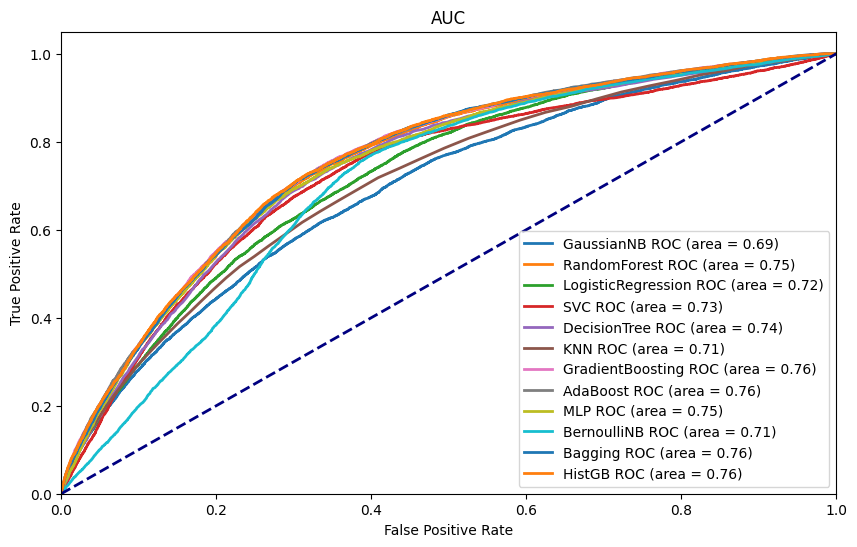

In [117]:
# models = [
#     ('GaussianNB', GaussianNB()),
#     ('RandomForest', RandomForestClassifier(max_features='sqrt',n_estimators=590,max_depth=15,min_samples_leaf=7,ccp_alpha=0,criterion='gini',min_samples_split=38,random_state=19)),
#     ('LogisticRegression', LogisticRegression(random_state=19,class_weight='balanced',C=10,penalty='none',solver='saga')),
#     ('SVC', SVC(random_state=19,C=1.2,gamma='auto',kernel='rbf',probability=True)),
#     ('DecisionTree', DecisionTreeClassifier(criterion='gini',max_depth=8,min_samples_leaf=24,min_samples_split=93,splitter='best',random_state=19)),
#     ('KNN', KNeighborsClassifier(algorithm='brute', n_neighbors=97, weights='uniform')),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=7,min_samples_leaf=35,min_samples_split=60,n_estimators=475,subsample=0.6,random_state=19,learning_rate=0.1)),
#     ('AdaBoost', AdaBoostClassifier(algorithm='SAMME.R',learning_rate=0.2,n_estimators=50,estimator=DecisionTreeClassifier(max_depth=3,random_state=19),random_state=19)),
#     ('MLP', MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(28,28,28),learning_rate='constant',learning_rate_init=0.01,max_iter=200,solver='sgd')),
#     ('BernoulliNB', BernoulliNB(fit_prior=False,alpha=0.3)),
#     ('Bagging', BaggingClassifier(bootstrap=False,n_estimators=30,max_samples=0.6,max_features=0.7,estimator=DecisionTreeClassifier(max_depth=8,random_state=19),random_state=19)),
#     ('HistGB', HistGradientBoostingClassifier(max_depth=5,min_samples_leaf=68,max_leaf_nodes=18,learning_rate=0.1,l2_regularization=0.0001,max_iter=200,random_state=19))
# ]

# plt.figure(figsize=(10, 6))

# for name, model in models:
#     if name == 'LogisticRegression':
#         pipeline = Pipeline([('model', model)])
#     else:
#         pipeline = ImbPipeline([
#             ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#             ('model', model)
#         ])

#     y_probas = cross_val_predict(pipeline, X_scaled, y_binary, cv=5, method='predict_proba')
#     fpr, tpr, thresholds = roc_curve(y_binary, y_probas[:, 1])
#     roc_auc = auc(fpr, tpr)

#     plt.plot(fpr, tpr, lw=2, label='%s ROC (area = %0.2f)' % (name, roc_auc))

# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('AUC')
# plt.legend(loc="lower right")
# plt.show()

### Stacking & Voting 

In [86]:
# combined_models = [
#     ('LogisticRegression', LogisticRegression(random_state=19, class_weight='balanced', C=10, penalty='none', solver='saga')),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1)),
#     ('BernoulliNB', BernoulliNB(fit_prior=False, alpha=0.3))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, scoring='f1', n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.322


In [85]:
# combined_models = [
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1)),
#     ('BernoulliNB', BernoulliNB(fit_prior=False, alpha=0.3))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, scoring='f1', n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.324


In [84]:
# combined_models = [
#     ('LogisticRegression', LogisticRegression(random_state=19, class_weight='balanced', C=10, penalty='none', solver='saga')),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, scoring='f1', n_jobs=-1)
# score = np.mean(scores)
# print('F1 Score: %.3f' % score)

F1 Score: 0.344


In [21]:
# combined_models = [
#     ('MLP', MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(28,28,28),learning_rate='constant',learning_rate_init=0.01,max_iter=200,solver='sgd')),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, scoring='f1', n_jobs=-1)
# print("Mean cross-validation F1 score: ", scores.mean())
# print("Mean cross-validation F1 score: ", scores.std())

Mean cross-validation F1 score:  0.3511017042433116
Mean cross-validation F1 score:  0.005063819555457525


In [83]:
# combined_models = [
#     ('SVC', SVC(random_state=19,C=1.2,gamma='auto',kernel='rbf',probability=True)),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, scoring='f1', n_jobs=-1)
# print("Mean cross-validation F1 score: ", scores.mean())
# print("Mean cross-validation F1 score: ", scores.std())

F1 Score: 0.347


In [81]:
# combined_models = [
#     ('RandomForest', RandomForestClassifier(max_features='sqrt',n_estimators=590,max_depth=15,min_samples_leaf=7,ccp_alpha=0,criterion='gini',min_samples_split=38,random_state=19)),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     pipeline = ImbPipeline([
#         ('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)),
#         ('model', model)
#     ])
#     undersampled_models.append((name, pipeline))

# voting_clf = VotingClassifier(estimators=undersampled_models, voting='soft')

# scores = cross_val_score(voting_clf, X_scaled, y_binary, cv=5, scoring='f1', n_jobs=-1)
# print("Mean cross-validation F1 score: ", scores.mean())
# print("Mean cross-validation F1 score: ", scores.std())

F1 Score: 0.350


In [20]:
# combined_models = [
#     ('RandomForest', RandomForestClassifier(max_features='sqrt',n_estimators=590,max_depth=15,min_samples_leaf=7,ccp_alpha=0,criterion='gini',min_samples_split=38,random_state=19)),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     undersampler = RandomUnderSampler(sampling_strategy=0.7, random_state=19)
#     X_res, y_res = undersampler.fit_resample(X_scaled, y_binary)
#     model_clone = clone(model)
#     model_clone.fit(X_res, y_res)
#     undersampled_models.append((name, model_clone))

# final_estimator = LogisticRegression(random_state=19, class_weight='balanced', C=10, penalty='none', solver='saga')

# stacking_clf = StackingClassifier(estimators=undersampled_models, final_estimator=final_estimator)

# scores = cross_val_score(stacking_clf, X_scaled, y_binary, cv=5, scoring='f1')

# print("Cross-validation F1 scores: ", scores)
# print("Mean cross-validation F1 score: ", scores.mean())
# print("Mean cross-validation F1 score: ", scores.std())

Cross-validation F1 scores:  [0.35018338 0.34281976 0.34487159 0.35256204 0.34645919]
Mean cross-validation F1 score:  0.34737919245232035
Mean cross-validation F1 score:  0.0035397252382941783


In [79]:
# combined_models = [
#     ('MLP', MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(28,28,28),learning_rate='constant',learning_rate_init=0.01,max_iter=200,solver='sgd')),
#     ('GradientBoosting', GradientBoostingClassifier(ccp_alpha=0.0001, max_depth=7, min_samples_leaf=35, min_samples_split=60, n_estimators=475, subsample=0.6, random_state=19, learning_rate=0.1))
# ]

# undersampled_models = []

# for name, model in combined_models:
#     undersampler = RandomUnderSampler(sampling_strategy=0.7, random_state=19)
#     X_res, y_res = undersampler.fit_resample(X_scaled, y_binary)
#     model_clone = clone(model)
#     model_clone.fit(X_res, y_res)
#     undersampled_models.append((name, model_clone))

# final_estimator = LogisticRegression(random_state=19, class_weight='balanced', C=10, penalty='none', solver='saga')

# stacking_clf = StackingClassifier(estimators=undersampled_models, final_estimator=final_estimator)

# scores = cross_val_score(stacking_clf, X_scaled, y_binary, cv=5, scoring='f1')

# print("Cross-validation F1 scores: ", scores)
# print("Mean cross-validation F1 score: ", scores.mean())

Cross-validation F1 scores:  [0.34668376 0.34170522 0.34444981 0.35111989 0.3438217 ]
Mean cross-validation F1 score:  0.3455560767497074


# This the code for the Training score of Final Solution

In [65]:
pipeline = ImbPipeline([('Under', RandomUnderSampler(sampling_strategy=0.7, random_state=19)), 
                        ('model', GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=7,min_samples_leaf=35,min_samples_split=60,n_estimators=475,subsample=0.6,random_state=19,learning_rate=0.1))
])
scores = cross_val_score(pipeline, X_scaled, y_binary, cv=10, scoring='f1')
print("Mean cross-validation F1 score: ", scores.mean())
print("Mean cross-validation F1 score: ", scores.std())

Mean cross-validation F1 score:  0.35601004813430104
Mean cross-validation F1 score:  0.01093941571769177


# Kaggle Submissions

In [68]:
enc_merge = pd.DataFrame(test_binary_copy['encounter_id'])

#### Gaussian NB

In [394]:
# gaussian_1 = GaussianNB()
# gaussian_1.fit(X_train_res, y_train_res)
# y_pred = gaussian_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9380, 1977],
       [4777, 3173]], dtype=int64)

In [395]:
# gauss_guess_1 = gaussian_1.predict(test_scaled)
# gauss_df_1 = pd.DataFrame(gauss_guess_1)
# print(gauss_df_1.value_counts())
# gauss_df_1 = pd.concat([enc_merge, gauss_df_1], axis=1)
# gauss_df_1.columns = ['encounter_id', 'readmitted_binary']
# gauss_series_1 = gauss_df_1.set_index('encounter_id')['readmitted_binary']
# gauss_series_1

0    23336
1     7194
Name: count, dtype: int64


encounter_id
499502    0
447319    1
309126    0
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [397]:
# gauss_series_1 = gauss_series_1.map({0: 'No', 1: 'Yes'})
# gauss_series_1

encounter_id
499502     No
447319    Yes
309126     No
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [398]:
# gauss_series_1.to_csv('Kaggle_Submissions/Group18_Version84.csv')

#### Bernoulli NB

In [396]:
# bnb = BernoulliNB(fit_prior=False,alpha=0.3)
# bnb.fit(X_train_res, y_train_res)
# y_pred = bnb.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7335, 4022],
       [2278, 5672]], dtype=int64)

In [391]:
# bnb_guess_1 = bnb.predict(test_scaled)
# bnb_df_1 = pd.DataFrame(bnb_guess_1)
# print(bnb_df_1.value_counts())
# bnb_df_1 = pd.concat([enc_merge, bnb_df_1], axis=1)
# bnb_df_1.columns = ['encounter_id', 'readmitted_binary']
# bnb_series_1 = bnb_df_1.set_index('encounter_id')['readmitted_binary']
# bnb_series_1

0    16556
1    13974
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [392]:
# bnb_series_1 = bnb_series_1.map({0: 'No', 1: 'Yes'})
# bnb_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [393]:
# bnb_series_1.to_csv('Kaggle_Submissions/Group18_Version83.csv')

#### KNN

In [401]:
# ### kaggle = 31.7 & 24098 and 6432
# knn = KNeighborsClassifier(algorithm='ball_tree', n_neighbors=105, weights='uniform')
# knn.fit(X_train_res, y_train_res)
# y_pred = knn.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9807, 1550],
       [4951, 2999]], dtype=int64)

In [405]:
# ### kaggle = 32.16 & 24111 and 6419
# knn = KNeighborsClassifier(algorithm='brute', n_neighbors=97, weights='uniform')
# knn.fit(X_train_res, y_train_res)
# y_pred = knn.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9821, 1536],
       [4921, 3029]], dtype=int64)

In [25]:
# ### kaggle = 31.77 & 24185 and 6345
# knn = KNeighborsClassifier(algorithm='auto', n_neighbors=111, weights='uniform')
# knn.fit(X_train_res, y_train_res)
# y_pred = knn.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9836, 1521],
       [4951, 2999]], dtype=int64)

In [32]:
# ### kaggle =  &  and 
# knn = KNeighborsClassifier(algorithm='kd_tree', n_neighbors=111, weights='uniform')
# knn.fit(X_train_res, y_train_res)
# y_pred = knn.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9836, 1521],
       [4951, 2999]], dtype=int64)

In [34]:
# ### kaggle = 31.66 & 24050 and 6480
# knn = KNeighborsClassifier(algorithm='auto', n_neighbors=91, weights='uniform')
# knn.fit(X_train_res, y_train_res)
# y_pred = knn.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[9823, 1534],
       [4900, 3050]], dtype=int64)

In [35]:
# knn_guess_1 = knn.predict(test_scaled)
# knn_df_1 = pd.DataFrame(knn_guess_1)
# print(knn_df_1.value_counts())
# knn_df_1 = pd.concat([enc_merge, knn_df_1], axis=1)
# knn_df_1.columns = ['encounter_id', 'readmitted_binary']
# knn_series_1 = knn_df_1.set_index('encounter_id')['readmitted_binary']
# knn_series_1

0    24050
1     6480
Name: count, dtype: int64


encounter_id
499502    0
447319    0
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [36]:
# knn_series_1 = knn_series_1.map({0: 'No', 1: 'Yes'})
# knn_series_1

encounter_id
499502     No
447319     No
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [37]:
# knn_series_1.to_csv('Kaggle_Submissions/Group18_Version103.csv')

#### Decision Trees

In [409]:
# # kaggle = 35.87
# dt = DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_leaf=18,min_samples_split=187,splitter='random',random_state=19)
# dt.fit(X_train_res, y_train_res)
# y_pred = dt.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8517, 2840],
       [2863, 5087]], dtype=int64)

In [419]:
# # kaggle = 36.25
# dt = DecisionTreeClassifier(criterion='gini',max_depth=8,min_samples_leaf=24,min_samples_split=93,splitter='best',random_state=19)
# dt.fit(X_train_res, y_train_res)
# y_pred = dt.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8659, 2698],
       [2885, 5065]], dtype=int64)

In [38]:
# # kaggle = 36.23
# dt = DecisionTreeClassifier(criterion='gini',max_depth=8,min_samples_leaf=20,min_samples_split=71,splitter='best',random_state=19)
# dt.fit(X_train_res, y_train_res)
# y_pred = dt.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8720, 2637],
       [2939, 5011]], dtype=int64)

In [39]:
# dt_guess_1 = dt.predict(test_scaled)
# dt_df_1 = pd.DataFrame(dt_guess_1)
# print(dt_df_1.value_counts())
# dt_df_1 = pd.concat([enc_merge, dt_df_1], axis=1)
# dt_df_1.columns = ['encounter_id', 'readmitted_binary']
# dt_series_1 = dt_df_1.set_index('encounter_id')['readmitted_binary']
# dt_series_1

0    19756
1    10774
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [40]:
# dt_series_1 = dt_series_1.map({0: 'No', 1: 'Yes'})
# dt_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [41]:
# dt_series_1.to_csv('Kaggle_Submissions/Group18_Version104.csv')

## Random Forest

In [192]:
# # notebook = 34.44 & kaggle = 35.70 & 18353 e 12177 (classe 0 e 1 respetivamente)
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=430,max_depth=12,min_samples_leaf=7,class_weight='balanced',
#                               criterion='gini',min_samples_split=20,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[45507, 17779],
       [ 1948,  6002]], dtype=int64)

In [256]:
# # notebook = 34.46 & kaggle = 35.66 & 18062 e 12468
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=480,max_depth=13,min_samples_leaf=17,class_weight='balanced',
#                               criterion='gini',min_samples_split=47,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[44736, 18550],
       [ 1992,  5958]], dtype=int64)

In [260]:
# # notebook = 34.50 & kaggle = 35.92 & 18443 e 12087
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=200,max_depth=13,min_samples_leaf=8,class_weight='balanced',
#                               criterion='entropy',min_samples_split=31,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[45666, 17620],
       [ 1963,  5987]], dtype=int64)

In [264]:
# # notebook = 34.53 & kaggle = 35.84 & 18568 e 11962
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=330,max_depth=13,min_samples_leaf=9,class_weight='balanced',
#                               criterion='gini',min_samples_split=5,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46028, 17258],
       [ 1928,  6022]], dtype=int64)

In [204]:
# # notebook = 34.63 & kaggle = 35.67 & 18520 e 12010
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=400,max_depth=13,min_samples_leaf=8,
#                               class_weight='balanced_subsample',criterion='gini',min_samples_split=25,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[45907, 17379],
       [ 1929,  6021]], dtype=int64)

In [213]:
# # notebook = 34.64 & kaggle = 35.94 & 18968 e 11562
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=260,max_depth=13,min_samples_leaf=4,
#                               class_weight='balanced',criterion='gini',min_samples_split=18,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46960, 16326],
       [ 1900,  6050]], dtype=int64)

In [214]:
# # notebook = 34.65 & kaggle = 35.77 & 18747 e 11783
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=480,max_depth=13,min_samples_leaf=7,
#                               class_weight='balanced_subsample',criterion='gini',min_samples_split=11,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46412, 16874],
       [ 1903,  6047]], dtype=int64)

In [218]:
# # notebook = 34.67 & kaggle = 35.75 & 18584 e 11946
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=480,max_depth=13,min_samples_leaf=7,
#                               class_weight='balanced',criterion='gini',min_samples_split=25,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46093, 17193],
       [ 1932,  6018]], dtype=int64)

In [222]:
# # notebook = 34.71 & kaggle = 35.78 & 18886 e 11644
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=320,max_depth=13,min_samples_leaf=5,
#                               class_weight='balanced_subsample',criterion='gini',min_samples_split=17,random_state=19)
# rf_1.fit(X_scaled, y_binary)
# y_pred = rf_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46752, 16534],
       [ 1902,  6048]], dtype=int64)

In [45]:
# # notebook = 35.14 & kaggle = 36.26 & 19533 e 10997
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=590,max_depth=15,min_samples_leaf=7,
#                               ccp_alpha=0,criterion='gini',min_samples_split=38,random_state=19)
# rf_1.fit(X_train_res, y_train_res)
# y_pred = rf_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8898, 2459],
       [2624, 5326]], dtype=int64)

In [47]:
# # notebook = 35.12 & kaggle = 36.28 & 19533 e 10997
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=560,max_depth=19,min_samples_leaf=6,
#                               ccp_alpha=0,criterion='entropy',min_samples_split=47,random_state=19)
# rf_1.fit(X_train_res, y_train_res)
# y_pred = rf_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8901, 2456],
       [2630, 5320]], dtype=int64)

In [51]:
# # notebook = 35.11 & kaggle = 36.4 & 19551 e 10979
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=650,max_depth=17,min_samples_leaf=8,
#                               ccp_alpha=0,criterion='gini',min_samples_split=36,random_state=19)
# rf_1.fit(X_train_res, y_train_res)
# y_pred = rf_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8921, 2436],
       [2604, 5346]], dtype=int64)

In [55]:
# # notebook = 35.11 & kaggle = 36.36 & 19492 e 11038
# rf_1 = RandomForestClassifier(max_features='log2',n_estimators=340,max_depth=16,min_samples_leaf=6,
#                               ccp_alpha=0,criterion='gini',min_samples_split=59,random_state=19)
# rf_1.fit(X_train_res, y_train_res)
# y_pred = rf_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8818, 2539],
       [2674, 5276]], dtype=int64)

In [59]:
# # notebook = 35.11 & kaggle = 36.39 & 19508 e 11022
# rf_1 = RandomForestClassifier(max_features='sqrt',n_estimators=390,max_depth=18,min_samples_leaf=8,
#                               ccp_alpha=0.0001,criterion='gini',min_samples_split=24,random_state=19)
# rf_1.fit(X_train_res, y_train_res)
# y_pred = rf_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8863, 2494],
       [2632, 5318]], dtype=int64)

In [60]:
# rf_guess_1 = rf_1.predict(test_scaled)
# rf_df_1 = pd.DataFrame(rf_guess_1)
# print(rf_df_1.value_counts())
# rf_df_1 = pd.concat([enc_merge, rf_df_1], axis=1)
# rf_df_1.columns = ['encounter_id', 'readmitted_binary']
# rf_series_1 = rf_df_1.set_index('encounter_id')['readmitted_binary']
# rf_series_1

0    19508
1    11022
Name: count, dtype: int64


encounter_id
499502    0
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [61]:
# rf_series_1 = rf_series_1.map({0: 'No', 1: 'Yes'})
# rf_series_1

encounter_id
499502     No
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [62]:
# rf_series_1.to_csv('Kaggle_Submissions/Group18_Version108.csv')

### Hist Gradient Boosting

In [540]:
# # kaggle = 31.62
# hgbc_1 = HistGradientBoostingClassifier(max_depth=4,min_samples_leaf=50,max_leaf_nodes=30,learning_rate=0.05,l2_regularization=0.111111,max_iter=600,class_weight='balanced',random_state=19)
# hgbc_1.fit(X_scaled, y_binary)
# y_pred = hgbc_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[42913, 20373],
       [ 2005,  5945]], dtype=int64)

In [35]:
# # kaggle = 
# hgbc_1 = HistGradientBoostingClassifier(max_depth=4,min_samples_leaf=90,max_leaf_nodes=60,learning_rate=0.01,l2_regularization=0.555556,max_iter=900,class_weight='balanced',random_state=19)
# hgbc_1.fit(X_scaled, y_binary)
# y_pred = hgbc_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[43189, 20097],
       [ 2076,  5874]], dtype=int64)

In [459]:
# # notebook = 35.49 & kaggle = 36.19 & 19360 and 11170
# hgbc_1 = HistGradientBoostingClassifier(max_depth=4,min_samples_leaf=15,max_leaf_nodes=48,learning_rate=0.1,l2_regularization=0.001,max_iter=200,random_state=19)
# hgbc_1.fit(X_train_res, y_train_res)
# y_pred = hgbc_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8570, 2787],
       [2715, 5235]], dtype=int64)

In [63]:
# # notebook = 35.47 & kaggle = 36.55 & 19509 and 11021
# hgbc_1 = HistGradientBoostingClassifier(max_depth=5,min_samples_leaf=68,max_leaf_nodes=18,learning_rate=0.1,l2_regularization=0.0001,max_iter=200,random_state=19)
# hgbc_1.fit(X_train_res, y_train_res)
# y_pred = hgbc_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8597, 2760],
       [2737, 5213]], dtype=int64)

In [67]:
# # notebook = 35.46 & kaggle = 36.19 & 19360 and 11170
# hgbc_1 = HistGradientBoostingClassifier(max_depth=4,min_samples_leaf=15,max_leaf_nodes=47,learning_rate=0.1,l2_regularization=0,max_iter=200,random_state=19)
# hgbc_1.fit(X_train_res, y_train_res)
# y_pred = hgbc_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8570, 2787],
       [2715, 5235]], dtype=int64)

In [68]:
# hgbc_guess_1 = hgbc_1.predict(test_scaled)
# hgbc_df_1 = pd.DataFrame(hgbc_guess_1)
# print(hgbc_df_1.value_counts())
# hgbc_df_1 = pd.concat([enc_merge, hgbc_df_1], axis=1)
# hgbc_df_1.columns = ['encounter_id', 'readmitted_binary']
# hgbc_series_1 = hgbc_df_1.set_index('encounter_id')['readmitted_binary']
# hgbc_series_1

0    19360
1    11170
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [69]:
# hgbc_series_1 = hgbc_series_1.map({0: 'No', 1: 'Yes'})
# hgbc_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [70]:
# hgbc_series_1.to_csv('Kaggle_Submissions/Group18_Version110.csv')

## Gradient Boosting

In [179]:
# # notebook = 34.97 & kaggle = 36.88 & 20512 e 10018
# gb_1 = GradientBoostingClassifier(max_depth=9,min_samples_leaf=73,min_samples_split=21,n_estimators=41,subsample=0.6,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7367, 1985],
       [3241, 4709]], dtype=int64)

In [188]:
# # notebook = 34.99 & kaggle = 37.14 & 19991 e 10539
# gb_1 = GradientBoostingClassifier(max_depth=9,min_samples_leaf=95,min_samples_split=110,n_estimators=50,subsample=0.6,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7207, 2145],
       [3075, 4875]], dtype=int64)

In [192]:
# # notebook = 35.00 & kaggle = 37.04 & 20019 e 10511
# gb_1 = GradientBoostingClassifier(max_depth=8,min_samples_leaf=93,min_samples_split=48,n_estimators=49,subsample=0.6,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7216, 2136],
       [3088, 4862]], dtype=int64)

In [196]:
# # notebook = 35.02 & kaggle = 36.46 & 19676 e 10854
# gb_1 = GradientBoostingClassifier(max_depth=8,min_samples_leaf=31,min_samples_split=32,n_estimators=53,subsample=0.7,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7206, 2146],
       [2851, 5099]], dtype=int64)

In [200]:
# # notebook = 35.04 & kaggle = 36.67 & 19729 e 10801
# gb_1 = GradientBoostingClassifier(max_depth=9,min_samples_leaf=12,min_samples_split=41,n_estimators=56,subsample=0.5,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[7306, 2046],
       [2768, 5182]], dtype=int64)

In [485]:
# # notebook = 35.59 & kaggle = 36.3 & 19466 e 11064
# gb_1 = GradientBoostingClassifier(ccp_alpha=0,max_depth=5,min_samples_leaf=65,min_samples_split=75,n_estimators=610,subsample=0.5,random_state=19,learning_rate=0.01)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8612, 2745],
       [2727, 5223]], dtype=int64)

In [481]:
# # notebook = 35.59 & kaggle = 36.23 & 19546 e 10984
# gb_1 = GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=10,min_samples_leaf=63,min_samples_split=95,n_estimators=600,subsample=0.6,random_state=19,learning_rate=0.1)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8654, 2703],
       [2744, 5206]], dtype=int64)

In [75]:
# # notebook = 35.55 & kaggle = 36.18 & 19470 e 11060
# gb_1 = GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=5,min_samples_leaf=43,min_samples_split=45,n_estimators=715,subsample=0.7,random_state=19,learning_rate=0.1)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8579, 2778],
       [2770, 5180]], dtype=int64)

In [80]:
# # notebook = 35.55 & kaggle =  &  e 
# gb_1 = GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=7,min_samples_leaf=28,min_samples_split=100,n_estimators=640,subsample=0.6,random_state=19,learning_rate=0.1)
# gb_1.fit(X_train_res, y_train_res)
# y_pred = gb_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8688, 2669],
       [2742, 5208]], dtype=int64)

# This is the code for the Kaggle final solution 

In [69]:
# notebook = 35.6 & kaggle = 36.53 & 19505 e 11025
gb_1 = GradientBoostingClassifier(ccp_alpha=0.0001,max_depth=7,min_samples_leaf=35,min_samples_split=60,n_estimators=475,subsample=0.6,random_state=19,learning_rate=0.1)
gb_1.fit(X_train_res, y_train_res)
y_pred = gb_1.predict(X_train_res)
cm = confusion_matrix(y_train_res, y_pred)
cm

array([[8652, 2705],
       [2731, 5219]], dtype=int64)

In [70]:
gb_guess_1 = gb_1.predict(test_scaled)
gb_df_1 = pd.DataFrame(gb_guess_1)
print(gb_df_1.value_counts())
gb_df_1 = pd.concat([enc_merge, gb_df_1], axis=1)
gb_df_1.columns = ['encounter_id', 'readmitted_binary']
gb_series_1 = gb_df_1.set_index('encounter_id')['readmitted_binary']
gb_series_1

0    19505
1    11025
Name: count, dtype: int64


encounter_id
499502    0
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [71]:
gb_series_1 = gb_series_1.map({0: 'No', 1: 'Yes'})
gb_series_1

encounter_id
499502     No
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [72]:
gb_series_1.to_csv('Kaggle_Submissions/Group18_Version123.csv')

#### AdaBoost Classifier

In [455]:
# # notebook = 35.28 & Kaggle = 35.88 & 19245 and 11285
# ada_1 = AdaBoostClassifier(algorithm='SAMME.R',learning_rate=0.2,n_estimators=50,estimator=DecisionTreeClassifier(max_depth=3,random_state=19),random_state=19)
# ada_1.fit(X_train_res, y_train_res)
# y_pred = ada_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8480, 2877],
       [2747, 5203]], dtype=int64)

In [84]:
# # notebook = 35.27 & Kaggle = 36.55 & 19254 and 11276
# ada_1 = AdaBoostClassifier(algorithm='SAMME.R',learning_rate=0.01,n_estimators=590,estimator=DecisionTreeClassifier(max_depth=4,random_state=19),random_state=19)
# ada_1.fit(X_train_res, y_train_res)
# y_pred = ada_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8547, 2810],
       [2690, 5260]], dtype=int64)

In [88]:
# # notebook = 35.26 & Kaggle = 36.26 & 19536 and 10994
# ada_1 = AdaBoostClassifier(algorithm='SAMME.R',learning_rate=0.2,n_estimators=100,estimator=DecisionTreeClassifier(max_depth=3,random_state=19),random_state=19)
# ada_1.fit(X_train_res, y_train_res)
# y_pred = ada_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8604, 2753],
       [2747, 5203]], dtype=int64)

In [92]:
# # notebook = 35.26 & Kaggle =  & 19446 and 11084
# ada_1 = AdaBoostClassifier(algorithm='SAMME',learning_rate=0.1,n_estimators=360,estimator=DecisionTreeClassifier(max_depth=4,random_state=19),random_state=19)
# ada_1.fit(X_train_res, y_train_res)
# y_pred = ada_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8534, 2823],
       [2827, 5123]], dtype=int64)

In [93]:
# ada_guess_1 = ada_1.predict(test_scaled)
# ada_df_1 = pd.DataFrame(ada_guess_1)
# print(ada_df_1.value_counts())
# ada_df_1 = pd.concat([enc_merge, ada_df_1], axis=1)
# ada_df_1.columns = ['encounter_id', 'readmitted_binary']
# ada_series_1 = ada_df_1.set_index('encounter_id')['readmitted_binary']
# ada_series_1

0    19446
1    11084
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [94]:
# ada_series_1 = ada_series_1.map({0: 'No', 1: 'Yes'})
# ada_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [95]:
# ada_series_1.to_csv('Kaggle_Submissions/Group18_Version116.csv')

#### Bagging Classifier

In [447]:
# # notebook = 35.08 & Kaggle = 36.46 & 19886 and 10664
# bag_1 = BaggingClassifier(bootstrap=False,n_estimators=30,max_samples=0.6,max_features=0.7,estimator=DecisionTreeClassifier(max_depth=8,random_state=19),random_state=19)
# bag_1.fit(X_train_res, y_train_res)
# y_pred = bag_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8861, 2496],
       [2825, 5125]], dtype=int64)

In [96]:
# # notebook = 35.08 & Kaggle = & 19553 and 10977
# bag_1 = BaggingClassifier(bootstrap=False,n_estimators=320,max_samples=0.3,max_features=0.9,estimator=DecisionTreeClassifier(max_depth=6,random_state=19),random_state=19)
# bag_1.fit(X_train_res, y_train_res)
# y_pred = bag_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8639, 2718],
       [2933, 5017]], dtype=int64)

In [97]:
# bag_guess_1 = bag_1.predict(test_scaled)
# bag_df_1 = pd.DataFrame(bag_guess_1)
# print(bag_df_1.value_counts())
# bag_df_1 = pd.concat([enc_merge, bag_df_1], axis=1)
# bag_df_1.columns = ['encounter_id', 'readmitted_binary']
# bag_series_1 = bag_df_1.set_index('encounter_id')['readmitted_binary']
# bag_series_1

0    19553
1    10977
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [98]:
# bag_series_1 = bag_series_1.map({0: 'No', 1: 'Yes'})
# bag_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [99]:
# bag_series_1.to_csv('Kaggle_Submissions/Group18_Version117.csv')

### Logistic Regression

In [427]:
# lr_1 = LogisticRegression(random_state=19,class_weight='balanced',C=10,penalty='none',solver='saga')
# lr_1.fit(X_scaled, y_binary)
# y_pred = lr_1.predict(X_scaled)
# cm = confusion_matrix(y_binary, y_pred)
# cm

array([[46769, 16517],
       [ 3306,  4644]], dtype=int64)

In [432]:
# lr_guess_1 = lr_1.predict(test_scaled)
# lr_df_1 = pd.DataFrame(lr_guess_1)
# print(lr_df_1.value_counts())
# lr_df_1 = pd.concat([enc_merge, lr_df_1], axis=1)
# lr_df_1.columns = ['encounter_id', 'readmitted_binary']
# lr_series_1 = lr_df_1.set_index('encounter_id')['readmitted_binary']
# lr_series_1

0    19654
1    10876
Name: count, dtype: int64


encounter_id
499502    0
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [433]:
# lr_series_1 = lr_series_1.map({0: 'No', 1: 'Yes'})
# lr_series_1

encounter_id
499502     No
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [434]:
# lr_series_1.to_csv('Kaggle_Submissions/Group18_Version90.csv')

### MLP Classifier

In [439]:
# # notebook = 34.79 & kaggle = 36.7 & 20380 and 10150
# mlp_1 = MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(28,28,28),learning_rate='constant',learning_rate_init=0.01,max_iter=200,solver='sgd')
# mlp_1.fit(X_train_res, y_train_res)
# y_pred = mlp_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8751, 2606],
       [3224, 4726]], dtype=int64)

In [104]:
# # notebook = 34.79 & kaggle = 36.69 & 19616 and 10914
# mlp_1 = MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(21,21,21),learning_rate='adaptive',learning_rate_init=0.01,max_iter=200,solver='sgd')
# mlp_1.fit(X_train_res, y_train_res)
# y_pred = mlp_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8600, 2757],
       [2991, 4959]], dtype=int64)

In [108]:
# # notebook = 34.79 & kaggle = 36.75 & 19652 and 10878
# mlp_1 = MLPClassifier(activation='tanh',alpha=0.1,batch_size=64,hidden_layer_sizes=(35,35,35),learning_rate='adaptive',learning_rate_init=0.01,max_iter=200,solver='sgd')
# mlp_1.fit(X_train_res, y_train_res)
# y_pred = mlp_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8587, 2770],
       [2990, 4960]], dtype=int64)

In [112]:
# # notebook = 34.79 & kaggle =  & 19399 and 11131
# mlp_1 = MLPClassifier(activation='relu',alpha=0.1,batch_size=64,hidden_layer_sizes=(35,35),learning_rate='constant',learning_rate_init=0.001,max_iter=200,solver='sgd')
# mlp_1.fit(X_train_res, y_train_res)
# y_pred = mlp_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8515, 2842],
       [2876, 5074]], dtype=int64)

In [113]:
# mlp_guess_1 = mlp_1.predict(test_scaled)
# mlp_df_1 = pd.DataFrame(mlp_guess_1)
# print(mlp_df_1.value_counts())
# mlp_df_1 = pd.concat([enc_merge, mlp_df_1], axis=1)
# mlp_df_1.columns = ['encounter_id', 'readmitted_binary']
# mlp_series_1 = mlp_df_1.set_index('encounter_id')['readmitted_binary']
# mlp_series_1

0    19399
1    11131
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [114]:
# mlp_series_1 = mlp_series_1.map({0: 'No', 1: 'Yes'})
# mlp_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [115]:
# mlp_series_1.to_csv('Kaggle_Submissions/Group18_Version121.csv')

### Support Vector Machines

In [435]:
# # kaggle = & 19141 & 11389
# svc_1 = SVC(random_state=19,C=1.2,gamma='auto',kernel='rbf')
# svc_1.fit(X_train_res, y_train_res)
# y_pred = svc_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8530, 2827],
       [2786, 5164]], dtype=int64)

In [100]:
# svc_1 = SVC(random_state=19,C=1.1,gamma='auto',kernel='rbf')
# svc_1.fit(X_train_res, y_train_res)
# y_pred = svc_1.predict(X_train_res)
# cm = confusion_matrix(y_train_res, y_pred)
# cm

array([[8514, 2843],
       [2777, 5173]], dtype=int64)

In [101]:
# svc_guess_1 = svc_1.predict(test_scaled)
# svc_df_1 = pd.DataFrame(svc_guess_1)
# print(svc_df_1.value_counts())
# svc_df_1 = pd.concat([enc_merge, svc_df_1], axis=1)
# svc_df_1.columns = ['encounter_id', 'readmitted_binary']
# svc_series_1 = svc_df_1.set_index('encounter_id')['readmitted_binary']
# svc_series_1

0    19109
1    11421
Name: count, dtype: int64


encounter_id
499502    1
447319    1
309126    1
181183    0
359339    0
         ..
451150    0
549298    1
327586    0
351214    0
914270    0
Name: readmitted_binary, Length: 30530, dtype: int64

In [102]:
# svc_series_1 = svc_series_1.map({0: 'No', 1: 'Yes'})
# svc_series_1

encounter_id
499502    Yes
447319    Yes
309126    Yes
181183     No
359339     No
         ... 
451150     No
549298    Yes
327586     No
351214     No
914270     No
Name: readmitted_binary, Length: 30530, dtype: object

In [103]:
# svc_series_1.to_csv('Kaggle_Submissions/Group18_Version118.csv')